# The Homes Dataset: PART 1

A supervised machine-learning regression problem, regarding the home sale prices in the city of Ames, IA.

## 1. Preamble
Loading Modules, Global Settings, and Memory Handling

### Basic

In [1]:
import numpy as np
import inspect
import os
import sys
import time

from math import pi
from operator import itemgetter

import multiprocessing as mp

import warnings

# from scipy import stats
# from scipy.interpolate import interp1d
# from scipy.optimize import curve_fit, brentq
# from scipy.integrate import quad, simps

### Data Handling and Cleaning

In [2]:
import pandas as pd

from sklearn import set_config

# import datetime as dt
# import charset_normalizer
# import fuzzywuzzy as fwz

Ensuring all Pipelines output `pandas.DataFrame`, globally!

In [3]:
set_config(transform_output="pandas") # globally!

pd.set_option('display.max_columns', None) # displaying all columns!

### Data Visualization and Analysis

In [4]:
import matplotlib.pyplot as plt
import seaborn as sns

from IPython.display import display

In [5]:
# very pretty plots!
plt.style.use('fivethirtyeight')

# Override aggressive elements
plt.rcParams['font.size'] = 10
plt.rcParams['lines.linewidth'] = 1.5
plt.rcParams['axes.facecolor'] = 'white'
plt.rcParams['figure.facecolor'] = 'white'

# ignore this
# sns.set(style="whitegrid")#, context="talk", palette="muted")

In [6]:
# %matplotlib inline

Defining the colors and the palette:

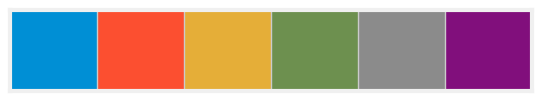

In [7]:
colors_538 = plt.rcParams['axes.prop_cycle'].by_key()['color']
palette_538 = sns.color_palette()

sns.palplot(palette_538)

Putting the the `matplotlib` verbosity at the `warning` level or above (_i.e._, `error` and `critical`):

In [8]:
plt.set_loglevel('WARNING')

### Memory Handling

The "safe" number of CPUs we can use:

In [9]:
# number of cores in laptop, minus 2 (so we free one *physical* core)
reserve_cpus = 4
safe_cpus = mp.cpu_count() - reserve_cpus
print(safe_cpus)

18


Functions that find memory size of an object, and all references to it:

In [10]:
def get_object_size(obj):
    """
    Compute size of object (in bytes).
    """
    if isinstance(obj, pd.DataFrame) or isinstance(obj, pd.Series):
        try:
            return obj.memory_usage(deep=True).sum()
        except:
            return sys.getsizeof(obj)
    return sys.getsizeof(obj)

def find_named_references(obj, namespace=None):
    """
    Find variables that refer to object in question.
    """
    if namespace is None:
        namespace = globals()
    return [name for name, val in namespace.items() if val is obj]

Examples of use:

In [11]:
# all_sizes = {}
# for name in dir():
#     all_sizes[name] = get_object_size(globals()[name])

# del name

In [12]:
# sorted(all_sizes, key=lambda k: all_sizes[k], reverse=True)

In [13]:
# sum(list(all_sizes.values()))/1024/1024

# del all_sizes

## 2. Loading data 

We will prepare the dataset. First, let us look at the data directory:

In [14]:
# defining path to data files
data_path = "../data/"

for filename in os.listdir(data_path):
    print(filename)

prediction_xgbr_eng.csv
prediction_lasso_clus.csv
prediction_svr_clus.csv
test.csv
train.csv
prediction_ridge_clus.csv
sample_submission.csv
data_description.txt


Printing data description:

In [15]:
data_description = ['Id: Identifies the record. Starts with 1.', '']

with open(data_path+'data_description.txt') as f:
    for line in f:

        new_line = line.strip()

        # correcting some names:
        if 'Bedroom: Bedrooms above grade' in new_line:
            new_line = new_line.replace('Bedroom: Bedrooms above grade', 'BedroomAbvGr: Bedrooms above grade')
        elif 'Kitchen: Kitchens above grade' in new_line:
            new_line = new_line.replace('Kitchen: Kitchens above grade', 'KitchenAbvGr: Kitchens above grade')
        
        print(new_line)
        
        data_description.append(new_line)

data_description += ['', 'SalePrice: Price at which the unit was sold.', '']

MSSubClass: Identifies the type of dwelling involved in the sale.

20	1-STORY 1946 & NEWER ALL STYLES
30	1-STORY 1945 & OLDER
40	1-STORY W/FINISHED ATTIC ALL AGES
45	1-1/2 STORY - UNFINISHED ALL AGES
50	1-1/2 STORY FINISHED ALL AGES
60	2-STORY 1946 & NEWER
70	2-STORY 1945 & OLDER
75	2-1/2 STORY ALL AGES
80	SPLIT OR MULTI-LEVEL
85	SPLIT FOYER
90	DUPLEX - ALL STYLES AND AGES
120	1-STORY PUD (Planned Unit Development) - 1946 & NEWER
150	1-1/2 STORY PUD - ALL AGES
160	2-STORY PUD - 1946 & NEWER
180	PUD - MULTILEVEL - INCL SPLIT LEV/FOYER
190	2 FAMILY CONVERSION - ALL STYLES AND AGES

MSZoning: Identifies the general zoning classification of the sale.

A	Agriculture
C	Commercial
FV	Floating Village Residential
I	Industrial
RH	Residential High Density
RL	Residential Low Density
RP	Residential Low Density Park
RM	Residential Medium Density

LotFrontage: Linear feet of street connected to property

LotArea: Lot size in square feet

Street: Type of road access to property

Grvl	Gravel
Pave	Pave

In [16]:
# loading the various datasets:

raw_train = pd.read_csv(data_path+'train.csv') # training dataset
raw_test = pd.read_csv(data_path+'test.csv') # test dataset
sample = pd.read_csv(data_path+'sample_submission.csv') # sample submission

In [17]:
raw_train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [18]:
raw_test.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,5,6,1961,1961,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,CBlock,TA,TA,No,Rec,468.0,LwQ,144.0,270.0,882.0,GasA,TA,Y,SBrkr,896,0,0,896,0.0,0.0,1,0,2,1,TA,5,Typ,0,NaN,Attchd,1961.0,Unf,1.0,730.0,TA,TA,Y,140,0,0,0,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,6,1958,1958,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,108.0,TA,TA,CBlock,TA,TA,No,ALQ,923.0,Unf,0.0,406.0,1329.0,GasA,TA,Y,SBrkr,1329,0,0,1329,0.0,0.0,1,1,3,1,Gd,6,Typ,0,NaN,Attchd,1958.0,Unf,1.0,312.0,TA,TA,Y,393,36,0,0,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,5,5,1997,1998,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,PConc,Gd,TA,No,GLQ,791.0,Unf,0.0,137.0,928.0,GasA,Gd,Y,SBrkr,928,701,0,1629,0.0,0.0,2,1,3,1,TA,6,Typ,1,TA,Attchd,1997.0,Fin,2.0,482.0,TA,TA,Y,212,34,0,0,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,6,1998,1998,Gable,CompShg,VinylSd,VinylSd,BrkFace,20.0,TA,TA,PConc,TA,TA,No,GLQ,602.0,Unf,0.0,324.0,926.0,GasA,Ex,Y,SBrkr,926,678,0,1604,0.0,0.0,2,1,3,1,Gd,7,Typ,1,Gd,Attchd,1998.0,Fin,2.0,470.0,TA,TA,Y,360,36,0,0,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1992,1992,Gable,CompShg,HdBoard,HdBoard,NaN,0.0,Gd,TA,PConc,Gd,TA,No,ALQ,263.0,Unf,0.0,1017.0,1280.0,GasA,Ex,Y,SBrkr,1280,0,0,1280,0.0,0.0,2,0,2,1,Gd,5,Typ,0,NaN,Attchd,1992.0,RFn,2.0,506.0,TA,TA,Y,0,82,0,0,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


In [19]:
sample.head()

,Id,SalePrice
0,1461,169277.052498
1,1462,187758.393989
2,1463,183583.683570
3,1464,179317.477511
4,1465,150730.079977


Describing it in more detail:

In [20]:
raw_train.describe(include='all')

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
count,1460.000000,1460.000000,1460,1201.000000,1460.000000,1460,91,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460.000000,1460.000000,1460.000000,1460.000000,1460,1460,1460,1460,588,1452.000000,1460,1460,1460,1423,1423,1422,1423,1460.000000,1422,1460.000000,1460.000000,1460.000000,1460,1460,1460,1459,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460,1460.000000,1460,1460.000000,770,1379,1379.000000,1379,1460.000000,1460.000000,1379,1379,1460,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,7,281,54,1460.000000,1460.000000,1460.000000,1460,1460,1460.000000
unique,NaN,NaN,5,NaN,NaN,2,2,4,4,2,5,3,25,9,8,5,8,NaN,NaN,NaN,NaN,6,8,15,16,3,NaN,4,5,6,4,4,4,6,NaN,6,NaN,NaN,NaN,6,5,2,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,NaN,7,NaN,5,6,NaN,3,NaN,NaN,5,5,3,NaN,NaN,NaN,NaN,NaN,NaN,3,4,4,NaN,NaN,NaN,9,6,NaN
top,NaN,NaN,RL,NaN,NaN,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,NaN,NaN,NaN,NaN,Gable,CompShg,VinylSd,VinylSd,BrkFace,NaN,TA,TA,PConc,TA,TA,No,Unf,NaN,Unf,NaN,NaN,NaN,GasA,Ex,Y,SBrkr,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,TA,NaN,Typ,NaN,Gd,Attchd,NaN,Unf,NaN,NaN,TA,TA,Y,NaN,NaN,NaN,NaN,NaN,NaN,Gd,MnPrv,Shed,NaN,NaN,NaN,WD,Normal,NaN
freq,NaN,NaN,1151,NaN,NaN,1454,50,925,1311,1459,1052,1382,225,1260,1445,1220,726,NaN,NaN,NaN,NaN,1141,1434,515,504,445,NaN,906,1282,647,649,1311,953,430,NaN,1256,NaN,NaN,NaN,1428,741,1365,1334,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,735,NaN,1360,NaN,380,870,NaN,605,NaN,NaN,1311,1326,1340,NaN,NaN,NaN,NaN,NaN,NaN,3,157,49,NaN,NaN,NaN,1267,1198,NaN
mean,730.500000,56.897260,NaN,70.049958,10516.828082,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.099315,5.575342,1971.267808,1984.865753,NaN,NaN,NaN,NaN,NaN,103.685262,NaN,NaN,NaN,NaN,NaN,NaN,NaN,443.639726,NaN,46.549315,567.240411,1057.429452,NaN,NaN,NaN,NaN,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,NaN,6.517808,NaN,0.613014,NaN,NaN,1978.506164,NaN,1.767123,472.980137,NaN,NaN,NaN,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,NaN,NaN,NaN,43.489041,6.321918,2007.815753,NaN,NaN,180921.195890
std,421.610009,42.300571,NaN,24.284752,9981.264932,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.382997,1.112799,30.202904,20.645407,NaN,NaN,NaN,NaN,NaN,181.066207,NaN,NaN,NaN,NaN,NaN,NaN,NaN,456.098091,NaN,161.319273,441.866955,438.705324,NaN,NaN,NaN,NaN,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,NaN,1.625393,NaN,0.644666,NaN,NaN,24.689725,NaN,0.747315,213.804841,NaN,NaN,NaN,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,NaN,NaN,NaN,496.123024,2.703626,1.328095,NaN,NaN,79442.502883
min,1.000000,20.000000,NaN,21.000000,1300.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,1.000000,1872.000000,1950.000000,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,2.000000,NaN,0.000000,NaN,NaN,1900.000000,N

#### Copy of raw data

Copying the data into new dataframes we can manipulate:

In [21]:
data_train = raw_train.copy()
data_test = raw_test.copy()

### Description Finder:

This function helps us find the description of a given column name `column_name`

In [22]:
def find_description(column_name, verbose=True, give_list=False):

    # finding the rows in the description that contain the column names
    rows_with_names = [rows_w_name for rows_w_name in data_description
                       if ((':' in rows_w_name) and ('\t' not in rows_w_name))]
    # we shall call those rows the "header" rows

    # a list of booleans, whether the column name is in the header
    is_column_in_row = [column_name in rows_w_name for rows_w_name in rows_with_names]

    # finding the True entries
    col_idx = np.where(is_column_in_row)[0]

    # finding the location of the one True entry:
    if len(col_idx) > 1: # there are several rows that match column_name
        for idx in col_idx:
            if (column_name == rows_with_names[idx].split(':')[0]):
                break
        col_idx = idx
    else:
        col_idx = col_idx[0]

    # the header with the column name in question
    header = rows_with_names[col_idx]
    # indices of the description corresponding to the column name in question
    descr_starts = data_description.index(header)

    # the next header
    try:
        next_header = rows_with_names[col_idx+1]
        # indices of the description corresponding to the next column name
        descr_ends = data_description.index(next_header)
    except IndexError:
        descr_ends = -1

    if verbose:
        # printing the description of the column name in question
        for line in data_description[descr_starts:descr_ends]:
            print(line)

    if give_list:
        return data_description[descr_starts:descr_ends]
    else:
        return

### Cleanup

In [23]:
Out.clear()

for name in dir():
    if name.startswith('_') and name[1:].isdigit():
        del globals()[name]

del name

## 3. Data Cleaning

### Importing Modules

In [24]:
from scipy.stats import chi2_contingency, multivariate_normal

### Cramer's V

Given two categorical variables $X$ and $Y$, with discrete values $X_i$ and $Y_i$, we can see how associated/correlated they are by constructing **Cramer's V**.

Suppose that $O_{ij}$ is the frequency of an $X_i$-and-$Y_j$ observation, i.e., the number of times $X=X_i$ and $Y=Y_j$:

$O_{ij} = n_{ij}$.

We say that the matrix $\mathbf{O}$ with entries $O_{ij}$ is a **contingency table**. If $X$ and $Y$ are not associated/correlated, we expect

$E_{ij} = \frac{n_i \, n_j}{n}$,

where

$n_i = \sum\limits_{j} n_{ij}$

is the total number of times that $X_i$ was observed. Analogously,

$n_j = \sum\limits_{i} n_{ij}$

is the total number of times that $Y_i$ was observed. Finally,

$n = \sum\limits_i n_i = \sum\limits_j n_j = \sum\limits_{ij} n_{ij} = \sum\limits_{ij} O_{ij}$

is the grand total number of observations.

We then build the $\chi^2$ statistic:

$\chi^2 = \sum\limits_{ij} \, \frac{(O_{ij} - E_{ij})^2}{E_{ij}}$

and from there the $\mathbf{\varphi}$**-coefficient**:

$\varphi^2 \equiv \chi^2/n$,

also known as **Cramer's $\varphi$**. Cramer's V is constructed by taking the square root of Cramer's $\varphi$ divided by the smallest *dimension* of the observed variables minus 1, where $\mathrm{dim} X$ is the number of categories in $X$, and similarly for $Y$:

$V \equiv \sqrt{\frac{\varphi^2}{\mathrm{min}[ \mathrm{dim}\, X \ -1, \ \mathrm{dim} \, Y \ -1 ]}}$.

This is a biased estimator, since under independence $E[\varphi^2] = \frac{(\mathrm{dim}\, X \ -1) ( \mathrm{dim} \, Y \ -1)}{n-1}$.

Thus, the biased-corrected estimator is

$\overline{V} \equiv \sqrt{\frac{\overline{\varphi^2}}{\mathrm{min}[ \overline{\mathrm{dim}\, X} \ -1, \ \overline{\mathrm{dim} \, Y} \ -1 ]}}$,

where

$\overline{\varphi^2} \equiv \max[ 0, \varphi^2 - \frac{(\mathrm{dim}\, X \ -1) ( \mathrm{dim} \, Y \ -1)}{n-1} ]$

and

$\overline{\mathrm{dim} \, X} \equiv \mathrm{dim} \, X \ - \frac{(\mathrm{dim} \, X \ -1)^2}{n-1}$

The function that computes Cramer's V:

In [25]:
def cramers_v(x, y):
    """
    Computes Cramér's V statistic for measuring the strength of association between two categorical variables.
    
    Parameters
    ----------
    x : array-like
        First categorical variable.
    y : array-like
        Second categorical variable.

    Returns
    -------
    float
        Corrected Cramér's V statistic, ranging from 0 (no association) to 1 (perfect association).
    """
    
    # Step 1: Create a contingency table of counts
    confusion_matrix = pd.crosstab(x, y)
    
    # Step 2: Compute the chi-squared statistic (we only need the first value in the result)
    chi2, _, _, _ = chi2_contingency(confusion_matrix)
    
    # Step 3: Total number of observations
    n = confusion_matrix.sum().sum()
    
    # Step 4: Compute phi-squared (φ²)
    phi2 = chi2 / n
    
    # Step 5: Get number of rows (r) and columns (k) in the table
    r, k = confusion_matrix.shape

    # Step 6: Apply bias correction to φ² (optional but improves accuracy for small samples)
    phi2_corr = max(0, phi2 - ((k - 1) * (r - 1)) / (n - 1))

    # Step 7: Corrected number of rows and columns
    r_corr = r - ((r - 1) ** 2) / (n - 1)
    k_corr = k - ((k - 1) ** 2) / (n - 1)

    # Step 8: Compute and return corrected Cramér's V
    return np.sqrt(phi2_corr / min(k_corr - 1, r_corr - 1))

Now doing it for all columns of a certain type in a dataframe:

In [26]:
def cramers_v_matrix(df, types):
    cat_cols = df.select_dtypes(include=types).columns
    result = pd.DataFrame(np.zeros((len(cat_cols), len(cat_cols))), 
                          index=cat_cols, columns=cat_cols)
    
    for col1 in cat_cols:
        for col2 in cat_cols:
            result.loc[col1, col2] = cramers_v(df[col1], df[col2])
    
    return result

### Missing entries

We begin by looking for columns with missing entries:

In [27]:
train_nan_cols = data_train.isna().sum(axis=0) # counting missing values along the rows (i.e., fixed column, sum it all)
test_nan_cols = data_test.isna().sum(axis=0) # counting missing values along the rows (i.e., fixed column, sum it all)

In the training data:

In [28]:
print(train_nan_cols.loc[train_nan_cols > 0])

train_nan_cols_names = train_nan_cols.loc[train_nan_cols > 0].index.tolist()

LotFrontage      259
Alley           1369
MasVnrType       872
MasVnrArea         8
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinType2      38
Electrical         1
FireplaceQu      690
GarageType        81
GarageYrBlt       81
GarageFinish      81
GarageQual        81
GarageCond        81
PoolQC          1453
Fence           1179
MiscFeature     1406
dtype: int64


In the test data:

In [29]:
print(test_nan_cols.loc[test_nan_cols > 0])

test_nan_cols_names = test_nan_cols.loc[test_nan_cols > 0].index.tolist()

MSZoning           4
LotFrontage      227
Alley           1352
Utilities          2
Exterior1st        1
Exterior2nd        1
MasVnrType       894
MasVnrArea        15
BsmtQual          44
BsmtCond          45
BsmtExposure      44
BsmtFinType1      42
BsmtFinSF1         1
BsmtFinType2      42
BsmtFinSF2         1
BsmtUnfSF          1
TotalBsmtSF        1
BsmtFullBath       2
BsmtHalfBath       2
KitchenQual        1
Functional         2
FireplaceQu      730
GarageType        76
GarageYrBlt       78
GarageFinish      78
GarageCars         1
GarageArea         1
GarageQual        78
GarageCond        78
PoolQC          1456
Fence           1169
MiscFeature     1408
SaleType           1
dtype: int64


Which columns are in one dataset but not the other?

In [30]:
for name in list(set(train_nan_cols_names+test_nan_cols_names)):
    if name not in train_nan_cols_names:
        print(f"{name}:\t not in train_nan_cols_names")
    elif name not in test_nan_cols_names:
        print(f"{name}:\t not in test_nan_cols_names")
    else:
        continue

Exterior2nd:	 not in train_nan_cols_names
MSZoning:	 not in train_nan_cols_names
Functional:	 not in train_nan_cols_names
GarageCars:	 not in train_nan_cols_names
Utilities:	 not in train_nan_cols_names
BsmtUnfSF:	 not in train_nan_cols_names
BsmtFullBath:	 not in train_nan_cols_names
Electrical:	 not in test_nan_cols_names
BsmtFinSF1:	 not in train_nan_cols_names
TotalBsmtSF:	 not in train_nan_cols_names
BsmtFinSF2:	 not in train_nan_cols_names
KitchenQual:	 not in train_nan_cols_names
Exterior1st:	 not in train_nan_cols_names
GarageArea:	 not in train_nan_cols_names
SaleType:	 not in train_nan_cols_names
BsmtHalfBath:	 not in train_nan_cols_names


How many rows have *any* missing entries in the data?

In [31]:
print("Training data:")
print("rows w/ any missing entries:", raw_train.isna().any(axis=1).sum())
print("percentage of total rows:", 100*raw_train.isna().any(axis=1).sum()/len(raw_train), "%")
print("*"*50)
print("Test data:")
print("rows w/ any missing entries:", raw_test.isna().any(axis=1).sum())
print("percentage of total rows:", 100*raw_test.isna().any(axis=1).sum()/len(raw_test), "%")

Training data:
rows w/ any missing entries: 1460
percentage of total rows: 100.0 %
**************************************************
Test data:
rows w/ any missing entries: 1459
percentage of total rows: 100.0 %


Clearly, we should not get rid of the rows, or we'd erase the entire dataset! We should then either drop NaN columns, or impute them with something. Let us look at the unique values of the columns with NaN entries:

In [32]:
for col_w_nans in train_nan_cols_names:
    find_description(col_w_nans)
    print('Unique values found:\n\t', data_train[col_w_nans].unique().tolist(), '\n')

LotFrontage: Linear feet of street connected to property

Unique values found:
	 [65.0, 80.0, 68.0, 60.0, 84.0, 85.0, 75.0, nan, 51.0, 50.0, 70.0, 91.0, 72.0, 66.0, 101.0, 57.0, 44.0, 110.0, 98.0, 47.0, 108.0, 112.0, 74.0, 115.0, 61.0, 48.0, 33.0, 52.0, 100.0, 24.0, 89.0, 63.0, 76.0, 81.0, 95.0, 69.0, 21.0, 32.0, 78.0, 121.0, 122.0, 40.0, 105.0, 73.0, 77.0, 64.0, 94.0, 34.0, 90.0, 55.0, 88.0, 82.0, 71.0, 120.0, 107.0, 92.0, 134.0, 62.0, 86.0, 141.0, 97.0, 54.0, 41.0, 79.0, 174.0, 99.0, 67.0, 83.0, 43.0, 103.0, 93.0, 30.0, 129.0, 140.0, 35.0, 37.0, 118.0, 87.0, 116.0, 150.0, 111.0, 49.0, 96.0, 59.0, 36.0, 56.0, 102.0, 58.0, 38.0, 109.0, 130.0, 53.0, 137.0, 45.0, 106.0, 104.0, 42.0, 39.0, 144.0, 114.0, 128.0, 149.0, 313.0, 168.0, 182.0, 138.0, 160.0, 152.0, 124.0, 153.0, 46.0] 

Alley: Type of alley access to property

Grvl	Gravel
Pave	Paved
NA 	No alley access

Unique values found:
	 [nan, 'Grvl', 'Pave'] 

MasVnrType: Masonry veneer type

BrkCmn	Brick Common
BrkFace	Brick Face
CBlock	C

In [33]:
for col_w_nans in test_nan_cols_names:
    find_description(col_w_nans)
    print('Unique values found:\n\t', data_test[col_w_nans].unique().tolist(), '\n')

MSZoning: Identifies the general zoning classification of the sale.

A	Agriculture
C	Commercial
FV	Floating Village Residential
I	Industrial
RH	Residential High Density
RL	Residential Low Density
RP	Residential Low Density Park
RM	Residential Medium Density

Unique values found:
	 ['RH', 'RL', 'RM', 'FV', 'C (all)', nan] 

LotFrontage: Linear feet of street connected to property

Unique values found:
	 [80.0, 81.0, 74.0, 78.0, 43.0, 75.0, nan, 63.0, 85.0, 70.0, 26.0, 21.0, 24.0, 102.0, 94.0, 90.0, 79.0, 110.0, 105.0, 41.0, 100.0, 67.0, 60.0, 73.0, 92.0, 84.0, 39.0, 88.0, 25.0, 30.0, 57.0, 68.0, 98.0, 120.0, 87.0, 119.0, 65.0, 56.0, 69.0, 50.0, 53.0, 52.0, 51.0, 72.0, 86.0, 124.0, 44.0, 83.0, 64.0, 82.0, 38.0, 89.0, 35.0, 58.0, 66.0, 93.0, 31.0, 76.0, 28.0, 61.0, 95.0, 129.0, 59.0, 77.0, 96.0, 47.0, 34.0, 117.0, 48.0, 62.0, 42.0, 106.0, 112.0, 32.0, 115.0, 71.0, 45.0, 109.0, 113.0, 125.0, 101.0, 104.0, 108.0, 130.0, 135.0, 36.0, 55.0, 136.0, 97.0, 91.0, 37.0, 22.0, 103.0, 99.0, 40.0, 12

It is evident that some entries are missing because they correspond to missing features in the home unit (e.g., no basement, and thus no statement on the basement's quality), while others may be missing due to incomplete data collection. Our purpose now is to impute values in the former case, while leaving those for the latter for further exploration.

We begin by splitting the columns with missing values into these two kinds:

In [34]:
def na_in_values(entry):
    """
    Whether 'None' or 'NA' is one of the possible values in a column's description.
    """

    return ('None\t' in entry) or ('NA\t' in entry) or ('None \t' in entry) or ('NA \t' in entry)

For the training data:

In [35]:
train_maybe_sensible = []
train_maybe_deficient = []

for col_w_nans in train_nan_cols_names:
    
    descr_list = find_description(col_w_nans, verbose=False, give_list=True)

    na_allowed = any([na_in_values(entry) for entry in descr_list])
    
    if na_allowed:
        train_maybe_sensible.append(col_w_nans)
    else:
        train_maybe_deficient.append(col_w_nans)

In [36]:
print(train_maybe_sensible, "\n")
print(train_maybe_deficient)

['Alley', 'MasVnrType', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PoolQC', 'Fence', 'MiscFeature'] 

['LotFrontage', 'MasVnrArea', 'Electrical', 'GarageYrBlt']


For the test data:

In [37]:
test_maybe_sensible = []
test_maybe_deficient = []

for col_w_nans in test_nan_cols_names:
    
    descr_list = find_description(col_w_nans, verbose=False, give_list=True)

    na_allowed = any([na_in_values(entry) for entry in descr_list])
    
    if na_allowed:
        test_maybe_sensible.append(col_w_nans)
    else:
        test_maybe_deficient.append(col_w_nans)

del col_w_nans, na_allowed

In [38]:
print(test_maybe_sensible, "\n")
print(test_maybe_deficient)

['Alley', 'MasVnrType', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PoolQC', 'Fence', 'MiscFeature'] 

['MSZoning', 'LotFrontage', 'Utilities', 'Exterior1st', 'Exterior2nd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'BsmtFullBath', 'BsmtHalfBath', 'KitchenQual', 'Functional', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'SaleType']


### Imputing or Dropping Columns with Missing Values

We will go over each feature that is missing values, either in the training or the testing data, and then deciding how to impute it. We will allocate each column to various lists or sets, depending on how "easy" it is to impute them, whether they need conditions, and then what these conditions are:

In [39]:
list_of_strategies = ['mean', 'median', 'mode', 'group_mean', 'group_median', 'group_mode']

column_value_strategy = {} # dictionary of columns (keys) and the imputation value/strategy to use

groupby_cols = {} # dictionary of columns (keys) and the features/columns we should group by to do imputation

need_conditions = [] # list of columns for which we need conditions or rules
rule_syntax = '{"condition": lambda df: (df["featB"] == "valB1"), "column": "featA", "value": valA1/"strategy"}'
imputation_rules = [] # list of rules; each rule follows the syntax above

imputation_object_lists = ['list_of_strategies', 'column_value_strategy', 'groupby_cols', 'need_conditions', 'rule_syntax', 'imputation_rules']

#### `'Alley'`

Are NaN values meaningful?

In [40]:
find_description('Alley')
print('training values:', data_train['Alley'].unique().tolist())
print('test values:', data_test['Alley'].unique().tolist())

Alley: Type of alley access to property

Grvl	Gravel
Pave	Paved
NA 	No alley access

training values: [nan, 'Grvl', 'Pave']
test values: [nan, 'Pave', 'Grvl']


Likely yes, since they may correspond to 'NA'.

Most of the data is missing `'Alley'`

In [41]:
print(f"% training data missing 'Alley': {train_nan_cols.loc[train_nan_cols > 0]['Alley']/len(data_train) * 100:.4g}%")
print(f"% test data missing 'Alley': {test_nan_cols.loc[test_nan_cols > 0]['Alley']/len(data_test) * 100:.4g}%")

% training data missing 'Alley': 93.77%
% test data missing 'Alley': 92.67%


But this comes from the fact that a missing `'Alley'` value indicates there is no alley. As such, we just impute with a constant string:

In [42]:
imputed_value = 'NA' # the value we shall impute

data_train[['Alley']] = data_train[['Alley']].fillna(value=imputed_value) # for training dataset
data_test[['Alley']] = data_test[['Alley']].fillna(value=imputed_value) # for test dataset

Adding this feature to its list

In [43]:
column_value_strategy['Alley'] = 'NA'

In [44]:
del imputed_value

#### `'MasVnrType'` & `'MasVnrArea'`

Are the NaN values meaningful?

In [92]:
find_description('MasVnrType')
print('training values:', data_train['MasVnrType'].unique().tolist())
print('test values:', data_test['MasVnrType'].unique().tolist())

MasVnrType: Masonry veneer type

BrkCmn	Brick Common
BrkFace	Brick Face
CBlock	Cinder Block
None	None
Stone	Stone

training values: ['BrkFace', 'NA', 'Stone', 'BrkCmn']
test values: ['NA', 'BrkFace', 'Stone', 'BrkCmn']


In [93]:
find_description('MasVnrArea')
# print('training values:', data_train['MasVnrArea'].unique().tolist())
# print('test values:', data_test['MasVnrArea'].unique().tolist())

MasVnrArea: Masonry veneer area in square feet



Hard to tell, since there are already 'None' values. This means that NaN could correspond to more 'None', but also maybe something else that is simply missing.

Only a minuscule amount of data is mising this column:

In [94]:
print(f"training data missing 'MasVnrType': {train_nan_cols.loc[train_nan_cols > 0]['MasVnrType']}, i.e. {train_nan_cols.loc[train_nan_cols > 0]['MasVnrType']/len(data_train) * 100:.4g}%")
print(f"test data missing 'MasVnrType': {test_nan_cols.loc[test_nan_cols > 0]['MasVnrType']}, i.e. {test_nan_cols.loc[test_nan_cols > 0]['MasVnrType']/len(data_test) * 100:.4g}%")

training data missing 'MasVnrType': 872, i.e. 59.73%
test data missing 'MasVnrType': 894, i.e. 61.27%


In [95]:
print(f"training data missing 'MasVnrArea': {train_nan_cols.loc[train_nan_cols > 0]['MasVnrArea']}, i.e. {train_nan_cols.loc[train_nan_cols > 0]['MasVnrArea']/len(data_train) * 100:.4g}%")
print(f"test data missing 'MasVnrArea': {test_nan_cols.loc[test_nan_cols > 0]['MasVnrArea']}, i.e. {test_nan_cols.loc[test_nan_cols > 0]['MasVnrArea']/len(data_test) * 100:.4g}%")

training data missing 'MasVnrArea': 8, i.e. 0.5479%
test data missing 'MasVnrArea': 15, i.e. 1.028%


Masonry Veneer columns for training:

In [96]:
mas_vnr_cols = [col for col in data_train if ('MasVnr' in col)]

# mas_vnr_type_none_or_nan = (data_train[mas_vnr_cols]['MasVnrType'] == 'None') | (data_train[mas_vnr_cols]['MasVnrType'].isna())
mas_vnr_type_nan = data_train[mas_vnr_cols]['MasVnrType'].isna()

data_train[mas_vnr_cols][mas_vnr_type_nan]

,MasVnrType,MasVnrArea


For test:

In [97]:
data_test[mas_vnr_cols][data_test['MasVnrType'].isna()]

,MasVnrType,MasVnrArea


In [98]:
data_train[(data_train['MasVnrArea'] == 0) | (data_train['MasVnrArea'].isna())][mas_vnr_cols].describe(include='all')

,MasVnrType,MasVnrArea
count,869,869.0
unique,3,NaN
top,NA,NaN
freq,867,NaN
mean,NaN,0.0
std,NaN,0.0
min,NaN,0.0
25%,NaN,0.0
50%,NaN,0.0
75%,NaN,0.0


In [99]:
train_slice = data_train[(data_train['MasVnrArea'] == 0) | (data_train['MasVnrArea'].isna())]

print(len(train_slice), "\n")

display(train_slice['MasVnrType'].value_counts())

del train_slice

869 



MasVnrType
NA         867
BrkFace      1
Stone        1
Name: count, dtype: int64

What to impute it with? Well, the most common value for `'MasVnrType'` is `'BrkFace'`:

In [100]:
data_train[mas_vnr_cols][data_train['MasVnrType'].isna() == False].describe(include='all')

,MasVnrType,MasVnrArea
count,1460,1460.000000
unique,4,NaN
top,NA,NaN
freq,867,NaN
mean,NaN,103.117123
std,NaN,180.731373
min,NaN,0.000000
25%,NaN,0.000000
50%,NaN,0.000000
75%,NaN,164.250000


<Axes: xlabel='MasVnrType', ylabel='count'>

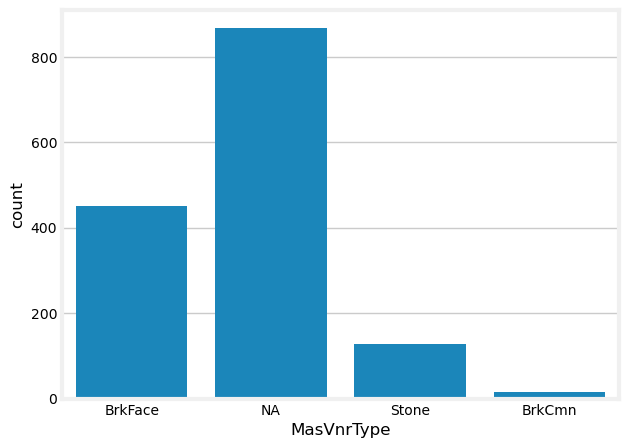

In [101]:
sns.countplot(data=data_train[['MasVnrType']], x='MasVnrType')

And similarly for the test data:

<Axes: xlabel='MasVnrType', ylabel='count'>

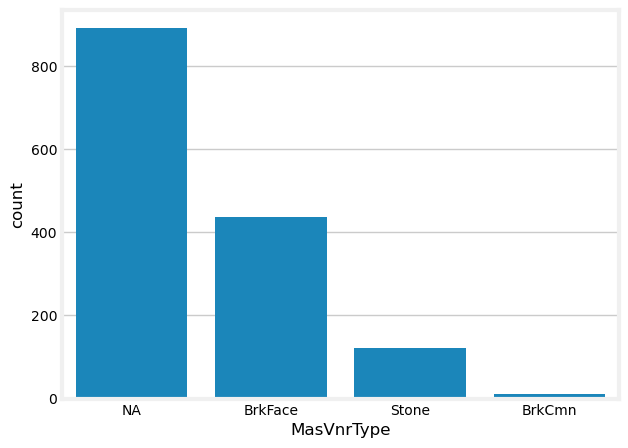

In [102]:
sns.countplot(data=data_test[['MasVnrType']], x='MasVnrType')

And there really is only a mild dependence of the price on the veneer type:

<Axes: xlabel='MasVnrType', ylabel='SalePrice'>

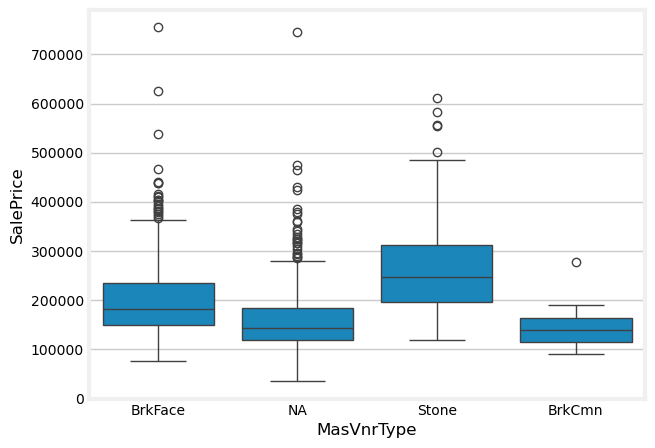

In [103]:
sns.boxplot(data=data_train, x='MasVnrType', y='SalePrice')

Compared, for example, with the quality:

<Axes: xlabel='OverallQual', ylabel='SalePrice'>

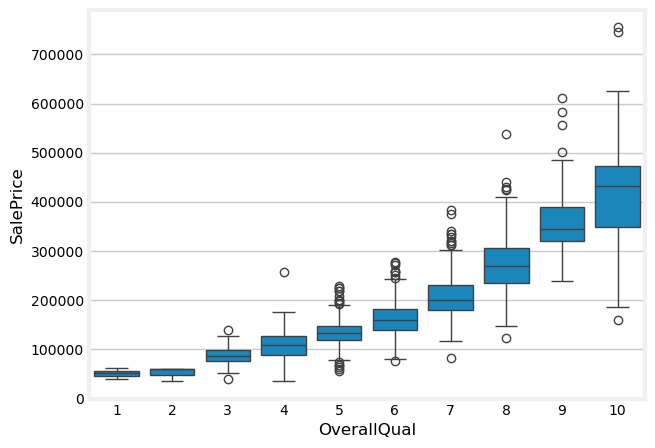

In [104]:
sns.boxplot(data=data_train, x='OverallQual', y='SalePrice')

Because of this **three** things (_i._ the sparsity of the data with NaN entries, _ii._ the dominance by one value, `'BrkFace'`, and _iii._ the only very mild dependence of `SalePrice` on `MasVnrType`), our imputation will be a simple mode imputation.

Imputting `'NA'` for `'MasVnrType'` (when `'MasVnrArea'`=0):

In [105]:
imputed_value = 'NA'

train_slice = data_train[(data_train['MasVnrArea'] == 0)]
test_slice = data_test[(data_test['MasVnrArea'] == 0)]

data_train.loc[train_slice.index, 'MasVnrType'] = data_train.loc[train_slice.index, 'MasVnrType'].fillna(imputed_value) # for training dataset
data_test.loc[test_slice.index, 'MasVnrType'] = data_test.loc[test_slice.index, 'MasVnrType'].fillna(imputed_value) # for test dataset

del imputed_value, train_slice, test_slice

Checking how things are going:

In [106]:
display(data_train[mas_vnr_cols].describe(include='all'))
display(data_test[mas_vnr_cols].describe(include='all'))

,MasVnrType,MasVnrArea
count,1460,1460.000000
unique,4,NaN
top,NA,NaN
freq,867,NaN
mean,NaN,103.117123
std,NaN,180.731373
min,NaN,0.000000
25%,NaN,0.000000
50%,NaN,0.000000
75%,NaN,164.250000


,MasVnrType,MasVnrArea
count,1459,1459.000000
unique,4,NaN
top,NA,NaN
freq,891,NaN
mean,NaN,99.673749
std,NaN,177.001792
min,NaN,0.000000
25%,NaN,0.000000
50%,NaN,0.000000
75%,NaN,162.000000


<Axes: xlabel='MasVnrType', ylabel='count'>

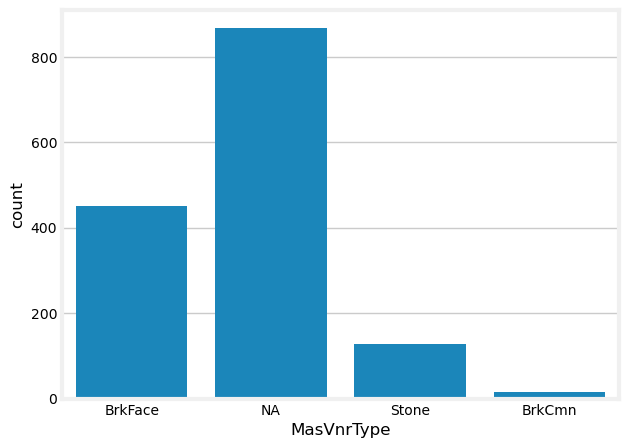

In [107]:
sns.countplot(data=data_train[['MasVnrType']], x='MasVnrType')

<Axes: xlabel='MasVnrType', ylabel='count'>

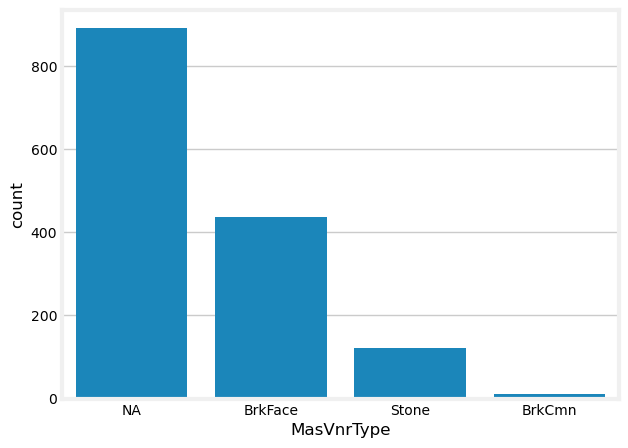

In [108]:
sns.countplot(data=data_test[['MasVnrType']], x='MasVnrType')

Now, 'NA' is the most common. We shall impute that whenever MasVnrArea is also NaN:

In [109]:
display(data_train[data_train['MasVnrType'].isna()])
display(data_test[data_test['MasVnrType'].isna()])

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition


In [110]:
train_slice = data_train[(data_train['MasVnrArea'].isna() & data_train['MasVnrType'].isna())]
test_slice = data_test[(data_test['MasVnrArea'].isna() & data_test['MasVnrType'].isna())]

data_train.loc[train_slice.index, 'MasVnrType'] = data_train.loc[train_slice.index, 'MasVnrType'].fillna('NA')
data_train.loc[train_slice.index, 'MasVnrArea'] = data_train.loc[train_slice.index, 'MasVnrArea'].fillna(0.)

data_test.loc[test_slice.index, 'MasVnrType'] = data_test.loc[test_slice.index, 'MasVnrType'].fillna('NA')
data_test.loc[test_slice.index, 'MasVnrArea'] = data_test.loc[test_slice.index, 'MasVnrArea'].fillna(0.)

del train_slice, test_slice

Almost done! There are a few entries with MasVnrArea but no type:

In [111]:
display(data_train[mas_vnr_cols+['Neighborhood']][data_train['MasVnrType'].isna()])
display(data_test[mas_vnr_cols+['Neighborhood']][data_test['MasVnrType'].isna()])

,MasVnrType,MasVnrArea,Neighborhood


,MasVnrType,MasVnrArea,Neighborhood


Note that MasVnrType has a Cramer's V correlation of ~0.3085 with Neighborhood, and that the most common MasVnrType (other than None) for each of these Neighborhood values is:

In [112]:
train_slice = data_train[data_train['MasVnrArea']>0]

print("Cramer's V (MasVnrType/Neighborhood):", cramers_v(train_slice['MasVnrType'], train_slice['Neighborhood']), "\n")

display(train_slice.groupby('Neighborhood')['MasVnrType'].agg(pd.Series.mode))

del train_slice

Cramer's V (MasVnrType/Neighborhood): 0.385157474251173 



Neighborhood
Blmngtn    BrkFace
BrDale     BrkFace
BrkSide    BrkFace
ClearCr    BrkFace
CollgCr    BrkFace
Crawfor    BrkFace
Edwards    BrkFace
Gilbert    BrkFace
IDOTRR     BrkFace
MeadowV    BrkFace
Mitchel    BrkFace
NAmes      BrkFace
NWAmes     BrkFace
NoRidge    BrkFace
NridgHt      Stone
OldTown    BrkFace
SWISU      BrkFace
Sawyer     BrkFace
SawyerW    BrkFace
Somerst      Stone
StoneBr      Stone
Timber     BrkFace
Veenker    BrkFace
Name: MasVnrType, dtype: object

Thus, we can just impute the mode of MasVnrType for when we have non-zero area:

In [113]:
# First, we need to find the MasVnrType per neighborhood in the training data:

train_slice = data_train[data_train['MasVnrArea']>0]

train_neigh_mastype = train_slice.groupby('Neighborhood')['MasVnrType'].agg(pd.Series.mode)

have_brkface = train_neigh_mastype[train_neigh_mastype == 'BrkFace'].index.to_list()

have_stone = train_neigh_mastype[train_neigh_mastype == 'Stone'].index.to_list()


# Imputing BrkFace in training
train_slice = data_train[(data_train['MasVnrArea'] > 0) & (data_train['Neighborhood'].isin(have_brkface))]
data_train.loc[train_slice.index, 'MasVnrType'] = data_train.loc[train_slice.index, 'MasVnrType'].fillna('BrkFace')

# Imputing Stone in training
train_slice = data_train[(data_train['MasVnrArea'] > 0) & (data_train['Neighborhood'].isin(have_stone))]
data_train.loc[train_slice.index, 'MasVnrType'] = data_train.loc[train_slice.index, 'MasVnrType'].fillna('Stone')

# Imputing BrkFace in test
test_slice = data_test[(data_test['MasVnrArea'] > 0) & (data_test['Neighborhood'].isin(have_brkface))]
data_test.loc[test_slice.index, 'MasVnrType'] = data_test.loc[test_slice.index, 'MasVnrType'].fillna('BrkFace')

# Imputing Stone in test
test_slice = data_test[(data_test['MasVnrArea'] > 0) & (data_test['Neighborhood'].isin(have_stone))]
data_test.loc[test_slice.index, 'MasVnrType'] = data_test.loc[test_slice.index, 'MasVnrType'].fillna('Stone')

Done!

In [114]:
display(data_train[data_train[mas_vnr_cols].isna().any(axis=1)])
display(data_test[data_test[mas_vnr_cols].isna().any(axis=1)])

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition


Adding this feature to the list, and providing the rules:

In [115]:
need_conditions += ['MasVnrType', 'MasVnrArea']
groupby_cols['MasVnrType'] = 'Neighborhood'

imputation_rules += [{"condition": lambda df: (df['MasVnrType'].isna() & df['MasVnrArea'].isna()),
                      "column": 'MasVnrArea',
                      "value":0.}, # MasVnrArea=0 for NaNs in MasVnrArea and MasVnrType
                     {"condition": lambda df: (df['MasVnrArea'] == 0),
                      "column": 'MasVnrType',
                      "value":'NA'}, # MasVnrType='NA' for entries w/ MasVnrArea=0
                     {"condition": lambda df: (df['MasVnrArea'] > 0),
                      "column": 'MasVnrType',
                      "value":'group_mode'} # MasVnrType=mode(data_train) for entries w/ MasVnrArea > 0
                    ]

In [116]:
del mas_vnr_cols, mas_vnr_type_nan

#### `'Bsmt...'`

Defining all features referring to basement:

In [70]:
bsmt_cols = [col for col in data_train.columns if 'Bsmt' in col]

What percentage is missing basement entries?

In [71]:
for bsmt_feat in bsmt_cols:

    # print(bsmt_feat)
    find_description(bsmt_feat)
    
    try:
        print(f"training data missing '{bsmt_feat}': {train_nan_cols.loc[train_nan_cols > 0][bsmt_feat]}, i.e. {train_nan_cols.loc[train_nan_cols > 0][bsmt_feat]/len(data_train) * 100:.4g}%")

        if data_train[bsmt_feat].dtype == 'object':
            print(f"unique values of training data: {data_train[bsmt_feat].unique().tolist()}")

    except:
        print(f"No missing '{bsmt_feat}' data in training.")

    try:
        print(f"\ntest data missing '{bsmt_feat}': {test_nan_cols.loc[test_nan_cols > 0][bsmt_feat]}, i.e. {test_nan_cols.loc[test_nan_cols > 0][bsmt_feat]/len(data_test) * 100:.4g}%")

        if data_test[bsmt_feat].dtype == 'object':
            print(f"unique values of test data: {data_test[bsmt_feat].unique().tolist()}")
            
    except:
        print(f"No missing '{bsmt_feat}' data in test.")

    print("*"*75)

BsmtQual: Evaluates the height of the basement

Ex	Excellent (100+ inches)
Gd	Good (90-99 inches)
TA	Typical (80-89 inches)
Fa	Fair (70-79 inches)
Po	Poor (<70 inches
NA	No Basement

training data missing 'BsmtQual': 37, i.e. 2.534%
unique values of training data: ['Gd', 'TA', 'Ex', nan, 'Fa']

test data missing 'BsmtQual': 44, i.e. 3.016%
unique values of test data: ['TA', 'Gd', 'Ex', 'Fa', nan]
***************************************************************************
BsmtCond: Evaluates the general condition of the basement

Ex	Excellent
Gd	Good
TA	Typical - slight dampness allowed
Fa	Fair - dampness or some cracking or settling
Po	Poor - Severe cracking, settling, or wetness
NA	No Basement

training data missing 'BsmtCond': 37, i.e. 2.534%
unique values of training data: ['TA', 'Gd', nan, 'Fa', 'Po']

test data missing 'BsmtCond': 45, i.e. 3.084%
unique values of test data: ['TA', 'Po', 'Fa', 'Gd', nan]
***************************************************************************
Bs

Only a small fraction! Let us now look at the relevant data in more detail. First, the training data:

In [72]:
data_train[bsmt_cols][data_train[bsmt_cols].isna().any(axis=1)]

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath
17,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
39,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
90,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
102,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
156,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
182,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
259,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
332,Gd,TA,No,GLQ,1124,NaN,479,1603,3206,1,0
342,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
362,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0


And now the test data:

In [73]:
data_test[bsmt_cols][data_test[bsmt_cols].isna().any(axis=1)]

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath
27,Gd,TA,NaN,Unf,0.0,Unf,0.0,1595.0,1595.0,0.0,0.0
125,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
133,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
269,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
318,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
354,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
387,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
388,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
396,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
397,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0


It is evident that for most of these columns (`'BsmtQual'`, `'BsmtCond'`, `'BsmtExposure'`, `'BsmtFinType1'`, `'BsmtFinType2'`) the N/A values correspond to simply not having any basement at all, as can be corroborated by their NaN counts:

In [74]:
data_train[bsmt_cols][data_train[['BsmtQual']].isna().any(axis=1)].isna().sum(axis=0)

BsmtQual        37
BsmtCond        37
BsmtExposure    37
BsmtFinType1    37
BsmtFinSF1       0
BsmtFinType2    37
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
BsmtFullBath     0
BsmtHalfBath     0
dtype: int64

In [75]:
data_train[bsmt_cols][data_train[['BsmtQual']].isna().any(axis=1)]

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath
17,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
39,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
90,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
102,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
156,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
182,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
259,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
342,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
362,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
371,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0


For the test dataset, there are a couple of NaN in BsmtQual that actually **do** have entries in other columns. These will most likely correspond to a missing record, as opposed to simply non-existent data!

In [76]:
data_test[bsmt_cols][data_test[['BsmtQual']].isna().any(axis=1)].isna().sum(axis=0)

BsmtQual        44
BsmtCond        42
BsmtExposure    42
BsmtFinType1    42
BsmtFinSF1       1
BsmtFinType2    42
BsmtFinSF2       1
BsmtUnfSF        1
TotalBsmtSF      1
BsmtFullBath     2
BsmtHalfBath     2
dtype: int64

In [77]:
data_test[bsmt_cols][data_test[['BsmtQual']].isna().any(axis=1)]

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath
125,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
133,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
269,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
318,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
354,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
387,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
388,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
396,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
397,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
398,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0


Thus, we perform a constant imputation:

In [78]:
imputed_value = 'NA'

For the training dataset:

In [79]:
rows_train_nan = data_train['BsmtQual'][data_train['BsmtQual'].isna()].index # indices with NaN values in 'BsmtQual'

In [80]:
data_train[bsmt_cols].iloc[rows_train_nan]

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath
17,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
39,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
90,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
102,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
156,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
182,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
259,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
342,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
362,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
371,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0


In [81]:
data_train['BsmtQual'].iloc[rows_train_nan]

17      NaN
39      NaN
90      NaN
102     NaN
156     NaN
182     NaN
259     NaN
342     NaN
362     NaN
371     NaN
392     NaN
520     NaN
532     NaN
533     NaN
553     NaN
646     NaN
705     NaN
736     NaN
749     NaN
778     NaN
868     NaN
894     NaN
897     NaN
984     NaN
1000    NaN
1011    NaN
1035    NaN
1045    NaN
1048    NaN
1049    NaN
1090    NaN
1179    NaN
1216    NaN
1218    NaN
1232    NaN
1321    NaN
1412    NaN
Name: BsmtQual, dtype: object

In [82]:
# for the training dataset
data_train.iloc[rows_train_nan, data_train.columns.get_loc('BsmtQual')] = imputed_value
data_train.iloc[rows_train_nan, data_train.columns.get_loc('BsmtCond')] = imputed_value
data_train.iloc[rows_train_nan, data_train.columns.get_loc('BsmtExposure')] = imputed_value
data_train.iloc[rows_train_nan, data_train.columns.get_loc('BsmtFinType1')] = imputed_value
data_train.iloc[rows_train_nan, data_train.columns.get_loc('BsmtFinType2')] = imputed_value

For the test dataset:

In [83]:
rows_test_nan = data_test['BsmtQual'][data_test['BsmtQual'].isna() & data_test['BsmtCond'].isna()].index # indices with NaN in values in 'BsmtQual' AND 'BsmtCond'

In [84]:
data_test[bsmt_cols].iloc[rows_test_nan]

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath
125,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
133,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
269,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
318,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
354,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
387,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
388,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
396,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
397,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
398,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0


In [85]:
# for the test dataset
data_test.iloc[rows_test_nan, data_test.columns.get_loc('BsmtQual')] = imputed_value
data_test.iloc[rows_test_nan, data_test.columns.get_loc('BsmtCond')] = imputed_value
data_test.iloc[rows_test_nan, data_test.columns.get_loc('BsmtExposure')] = imputed_value
data_test.iloc[rows_test_nan, data_test.columns.get_loc('BsmtFinType1')] = imputed_value
data_test.iloc[rows_test_nan, data_test.columns.get_loc('BsmtFinType2')] = imputed_value

This has gotten rid of most of the missing values. The ones left are, in the training data:

In [86]:
data_train[bsmt_cols][data_train[bsmt_cols].isna().any(axis=1)]

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath
332,Gd,TA,No,GLQ,1124,NaN,479,1603,3206,1,0
948,Gd,TA,NaN,Unf,0,Unf,0,936,936,0,0


In the test data:

In [87]:
data_test[bsmt_cols][data_test[bsmt_cols].isna().any(axis=1)]

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath
27,Gd,TA,NaN,Unf,0.0,Unf,0.0,1595.0,1595.0,0.0,0.0
580,Gd,NaN,Mn,GLQ,1044.0,Rec,382.0,0.0,1426.0,1.0,0.0
660,NA,NA,NA,NA,NaN,NA,NaN,NaN,NaN,NaN,NaN
725,TA,NaN,No,BLQ,1033.0,Unf,0.0,94.0,1127.0,0.0,1.0
728,NA,NA,NA,NA,0.0,NA,0.0,0.0,0.0,NaN,NaN
757,NaN,Fa,No,Unf,0.0,Unf,0.0,173.0,173.0,0.0,0.0
758,NaN,TA,No,Unf,0.0,Unf,0.0,356.0,356.0,0.0,0.0
888,Gd,TA,NaN,Unf,0.0,Unf,0.0,725.0,725.0,0.0,0.0
1064,TA,NaN,Av,ALQ,755.0,Unf,0.0,240.0,995.0,0.0,0.0


Obviously, some of the remaining NaNs in the test data are there because there is still no basement! This is the case of the `SF` or Bath features. Let us fix that:

In [88]:
data_test[bsmt_cols][data_test[bsmt_cols].isna().any(axis=1) & (data_test['BsmtQual'] == 'NA')]

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath
660,NA,NA,NA,NA,NaN,NA,NaN,NaN,NaN,NaN,NaN
728,NA,NA,NA,NA,0.0,NA,0.0,0.0,0.0,NaN,NaN


In [89]:
no_bsmt_data_test_idx = data_test[bsmt_cols][data_test[bsmt_cols].isna().any(axis=1) & (data_test['BsmtQual'] == 'NA')].index
no_bsmt_data_test_cols = [data_test.columns.get_loc(col) for col in ['BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'BsmtFullBath', 'BsmtHalfBath']]

In [90]:
data_test.iloc[no_bsmt_data_test_idx, no_bsmt_data_test_cols]

,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath
660,NaN,NaN,NaN,NaN,NaN,NaN
728,0.0,0.0,0.0,0.0,NaN,NaN


In [91]:
imputed_value = 0

data_test.iloc[no_bsmt_data_test_idx, no_bsmt_data_test_cols] = imputed_value

Having done that, let us return to what is left of the NaNs:

In [92]:
data_train[bsmt_cols][data_train[bsmt_cols].isna().any(axis=1)]

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath
332,Gd,TA,No,GLQ,1124,NaN,479,1603,3206,1,0
948,Gd,TA,NaN,Unf,0,Unf,0,936,936,0,0


In [93]:
data_test[bsmt_cols][data_test[bsmt_cols].isna().any(axis=1)]

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath
27,Gd,TA,NaN,Unf,0.0,Unf,0.0,1595.0,1595.0,0.0,0.0
580,Gd,NaN,Mn,GLQ,1044.0,Rec,382.0,0.0,1426.0,1.0,0.0
725,TA,NaN,No,BLQ,1033.0,Unf,0.0,94.0,1127.0,0.0,1.0
757,NaN,Fa,No,Unf,0.0,Unf,0.0,173.0,173.0,0.0,0.0
758,NaN,TA,No,Unf,0.0,Unf,0.0,356.0,356.0,0.0,0.0
888,Gd,TA,NaN,Unf,0.0,Unf,0.0,725.0,725.0,0.0,0.0
1064,TA,NaN,Av,ALQ,755.0,Unf,0.0,240.0,995.0,0.0,0.0


In order to impute these values, we need to do more work. Let us begin by exploring how much do the different values of the categorical columns impact the `'SalePrice'`, which may tell us whether we should be worried about doing too bad of a job:

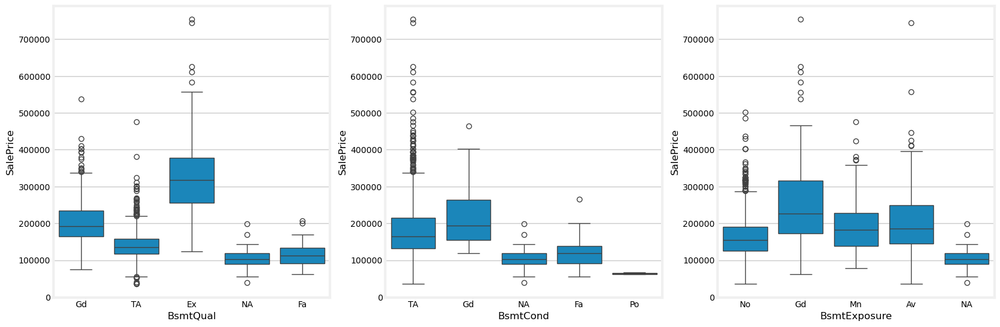

In [94]:
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

bsmt_cats = ['BsmtQual', 'BsmtCond', 'BsmtExposure']

for i, feat in enumerate(bsmt_cats):
    
    sns.boxplot(data=data_train, x=feat, y='SalePrice', ax=axs[i])
    # sns.boxplot(data=data_test, x=feat, y='SalePrice', ax=axs[1,i])

There isn't a strong correlation, unless `BsmtQual` is `'Ex'`, in which case there is a significant jump in price.

So let's try to do a good job. Perhaps a mode imputation? Let us define a function that, given the values of two of these categorical features, it spits out the mode of the third feature, and optionally plots the distribution:

In [95]:
def bsmt_cat_fn(bsmt_feat1_val1: tuple, bsmt_feat2_val2: tuple, var, plot=False):
    
    feat1, val1 = bsmt_feat1_val1
    feat2, val2 = bsmt_feat2_val2

    data_slice = (data_train[feat1] == val1) & (data_train[feat2] == val2)

    mode = data_train.loc[data_slice][var].mode()[0]

    if plot:
        sns.countplot(data=data_train.loc[data_slice], x=var)

    return mode

So, for the two remaining NaNs in the training data:

In [96]:
data_train[bsmt_cats][data_train[bsmt_cols].isna().any(axis=1)]

,BsmtQual,BsmtCond,BsmtExposure
332,Gd,TA,No
948,Gd,TA,NaN


'Unf'

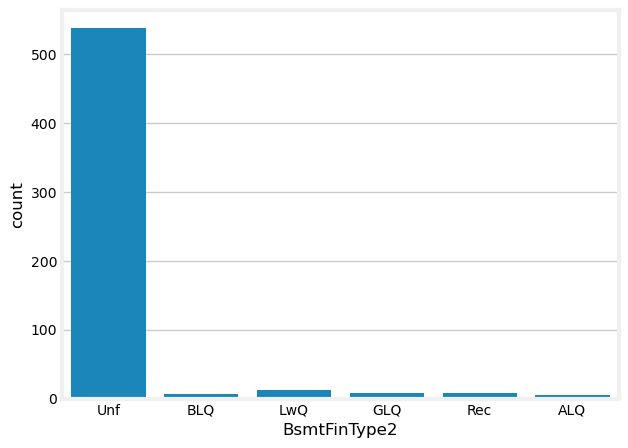

In [97]:
bsmt_cat_fn(('BsmtQual', 'Gd'), ('BsmtCond', 'TA'), 'BsmtFinType2', plot=True)

'No'

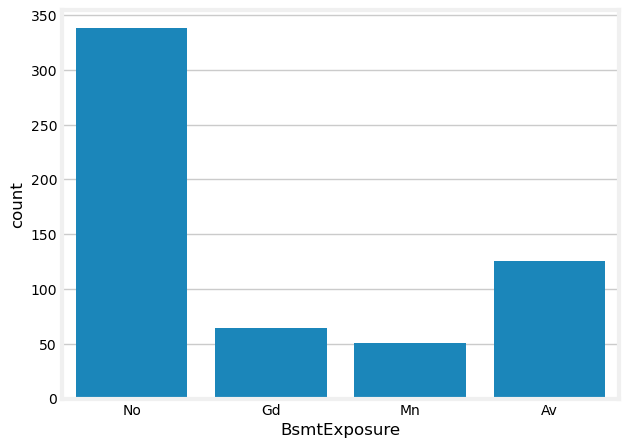

In [98]:
bsmt_cat_fn(('BsmtQual', 'Gd'), ('BsmtCond', 'TA'), 'BsmtExposure', plot=True)

For the test data:

In [99]:
data_test[bsmt_cats][data_test[bsmt_cols].isna().any(axis=1)]

,BsmtQual,BsmtCond,BsmtExposure
27,Gd,TA,NaN
580,Gd,NaN,Mn
725,TA,NaN,No
757,NaN,Fa,No
758,NaN,TA,No
888,Gd,TA,NaN
1064,TA,NaN,Av


'No'

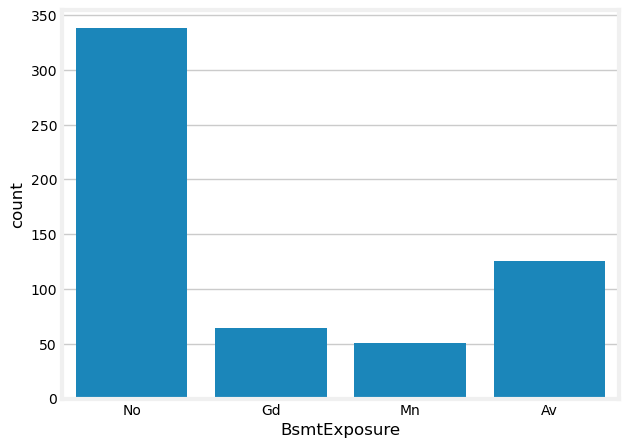

In [100]:
bsmt_cat_fn(('BsmtQual', 'Gd'), ('BsmtCond', 'TA'), 'BsmtExposure', plot=True)

'TA'

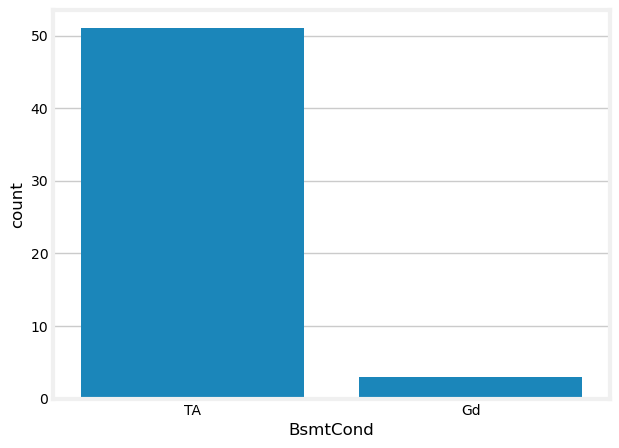

In [101]:
bsmt_cat_fn(('BsmtQual', 'Gd'), ('BsmtExposure', 'Mn'), 'BsmtCond', plot=True)

'TA'

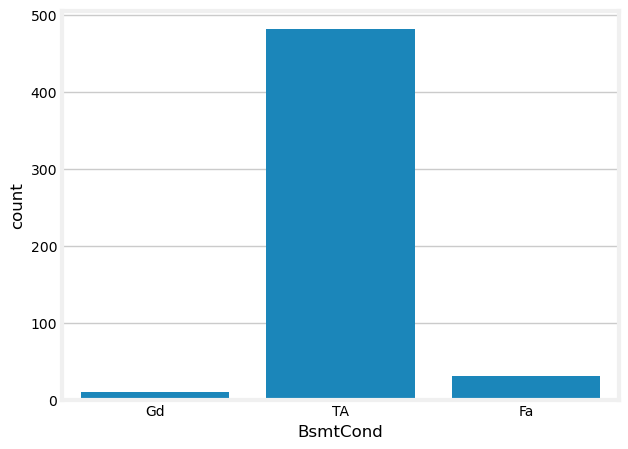

In [102]:
bsmt_cat_fn(('BsmtQual', 'TA'), ('BsmtExposure', 'No'), 'BsmtCond', plot=True)

'TA'

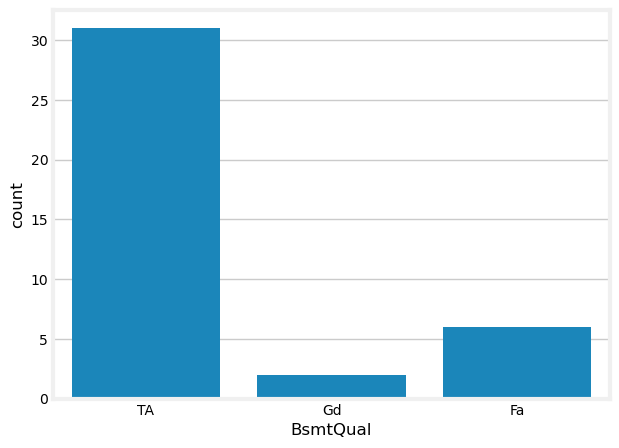

In [103]:
bsmt_cat_fn(('BsmtCond', 'Fa'), ('BsmtExposure', 'No'), 'BsmtQual', plot=True)

'TA'

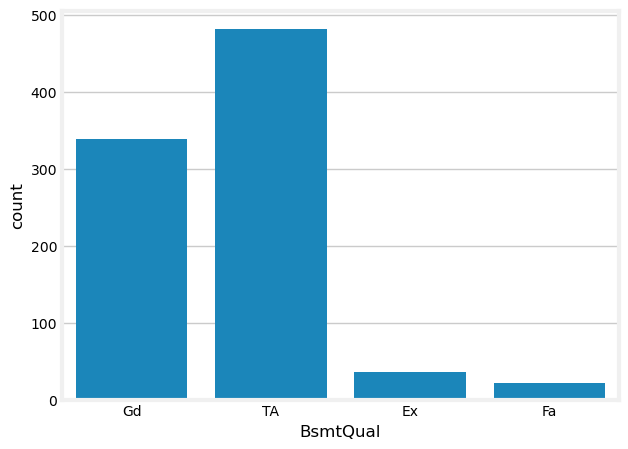

In [104]:
bsmt_cat_fn(('BsmtCond', 'TA'), ('BsmtExposure', 'No'), 'BsmtQual', plot=True)

'TA'

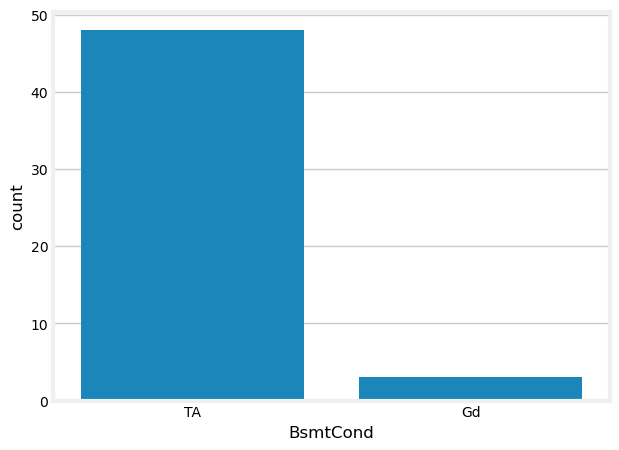

In [105]:
bsmt_cat_fn(('BsmtQual', 'TA'), ('BsmtExposure', 'Av'), 'BsmtCond', plot=True)

In all cases but one there is a clear mode (and even in that, it's not so bad). So let us make this our imputation method.

For the training data:

In [106]:
train_bsmt = data_train[bsmt_cols][data_train[bsmt_cols].isna().any(axis=1)]

for idx in train_bsmt.index:

    bsmt_feats_has_nan = data_train.loc[idx, bsmt_cols].isna()

    for feat_w_nan in bsmt_feats_has_nan[bsmt_feats_has_nan].index:

        imputed_value = bsmt_cat_fn(('BsmtQual', data_train.loc[idx, 'BsmtQual']),
                                    ('BsmtCond', data_train.loc[idx, 'BsmtCond']),
                                    feat_w_nan, plot=False)

        print(feat_w_nan, imputed_value)
        data_train.loc[idx, feat_w_nan] = imputed_value

del train_bsmt, bsmt_feats_has_nan, feat_w_nan, imputed_value

BsmtFinType2 Unf
BsmtExposure No


For the test data:

In [107]:
bsmt_cats = ['BsmtQual', 'BsmtCond', 'BsmtExposure']

test_bsmt = data_test[bsmt_cats][data_test[bsmt_cats].isna().any(axis=1)]

for idx in test_bsmt.index:

    bsmt_feats_has_nan = data_test.loc[idx, bsmt_cats].isna()

    for feat_w_nan in bsmt_feats_has_nan[bsmt_feats_has_nan].index:

        known_feats = list(set(bsmt_cats) - set([feat_w_nan]))

        imputed_value = bsmt_cat_fn((known_feats[0], data_test.loc[idx, known_feats[0]]),
                                    (known_feats[1], data_test.loc[idx, known_feats[1]]),
                                    feat_w_nan, plot=False)

        print(feat_w_nan, imputed_value)
        data_test.loc[idx, feat_w_nan] = imputed_value

del test_bsmt, bsmt_feats_has_nan, feat_w_nan, imputed_value

BsmtExposure No
BsmtCond TA
BsmtCond TA
BsmtQual TA
BsmtQual TA
BsmtExposure No
BsmtCond TA


Let us look at the result:

In [108]:
data_train[bsmt_cols][data_train[bsmt_cols].isna().any(axis=1)]

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath


In [109]:
data_test[bsmt_cols][data_test[bsmt_cols].isna().any(axis=1)]

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath


We are done!

In [110]:
need_conditions += bsmt_cols

groupby_cols['BsmtFinType2'] = ['BsmtQual', 'BsmtCond']
groupby_cols['BsmtExposure'] = ['BsmtQual', 'BsmtCond']
groupby_cols['BsmtQual'] = ['BsmtCond', 'BsmtExposure']
groupby_cols['BsmtCond'] = ['BsmtExposure', 'BsmtQual']

imputation_rules += [{"condition": lambda df: (df['BsmtQual'].isna() & df['BsmtCond'].isna()),
                      "column": 'BsmtQual',
                      "value": 'NA'},
                     {"condition": lambda df: ((df['BsmtQual'] == 'NA') & df['BsmtCond'].isna()),
                      "column": 'BsmtCond',
                      "value": 'NA'},
                     {"condition": lambda df: ((df['BsmtQual'] == 'NA') & (df['BsmtCond'] == 'NA')),
                      "column": 'BsmtExposure',
                      "value": 'NA'},
                     {"condition": lambda df: ((df['BsmtQual'] == 'NA') & (df['BsmtCond'] == 'NA')),
                      "column": 'BsmtFinType1',
                      "value": 'NA'},
                     {"condition": lambda df: ((df['BsmtQual'] == 'NA') & (df['BsmtCond'] == 'NA')),
                      "column": 'BsmtFinType2',
                      "value": 'NA'},
                     {"condition": lambda df: ((df['BsmtQual'] == 'NA') & (df['BsmtCond'] == 'NA')),
                      "column": 'BsmtFinSF1',
                      "value": 0.},
                     {"condition": lambda df: ((df['BsmtQual'] == 'NA') & (df['BsmtCond'] == 'NA')),
                      "column": 'BsmtFinSF2',
                      "value": 0.},
                     {"condition": lambda df: ((df['BsmtQual'] == 'NA') & (df['BsmtCond'] == 'NA')),
                      "column": 'BsmtUnfSF',
                      "value": 0.},
                     {"condition": lambda df: ((df['BsmtQual'] == 'NA') & (df['BsmtCond'] == 'NA')),
                      "column": 'TotalBsmtSF',
                      "value": 0.},
                     {"condition": lambda df: ((df['BsmtQual'] == 'NA') & (df['BsmtCond'] == 'NA')),
                      "column": 'BsmtFullBath',
                      "value": 0},
                     {"condition": lambda df: ((df['BsmtQual'] == 'NA') & (df['BsmtCond'] == 'NA')),
                      "column": 'BsmtHalfBath',
                      "value": 0},
                     {"condition": lambda df: pd.Series(True, index=df.index), # pick all elements!
                      "column": 'BsmtFinType2',
                      "value": 'group_mode'},
                     {"condition": lambda df: pd.Series(True, index=df.index), # pick all elements!
                      "column": 'BsmtExposure',
                      "value": 'group_mode'},
                     {"condition": lambda df: pd.Series(True, index=df.index), # pick all elements!
                      "column": 'BsmtQual',
                      "value": 'group_mode'},
                     {"condition": lambda df: pd.Series(True, index=df.index), # pick all elements!
                      "column": 'BsmtCond',
                      "value": 'group_mode'}
                     ]

In [111]:
del bsmt_cols, bsmt_feat, rows_train_nan, rows_test_nan, no_bsmt_data_test_idx, no_bsmt_data_test_cols, bsmt_cats, fig, axs

#### `'Fireplace...'`

Defining all features referring to fireplace:

In [112]:
fire_cols = [col for col in data_train.columns if 'Fire' in col]

What percentage is missing entries?

In [113]:
for fire_feat in fire_cols:

    # print(bsmt_feat)
    find_description(fire_feat)
    
    try:
        print(f"training data missing '{fire_feat}': {train_nan_cols.loc[train_nan_cols > 0][fire_feat]}, i.e. {train_nan_cols.loc[train_nan_cols > 0][fire_feat]/len(data_train) * 100:.4g}%")

        if data_train[fire_feat].dtype == 'object':
            print(f"unique values of training data: {data_train[fire_feat].unique().tolist()}")

    except:
        print(f"No missing '{fire_feat}' data in training.")

    try:
        print(f"\ntest data missing '{fire_feat}': {test_nan_cols.loc[test_nan_cols > 0][fire_feat]}, i.e. {test_nan_cols.loc[test_nan_cols > 0][fire_feat]/len(data_test) * 100:.4g}%")

        if data_test[fire_feat].dtype == 'object':
            print(f"unique values of test data: {data_test[fire_feat].unique().tolist()}")
            
    except:
        print(f"No missing '{fire_feat}' data in test.")

    print("*"*75)

Fireplaces: Number of fireplaces

No missing 'Fireplaces' data in training.
No missing 'Fireplaces' data in test.
***************************************************************************
FireplaceQu: Fireplace quality

Ex	Excellent - Exceptional Masonry Fireplace
Gd	Good - Masonry Fireplace in main level
TA	Average - Prefabricated Fireplace in main living area or Masonry Fireplace in basement
Fa	Fair - Prefabricated Fireplace in basement
Po	Poor - Ben Franklin Stove
NA	No Fireplace

training data missing 'FireplaceQu': 690, i.e. 47.26%
unique values of training data: [nan, 'TA', 'Gd', 'Fa', 'Ex', 'Po']

test data missing 'FireplaceQu': 730, i.e. 50.03%
unique values of test data: [nan, 'TA', 'Gd', 'Po', 'Fa', 'Ex']
***************************************************************************


About 50% of all data is missing values in `'FireplaceQu'`. Let us now look at the relevant data in more detail. First, the training data:

In [114]:
train_slice = data_train[fire_cols][data_train[fire_cols].isna().any(axis=1)]

display(train_slice.head())
display(train_slice.describe())

del train_slice

,Fireplaces,FireplaceQu
0,0,NaN
5,0,NaN
10,0,NaN
12,0,NaN
15,0,NaN


,Fireplaces
count,690.0
mean,0.0
std,0.0
min,0.0
25%,0.0
50%,0.0
75%,0.0
max,0.0


And now the test data:

In [115]:
test_slice = data_test[fire_cols][data_test[fire_cols].isna().any(axis=1)]

display(test_slice.head())
display(test_slice.describe())

del test_slice

,Fireplaces,FireplaceQu
0,0,NaN
1,0,NaN
4,0,NaN
6,0,NaN
9,0,NaN


,Fireplaces
count,730.0
mean,0.0
std,0.0
min,0.0
25%,0.0
50%,0.0
75%,0.0
max,0.0


It is evident that every time we have a NaN value in `'FireplaceQu'` it is because there is no fireplace! This makes our job easier:

In [116]:
imputed_value = 'NA'

# for the training data
data_train.loc[:,'FireplaceQu'].fillna(imputed_value, inplace=True)

# for the test data
data_test.loc[:,'FireplaceQu'].fillna(imputed_value, inplace=True)

del imputed_value

/tmp/ipykernel_13729/3055122301.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data_train.loc[:,'FireplaceQu'].fillna(imputed_value, inplace=True)
/tmp/ipykernel_13729/3055122301.py:7: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value,

Done!

In [117]:
data_train[fire_cols][data_train[fire_cols].isna().any(axis=1)]

,Fireplaces,FireplaceQu


In [118]:
data_test[fire_cols][data_test[fire_cols].isna().any(axis=1)]

,Fireplaces,FireplaceQu


Adding this feature to the list:

In [119]:
column_value_strategy['FireplaceQu'] = 'NA'

In [120]:
del fire_cols, fire_feat

#### `'Garage...'`

Defining all features referring to garage:

In [121]:
garage_cols = [col for col in data_train.columns if 'arage' in col]

What percentage is missing entries?

In [122]:
for garage_feat in garage_cols:

    # print(bsmt_feat)
    find_description(garage_feat)
    
    try:
        print(f"training data missing '{garage_feat}': {train_nan_cols.loc[train_nan_cols > 0][garage_feat]}, i.e. {train_nan_cols.loc[train_nan_cols > 0][garage_feat]/len(data_train) * 100:.4g}%")

        if data_train[garage_feat].dtype == 'object':
            print(f"unique values of training data: {data_train[garage_feat].unique().tolist()}")

    except:
        print(f"No missing '{garage_feat}' data in training.")

    try:
        print(f"\ntest data missing '{garage_feat}': {test_nan_cols.loc[test_nan_cols > 0][garage_feat]}, i.e. {test_nan_cols.loc[test_nan_cols > 0][garage_feat]/len(data_test) * 100:.4g}%")

        if data_test[garage_feat].dtype == 'object':
            print(f"unique values of test data: {data_test[garage_feat].unique().tolist()}")
            
    except:
        print(f"No missing '{garage_feat}' data in test.")

    print("*"*75)

GarageType: Garage location

2Types	More than one type of garage
Attchd	Attached to home
Basment	Basement Garage
BuiltIn	Built-In (Garage part of house - typically has room above garage)
CarPort	Car Port
Detchd	Detached from home
NA	No Garage

training data missing 'GarageType': 81, i.e. 5.548%
unique values of training data: ['Attchd', 'Detchd', 'BuiltIn', 'CarPort', nan, 'Basment', '2Types']

test data missing 'GarageType': 76, i.e. 5.209%
unique values of test data: ['Attchd', 'Detchd', 'BuiltIn', nan, 'Basment', '2Types', 'CarPort']
***************************************************************************
GarageYrBlt: Year garage was built

training data missing 'GarageYrBlt': 81, i.e. 5.548%

test data missing 'GarageYrBlt': 78, i.e. 5.346%
***************************************************************************
GarageFinish: Interior finish of the garage

Fin	Finished
RFn	Rough Finished
Unf	Unfinished
NA	No Garage

training data missing 'GarageFinish': 81, i.e. 5.548%
unique

About 5% of all data is missing values in some kind of `'Garage...'` feature. There are a few rows in the test dataset that miss some garage entries but not others. There are a few garage features with only 1 missing entry. Let us now look at the relevant data in more detail. First, the training data:

In [123]:
train_slice = data_train[garage_cols][data_train[garage_cols].isna().any(axis=1)]

display(train_slice)
display(train_slice.describe(include='all'))

del train_slice

,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond
39,NaN,NaN,NaN,0,0,NaN,NaN
48,NaN,NaN,NaN,0,0,NaN,NaN
78,NaN,NaN,NaN,0,0,NaN,NaN
88,NaN,NaN,NaN,0,0,NaN,NaN
89,NaN,NaN,NaN,0,0,NaN,NaN
...,...,...,...,...,...,...,...
1349,NaN,NaN,NaN,0,0,NaN,NaN
1407,NaN,NaN,NaN,0,0,NaN,NaN
1449,NaN,NaN,NaN,0,0,NaN,NaN
1450,NaN,NaN,NaN,0,0,NaN,NaN


,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond
count,0,0.0,0,81.0,81.0,0,0
unique,0,NaN,0,NaN,NaN,0,0
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,0.0,0.0,NaN,NaN
std,NaN,NaN,NaN,0.0,0.0,NaN,NaN
min,NaN,NaN,NaN,0.0,0.0,NaN,NaN
25%,NaN,NaN,NaN,0.0,0.0,NaN,NaN
50%,NaN,NaN,NaN,0.0,0.0,NaN,NaN
75%,NaN,NaN,NaN,0.0,0.0,NaN,NaN


Next, the test data:

In [124]:
test_slice = data_test[garage_cols][data_test[garage_cols].isna().any(axis=1)]

display(test_slice)
display(test_slice.describe(include='all'))

del test_slice

,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond
53,NaN,NaN,NaN,0.0,0.0,NaN,NaN
71,NaN,NaN,NaN,0.0,0.0,NaN,NaN
79,NaN,NaN,NaN,0.0,0.0,NaN,NaN
92,NaN,NaN,NaN,0.0,0.0,NaN,NaN
96,NaN,NaN,NaN,0.0,0.0,NaN,NaN
...,...,...,...,...,...,...,...
1433,NaN,NaN,NaN,0.0,0.0,NaN,NaN
1449,NaN,NaN,NaN,0.0,0.0,NaN,NaN
1453,NaN,NaN,NaN,0.0,0.0,NaN,NaN
1454,NaN,NaN,NaN,0.0,0.0,NaN,NaN


,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond
count,2,0.0,0,77.000000,77.000000,0,0
unique,1,NaN,0,NaN,NaN,0,0
top,Detchd,NaN,NaN,NaN,NaN,NaN,NaN
freq,2,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,0.012987,4.675325,NaN,NaN
std,NaN,NaN,NaN,0.113961,41.025808,NaN,NaN
min,NaN,NaN,NaN,0.000000,0.000000,NaN,NaN
25%,NaN,NaN,NaN,0.000000,0.000000,NaN,NaN
50%,NaN,NaN,NaN,0.000000,0.000000,NaN,NaN
75%,NaN,NaN,NaN,0.000000,0.000000,NaN,NaN


Note that there are some missing values in other columns that do not correspond to a missing garage. Indeed, these are the ones with NaNs in `'GarageType'`:

In [125]:
data_test.loc[data_test['GarageType'][data_test['GarageType'].isna()].index, garage_cols].describe(include='all')

,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond
count,0,0.0,0,76.0,76.0,0,0
unique,0,NaN,0,NaN,NaN,0,0
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,0.0,0.0,NaN,NaN
std,NaN,NaN,NaN,0.0,0.0,NaN,NaN
min,NaN,NaN,NaN,0.0,0.0,NaN,NaN
25%,NaN,NaN,NaN,0.0,0.0,NaN,NaN
50%,NaN,NaN,NaN,0.0,0.0,NaN,NaN
75%,NaN,NaN,NaN,0.0,0.0,NaN,NaN


And these the ones where it is not missing:

In [126]:
test_slice = data_test[garage_cols][data_test[garage_cols].isna().any(axis=1)]

display(data_test.loc[test_slice['GarageType'][test_slice['GarageType'].isna() == False].index, garage_cols])

del test_slice

,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond
666,Detchd,NaN,NaN,1.0,360.0,NaN,NaN
1116,Detchd,NaN,NaN,NaN,NaN,NaN,NaN


Given the unique values of `'GarageType'`, we can once again convince ourselves that all its missing values correspond to simply a lack of garage, which makes our imputation easier.

In [127]:
# for the training data
gt_nan_idx = data_train['GarageType'].isna()
gt_nan_idx = data_train['GarageType'][gt_nan_idx].index

print(gt_nan_idx)

# categorical columns
imputed_value = 'NA'
garage_cat_cols = data_train[garage_cols].select_dtypes(include='object').columns
print(garage_cat_cols.tolist())
for col in garage_cat_cols:
    # display(data_train.loc[gt_nan_idx, col])
    data_train.loc[gt_nan_idx, col] = data_train.loc[gt_nan_idx, col].fillna(imputed_value)

# numerical columns
imputed_value = 0.
garage_num_cols = data_train[garage_cols].select_dtypes(exclude='object').columns
print(garage_num_cols.tolist())
for col in garage_num_cols:
    # display(data_train.loc[gt_nan_idx, col])
    data_train.loc[gt_nan_idx, col] = data_train.loc[gt_nan_idx, col].fillna(imputed_value)

del gt_nan_idx, imputed_value, garage_cat_cols, garage_num_cols

Index([  39,   48,   78,   88,   89,   99,  108,  125,  127,  140,  148,  155,
        163,  165,  198,  210,  241,  250,  287,  291,  307,  375,  386,  393,
        431,  434,  441,  464,  495,  520,  528,  533,  535,  562,  582,  613,
        614,  620,  635,  636,  638,  649,  705,  710,  738,  750,  784,  826,
        843,  921,  942,  954,  960,  968,  970,  976, 1009, 1011, 1030, 1038,
       1096, 1123, 1131, 1137, 1143, 1173, 1179, 1218, 1219, 1234, 1257, 1283,
       1323, 1325, 1326, 1337, 1349, 1407, 1449, 1450, 1453],
      dtype='int64')
['GarageType', 'GarageFinish', 'GarageQual', 'GarageCond']
['GarageYrBlt', 'GarageCars', 'GarageArea']


In [128]:
# for the test data
gt_nan_idx = data_test['GarageType'].isna()
gt_nan_idx = data_test['GarageType'][gt_nan_idx].index

print(gt_nan_idx)

# categorical columns
imputed_value = 'NA'
garage_cat_cols = data_train[garage_cols].select_dtypes(include='object').columns
print(garage_cat_cols.tolist())
for col in garage_cat_cols:
    # display(data_test.loc[gt_nan_idx, col])
    data_test.loc[gt_nan_idx, col] = data_test.loc[gt_nan_idx, col].fillna(imputed_value)

# numerical columns
imputed_value = 0.
garage_num_cols = data_train[garage_cols].select_dtypes(exclude='object').columns
print(garage_num_cols.tolist())
for col in garage_num_cols:
    # display(data_test.loc[gt_nan_idx, col])
    data_test.loc[gt_nan_idx, col] = data_test.loc[gt_nan_idx, col].fillna(imputed_value)

del gt_nan_idx, imputed_value, garage_cat_cols, garage_num_cols

Index([  53,   71,   79,   92,   96,   98,  100,  130,  133,  134,  154,  155,
        257,  261,  327,  348,  350,  351,  359,  362,  371,  374,  376,  379,
        387,  433,  550,  621,  630,  633,  636,  639,  644,  675,  691,  693,
        729,  730,  731,  732,  733,  752,  778,  786,  893,  894,  938,  939,
        962,  966, 1092, 1093, 1097, 1115, 1119, 1143, 1149, 1231, 1233, 1248,
       1307, 1311, 1329, 1331, 1339, 1399, 1402, 1410, 1428, 1431, 1432, 1433,
       1449, 1453, 1454, 1457],
      dtype='int64')
['GarageType', 'GarageFinish', 'GarageQual', 'GarageCond']
['GarageYrBlt', 'GarageCars', 'GarageArea']


Checking!

Training:

In [129]:
train_slice = data_train[garage_cols][data_train[garage_cols].isna().any(axis=1)]

display(train_slice)

del train_slice

,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond


Test:

In [130]:
test_slice = data_test[garage_cols][data_test[garage_cols].isna().any(axis=1)]

display(test_slice)

del test_slice

,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond
666,Detchd,NaN,NaN,1.0,360.0,NaN,NaN
1116,Detchd,NaN,NaN,NaN,NaN,NaN,NaN


The categorical variables above are all related; their Cramer's Vs w.r.t. each other are:

In [131]:
garage_var = 'GarageCars'

train_slice = data_train[data_train['GarageType'] != 'NA'].drop(columns=['Id'])

test_cols = {}
for col in train_slice.select_dtypes(include=['object', 'int64']):
    if col == garage_var:
        continue
    test_cols[col] = cramers_v(train_slice[garage_var], train_slice[col])
    # print(col, test_cols[col])

print(sorted(test_cols, key=lambda k: test_cols[k], reverse=True))

del garage_var, train_slice, test_cols

['GarageArea', 'OverallQual', 'Neighborhood', 'SalePrice', 'YearBuilt', 'BsmtQual', 'GrLivArea', 'YearRemodAdd', 'WoodDeckSF', 'ExterQual', 'KitchenQual', 'FullBath', 'GarageFinish', 'LotArea', 'Foundation', 'BsmtUnfSF', 'MSSubClass', 'TotalBsmtSF', 'Exterior1st', 'Exterior2nd', 'TotRmsAbvGrd', '1stFlrSF', 'BsmtFinType1', 'OverallCond', 'MasVnrType', 'FireplaceQu', 'EnclosedPorch', 'GarageType', 'SaleCondition', 'SaleType', '2ndFlrSF', 'HeatingQC', 'HouseStyle', 'HalfBath', 'Fireplaces', 'BsmtExposure', 'RoofStyle', 'CentralAir', 'MSZoning', 'BedroomAbvGr', 'BldgType', 'Electrical', 'PavedDrive', 'BsmtFullBath', 'Fence', 'LotShape', 'OpenPorchSF', 'GarageQual', 'ExterCond', 'BsmtCond', 'LandContour', 'GarageCond', 'KitchenAbvGr', 'Alley', 'BsmtHalfBath', 'Heating', 'Condition1', 'BsmtFinType2', 'LotConfig', 'LandSlope', 'Functional', 'Street', 'Utilities', 'Condition2', 'RoofMatl', 'BsmtFinSF1', 'BsmtFinSF2', 'LowQualFinSF', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'PoolQC', 'MiscFeatur

In [132]:
train_slice = data_train[data_train['GarageType'] != 'NA']

print("Cramer's V (GarageFinish | GarageType):", cramers_v(train_slice['GarageType'], train_slice['GarageFinish']))
display(train_slice.groupby('GarageType')['GarageFinish'].agg(pd.Series.mode))

print("\nCramer's V (GarageCond | GarageFinish):", cramers_v(train_slice['GarageCond'], train_slice['GarageFinish']))
display(train_slice.groupby('GarageFinish')['GarageCond'].agg(pd.Series.mode))

print("\nCramer's V (GarageQual | GarageCond):", cramers_v(train_slice['GarageCond'], train_slice['GarageQual']))
display(train_slice.groupby('GarageCond')['GarageQual'].agg(pd.Series.mode))

print("\nCramer's V (GarageCars | Neighborhood):", cramers_v(train_slice['GarageCars'], train_slice['OverallQual']))
display(train_slice.groupby('Neighborhood')['GarageCars'].agg(pd.Series.mode))

display(train_slice.groupby('Neighborhood')['GarageCars'].value_counts())

del train_slice

Cramer's V (GarageFinish | GarageType): 0.452851059502631


GarageType
2Types     Unf
Attchd     RFn
Basment    Unf
BuiltIn    Fin
CarPort    Unf
Detchd     Unf
Name: GarageFinish, dtype: object


Cramer's V (GarageCond | GarageFinish): 0.13019982663779928


GarageFinish
Fin    TA
RFn    TA
Unf    TA
Name: GarageCond, dtype: object


Cramer's V (GarageQual | GarageCond): 0.6084995883603882


GarageCond
Ex    Ex
Fa    Fa
Gd    TA
Po    Fa
TA    TA
Name: GarageQual, dtype: object


Cramer's V (GarageCars | Neighborhood): 0.4340836222595636


Neighborhood
Blmngtn    2
Blueste    2
BrDale     1
BrkSide    1
ClearCr    2
CollgCr    2
Crawfor    2
Edwards    1
Gilbert    2
IDOTRR     1
MeadowV    1
Mitchel    2
NAmes      2
NPkVill    2
NWAmes     2
NoRidge    3
NridgHt    3
OldTown    1
SWISU      1
Sawyer     2
SawyerW    2
Somerst    2
StoneBr    2
Timber     2
Veenker    2
Name: GarageCars, dtype: int64

Neighborhood  GarageCars
Blmngtn       2              11
              3               6
Blueste       2               2
BrDale        1              12
              2               3
BrkSide       1              28
              2              20
ClearCr       2              22
              1               5
CollgCr       2             113
              3              20
              1              15
Crawfor       2              24
              1              23
              3               4
Edwards       1              40
              2              36
              3               2
Gilbert       2              74
              3               5
IDOTRR        1              22
              2               6
              3               1
MeadowV       1               9
              2               3
Mitchel       2              32
              1               7
              3               3
              4               2
NAmes         2             112
              1

Let us now impute the remaining datasets. For that, let us explore the values of the Garage columns for a Detached garage, always in the training data:

,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond
3,Detchd,1998.0,Unf,3,642,TA,TA
8,Detchd,1931.0,Unf,2,468,Fa,TA
10,Detchd,1965.0,Unf,1,384,TA,TA
12,Detchd,1962.0,Unf,1,352,TA,TA
15,Detchd,1991.0,Unf,2,576,TA,TA
...,...,...,...,...,...,...,...
1436,Detchd,1974.0,Unf,2,528,TA,TA
1440,Detchd,1993.0,Fin,2,672,TA,TA
1443,Detchd,1916.0,Unf,1,192,Fa,Po
1445,Detchd,1990.0,Unf,1,240,TA,TA


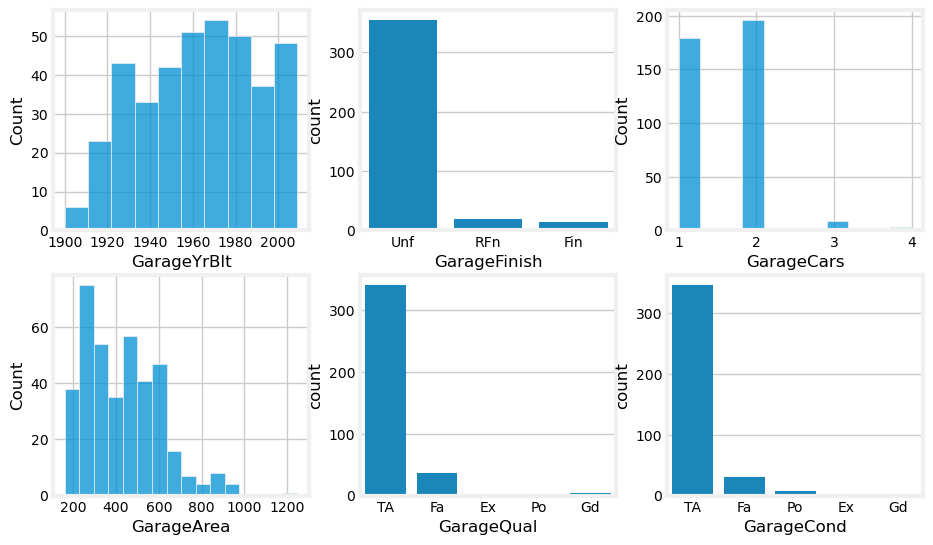

In [133]:
train_slice = data_train[garage_cols][data_train['GarageType'] == 'Detchd']

display(train_slice)

fig, axs = plt.subplots(2, 3, figsize=(10,6))

sns.histplot(data=train_slice, x='GarageYrBlt', ax=axs[0,0])
sns.countplot(data=train_slice, x='GarageFinish', ax=axs[0,1])
sns.histplot(data=train_slice, x='GarageCars', ax=axs[0,2])

sns.histplot(data=train_slice, x='GarageArea', ax=axs[1,0])
sns.countplot(data=train_slice, x='GarageQual', ax=axs[1,1])
sns.countplot(data=train_slice, x='GarageCond', ax=axs[1,2])

del train_slice, fig, axs

So we have a clear answer for what to impute for `'GarageFinish'`, `'GarageQual'`, and `'GarageCond'`. What about `'GarageYrBlt'`, `'GarageCars'`, and `'GarageArea'`?

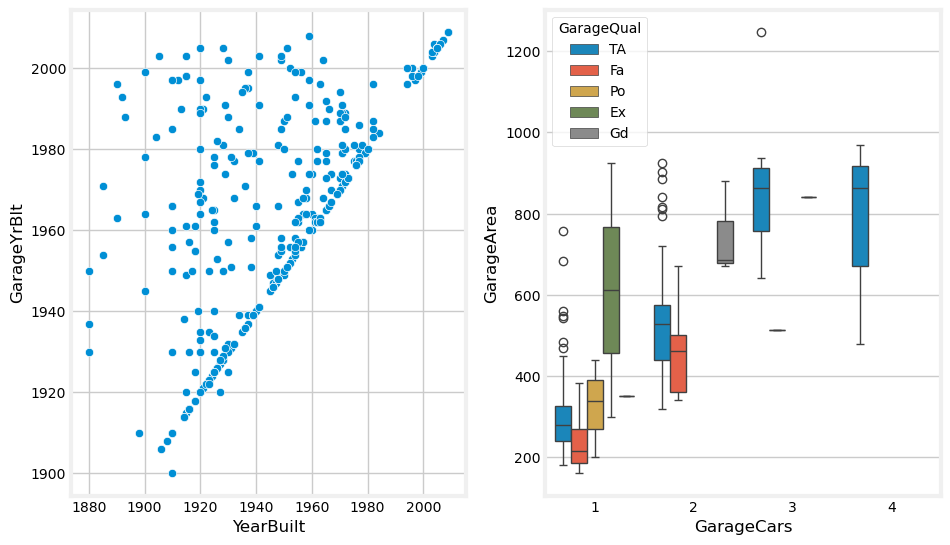

In [134]:
train_slice = data_train[data_train['GarageType'] == 'Detchd']

fig, axs = plt.subplots(1, 2, figsize=(10,6))

sns.scatterplot(data=train_slice, x='YearBuilt', y='GarageYrBlt', ax=axs[0])
# sns.scatterplot(data=train_slice, x='YearBuilt', y='GarageArea', hue='GarageQual', ax=axs[1])
sns.boxplot(data=train_slice, x='GarageCars', y='GarageArea', hue='GarageQual', ax=axs[1])

del train_slice, fig, axs

Clearly, there is a strong correlation between the year the house unit was built, and the year the garage itself was built: they're mostly the same, particularly for more recent units (built when cars are much more widespread). We will use the median of the years a garage was built, for a given home unit age, as the imputation value.

In addition, the garage area is strongly correlated with the number of cars that can be put in there, and a garage quality of TA leads to relatively sharp predictions in both.

In [135]:
data_test[garage_cols][data_test[garage_cols].isna().any(axis=1)]

,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond
666,Detchd,NaN,NaN,1.0,360.0,NaN,NaN
1116,Detchd,NaN,NaN,NaN,NaN,NaN,NaN


In [136]:
test_nan_slice = data_test[garage_cols][data_test[garage_cols].isna().any(axis=1)]
nan_idx = test_nan_slice.index

for idx in nan_idx:

    record = test_nan_slice.loc[idx, garage_cols]
    mis_cols = record[record.isna()].index

    for col in mis_cols:
        if col == 'GarageYrBlt':
            print("row", idx, ": year house was built:", data_test.loc[idx, 'YearBuilt'])
            print("houses built the same year in the training data, and the year their garages were built:\n", data_train.loc[(data_train['YearBuilt'] == data_test.loc[idx, 'YearBuilt']) & (data_train['GarageType'] != 'NA')][['YearBuilt','GarageYrBlt']])
            imputed_value = data_train[data_train['GarageType'] != 'NA'].loc[data_train['YearBuilt'] == data_test.loc[idx, 'YearBuilt']]['GarageYrBlt'].median()
        elif col == 'GarageFinish':
            imputed_value = 'Unf'
        elif col in ['GarageQual', 'GarageCond']:
            imputed_value = 'TA'
        elif col == 'GarageCars':
            imputed_value = 1 # could have been 2?
        elif col == 'GarageArea':
            imputed_value = data_train.loc[(data_train['GarageCars'] == 1) & (data_train['GarageQual'] == 'TA')]['GarageArea'].median()

        print((idx, col), data_test.loc[idx, col], imputed_value)

        data_test.loc[idx, col] = imputed_value

del test_nan_slice, nan_idx, idx, record, mis_cols, col

row 666 : year house was built: 1910
houses built the same year in the training data, and the year their garages were built:
       YearBuilt  GarageYrBlt
79         1910       1966.0
93         1910       1900.0
246        1910       1910.0
596        1910       1930.0
740        1910       1910.0
974        1910       1997.0
986        1910       1950.0
1013       1910       1956.0
1266       1910       1960.0
1274       1910       1985.0
1408       1910       1966.0
1448       1910       1950.0
(666, 'GarageYrBlt') nan 1953.0
(666, 'GarageFinish') nan Unf
(666, 'GarageQual') nan TA
(666, 'GarageCond') nan TA
row 1116 : year house was built: 1923
houses built the same year in the training data, and the year their garages were built:
       YearBuilt  GarageYrBlt
154        1923       1923.0
179        1923       1935.0
546        1923       1950.0
807        1923       1923.0
1012       1923       1923.0
1414       1923       1922.0
(1116, 'GarageYrBlt') nan 1923.0
(1116, 'GarageFini

Done!

In [137]:
data_train[data_train['GarageType'] != 'NA'].groupby('YearBuilt')['GarageYrBlt'].median()[1910]

np.float64(1953.0)

In [138]:
data_train.loc[(data_train['GarageCars'] == 1) & (data_train['GarageQual'] == 'TA')]['GarageArea'].median()

288.0

In [139]:
data_test[garage_cols][data_test[garage_cols].isna().any(axis=1)]

,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond


Adding these features to the necessary lists:

In [140]:
column_value_strategy['GarageType'] = 'NA'

need_conditions += ['GarageFinish', 'GarageCond', 'GarageQual', 'GarageCars', 'GarageYrBlt']

groupby_cols['GarageFinish'] = 'GarageType'
groupby_cols['GarageCond'] = 'GarageFinish'
groupby_cols['GarageQual'] = 'GarageCond'
groupby_cols['GarageCars'] = 'Neighborhood'
groupby_cols['GarageYrBlt'] = 'YearBuilt'
groupby_cols['GarageArea'] = ['GarageCars', 'GarageQual']

imputation_rules += [{'condition': lambda df: (df['GarageType'] == 'NA'),
                     "column": 'GarageYrBlt',
                     'value': 0},
                     {'condition': lambda df: (df['GarageType'] == 'NA'),
                     "column": 'GarageFinish',
                     'value': 'NA'},
                     {'condition': lambda df: (df['GarageType'] == 'NA'),
                     "column": 'GarageCars',
                     'value': 0},
                     {'condition': lambda df: (df['GarageType'] == 'NA'),
                     "column": 'GarageArea',
                     'value': 0.},
                     {'condition': lambda df: (df['GarageType'] == 'NA'),
                     "column": 'GarageQual',
                     'value': 'NA'},
                     {'condition': lambda df: (df['GarageType'] == 'NA'),
                     "column": 'GarageCond',
                     'value': 'NA'},
                     {'condition': lambda df: (df['GarageType'] != 'NA'),
                     "column": 'GarageFinish',
                     'value': 'group_mode'},
                     {'condition': lambda df: (df['GarageType'] != 'NA'),
                     "column": 'GarageCond',
                     'value': 'group_mode'},
                     {'condition': lambda df: (df['GarageType'] != 'NA'),
                     "column": 'GarageQual',
                     'value': 'group_mode'},
                     {'condition': lambda df: (df['GarageType'] != 'NA'),
                     "column": 'GarageCars',
                     'value': 'group_mode'},
                     {'condition': lambda df: (df['GarageType'] != 'NA'),
                     "column": 'GarageYrBlt',
                     'value': 'group_median'},
                     {'condition': lambda df: (df['GarageType'] != 'NA'),
                     "column": 'GarageArea',
                     'value': 'group_median'}
                    ]

In [141]:
del garage_cols, garage_feat

#### `'Pool...'`

Defining all features referring to pool:

In [142]:
pool_cols = [col for col in data_train.columns if 'Pool' in col]

What percentage is missing entries?

In [143]:
for pool_feat in pool_cols:

    find_description(pool_feat)
    
    try:
        print(f"training data missing '{pool_feat}': {train_nan_cols.loc[train_nan_cols > 0][pool_feat]}, i.e. {train_nan_cols.loc[train_nan_cols > 0][pool_feat]/len(data_train) * 100:.4g}%")

        if data_train[pool_feat].dtype == 'object':
            print(f"unique values of training data: {data_train[pool_feat].unique().tolist()}")

    except:
        print(f"No missing '{pool_feat}' data in training.")

    try:
        print(f"\ntest data missing '{pool_feat}': {test_nan_cols.loc[test_nan_cols > 0][pool_feat]}, i.e. {test_nan_cols.loc[test_nan_cols > 0][pool_feat]/len(data_test) * 100:.4g}%")

        if data_test[pool_feat].dtype == 'object':
            print(f"unique values of test data: {data_test[pool_feat].unique().tolist()}")
            
    except:
        print(f"No missing '{pool_feat}' data in test.")

    print("*"*75)

PoolArea: Pool area in square feet

No missing 'PoolArea' data in training.
No missing 'PoolArea' data in test.
***************************************************************************
PoolQC: Pool quality

Ex	Excellent
Gd	Good
TA	Average/Typical
Fa	Fair
NA	No Pool

training data missing 'PoolQC': 1453, i.e. 99.52%
unique values of training data: [nan, 'Ex', 'Fa', 'Gd']

test data missing 'PoolQC': 1456, i.e. 99.79%
unique values of test data: [nan, 'Ex', 'Gd']
***************************************************************************


Almost 100% of all data is missing the pool quality feature, while no row is missing the pool area quantity. In all likelihood the former is missing because the latter is 0:

In [144]:
train_slice = data_train[pool_cols][data_train[pool_cols].isna().any(axis=1)]

display(train_slice)
display(train_slice.describe(include='all'))

del train_slice

,PoolArea,PoolQC
0,0,NaN
1,0,NaN
2,0,NaN
3,0,NaN
4,0,NaN
...,...,...
1455,0,NaN
1456,0,NaN
1457,0,NaN
1458,0,NaN


,PoolArea,PoolQC
count,1453.0,0
unique,NaN,0
top,NaN,NaN
freq,NaN,NaN
mean,0.0,NaN
std,0.0,NaN
min,0.0,NaN
25%,0.0,NaN
50%,0.0,NaN
75%,0.0,NaN


Next, the test data:

In [145]:
test_slice = data_test[pool_cols][data_test[pool_cols].isna().any(axis=1)]

display(test_slice)
display(test_slice.describe(include='all'))

del test_slice

,PoolArea,PoolQC
0,0,NaN
1,0,NaN
2,0,NaN
3,0,NaN
4,0,NaN
...,...,...
1454,0,NaN
1455,0,NaN
1456,0,NaN
1457,0,NaN


,PoolArea,PoolQC
count,1456.000000,0
unique,NaN,0
top,NaN,NaN
freq,NaN,NaN
mean,0.942995,NaN
std,21.070757,NaN
min,0.000000,NaN
25%,0.000000,NaN
50%,0.000000,NaN
75%,0.000000,NaN


There are three entries in the test data with pool area but not pool quality entry:

In [146]:
test_slice = data_test[pool_cols][(data_test['PoolArea']!= 0.) & data_test[pool_cols].isna().any(axis=1)]

display(test_slice)
display(test_slice.describe(include='all'))

del test_slice

,PoolArea,PoolQC
960,368,NaN
1043,444,NaN
1139,561,NaN


,PoolArea,PoolQC
count,3.000000,0
unique,NaN,0
top,NaN,NaN
freq,NaN,NaN
mean,457.666667,NaN
std,97.223111,NaN
min,368.000000,NaN
25%,406.000000,NaN
50%,444.000000,NaN
75%,502.500000,NaN


This makes our job very easy:

In [147]:
imputed_value = 'NA'

# for training data
train_slice = data_train[(data_train['PoolArea'] == 0.) & data_train[pool_cols].isna().any(axis=1)]
data_train.loc[train_slice.index, 'PoolQC'] = data_train.loc[train_slice.index, 'PoolQC'].fillna(imputed_value)

# for test data
test_slice = data_test[(data_test['PoolArea'] == 0.) & data_test[pool_cols].isna().any(axis=1)]
data_test.loc[test_slice.index, 'PoolQC'] = data_test.loc[test_slice.index, 'PoolQC'].fillna(imputed_value)

del imputed_value, train_slice, test_slice

Done with training:

In [148]:
data_train[pool_cols][data_train[pool_cols].isna().any(axis=1)]

,PoolArea,PoolQC


Almost done with test!

In [149]:
data_test[pool_cols][data_test[pool_cols].isna().any(axis=1)]

,PoolArea,PoolQC
960,368,NaN
1043,444,NaN
1139,561,NaN


Let us look more closely at the population of homes with pools. There are very few!

In [150]:
print("homes with pools:", len(data_train[data_train['PoolArea'] > 0.]))

homes with pools: 7


And, as shown below, pool area has little impact on the price of the sale:

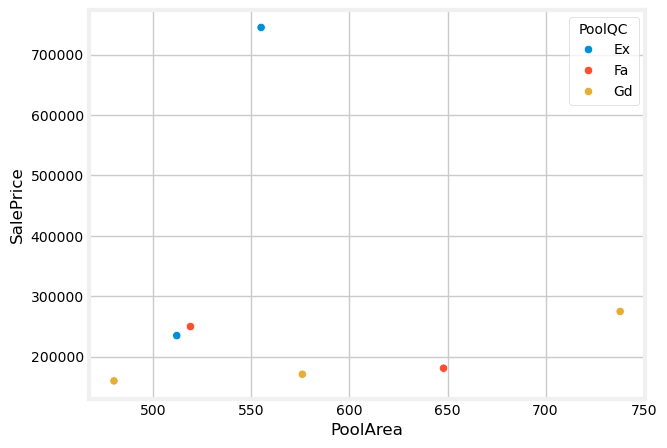

In [151]:
train_slice = data_train[data_train['PoolArea'] > 0.]

sns.scatterplot(data=train_slice, x='PoolArea', y='SalePrice', hue='PoolQC')

del train_slice

Let us now look at the pool quality vs area:

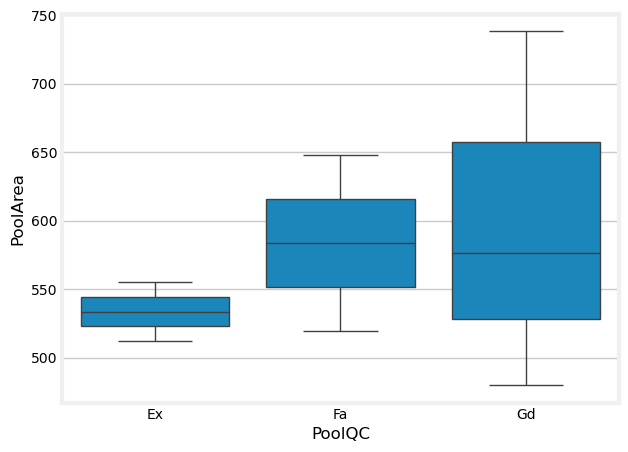

In [152]:
train_slice = data_train[data_train['PoolArea'] > 0.]

sns.boxplot(data=train_slice, x='PoolQC', y='PoolArea')

del train_slice

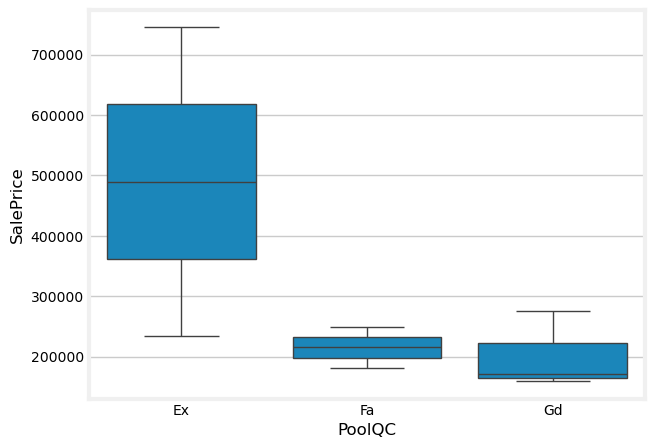

In [153]:
train_slice = data_train[data_train['PoolArea'] > 0.]

sns.boxplot(data=train_slice, x='PoolQC', y='SalePrice')

del train_slice

Since the "good" quality has the smallest bearing on the area (many pool areas can be of good quality), and the whole pool feature has such little importance, let us just impute a 'Gd' value and call it a day.

In [154]:
imputed_value = 'Gd'

test_slice = data_test[pool_cols][(data_test['PoolArea']!= 0.) & data_test[pool_cols].isna().any(axis=1)]

data_test.loc[test_slice.index, 'PoolQC'] = data_test.loc[test_slice.index, 'PoolQC'].fillna(imputed_value)

del imputed_value, test_slice

Done!

In [155]:
data_test[pool_cols][data_test[pool_cols].isna().any(axis=1)]

,PoolArea,PoolQC


Adding these features to their corresponding lists:

In [156]:
need_conditions += ['PoolQC']

imputation_rules += [{'condition': lambda df: (df['PoolArea'] == 0.),
                     "column": 'PoolQC',
                     'value': 'NA'},
                     {'condition': lambda df: (df['PoolArea'] > 0.),
                     "column": 'PoolQC',
                     'value': 'Gd'}
                    ]

In [157]:
del pool_cols, pool_feat

#### `'Fence'`

Defining all features referring to fence:

In [158]:
fence_cols = [col for col in data_train.columns if 'ence' in col]

What percentage is missing entries?

In [159]:
for fence_feat in fence_cols:

    find_description(fence_feat)
    
    try:
        print(f"training data missing '{fence_feat}': {train_nan_cols.loc[train_nan_cols > 0][fence_feat]}, i.e. {train_nan_cols.loc[train_nan_cols > 0][fence_feat]/len(data_train) * 100:.4g}%")

        if data_train[fence_feat].dtype == 'object':
            print(f"unique values of training data: {data_train[fence_feat].unique().tolist()}")

    except:
        print(f"No missing '{fence_feat}' data in training.")

    try:
        print(f"\ntest data missing '{fence_feat}': {test_nan_cols.loc[test_nan_cols > 0][fence_feat]}, i.e. {test_nan_cols.loc[test_nan_cols > 0][fence_feat]/len(data_test) * 100:.4g}%")

        if data_test[fence_feat].dtype == 'object':
            print(f"unique values of test data: {data_test[fence_feat].unique().tolist()}")
            
    except:
        print(f"No missing '{fence_feat}' data in test.")

    print("*"*75)

Fence: Fence quality

GdPrv	Good Privacy
MnPrv	Minimum Privacy
GdWo	Good Wood
MnWw	Minimum Wood/Wire
NA	No Fence

training data missing 'Fence': 1179, i.e. 80.75%
unique values of training data: [nan, 'MnPrv', 'GdWo', 'GdPrv', 'MnWw']

test data missing 'Fence': 1169, i.e. 80.12%
unique values of test data: ['MnPrv', nan, 'GdPrv', 'GdWo', 'MnWw']
***************************************************************************


About 80% of all data is missing the fence quality. In all likelihood it's because there is no fence, since there is no 'NA' value in the list of categories shown.

In [160]:
train_slice = data_train[fence_cols][data_train[fence_cols].isna().any(axis=1)]

display(train_slice)
display(train_slice.describe(include='all'))

del train_slice

,Fence
0,NaN
1,NaN
2,NaN
3,NaN
4,NaN
...,...
1453,NaN
1454,NaN
1455,NaN
1458,NaN


,Fence
count,0
unique,0
top,NaN
freq,NaN


In [161]:
test_slice = data_test[fence_cols][data_test[fence_cols].isna().any(axis=1)]

display(test_slice)
display(test_slice.describe(include='all'))

del test_slice

,Fence
1,NaN
3,NaN
4,NaN
5,NaN
7,NaN
...,...
1452,NaN
1454,NaN
1455,NaN
1456,NaN


,Fence
count,0
unique,0
top,NaN
freq,NaN


This makes our jobs super easy: simply impute 'NA'.

In [162]:
# for the training data
data_train.loc[:,'Fence'].fillna('NA', inplace=True)

# for the test data
data_test.loc[:,'Fence'].fillna('NA', inplace=True)

/tmp/ipykernel_13729/2043062801.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data_train.loc[:,'Fence'].fillna('NA', inplace=True)
/tmp/ipykernel_13729/2043062801.py:5: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)'

In [163]:
train_slice = data_train[fence_cols][data_train[fence_cols].isna().any(axis=1)]
display(train_slice)

test_slice = data_test[fence_cols][data_test[fence_cols].isna().any(axis=1)]
display(test_slice)

del train_slice, test_slice

,Fence


,Fence


Adding this to list of straightforward 'NA's:

In [164]:
column_value_strategy['Fence'] = 'NA'

In [165]:
del fence_cols, fence_feat

#### `'MiscFeature'`

Defining all features referring to a miscellaneous feature:

In [166]:
cols = [col for col in data_train.columns if 'isc' in col]

What percentage is missing entries?

In [167]:
for feat in cols:

    find_description(feat)
    
    try:
        print(f"training data missing '{feat}': {train_nan_cols.loc[train_nan_cols > 0][feat]}, i.e. {train_nan_cols.loc[train_nan_cols > 0][feat]/len(data_train) * 100:.4g}%")

        if data_train[feat].dtype == 'object':
            print(f"unique values of training data: {data_train[feat].unique().tolist()}")

    except:
        print(f"No missing '{feat}' data in training.")

    try:
        print(f"\ntest data missing '{feat}': {test_nan_cols.loc[test_nan_cols > 0][feat]}, i.e. {test_nan_cols.loc[test_nan_cols > 0][feat]/len(data_test) * 100:.4g}%")

        if data_test[feat].dtype == 'object':
            print(f"unique values of test data: {data_test[feat].unique().tolist()}")
            
    except:
        print(f"No missing '{feat}' data in test.")

    print("*"*75)

MiscFeature: Miscellaneous feature not covered in other categories

Elev	Elevator
Gar2	2nd Garage (if not described in garage section)
Othr	Other
Shed	Shed (over 100 SF)
TenC	Tennis Court
NA	None

training data missing 'MiscFeature': 1406, i.e. 96.3%
unique values of training data: [nan, 'Shed', 'Gar2', 'Othr', 'TenC']

test data missing 'MiscFeature': 1408, i.e. 96.5%
unique values of test data: [nan, 'Gar2', 'Shed', 'Othr']
***************************************************************************
MiscVal: $Value of miscellaneous feature

No missing 'MiscVal' data in training.
No missing 'MiscVal' data in test.
***************************************************************************


Almost 100% of all data is missing the `'MiscFeature'` value, although no records are missing the `'MiscVal'` column. In all likelihood it's because there is no miscellaneous feature, since there is no 'NA' value in the list of categories shown.

In [168]:
train_slice = data_train[cols][data_train[cols].isna().any(axis=1)]

display(train_slice)
display(train_slice.describe(include='all'))

del train_slice

,MiscFeature,MiscVal
0,NaN,0
1,NaN,0
2,NaN,0
3,NaN,0
4,NaN,0
...,...,...
1454,NaN,0
1455,NaN,0
1456,NaN,0
1458,NaN,0


,MiscFeature,MiscVal
count,0,1406.0
unique,0,NaN
top,NaN,NaN
freq,NaN,NaN
mean,NaN,0.0
std,NaN,0.0
min,NaN,0.0
25%,NaN,0.0
50%,NaN,0.0
75%,NaN,0.0


In [169]:
test_slice = data_test[cols][data_test[cols].isna().any(axis=1)]

display(test_slice)
display(test_slice.describe(include='all'))

del test_slice

,MiscFeature,MiscVal
0,NaN,0
2,NaN,0
3,NaN,0
4,NaN,0
5,NaN,0
...,...,...
1453,NaN,0
1454,NaN,0
1455,NaN,0
1456,NaN,0


,MiscFeature,MiscVal
count,0,1408.000000
unique,0,NaN
top,NaN,NaN
freq,NaN,NaN
mean,NaN,12.073864
std,NaN,453.051522
min,NaN,0.000000
25%,NaN,0.000000
50%,NaN,0.000000
75%,NaN,0.000000


From the description it is evident that there are some rows in the test dataset that, despite having a non-zero MiscVal, they still have no record of what the MiscFeature was. It's only one row:

In [170]:
data_test[cols][(data_test['MiscFeature'].isna()) & (data_test['MiscVal'] > 0)]

,MiscFeature,MiscVal
1089,NaN,17000


Let us perform the imputation for the records with missing MiscFeature because there isn't one:

In [171]:
imputed_value = 'NA'

# training data with missing MiscFeature and MiscVal=0
slice_train = data_train[(data_train['MiscFeature'].isna()) & ((data_train['MiscVal'] == 0))]

# imputing 'NA' to that data:
data_train.loc[slice_train.index, 'MiscFeature'] = data_train.loc[slice_train.index, 'MiscFeature'].fillna(imputed_value)

# test data with missing MiscFeature and MiscVal=0
slice_test = data_test[(data_test['MiscFeature'].isna()) & ((data_test['MiscVal'] == 0))]

# imputing 'NA' to that data:
data_test.loc[slice_test.index, 'MiscFeature'] = data_test.loc[slice_test.index, 'MiscFeature'].fillna(imputed_value)

del imputed_value, slice_train, slice_test

Almost done!

In [172]:
train_slice = data_train[cols][data_train[cols].isna().any(axis=1)]
test_slice = data_test[cols][data_test[cols].isna().any(axis=1)]

display(train_slice)
display(test_slice)

del train_slice, test_slice

,MiscFeature,MiscVal


,MiscFeature,MiscVal
1089,NaN,17000


First, let us see how does having a MiscFeature correlate with the price, to see if we should be worried (it's but one record with missing MiscFeat, so it shouldn't matter much). As we can see, there is almost no correlation: all kinds of MiscFeatures give roughly the same SalePrice.

<Axes: xlabel='MiscFeature', ylabel='SalePrice'>

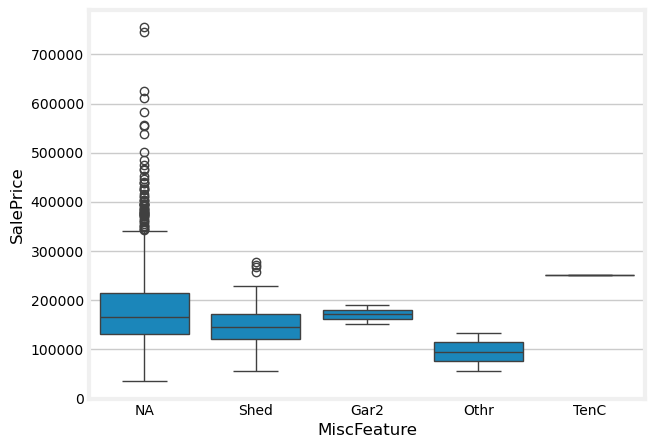

In [173]:
sns.boxplot(data=data_train, x='MiscFeature', y='SalePrice')

Let us now plot how both features correlate:

<Axes: xlabel='MiscVal', ylabel='SalePrice'>

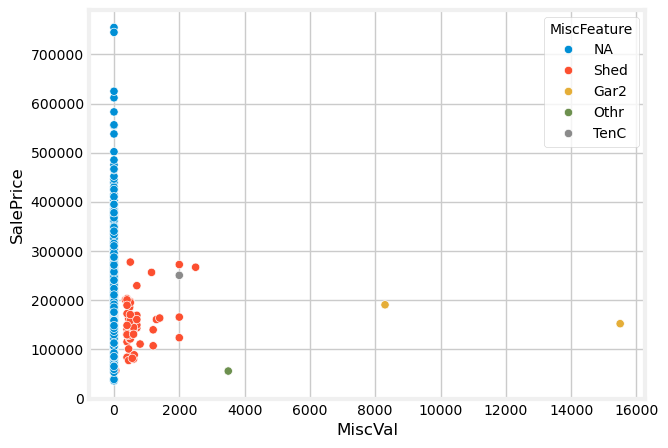

In [174]:
sns.scatterplot(data=data_train, x='MiscVal', y='SalePrice', hue='MiscFeature')

Finally, let us see what are the most common features:

MiscFeature
Shed    49
Gar2     2
Othr     2
TenC     1
Name: count, dtype: int64


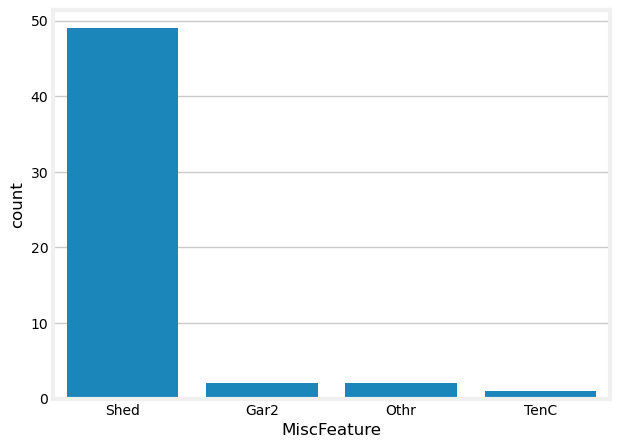

In [175]:
slice_train = data_train[data_train['MiscFeature'] != 'NA']

sns.countplot(data=slice_train, x='MiscFeature')

print(slice_train['MiscFeature'].value_counts())

del slice_train

Thus, in the overwhelming number of cases, the additional feature is a Shed. It is the mode! Thus, let us use that for imputation

In [176]:
# defining the imputed value
imputed_value = data_train[data_train['MiscFeature'] != 'NA']['MiscFeature'].mode()[0]
print(imputed_value)

# imputing it to our test data:
test_slice = data_test[cols][data_test[cols].isna().any(axis=1)]
data_test.loc[test_slice.index, 'MiscFeature'] = data_test.loc[test_slice.index, 'MiscFeature'].fillna(imputed_value)

del test_slice

Shed


Done!

In [177]:
test_slice = data_test[cols][data_test[cols].isna().any(axis=1)]

display(test_slice)

del test_slice

,MiscFeature,MiscVal


Adding the feature to the lists:

In [178]:
need_conditions += ['MiscFeature']

imputation_rules += [{'condition': lambda df: (df['MiscVal'] == 0.),
                     "column": 'MiscFeature',
                     'value': 'NA'},
                     {'condition': lambda df: (df['MiscVal'] > 0.),
                     "column": 'MiscFeature',
                     'value': 'mode'}
                    ]

In [179]:
del cols, feat

#### `'LotFrontage'`

Defining all features referring to a miscellaneous feature:

In [180]:
cols = [col for col in data_train.columns if 'Lot' in col]
print(cols)

['LotFrontage', 'LotArea', 'LotShape', 'LotConfig']


What percentage is missing entries?

In [181]:
for feat in cols:

    find_description(feat)
    
    try:
        print(f"training data missing '{feat}': {train_nan_cols.loc[train_nan_cols > 0][feat]}, i.e. {train_nan_cols.loc[train_nan_cols > 0][feat]/len(data_train) * 100:.4g}%")

        if data_train[feat].dtype == 'object':
            print(f"unique values of training data: {data_train[feat].unique().tolist()}")

    except:
        print(f"No missing '{feat}' data in training.")

    try:
        print(f"\ntest data missing '{feat}': {test_nan_cols.loc[test_nan_cols > 0][feat]}, i.e. {test_nan_cols.loc[test_nan_cols > 0][feat]/len(data_test) * 100:.4g}%")

        if data_test[feat].dtype == 'object':
            print(f"unique values of test data: {data_test[feat].unique().tolist()}")
            
    except:
        print(f"No missing '{feat}' data in test.")

    print("*"*75)

LotFrontage: Linear feet of street connected to property

training data missing 'LotFrontage': 259, i.e. 17.74%

test data missing 'LotFrontage': 227, i.e. 15.56%
***************************************************************************
LotArea: Lot size in square feet

No missing 'LotArea' data in training.
No missing 'LotArea' data in test.
***************************************************************************
LotShape: General shape of property

Reg	Regular
IR1	Slightly irregular
IR2	Moderately Irregular
IR3	Irregular

No missing 'LotShape' data in training.
No missing 'LotShape' data in test.
***************************************************************************
LotConfig: Lot configuration

Inside	Inside lot
Corner	Corner lot
CulDSac	Cul-de-sac
FR2	Frontage on 2 sides of property
FR3	Frontage on 3 sides of property

No missing 'LotConfig' data in training.
No missing 'LotConfig' data in test.
***************************************************************************


About 16% of all data is missing the `'LotFrontage'` value, although no records are missing of all other `'Lot...'` columns. To what is this due?

Let us look first at the distribution of frontage for different lot configurations, see if some peak more towards 0 (a possible explanation)

['Inside' 'FR2' 'Corner' 'CulDSac' 'FR3']


<Axes: xlabel='LotFrontage', ylabel='Count'>

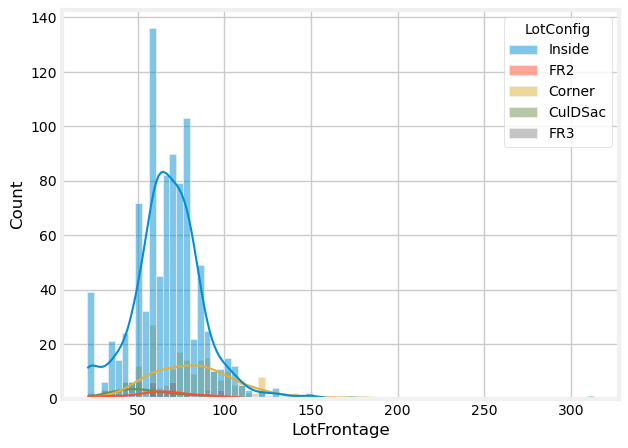

In [182]:
print(data_train['LotConfig'].unique())
sns.histplot(data_train, x='LotFrontage', hue='LotConfig', kde=True)
# sns.kdeplot(data_train, x='LotFrontage', hue='LotConfig')

<Axes: xlabel='LotConfig', ylabel='LotFrontage'>

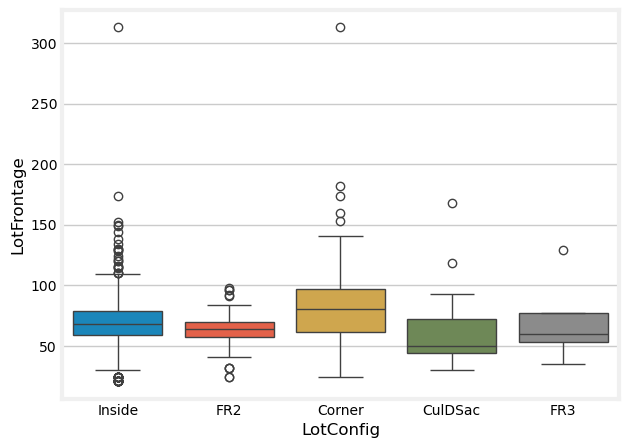

In [183]:
sns.boxplot(data=data_train, x='LotConfig', y='LotFrontage', hue='LotConfig')

As we can see, not really: all kinds of lot configurations lead to all sorts of frontage. Let us further explore the data w/ and w/o missing lot frontage values:

In [184]:
train_slice = data_train[data_train['LotFrontage'].isna()][cols]
train_slice2 = data_train[data_train['LotFrontage'].isna() == False][cols]

print("LotFrontage = NaN")
display(train_slice)
display(train_slice.describe(include='all'))

print("LotFrontage != NaN")
display(train_slice2)
display(train_slice2.describe(include='all'))

del train_slice, train_slice2

LotFrontage = NaN


,LotFrontage,LotArea,LotShape,LotConfig
7,NaN,10382,IR1,Corner
12,NaN,12968,IR2,Inside
14,NaN,10920,IR1,Corner
16,NaN,11241,IR1,CulDSac
24,NaN,8246,IR1,Inside
...,...,...,...,...
1429,NaN,12546,IR1,Corner
1431,NaN,4928,IR1,Inside
1441,NaN,4426,Reg,Inside
1443,NaN,8854,Reg,Inside


,LotFrontage,LotArea,LotShape,LotConfig
count,0.0,259.000000,259,259
unique,NaN,NaN,4,4
top,NaN,NaN,IR1,Inside
freq,NaN,NaN,167,134
mean,NaN,13137.370656,NaN,NaN
std,NaN,16215.264451,NaN,NaN
min,NaN,1974.000000,NaN,NaN
25%,NaN,8065.500000,NaN,NaN
50%,NaN,10624.000000,NaN,NaN
75%,NaN,13018.500000,NaN,NaN


LotFrontage != NaN


,LotFrontage,LotArea,LotShape,LotConfig
0,65.0,8450,Reg,Inside
1,80.0,9600,Reg,FR2
2,68.0,11250,IR1,Inside
3,60.0,9550,IR1,Corner
4,84.0,14260,IR1,FR2
...,...,...,...,...
1455,62.0,7917,Reg,Inside
1456,85.0,13175,Reg,Inside
1457,66.0,9042,Reg,Inside
1458,68.0,9717,Reg,Inside


,LotFrontage,LotArea,LotShape,LotConfig
count,1201.000000,1201.000000,1201,1201
unique,NaN,NaN,4,5
top,NaN,NaN,Reg,Inside
freq,NaN,NaN,851,918
mean,70.049958,9951.698585,NaN,NaN
std,24.284752,7924.353975,NaN,NaN
min,21.000000,1300.000000,NaN,NaN
25%,59.000000,7420.000000,NaN,NaN
50%,69.000000,9262.000000,NaN,NaN
75%,80.000000,11249.000000,NaN,NaN


Let us now focus on how the data is split between configurations, depending on whether there is frontage or not:

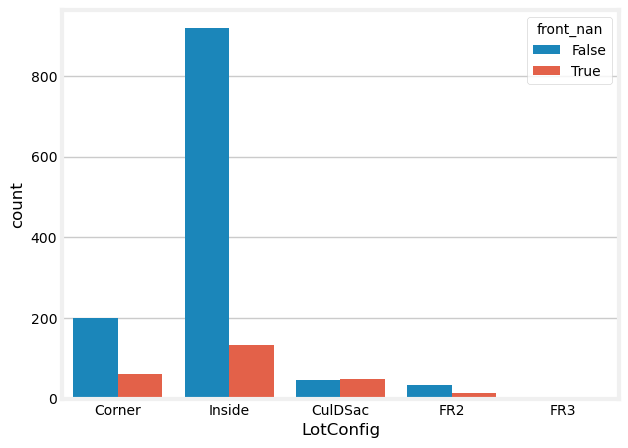

In [185]:
train_slice = data_train[data_train['LotFrontage'].isna()][cols]
train_slice2 = data_train[data_train['LotFrontage'].isna() == False][cols]

train_slice['front_nan'] = True
train_slice2['front_nan'] = False

train_slice = pd.concat([train_slice, train_slice2], axis=0, ignore_index=True)

sns.countplot(data=train_slice, x='LotConfig', hue='front_nan')

del train_slice, train_slice2

There is nothing particularly noteworthy about the data entries with missing lot frontage: they seem to be evenly distributed accross different kinds of lot configurations. Let us now look at the lot shape:

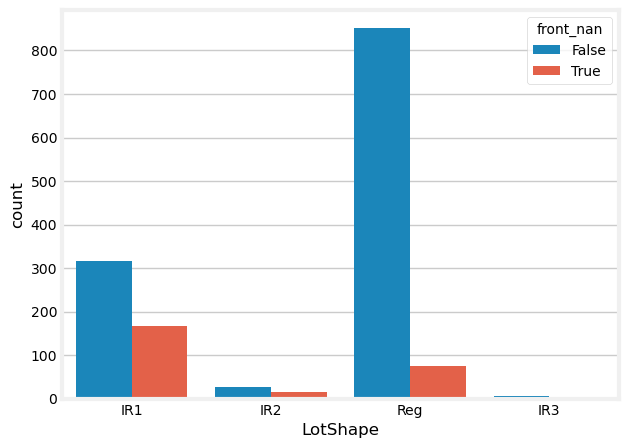

In [186]:
train_slice = data_train[data_train['LotFrontage'].isna()][cols]
train_slice2 = data_train[data_train['LotFrontage'].isna() == False][cols]

train_slice['front_nan'] = True
train_slice2['front_nan'] = False

train_slice = pd.concat([train_slice, train_slice2], axis=0, ignore_index=True)

sns.countplot(data=train_slice, x='LotShape', hue='front_nan')

del train_slice, train_slice2

And now, the lot area:

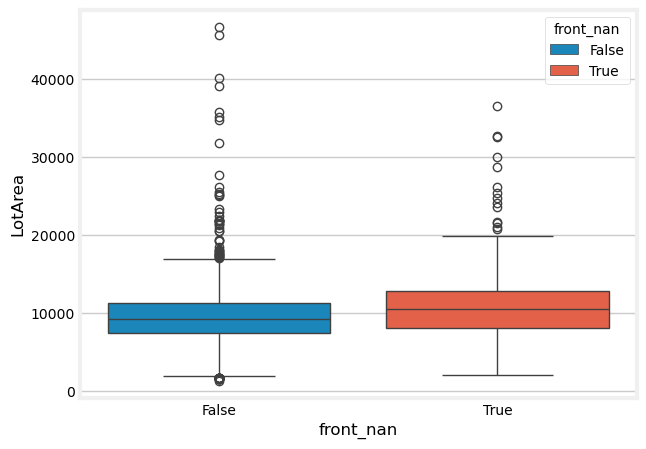

In [187]:
train_slice = data_train[data_train['LotFrontage'].isna()][cols]
train_slice2 = data_train[data_train['LotFrontage'].isna() == False][cols]

train_slice['front_nan'] = True
train_slice2['front_nan'] = False

train_slice = pd.concat([train_slice, train_slice2], axis=0, ignore_index=True)

# sns.boxplot(data=train_slice, y='LotArea', x='front_nan', hue='front_nan')
sns.boxplot(data=train_slice[train_slice['LotArea'] < 50000], y='LotArea', x='front_nan', hue='front_nan')

del train_slice, train_slice2

Really no difference at all. Then our guess is simply that this data was not recorded. We shall impute it by extracting the median lot frontage from each neighborhood and imputing that.

First, let's make sure that all the neighbors are represented in both the training and testing datasets:

In [188]:
set(data_train.Neighborhood.unique().tolist()) == set(data_test.Neighborhood.unique().tolist())

True

Next, we compute the median lot frontage from each neighborhood, relying of course on the training data only.

In [189]:
lotfront_neigh_medians = data_train[data_train['LotFrontage'].isna() == False].groupby('Neighborhood')['LotFrontage'].median()

display(lotfront_neigh_medians)

def lotfront_medians_fn(neigh):
    """
    A function that returns the median of the lot frontage given a neighborhood.
    """
    return lotfront_neigh_medians[neigh]

Neighborhood
Blmngtn    43.0
Blueste    24.0
BrDale     21.0
BrkSide    52.0
ClearCr    80.0
CollgCr    70.0
Crawfor    74.0
Edwards    65.5
Gilbert    65.0
IDOTRR     60.0
MeadowV    21.0
Mitchel    73.0
NAmes      73.0
NPkVill    24.0
NWAmes     80.0
NoRidge    91.0
NridgHt    88.5
OldTown    60.0
SWISU      60.0
Sawyer     71.0
SawyerW    66.5
Somerst    73.5
StoneBr    61.5
Timber     85.0
Veenker    68.0
Name: LotFrontage, dtype: float64

In [190]:
# for the training data
train_nan_idx = data_train[data_train['LotFrontage'].isna()]['LotFrontage'].index
data_train['LotFrontage'] = data_train.groupby('Neighborhood')['LotFrontage'].transform(lambda x: x.fillna(x.median()))

# for the testing data
test_nan_idx = data_test[data_test['LotFrontage'].isna()]['LotFrontage'].index
data_test.loc[test_nan_idx, 'LotFrontage'] = np.array(lotfront_medians_fn(data_test.loc[test_nan_idx, 'Neighborhood']))

del train_nan_idx, test_nan_idx

Done!

In [191]:
train_slice = data_train[data_train['LotFrontage'].isna()][cols]
display(train_slice)

test_slice = data_test[data_test['LotFrontage'].isna()][cols]
display(test_slice)

del train_slice, test_slice

,LotFrontage,LotArea,LotShape,LotConfig


,LotFrontage,LotArea,LotShape,LotConfig


In [192]:
column_value_strategy['LotFrontage'] = 'group_median'
groupby_cols['LotFrontage'] = 'Neighborhood'

In [193]:
del cols, feat

#### `'Electrical'`

Defining all features referring to electrical feature:

In [194]:
cols = [col for col in data_train.columns if 'Electrical' in col]
print(cols)

['Electrical']


What percentage is missing entries?

In [195]:
for feat in cols:

    find_description(feat)
    
    try:
        print(f"training data missing '{feat}': {train_nan_cols.loc[train_nan_cols > 0][feat]}, i.e. {train_nan_cols.loc[train_nan_cols > 0][feat]/len(data_train) * 100:.4g}%")

        if data_train[feat].dtype == 'object':
            print(f"unique values of training data: {data_train[feat].unique().tolist()}")

    except:
        print(f"No missing '{feat}' data in training.")

    try:
        print(f"\ntest data missing '{feat}': {test_nan_cols.loc[test_nan_cols > 0][feat]}, i.e. {test_nan_cols.loc[test_nan_cols > 0][feat]/len(data_test) * 100:.4g}%")

        if data_test[feat].dtype == 'object':
            print(f"unique values of test data: {data_test[feat].unique().tolist()}")
            
    except:
        print(f"No missing '{feat}' data in test.")

    print("*"*75)

Electrical: Electrical system

SBrkr	Standard Circuit Breakers & Romex
FuseA	Fuse Box over 60 AMP and all Romex wiring (Average)
FuseF	60 AMP Fuse Box and mostly Romex wiring (Fair)
FuseP	60 AMP Fuse Box and mostly knob & tube wiring (poor)
Mix	Mixed

training data missing 'Electrical': 1, i.e. 0.06849%
unique values of training data: ['SBrkr', 'FuseF', 'FuseA', 'FuseP', 'Mix', nan]
No missing 'Electrical' data in test.
***************************************************************************


Not even 1% of the training data is missing the `'Electrical'` value. The overwhelming kind of electrical circuit value is 'SBrkr':

<Axes: xlabel='Electrical', ylabel='count'>

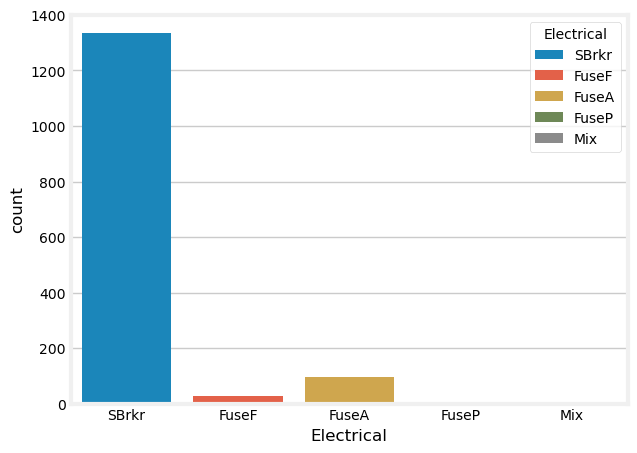

In [196]:
sns.countplot(data=data_train, x='Electrical', hue='Electrical')

And there is no correlation between it and sale price:

<Axes: xlabel='Electrical', ylabel='SalePrice'>

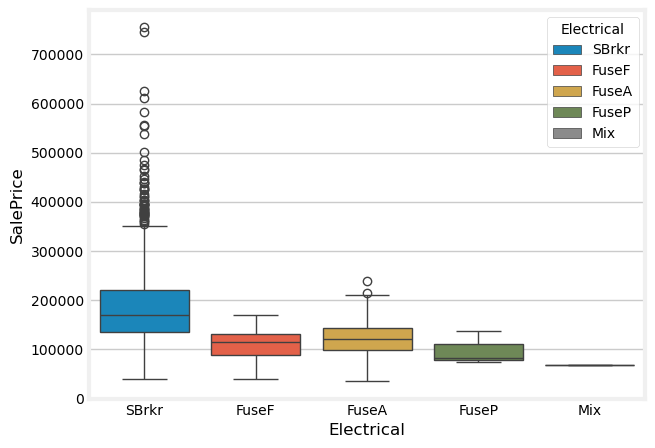

In [197]:
sns.boxplot(data=data_train, x='Electrical', y='SalePrice', hue='Electrical')

We shall impute that value:

In [198]:
imputed_value = data_train['Electrical'].mode()[0]
print(imputed_value)

data_train['Electrical'].fillna(imputed_value, inplace=True)

del imputed_value

SBrkr


/tmp/ipykernel_13729/2829043921.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data_train['Electrical'].fillna(imputed_value, inplace=True)


Done!

In [199]:
data_train[data_train['Electrical'].isna()]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice


Adding this to the lists:

In [200]:
column_value_strategy['Electrical'] = 'mode'

In [201]:
del cols, feat

#### `'MSZoning'`

Defining all features referring to the feature:

In [202]:
cols = [col for col in data_train.columns if 'MS' in col]
print(cols)

['MSSubClass', 'MSZoning']


What percentage is missing entries?

In [203]:
for feat in cols:

    find_description(feat)
    
    try:
        print(f"training data missing '{feat}': {train_nan_cols.loc[train_nan_cols > 0][feat]}, i.e. {train_nan_cols.loc[train_nan_cols > 0][feat]/len(data_train) * 100:.4g}%")

        if data_train[feat].dtype == 'object':
            print(f"unique values of training data: {data_train[feat].unique().tolist()}")

    except:
        print(f"No missing '{feat}' data in training.")

    try:
        print(f"\ntest data missing '{feat}': {test_nan_cols.loc[test_nan_cols > 0][feat]}, i.e. {test_nan_cols.loc[test_nan_cols > 0][feat]/len(data_test) * 100:.4g}%")

        if data_test[feat].dtype == 'object':
            print(f"unique values of test data: {data_test[feat].unique().tolist()}")
            
    except:
        print(f"No missing '{feat}' data in test.")

    print("*"*75)

MSSubClass: Identifies the type of dwelling involved in the sale.

20	1-STORY 1946 & NEWER ALL STYLES
30	1-STORY 1945 & OLDER
40	1-STORY W/FINISHED ATTIC ALL AGES
45	1-1/2 STORY - UNFINISHED ALL AGES
50	1-1/2 STORY FINISHED ALL AGES
60	2-STORY 1946 & NEWER
70	2-STORY 1945 & OLDER
75	2-1/2 STORY ALL AGES
80	SPLIT OR MULTI-LEVEL
85	SPLIT FOYER
90	DUPLEX - ALL STYLES AND AGES
120	1-STORY PUD (Planned Unit Development) - 1946 & NEWER
150	1-1/2 STORY PUD - ALL AGES
160	2-STORY PUD - 1946 & NEWER
180	PUD - MULTILEVEL - INCL SPLIT LEV/FOYER
190	2 FAMILY CONVERSION - ALL STYLES AND AGES

No missing 'MSSubClass' data in training.
No missing 'MSSubClass' data in test.
***************************************************************************
MSZoning: Identifies the general zoning classification of the sale.

A	Agriculture
C	Commercial
FV	Floating Village Residential
I	Industrial
RH	Residential High Density
RL	Residential Low Density
RP	Residential Low Density Park
RM	Residential Medium Density

Barely 0.3% of the test data is missing the `'MSZoning'` value. What is the most common MSZoning value?

<Axes: xlabel='MSZoning', ylabel='count'>

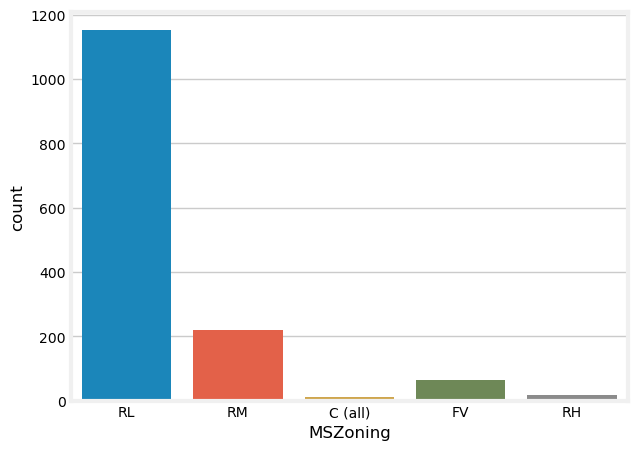

In [204]:
sns.countplot(data=data_train, x='MSZoning', hue='MSZoning')

It correlates only very weakly with the sale price:

<Axes: xlabel='MSZoning', ylabel='SalePrice'>

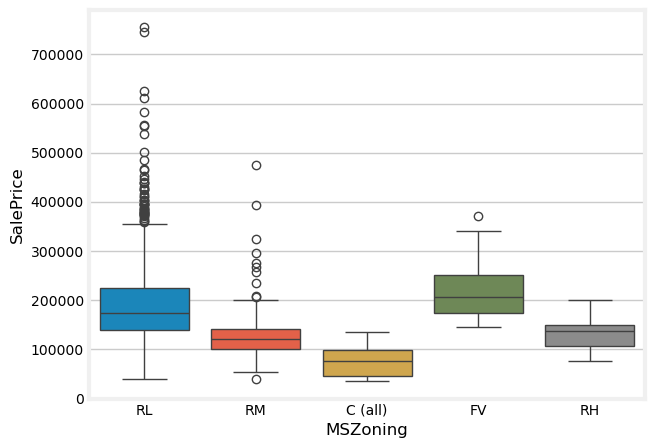

In [205]:
sns.boxplot(data=data_train, x='MSZoning', y='SalePrice', hue='MSZoning')

What we will do is look at the testing data entries with missing MSZoning, check its neighborhood, and then impute the zoning most common to that neighborhood:

In [206]:
data_test.loc[data_test[data_test['MSZoning'].isna()].index, ['Neighborhood', 'MSZoning']]

,Neighborhood,MSZoning
455,IDOTRR,NaN
756,IDOTRR,NaN
790,IDOTRR,NaN
1444,Mitchel,NaN


For those two neighborhoods, the most common zoning are RL and RM:

<Axes: xlabel='MSZoning', ylabel='count'>

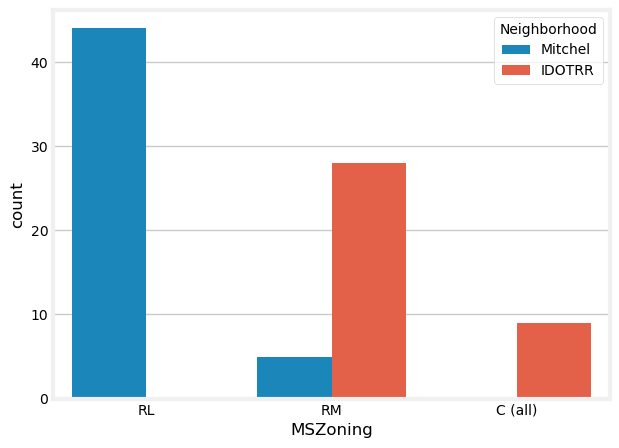

In [207]:
sns.countplot(data=data_train[data_train['Neighborhood'].isin(['IDOTRR', 'Mitchel'])], x='MSZoning', hue='Neighborhood')

We define a function that returns the most common zoning in a neighborhood (based on the training data!), which we will use for our imputation:

In [208]:
zone_neigh_series = data_train.groupby('Neighborhood')['MSZoning'].apply(lambda x: x.mode()[0])

def zone_neigh_fn(neigh):
    """
    A function that returns the most common zoning in a neighborhood.
    """

    return zone_neigh_series[neigh]

We can then perform the imputation on the test dataset:

In [209]:
# indices
test_nan_idx = data_test[data_test['MSZoning'].isna()]['LotFrontage'].index

# imputation
data_test.loc[test_nan_idx, 'MSZoning'] = np.array(zone_neigh_fn(data_test.loc[test_nan_idx, 'Neighborhood']))

Done!

In [210]:
data_test[data_test['MSZoning'].isna()]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition


Allocating this to the lists:

In [211]:
column_value_strategy['MSZoning'] = 'group_mode'
groupby_cols['MSZoning'] = 'Neighborhood'

In [212]:
del cols, feat, zone_neigh_series, test_nan_idx

#### `'Utilities'`

There is but two missing Utilities entries:

In [213]:
data_test[data_test['Utilities'].isna()]['Utilities']

455    NaN
485    NaN
Name: Utilities, dtype: object

The vast majority of the Utilities is 'AllPub'

Utilities
AllPub    1459
NoSeWa       1
Name: count, dtype: int64

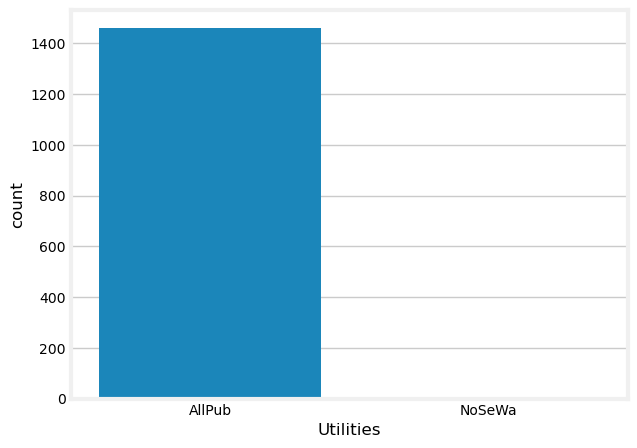

In [214]:
sns.countplot(data=data_train, x='Utilities')
data_train['Utilities'].value_counts()

So let us impute:

In [215]:
imputed_value = data_train['Utilities'].mode()[0] # imputed value from training data

# imputing value in test:
data_test.loc[:,'Utilities'].fillna(imputed_value, inplace=True)

/tmp/ipykernel_13729/3270519728.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data_test.loc[:,'Utilities'].fillna(imputed_value, inplace=True)


Done!

In [216]:
data_test[data_test['Utilities'].isna()]['Utilities']

Series([], Name: Utilities, dtype: object)

Adding the feature to the lists:

In [217]:
column_value_strategy['Utilities'] = 'mode'

In [218]:
del imputed_value

#### `'Functional'`

There is but two missing Functional values:

In [219]:
data_test[data_test['Functional'].isna()]['Functional']

756     NaN
1013    NaN
Name: Functional, dtype: object

<Axes: xlabel='Functional', ylabel='count'>

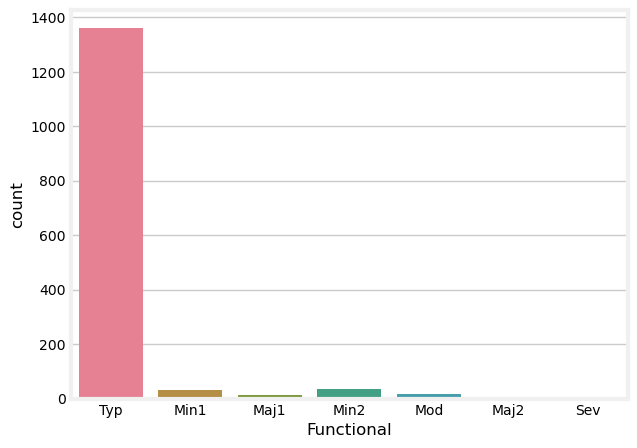

In [220]:
sns.countplot(data=data_train, x='Functional', hue='Functional')

The overwhelming majority of entries for 'Functional' are 'Typ', so let us impute that:

In [221]:
imputed_value = data_train['Functional'].mode()[0] # imputed value from training data

# imputing value in test:
data_test.loc[:,'Functional'].fillna(imputed_value, inplace=True)

/tmp/ipykernel_13729/775617255.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data_test.loc[:,'Functional'].fillna(imputed_value, inplace=True)


Done!

In [222]:
data_test[data_test['Functional'].isna()]['Functional']

Series([], Name: Functional, dtype: object)

Adding it to the lists:

In [223]:
column_value_strategy['Functional'] ='mode'

In [224]:
del imputed_value

#### `'Kitchen...'`

Defining all features referring to a miscellaneous feature:

In [225]:
cols = [col for col in data_train.columns if 'Kitchen' in col]
print(cols)

['KitchenAbvGr', 'KitchenQual']


What percentage is missing entries?

In [226]:
for feat in cols:

    find_description(feat)
    
    try:
        print(f"training data missing '{feat}': {train_nan_cols.loc[train_nan_cols > 0][feat]}, i.e. {train_nan_cols.loc[train_nan_cols > 0][feat]/len(data_train) * 100:.4g}%")

        if data_train[feat].dtype == 'object':
            print(f"unique values of training data: {data_train[feat].unique().tolist()}")

    except:
        print(f"No missing '{feat}' data in training.")

    try:
        print(f"\ntest data missing '{feat}': {test_nan_cols.loc[test_nan_cols > 0][feat]}, i.e. {test_nan_cols.loc[test_nan_cols > 0][feat]/len(data_test) * 100:.4g}%")

        if data_test[feat].dtype == 'object':
            print(f"unique values of test data: {data_test[feat].unique().tolist()}")
            
    except:
        print(f"No missing '{feat}' data in test.")

    print("*"*75)

KitchenAbvGr: Kitchens above grade

No missing 'KitchenAbvGr' data in training.
No missing 'KitchenAbvGr' data in test.
***************************************************************************
KitchenQual: Kitchen quality

Ex	Excellent
Gd	Good
TA	Typical/Average
Fa	Fair
Po	Poor

No missing 'KitchenQual' data in training.

test data missing 'KitchenQual': 1, i.e. 0.06854%
unique values of test data: ['TA', 'Gd', 'Ex', 'Fa', nan]
***************************************************************************


Less than 0.1% of all test data is missing the `'KitchenQual'` value. It's a single point:

In [227]:
test_slice = data_test[data_test['KitchenQual'].isna()]

display(test_slice[cols])

del test_slice

,KitchenAbvGr,KitchenQual
95,1,NaN


There are two very frequent KitchenQual values. Which one should we use?

<Axes: xlabel='KitchenQual', ylabel='count'>

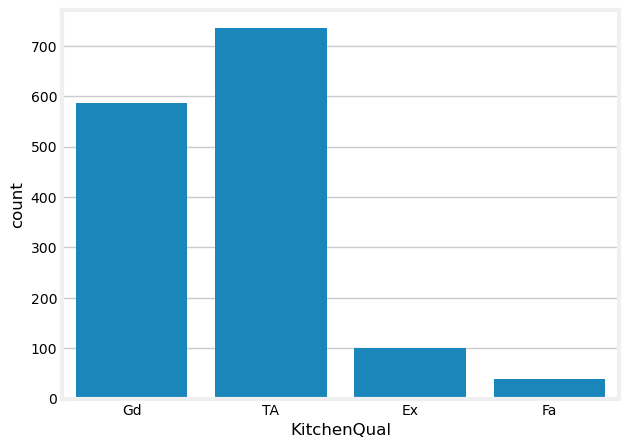

In [228]:
sns.countplot(data=data_train, x='KitchenQual')

With Cramer's V, we can show that KitchenQual is highly correlated with the ExteriorQual: Gd/TA values for ExteriorQual typucally correspond to Gd/TA values for KitchenQual:

In [229]:
cramv_dict = {}

for col in data_train.select_dtypes(include='object').columns:
    cramv_dict[col] = cramers_v(data_train['KitchenQual'], data_train[col])

cramv_cols = sorted(cramv_dict.keys(), key=cramv_dict.get, reverse=True)

for col in cramv_cols[1:6]:
    print(col+":\t", cramv_dict[col])

del cramv_cols

ExterQual:	 0.5460381182350253
Neighborhood:	 0.4443202364144705
BsmtQual:	 0.4224179700758773
Foundation:	 0.3429920934721202
CentralAir:	 0.3426753611822075


<Axes: xlabel='KitchenQual', ylabel='count'>

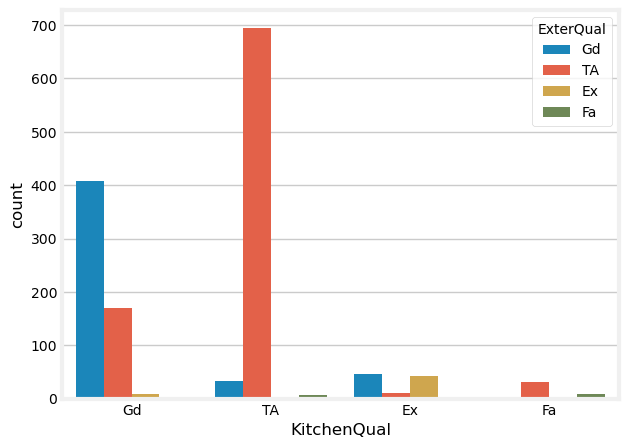

In [230]:
sns.countplot(data=data_train, x='KitchenQual', hue='ExterQual')

In [231]:
test_slice = data_test[data_test['KitchenQual'].isna()]

display(test_slice[cols+['ExterQual']])

del test_slice

,KitchenAbvGr,KitchenQual,ExterQual
95,1,NaN,TA


Therefore, we perform a simple imputation, where we first find the values to impute for KitchenQual given a value of ExterQual *from the training dataset*:

In [232]:
imputed_values = data_train.groupby('ExterQual')['KitchenQual'].apply(lambda x: x.mode()[0])
imputed_values

ExterQual
Ex    Ex
Fa    Fa
Gd    Gd
TA    TA
Name: KitchenQual, dtype: object

And then go index by index in the list of rows with NaN KitchenQual values *in the test dataset*, find its ExterQual value, read out the KitchenQual value to impute, and perform the imputation

In [233]:
test_slice = data_test[cols+['ExterQual']]

for idx in test_slice[test_slice['KitchenQual'].isna()].index:
    # print(idx, imputed_values.loc[test_slice.loc[idx, 'ExterQual']])
    data_test.loc[idx, 'KitchenQual'] = imputed_values.loc[test_slice.loc[idx, 'ExterQual']]

del test_slice

Done!

In [234]:
test_slice = data_test[data_test['KitchenQual'].isna()]

display(test_slice[cols+['ExterQual']])

del test_slice

,KitchenAbvGr,KitchenQual,ExterQual


Adding it to the list of imputation strategies:

In [235]:
column_value_strategy['KitchenQual'] = 'group_mode'
groupby_cols['KitchenQual'] = 'ExterQual'

In [236]:
del cols, feat, col, cramv_dict, imputed_values

#### `'Exterior...'`

Defining all features referring to a miscellaneous feature:

In [237]:
cols = [col for col in data_train.columns if 'Exterior' in col]
print(cols)

['Exterior1st', 'Exterior2nd']


What percentage is missing entries?

In [238]:
for feat in cols:

    find_description(feat)
    
    try:
        print(f"training data missing '{feat}': {train_nan_cols.loc[train_nan_cols > 0][feat]}, i.e. {train_nan_cols.loc[train_nan_cols > 0][feat]/len(data_train) * 100:.4g}%")

        if data_train[feat].dtype == 'object':
            print(f"unique values of training data: {data_train[feat].unique().tolist()}")

    except:
        print(f"No missing '{feat}' data in training.")

    try:
        print(f"\ntest data missing '{feat}': {test_nan_cols.loc[test_nan_cols > 0][feat]}, i.e. {test_nan_cols.loc[test_nan_cols > 0][feat]/len(data_test) * 100:.4g}%")

        if data_test[feat].dtype == 'object':
            print(f"unique values of test data: {data_test[feat].unique().tolist()}")
            
    except:
        print(f"No missing '{feat}' data in test.")

    print("*"*75)

Exterior1st: Exterior covering on house

AsbShng	Asbestos Shingles
AsphShn	Asphalt Shingles
BrkComm	Brick Common
BrkFace	Brick Face
CBlock	Cinder Block
CemntBd	Cement Board
HdBoard	Hard Board
ImStucc	Imitation Stucco
MetalSd	Metal Siding
Other	Other
Plywood	Plywood
PreCast	PreCast
Stone	Stone
Stucco	Stucco
VinylSd	Vinyl Siding
Wd Sdng	Wood Siding
WdShing	Wood Shingles

No missing 'Exterior1st' data in training.

test data missing 'Exterior1st': 1, i.e. 0.06854%
unique values of test data: ['VinylSd', 'Wd Sdng', 'HdBoard', 'Plywood', 'MetalSd', 'CemntBd', 'WdShing', 'BrkFace', 'AsbShng', 'BrkComm', 'Stucco', 'AsphShn', nan, 'CBlock']
***************************************************************************
Exterior2nd: Exterior covering on house (if more than one material)

AsbShng	Asbestos Shingles
AsphShn	Asphalt Shingles
BrkComm	Brick Common
BrkFace	Brick Face
CBlock	Cinder Block
CemntBd	Cement Board
HdBoard	Hard Board
ImStucc	Imitation Stucco
MetalSd	Metal Siding
Other	Other
Plywo

Less than 0.1% of all test data is missing the `'Exterior1st'` and `'Exterior2nd'` values. It is a single point that is missing both:

In [239]:
test_slice = data_test[data_test[cols].isna().any(axis=1)]

display(test_slice[cols])

del test_slice

,Exterior1st,Exterior2nd
691,NaN,NaN


Let us look at the distribution of this variable:

<Axes: xlabel='Exterior2nd', ylabel='count'>

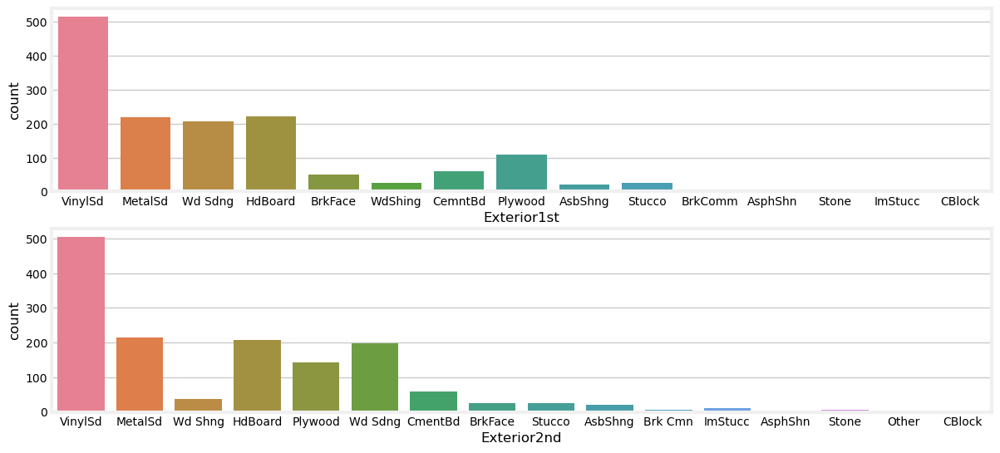

In [240]:
fig, axs = plt.subplots(2, 1, figsize=(13, 6))
sns.countplot(data=data_train, x='Exterior1st', ax=axs[0], hue='Exterior1st')
sns.countplot(data=data_train, x='Exterior2nd', ax=axs[1], hue='Exterior2nd')

Let us check what are these variables most correlated with:

In [241]:
cramv_dict = {}

for col in data_train.select_dtypes(include='object').columns:
    cramv_dict[col] = cramers_v(data_train['Exterior1st'], data_train[col])

cramv_cols = sorted(cramv_dict.keys(), key=cramv_dict.get, reverse=True)

for col in cramv_cols[1:6]:
    print(col+":\t", cramv_dict[col])

del cramv_cols

Exterior2nd:	 0.7588837555227448
ExterQual:	 0.3506278409783113
CentralAir:	 0.3487930702286513
Foundation:	 0.3145968637501217
BsmtQual:	 0.2974565125951604


How is Exterior1st distributed according to these variables?

<Axes: xlabel='Exterior1st', ylabel='count'>

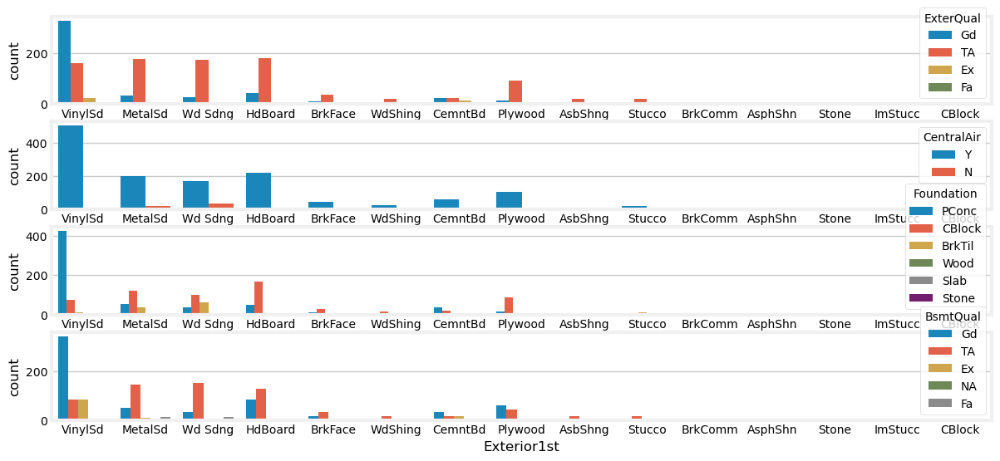

In [242]:
fig, axs = plt.subplots(4, 1, figsize=(13, 6))
sns.countplot(data=data_train, x='Exterior1st', hue='ExterQual', ax=axs[0])
sns.countplot(data=data_train, x='Exterior1st', hue='CentralAir', ax=axs[1])
sns.countplot(data=data_train, x='Exterior1st', hue='Foundation', ax=axs[2])
sns.countplot(data=data_train, x='Exterior1st', hue='BsmtQual', ax=axs[3])

If ExterQual='TA' it doesn't really help, because that value is evenly distributed accross several Exterior1st values. Similarly for CentralAir, furthermore CentralAir=N is very rare and thus hard to make predictions from.

Foundation and BsmtQual look more promising, unless BsmtQual='TA':

In [243]:
test_slice = data_test[data_test[cols].isna().any(axis=1)]

display(test_slice[cols+['ExterQual', 'Foundation', 'BsmtQual']])

del test_slice

,Exterior1st,Exterior2nd,ExterQual,Foundation,BsmtQual
691,NaN,NaN,TA,PConc,TA


Really it looks like we should rely on Foundation, and pick 'VinylSd':

In [244]:
data_train.groupby('Foundation')['Exterior1st'].apply(lambda x: x.mode()[0])

Foundation
BrkTil    Wd Sdng
CBlock    HdBoard
PConc     VinylSd
Slab      BrkFace
Stone     AsbShng
Wood      MetalSd
Name: Exterior1st, dtype: object

Once we have done that, what should Exterior2nd be?

<Axes: xlabel='Exterior2nd', ylabel='count'>

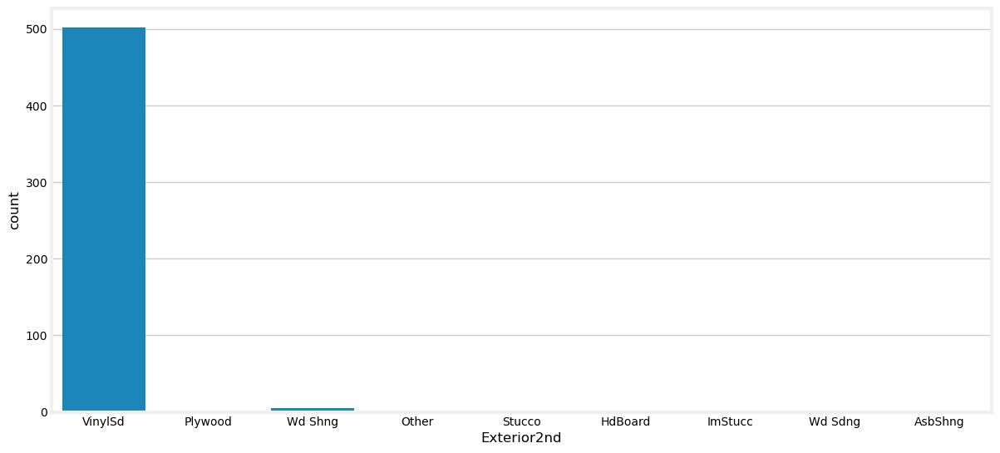

In [245]:
plt.figure(figsize=(13,6))
sns.countplot(data=data_train[data_train['Exterior1st']=='VinylSd'], x='Exterior2nd')

Clearly, the same! So let us perform the imputation:

In [246]:
imputed_value = data_train.groupby('Foundation')['Exterior1st'].apply(lambda x: x.mode()[0]).loc['PConc']

test_slice = data_test[data_test[cols].isna().any(axis=1)]

for idx in test_slice.index:
    data_test.loc[idx, 'Exterior1st'] = imputed_value
    data_test.loc[idx, 'Exterior2nd'] = imputed_value

del test_slice, idx

Done!

In [247]:
test_slice = data_test[data_test[cols].isna().any(axis=1)]

display(test_slice[cols])

del test_slice

,Exterior1st,Exterior2nd


Establishing the imputation:

In [248]:
column_value_strategy['Exterior1st'] = 'group_mode'
groupby_cols['Exterior1st'] = 'Foundation'

column_value_strategy['Exterior2nd'] = 'group_mode'
groupby_cols['Exterior2nd'] = 'Foundation'

In [249]:
del cols, feat, col, cramv_dict, imputed_value

#### `'SaleType'`

Last but not least!

Defining all features referring to a miscellaneous feature:

In [250]:
cols = [col for col in data_train.columns if 'SaleType' in col]
print(cols)

['SaleType']


What percentage is missing entries?

In [251]:
for feat in cols:

    find_description(feat)
    
    try:
        print(f"training data missing '{feat}': {train_nan_cols.loc[train_nan_cols > 0][feat]}, i.e. {train_nan_cols.loc[train_nan_cols > 0][feat]/len(data_train) * 100:.4g}%")

        if data_train[feat].dtype == 'object':
            print(f"unique values of training data: {data_train[feat].unique().tolist()}")

    except:
        print(f"No missing '{feat}' data in training.")

    try:
        print(f"\ntest data missing '{feat}': {test_nan_cols.loc[test_nan_cols > 0][feat]}, i.e. {test_nan_cols.loc[test_nan_cols > 0][feat]/len(data_test) * 100:.4g}%")

        if data_test[feat].dtype == 'object':
            print(f"unique values of test data: {data_test[feat].unique().tolist()}")
            
    except:
        print(f"No missing '{feat}' data in test.")

    print("*"*75)

SaleType: Type of sale

WD 	Warranty Deed - Conventional
CWD	Warranty Deed - Cash
VWD	Warranty Deed - VA Loan
New	Home just constructed and sold
COD	Court Officer Deed/Estate
Con	Contract 15% Down payment regular terms
ConLw	Contract Low Down payment and low interest
ConLI	Contract Low Interest
ConLD	Contract Low Down
Oth	Other

No missing 'SaleType' data in training.

test data missing 'SaleType': 1, i.e. 0.06854%
unique values of test data: ['WD', 'COD', 'New', 'ConLD', 'Oth', 'Con', 'ConLw', 'ConLI', 'CWD', nan]
***************************************************************************


Less than 0.1% of all test data is missing the `'SaleType'` value.

The overwhelming majority of counts is for 'WD':

SaleType
WD       1267
New       122
COD        43
ConLD       9
ConLI       5
ConLw       5
CWD         4
Oth         3
Con         2
Name: count, dtype: int64


<Axes: xlabel='SaleType', ylabel='SalePrice'>

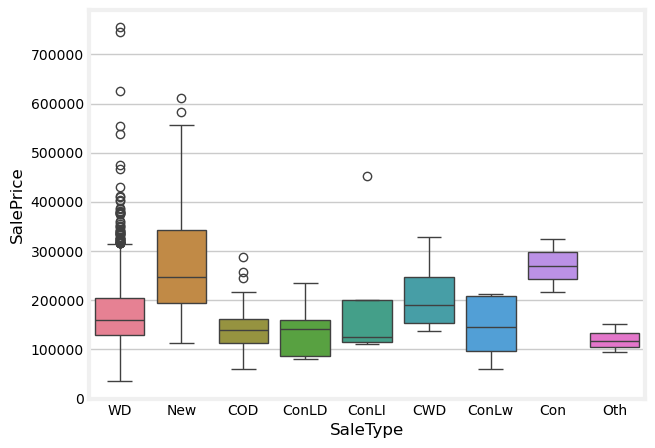

In [252]:
print(data_train['SaleType'].value_counts())

sns.boxplot(data=data_train, x='SaleType', y='SalePrice', hue='SaleType')

In [253]:
cramv_dict = {}

for col in data_train.select_dtypes(include='object').columns:
    cramv_dict[col] = cramers_v(data_train['SaleType'], data_train[col])

cramv_cols = sorted(cramv_dict.keys(), key=cramv_dict.get, reverse=True)

for col in cramv_cols[1:6]:
    print(col+":\t", cramv_dict[col])

del cramv_cols

SaleCondition:	 0.47081875888550223
ExterQual:	 0.2601498383368014
MasVnrType:	 0.22655361730676937
BsmtQual:	 0.21103766315288153
KitchenQual:	 0.209126374382579


<Axes: xlabel='SaleType', ylabel='SalePrice'>

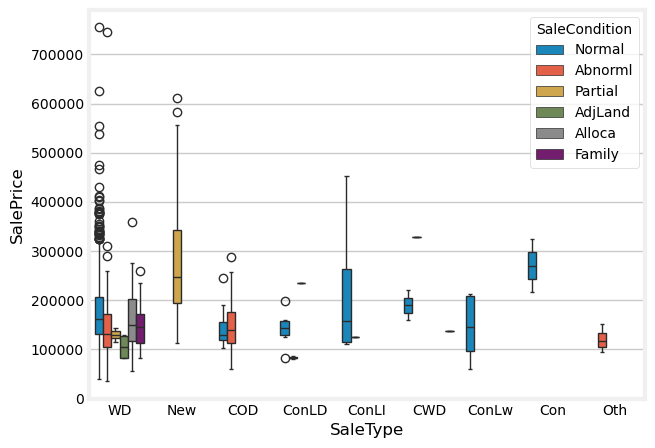

In [254]:
sns.boxplot(data=data_train, x='SaleType', y='SalePrice', hue='SaleCondition')
# sns.boxplot(data=data_train, x='SaleType', y='SalePrice', hue='ExterQual')

We should just impute 'WD', since it's so prevalent:

In [255]:
imputed_value = data_train['SaleType'].mode()[0]
print(imputed_value)

data_test['SaleType'].fillna(imputed_value, inplace=True)

WD


/tmp/ipykernel_13729/982544892.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data_test['SaleType'].fillna(imputed_value, inplace=True)


Done!

In [256]:
data_test[data_test['SaleType'].isna()][['SaleCondition', 'ExterQual']]

,SaleCondition,ExterQual


Last imputation method!

In [257]:
column_value_strategy['SaleType'] = 'mode'

In [258]:
del cols, feat, col, cramv_dict, imputed_value

#### Done!

In [259]:
print("train NaNs:")
print("."*30)
display(data_train.isna().sum(axis=0)[data_train.isna().sum(axis=0) > 0])
print("")
print("test NaNs:")
print("."*30)
display(data_test.isna().sum(axis=0)[data_test.isna().sum(axis=0) > 0])

train NaNs:
..............................


Series([], dtype: int64)


test NaNs:
..............................


Series([], dtype: int64)

### Duplicates

Now, we look for duplicates:

In [260]:
print(data_train.duplicated().sum(axis=0))
data_train[data_train.duplicated()]

0


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice


In [261]:
print(data_test.duplicated().sum(axis=0))
data_test[data_test.duplicated()]

0


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition


**No duplicates!**

### Renaming columns

The data is clean! Are its names too unwieldly?

In [262]:
data_train.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

Nah, they're OK

### Column types

The goal of this section is to make all column types uniform. We begin by making a dataframe of column types:

In [263]:
def col_types_fn(train_df, test_df):

    train_col_types = train_df.drop('SalePrice', axis=1).dtypes
    train_col_types.name = 'train'

    test_col_types = test_df.dtypes
    test_col_types.name = 'test'

    col_types_df = pd.DataFrame({train_col_types.name: train_col_types, test_col_types.name: test_col_types})
    col_types_df['same_type'] = (col_types_df['train'] == col_types_df['test'])

    return col_types_df

The ones that are not the same are:

In [264]:
col_types = col_types_fn(data_train, data_test)

col_types[col_types['same_type'] == False]

,train,test,same_type
BsmtFinSF1,int64,float64,False
BsmtFinSF2,int64,float64,False
BsmtUnfSF,int64,float64,False
TotalBsmtSF,int64,float64,False
BsmtFullBath,int64,float64,False
BsmtHalfBath,int64,float64,False
GarageCars,int64,float64,False
GarageArea,int64,float64,False


Let us make the changes:

In [265]:
for col in data_train.columns:

    if data_train[col].dtype == 'object':
        continue
    
    desc = find_description(col, verbose=False, give_list=True)
    should_be_float = any([('feet' in line) for line in desc])

    if (col == 'SalePrice'):
        data_train[col] = data_train[col].astype(float)
    
    elif ('SF' in col) or ('Area' in col) or (should_be_float) or (col == 'MiscVal'):
        data_train[col] = data_train[col].astype(float)
        data_test[col] = data_test[col].astype(float)

    elif (col in ['BsmtFullBath', 'BsmtHalfBath', 'GarageCars']) or ('Yr' in col) or ('Year' in col):
        data_train[col] = data_train[col].astype(int)
        data_test[col] = data_test[col].astype(int)
    
    else:
        continue

del desc, should_be_float

In [266]:
col_types = col_types_fn(data_train, data_test)

col_types[col_types['same_type'] == False]

,train,test,same_type


In [267]:
display(col_types[(col_types['same_type'] == True) & (col_types['train'] == 'int64')])
data_train[col_types[(col_types['same_type'] == True) & (col_types['train'] == 'int64')].index]

,train,test,same_type
Id,int64,int64,True
MSSubClass,int64,int64,True
OverallQual,int64,int64,True
OverallCond,int64,int64,True
YearBuilt,int64,int64,True
YearRemodAdd,int64,int64,True
BsmtFullBath,int64,int64,True
BsmtHalfBath,int64,int64,True
FullBath,int64,int64,True
HalfBath,int64,int64,True


,Id,MSSubClass,OverallQual,OverallCond,YearBuilt,YearRemodAdd,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,MoSold,YrSold
0,1,60,7,5,2003,2003,1,0,2,1,3,1,8,0,2003,2,2,2008
1,2,20,6,8,1976,1976,0,1,2,0,3,1,6,1,1976,2,5,2007
2,3,60,7,5,2001,2002,1,0,2,1,3,1,6,1,2001,2,9,2008
3,4,70,7,5,1915,1970,1,0,1,0,3,1,7,1,1998,3,2,2006
4,5,60,8,5,2000,2000,1,0,2,1,4,1,9,1,2000,3,12,2008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,6,5,1999,2000,0,0,2,1,3,1,7,1,1999,2,8,2007
1456,1457,20,6,6,1978,1988,1,0,2,0,3,1,7,2,1978,2,2,2010
1457,1458,70,7,9,1941,2006,0,0,2,0,4,1,9,2,1941,1,5,2010
1458,1459,20,5,6,1950,1996,1,0,1,0,2,1,5,0,1950,1,4,2010


In [268]:
display(col_types[(col_types['same_type'] == True) & (col_types['train'] == 'float64')])
data_train[col_types[(col_types['same_type'] == True) & (col_types['train'] == 'float64')].index]

,train,test,same_type
LotFrontage,float64,float64,True
LotArea,float64,float64,True
MasVnrArea,float64,float64,True
BsmtFinSF1,float64,float64,True
BsmtFinSF2,float64,float64,True
BsmtUnfSF,float64,float64,True
TotalBsmtSF,float64,float64,True
1stFlrSF,float64,float64,True
2ndFlrSF,float64,float64,True
LowQualFinSF,float64,float64,True


,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal
0,65.0,8450.0,196.0,706.0,0.0,150.0,856.0,856.0,854.0,0.0,1710.0,548.0,0.0,61.0,0.0,0.0,0.0,0.0,0.0
1,80.0,9600.0,0.0,978.0,0.0,284.0,1262.0,1262.0,0.0,0.0,1262.0,460.0,298.0,0.0,0.0,0.0,0.0,0.0,0.0
2,68.0,11250.0,162.0,486.0,0.0,434.0,920.0,920.0,866.0,0.0,1786.0,608.0,0.0,42.0,0.0,0.0,0.0,0.0,0.0
3,60.0,9550.0,0.0,216.0,0.0,540.0,756.0,961.0,756.0,0.0,1717.0,642.0,0.0,35.0,272.0,0.0,0.0,0.0,0.0
4,84.0,14260.0,350.0,655.0,0.0,490.0,1145.0,1145.0,1053.0,0.0,2198.0,836.0,192.0,84.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,62.0,7917.0,0.0,0.0,0.0,953.0,953.0,953.0,694.0,0.0,1647.0,460.0,0.0,40.0,0.0,0.0,0.0,0.0,0.0
1456,85.0,13175.0,119.0,790.0,163.0,589.0,1542.0,2073.0,0.0,0.0,2073.0,500.0,349.0,0.0,0.0,0.0,0.0,0.0,0.0
1457,66.0,9042.0,0.0,275.0,0.0,877.0,1152.0,1188.0,1152.0,0.0,2340.0,252.0,0.0,60.0,0.0,0.0,0.0,0.0,2500.0
1458,68.0,9717.0,0.0,49.0,1029.0,0.0,1078.0,1078.0,0.0,0.0,1078.0,240.0,366.0,0.0,112.0,0.0,0.0,0.0,0.0


In [269]:
display(col_types[(col_types['same_type'] == True) & (col_types['train'] == 'object')])
data_train[col_types[(col_types['same_type'] == True) & (col_types['train'] == 'object')].index]

,train,test,same_type
MSZoning,object,object,True
Street,object,object,True
Alley,object,object,True
LotShape,object,object,True
LandContour,object,object,True
Utilities,object,object,True
LotConfig,object,object,True
LandSlope,object,object,True
Neighborhood,object,object,True
Condition1,object,object,True


,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
0,RL,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,NA,Attchd,RFn,TA,TA,Y,NA,NA,NA,WD,Normal
1,RL,Pave,NA,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,Gable,CompShg,MetalSd,MetalSd,BrkFace,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,TA,Attchd,RFn,TA,TA,Y,NA,NA,NA,WD,Normal
2,RL,Pave,NA,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,NA,NA,NA,WD,Normal
3,RL,Pave,NA,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Gable,CompShg,Wd Sdng,Wd Shng,BrkFace,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Gd,Detchd,Unf,TA,TA,Y,NA,NA,NA,WD,Abnorml
4,RL,Pave,NA,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,NA,NA,NA,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,RL,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,TA,TA,PConc,Gd,TA,No,Unf,Unf,GasA,Ex,Y,SBrkr,TA,Typ,TA,Attchd,RFn,TA,TA,Y,NA,NA,NA,WD,Normal
1456,RL,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,Gable,CompShg,Plywood,Plywood,Stone,TA,TA,CBlock,Gd,TA,No,ALQ,Rec,GasA,TA,Y,SBrkr,TA,Min1,TA,Attchd,Unf,TA,TA,Y,NA,MnPrv,NA,WD,Normal
1457,RL,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Gable,CompShg,CemntBd,CmentBd,BrkFace,Ex,Gd,Stone,TA,Gd,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Gd,Attchd,RFn,TA,TA,Y,NA,GdPrv,Shed,WD,Normal
1458,RL,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,Hip,CompShg,MetalSd,MetalSd,BrkFace,TA,TA,CBlock,TA,TA,Mn,GLQ,Rec,GasA,Gd,Y,FuseA,Gd,Typ,NA,Attchd,Unf,TA,TA,Y,NA,NA,NA,WD,Normal


Finalizing the list of types:

In [270]:
final_column_types = pd.Series({col:data_train[col].dtype for col in data_train.columns}, name='final_dtypes')
SalePriceType = final_column_types.pop('SalePrice')

In [271]:
del col_types, SalePriceType

### Cleanup

In [273]:
Out.clear()

for name in dir():
    if name.startswith('_') and name[1:].isdigit():
        del globals()[name]

del name

## 4. Exploratory Data Analysis

In [274]:
# Encoding and preprocessing
from sklearn.preprocessing import PowerTransformer, LabelEncoder, OneHotEncoder, OrdinalEncoder, StandardScaler, RobustScaler

# Mutual Information
from sklearn.feature_selection import mutual_info_classif, mutual_info_regression

# For target encoding:
from sklearn.model_selection import KFold
from category_encoders import TargetEncoder

# For PCA and KMeans clustering:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# for ANOVA:
import statsmodels.api as sm
import statsmodels.formula.api as smf
# for type 3 ANOVA:
from patsy.contrasts import Sum

# for saving images to RAM and then making a grid with them:
from io import BytesIO
from PIL import Image

# important stats functions
from scipy.stats import skew

### Useful Features and Transformations

In [275]:
useful_features = []

In [276]:
def logify(dataframe, columns=float, prefix='', dexes=None, drop_cols=False, log_fn=np.log1p):
    """
    Applies a logarithmic transformation to specified columns in a DataFrame.

    Parameters
    ----------
    dataframe : pd.DataFrame
        Input DataFrame to transform.
    columns : list, type, or int, default float
        List of column names or a dtype (float or int) to select columns.
    prefix : str, default ''
        Prefix to add to the transformed column names.
    dexes : float or None, default None
        If set, filters out columns with insufficient order-of-magnitude variation.
    drop_cols : bool, default False
        If True, drops original columns after transformation.
    log_fn : callable, default numpy.log1p
        Log function to apply (e.g., np.log, np.log10).

    Returns
    -------
    pd.DataFrame
        DataFrame with log-transformed columns added (and optionally original columns dropped).
    """


    df = dataframe.copy()

    if prefix == '':
        drop_cols = False

    if columns in [float, int]:
        cols = df.select_dtypes(include=columns).columns
    elif type(columns) == list:
        cols = columns
    else:
        raise ValueError("columns must be either a list of column names (strings), or float, or int")
    
    for col in cols:

        if col not in df.columns:
            continue

        new_col = prefix+col
        
        if (df[col].min() == 0) and (log_fn in [np.log, np.log10]):
            continue

        if type(dexes) in (int, float):
            if np.abs((np.log10(df[col].max() + 1) - np.log10(df[col].min() + 1))) < dexes:
                continue
            else:
                df[new_col] = log_fn(df[col])

        elif dexes == None:
            df[new_col] = log_fn(df[col])
        
        else:
            raise ValueError("dexes must be either None, or a positive number.")

        if drop_cols:
            df = df.drop(col, axis=1)
        

    return df

### Original Features

#### Target vs. Numeric

Let us begin by computing the linear correlation (Pearson by default) of all numerical variables with SalePrice (or its log!)

In [278]:
num_feats = data_train.select_dtypes(include=['int64','float64']).drop(columns=['Id', 'SalePrice'])

# correlation to SalePrice:
# num_corrs_df = num_feats.corrwith(data_train['SalePrice']).abs().sort_values(ascending=False)

# correlatrion to log(SalePrice):
num_corrs_df = num_feats.corrwith(np.log1p(data_train['SalePrice'])).abs().sort_values(ascending=False)

num_corrs_df.name = 'correlations'

print(num_corrs_df.head(10))

del num_feats

OverallQual     0.817185
GrLivArea       0.700927
GarageCars      0.680625
GarageArea      0.650888
TotalBsmtSF     0.612134
1stFlrSF        0.596981
FullBath        0.594771
YearBuilt       0.586570
YearRemodAdd    0.565608
TotRmsAbvGrd    0.534422
Name: correlations, dtype: float64


#### Target vs. Continuous

We now focus on computing the mutual information of the SalePrice to all the float-type variables, and then make some plots:

In [279]:
train_slice = data_train.drop(['Id', 'SalePrice'], axis=1).select_dtypes(include='float64')

train_slice = logify(train_slice, prefix='log_', dexes=1, drop_cols=True)

mi_float_cols = {}
for col in train_slice.columns:
    mi_float_cols[col] = mutual_info_regression(train_slice[[col]],
                                                np.log1p(data_train['SalePrice']),
                                                random_state=0)[0]

float_feat = sorted(mi_float_cols, key=lambda k: mi_float_cols[k], reverse=True)

float_mi_df = pd.Series({feat:mi_float_cols[feat] for feat in float_feat}, index=float_feat, name='float_mi')

display(float_mi_df.head())

del train_slice

log_GrLivArea      0.478427
log_TotalBsmtSF    0.346257
log_GarageArea     0.335795
log_1stFlrSF       0.300794
log_LotFrontage    0.228260
Name: float_mi, dtype: float64

Plotting the top-9 features:

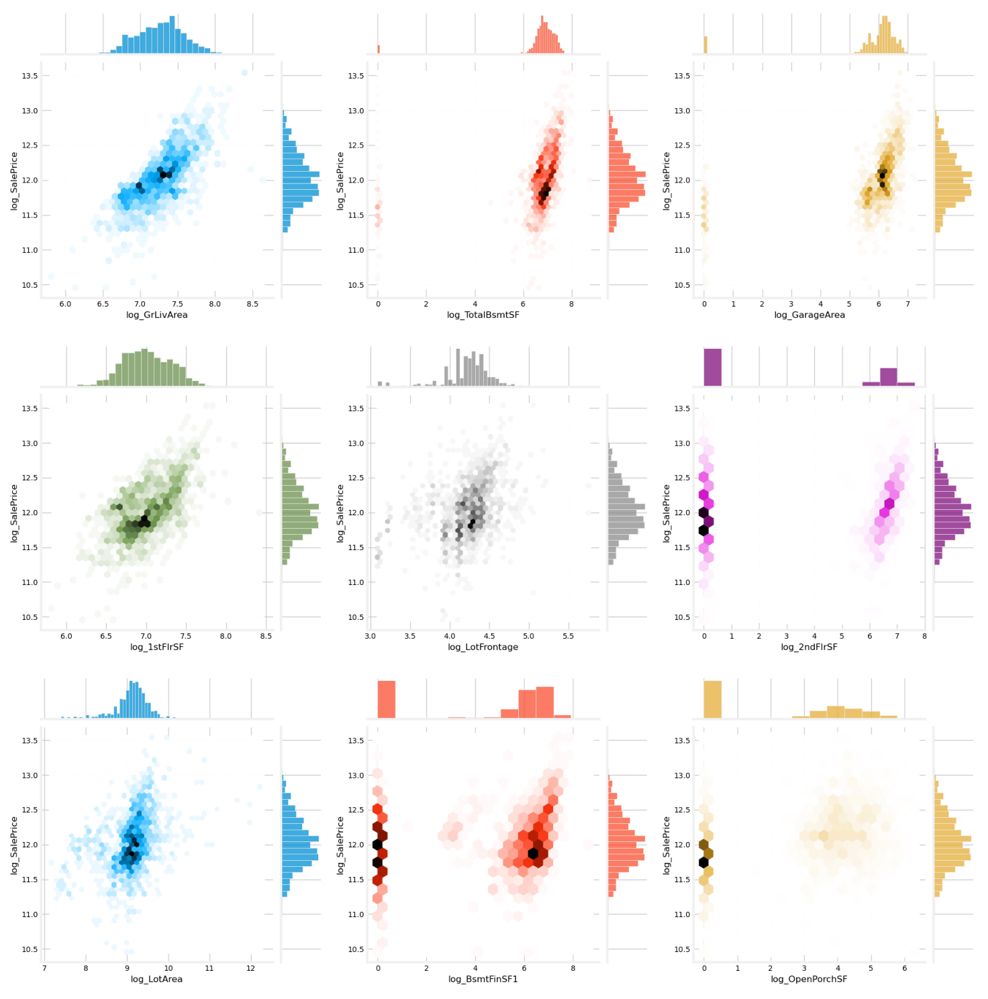

In [280]:
train_slice = logify(data_train, prefix='log_', dexes=1, drop_cols=True)

if 'log_SalePrice' not in train_slice.columns:
    train_slice['log_SalePrice'] = np.log1p(train_slice['SalePrice'])

my_palette = sns.color_palette(palette_538, len(float_mi_df[:9].index))
imgs = []
for i, col in enumerate(float_mi_df[:9].index):

    # jp = sns.jointplot(data=train_slice, x=col, y='SalePrice', kind='hex')
    jp = sns.jointplot(data=train_slice, x=col, y='log_SalePrice', kind='hex', color=my_palette[i])

    buf = BytesIO()
    jp.fig.savefig(buf, format="png")
    plt.close(jp.fig)
    buf.seek(0)
    img = Image.open(buf)
    imgs.append(img)


fig, axs = plt.subplots(3, 3, figsize=(15, 15))

for k, img in enumerate(imgs):
    
    i = k // 3 # row
    j = k % 3 # column

    axs[i,j].imshow(img)
    axs[i,j].axis('off')

plt.tight_layout()
plt.show()

del train_slice, imgs, jp, buf, img, i, j, k, fig, axs

There are some interesting "clusters" in some of these plots, for three different columns. What could they be due to?

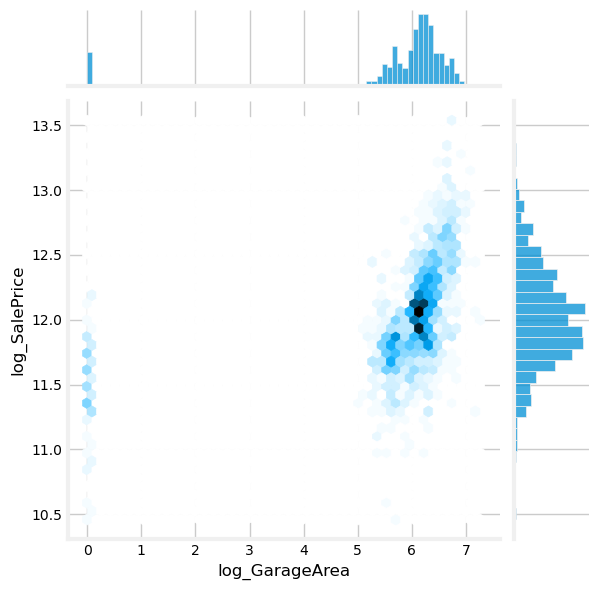

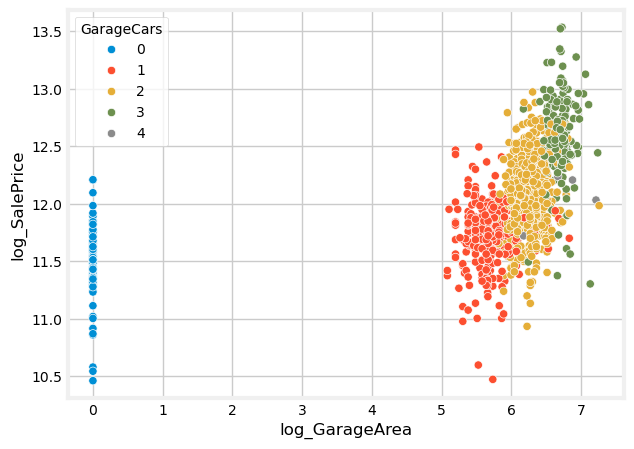

In [281]:
train_slice = logify(data_train, prefix='log_', dexes=1, drop_cols=True)

if 'log_SalePrice' not in train_slice.columns:
    train_slice['log_SalePrice'] = np.log1p(train_slice['SalePrice'])

# col1, col2 = 'log_GrLivArea', 'has_2ndFlr'
train_slice['has_2ndFlr'] = (train_slice['log_2ndFlrSF'] > 0)

# col1, col2 = 'log_TotalBsmtSF', 'HouseStyle'
# col1, col2 = 'log_TotalBsmtSF', 'MSSubClass'

col1, col2 = 'log_GarageArea', 'GarageCars'

# col1, col2 = 'log_1stFlrSF', 'has_2ndFlr'
# train_slice['has_2ndFlr'] = (train_slice['2ndFlrSF'] > 0)

warnings.filterwarnings("ignore", message="The palette list has more values")

sns.jointplot(data=train_slice, x=col1, y='log_SalePrice', kind='hex')
plt.show()

# sns.scatterplot(data=train_slice, x=col1, y='SalePrice', hue=col2)
sns.scatterplot(data=train_slice, x=col1, y='log_SalePrice', hue=col2, palette=palette_538)
plt.show()

del train_slice, col1, col2

Let us focus then on the top-9 features. We can do scatterplot (easier to see correlations) or KDE (easier to see clusters/groups)...

In [282]:
# train_slice = logify(data_train, prefix='log_', dexes=1, drop_cols=True)

# if 'log_SalePrice' not in train_slice.columns:
#     train_slice['log_SalePrice'] = np.log1p(train_slice['SalePrice'])

# best_float_cols = float_mi_df[:9].index.to_list()
# best_float_cols += ['log_SalePrice']
# # best_float_cols += ['OverallQual']

# # sns.pairplot(data=train_slice.loc[:, best_float_cols], diag_kind='kde', kind='kde')
# sns.pairplot(data=train_slice.loc[:, best_float_cols], diag_kind='kde')

# del train_slice, best_float_cols

Or both!

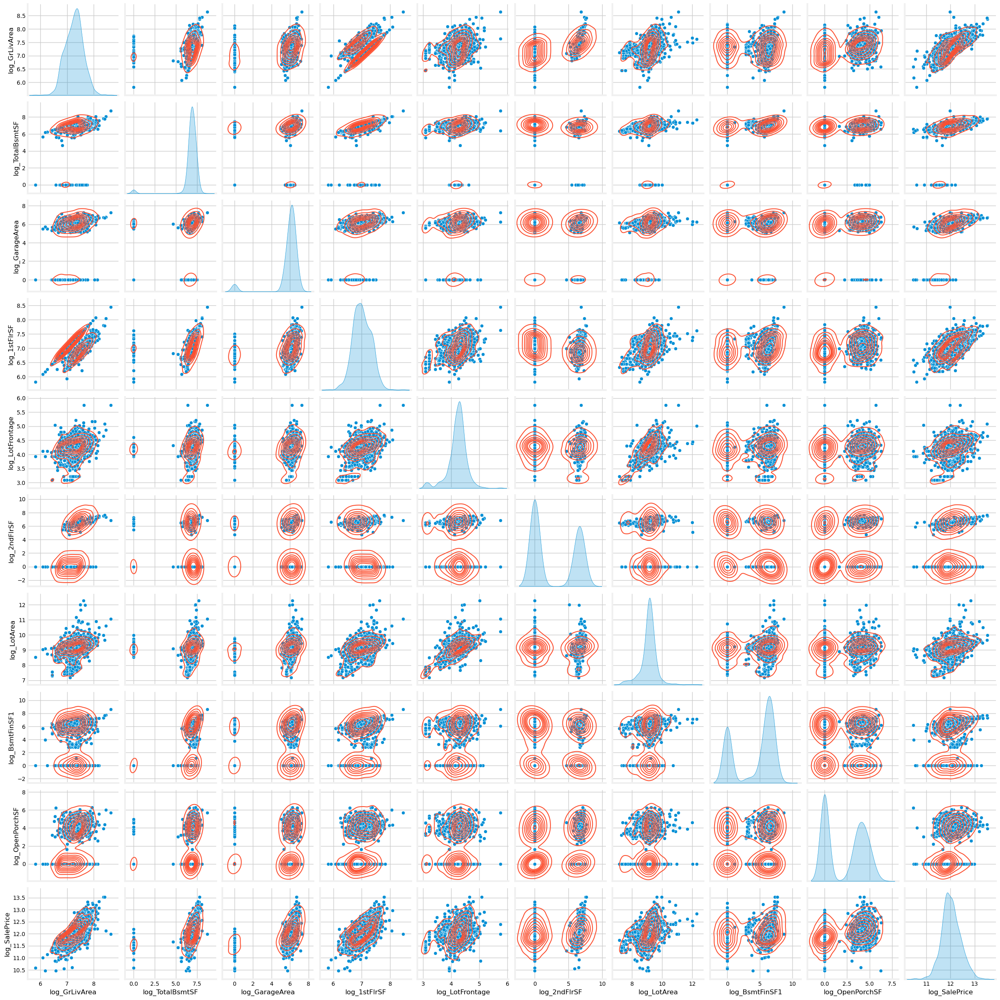

In [283]:
train_slice = logify(data_train, prefix='log_', dexes=1, drop_cols=True)

if 'log_SalePrice' not in train_slice.columns:
    train_slice['log_SalePrice'] = np.log1p(train_slice['SalePrice'])

best_float_cols = float_mi_df[:9].index.to_list()
best_float_cols += ['log_SalePrice']

g = sns.pairplot(data=train_slice.loc[:, best_float_cols], diag_kind='kde')

# Loop over axes and add KDE contours
for i in range(len(best_float_cols)):
    for j in range(len(best_float_cols)):
        if i != j:
            ax = g.axes[i, j]

    
            sns.kdeplot(
                data=train_slice.loc[:, best_float_cols], 
                x=best_float_cols[j], 
                y=best_float_cols[i],
                ax=g.axes[i, j],
                levels=9,
                color=colors_538[1],
                fill=False,
                linewidths=1.5
                )

plt.show()

del train_slice, best_float_cols, g, i, j, ax

#### Target vs.  Discrete

Now, the mutual information of SalePrice with the int-type variables, and some useful plots:

In [284]:
train_slice = data_train.drop(['Id', 'SalePrice'], axis=1).select_dtypes(include='int64')

mi_int_cols = {}
for col in train_slice.columns:
    mi_int_cols[col] = mutual_info_regression(train_slice[[col]],
                                              np.log1p(data_train['SalePrice']),
                                              random_state=0)[0]

int_feat = sorted(mi_int_cols, key=lambda k: mi_int_cols[k], reverse=True)

int_mi_df = pd.Series({feat:mi_int_cols[feat] for feat in int_feat}, index=int_feat, name='int_mi')

display(int_mi_df.head(9))

del train_slice, int_feat

OverallQual     0.568774
GarageCars      0.359418
YearBuilt       0.355769
MSSubClass      0.272567
GarageYrBlt     0.259158
FullBath        0.258037
YearRemodAdd    0.230648
TotRmsAbvGrd    0.217925
Fireplaces      0.166157
Name: int_mi, dtype: float64

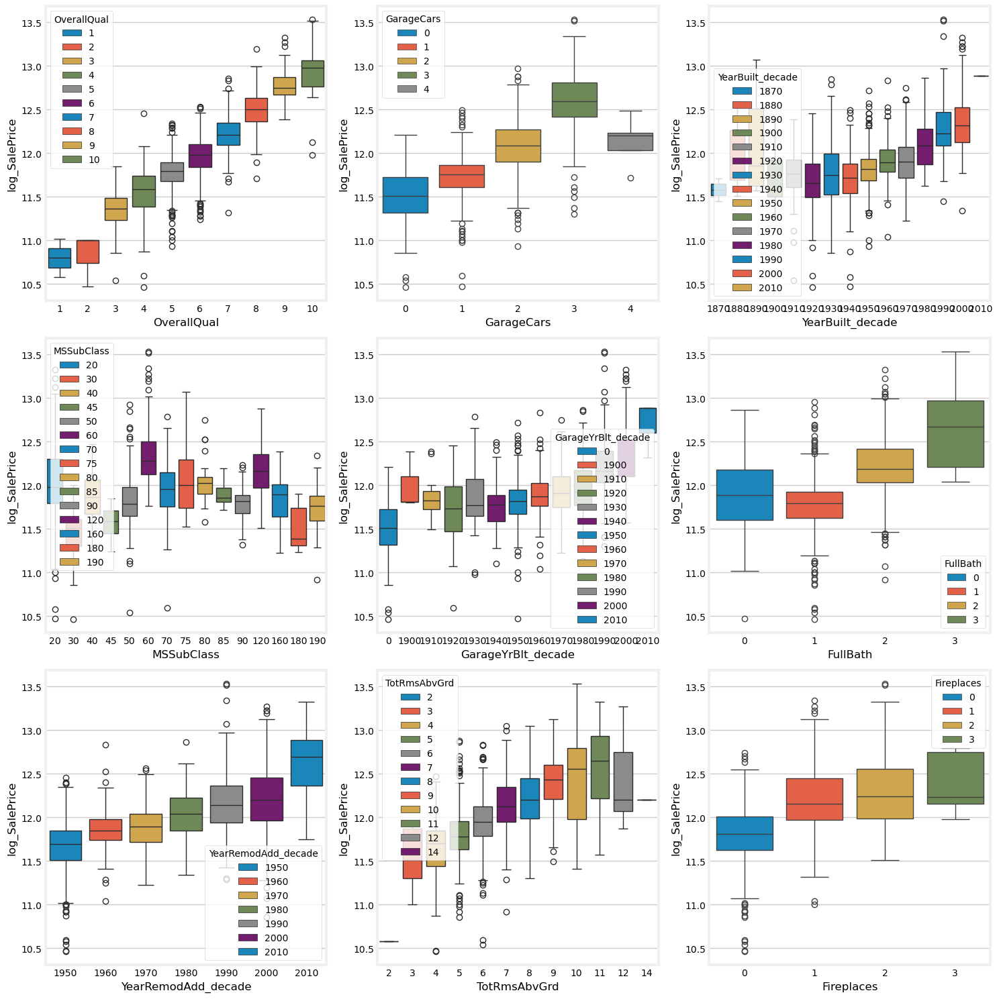

In [285]:
train_slice = data_train.copy()
train_slice['log_SalePrice'] = np.log1p(train_slice['SalePrice'])

fig, axs = plt.subplots(3, 3, figsize=(15, 15))
for k, col in enumerate(int_mi_df.index[:9]):

    if ('Yr' in col) or ('Year' in col):
        train_slice[col+'_decade'] = (train_slice[col] // 10) * 10
        col += '_decade'

    i = k // 3 # row
    j = k % 3 # column

    ordered_categories = sorted(train_slice[col].unique())
    ordered_categories = [str(cat) for cat in ordered_categories]

    my_palette = sns.color_palette(palette_538, len(train_slice[col].unique()))
    
    sns.boxplot(data=train_slice, x=col, y='log_SalePrice', hue=col, order=ordered_categories, ax=axs[i,j], palette=my_palette)
    # sns.swarmplot(data=train_slice, x=col, y='log_SalePrice', hue=col, ax=axs[i,j], palette=palette_538)

plt.tight_layout()

# del train_slice, my_palette, fig, axs, k, col, i, j, ordered_categories

#### Target vs. Categorical

Now we gotta look at the categorical variables and how do they determine the (log of the) SalePrice.

In [286]:
train_slice = data_train.drop(['Id', 'SalePrice'], axis=1).select_dtypes(include='object')

for col in train_slice.columns:
    train_slice[col] = LabelEncoder().fit_transform(train_slice[col])

mi_cat_cols = {}
for col in train_slice.columns:
    mi_cat_cols[col] = mutual_info_regression(train_slice[[col]],
                                              np.log1p(data_train['SalePrice']),
                                              discrete_features=True,
                                              random_state=0)[0]

cat_feat = sorted(mi_cat_cols, key=lambda k: mi_cat_cols[k], reverse=True)

cat_mi_df = pd.Series({feat:mi_cat_cols[feat] for feat in cat_feat}, index=cat_feat, name='cat_mi')

display(cat_mi_df.head(9))

del train_slice, col, cat_feat

Neighborhood    0.526427
ExterQual       0.328419
BsmtQual        0.327429
KitchenQual     0.321213
GarageFinish    0.276180
FireplaceQu     0.211380
GarageType      0.201509
Foundation      0.201422
HeatingQC       0.165560
Name: cat_mi, dtype: float64

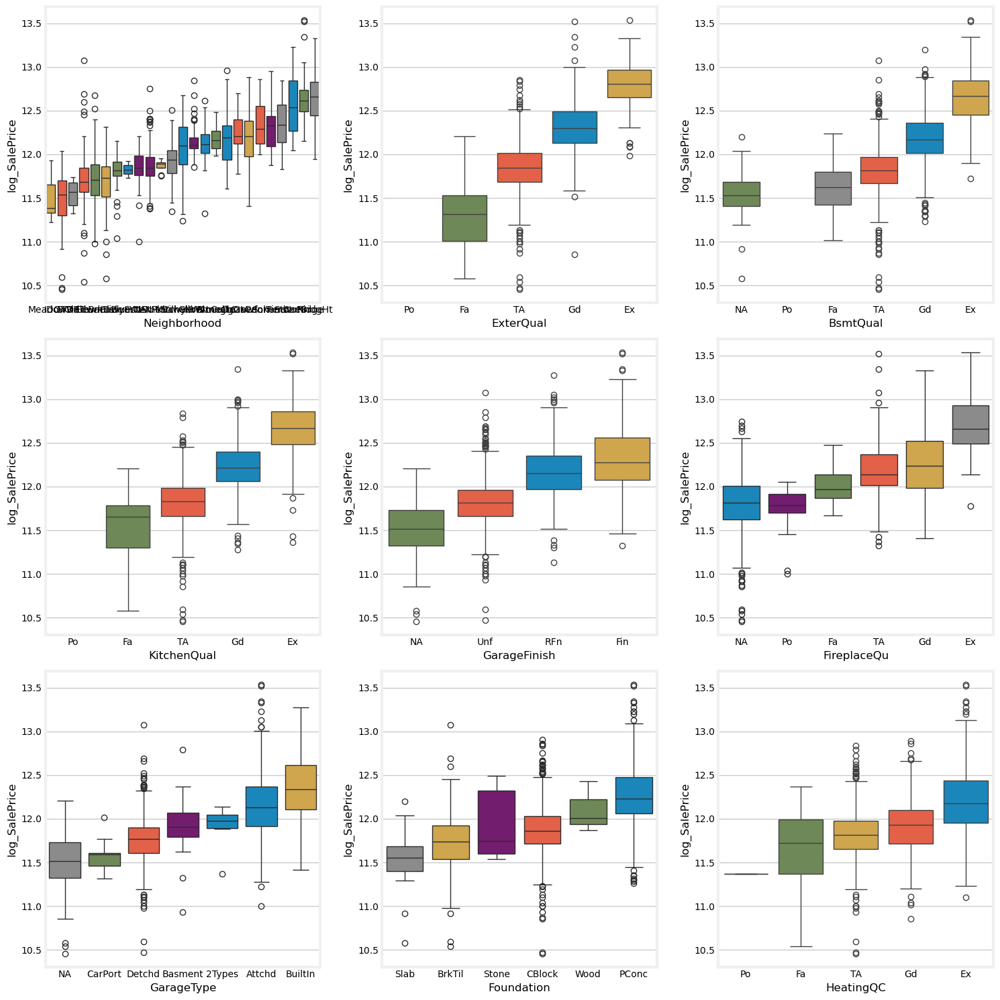

In [287]:
train_slice = data_train.copy()
train_slice['log_SalePrice'] = np.log1p(train_slice['SalePrice'])

fig, axs = plt.subplots(3, 3, figsize=(15, 15))
for k, col in enumerate(cat_mi_df.index[:9]):

    i = k // 3 # row
    j = k % 3 # column

    if ('TA' in train_slice[col].unique()) and ('Ex' in train_slice[col].unique()): # checking there is a rank!
        ordered_categories = ['Po', 'Fa', 'TA', 'Gd', 'Ex']
        if ('NA' in train_slice[col].unique()):
            ordered_categories = ['NA'] + ordered_categories
    else:
        ordered_categories = train_slice.groupby(col)['log_SalePrice'].median().sort_values().index

    my_palette = sns.color_palette(palette_538, len(train_slice[col].unique()))

    # sns.swarmplot(data=train_slice, x=col, y='log_SalePrice', hue=col, ax=axs[i,j], palette=palette_538)
    sns.boxplot(data=train_slice, x=col, y='log_SalePrice', hue=col, ax=axs[i,j], order=ordered_categories, palette=my_palette)

plt.tight_layout()

del train_slice, fig, axs, k, col, i, j, ordered_categories, my_palette

We will make a quick ranking of them based on a *uni*variate ANOVA

In [288]:
train_slice = data_train.drop(['Id', 'SalePrice'], axis=1).select_dtypes(include='object')
train_slice['SalePrice'] = data_train['SalePrice']
train_slice['log_SalePrice'] = np.log1p(train_slice['SalePrice'])

cat_anova = pd.DataFrame()
anova_tables = {}
for col in cat_mi_df.index[:9]:
# for col in cat_mi_df.index:

    # ANOVA model
    # model = smf.ols(f'SalePrice ~ C({col})', data=train_slice).fit() # or data_train, it doesn't matter!
    model = smf.ols(f'log_SalePrice ~ C({col})', data=train_slice).fit() # or data_train, it doesn't matter!

    # computing ANOVA table:
    anova_tables[col] = sm.stats.anova_lm(model, typ=2)

    # is F-score significant?
    anova_tables[col]['significant'] = (anova_tables[col]['PR(>F)'] < 0.05)

    # needed values:
    ss_effect = anova_tables[col].loc[f'C({col})', 'sum_sq']
    df_effect = anova_tables[col].loc[f'C({col})', 'df']

    ss_error = anova_tables[col].loc['Residual', 'sum_sq']
    df_error = anova_tables[col].loc['Residual', 'df']

    ms_error = ss_error / df_error
    ss_total = ss_effect + ss_error

    # Compute metrics
    eta2 = ss_effect / ss_total
    cohen_f = np.sqrt(eta2 / (1 - eta2))
    omega2 = (ss_effect - df_effect * ms_error) / (ss_total + ms_error)

    # saving metrics:
    anova_tables[col]['eta2'] = eta2
    anova_tables[col]['cohen_f'] = cohen_f
    anova_tables[col]['omega2'] = omega2
    
    cat_anova[col] = anova_tables[col].transpose().loc[:,f'C({col})']

del train_slice, model, anova_tables, col, ss_effect, df_effect, ss_error, df_error, ms_error, ss_total, eta2, cohen_f, omega2

In [289]:
cat_anova

,Neighborhood,ExterQual,BsmtQual,KitchenQual,GarageFinish,FireplaceQu,GarageType,Foundation,HeatingQC
sum_sq,132.882772,107.348227,105.294747,104.209568,88.70373,72.376358,77.903203,70.689269,54.362284
df,24.0,3.0,4.0,3.0,3.0,5.0,6.0,5.0,4.0
F,79.520526,415.304259,300.392915,393.320922,298.769591,131.198588,121.796238,126.806779,110.820423
PR(>F),0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
significant,True,True,True,True,True,True,True,True,True
eta2,0.570808,0.461123,0.452302,0.44764,0.381034,0.310898,0.334639,0.303651,0.233517
cohen_f,1.153239,0.925046,0.908748,0.90023,0.7846,0.671688,0.709185,0.66035,0.551961
omega2,0.563461,0.459842,0.450626,0.446333,0.379597,0.308382,0.33174,0.301112,0.231288


We now try a multi(bi-)variate ANOVA:

In [290]:
anova_type3 = False

train_slice = data_train.drop(['Id', 'SalePrice'], axis=1).select_dtypes(include='object')
train_slice['SalePrice'] = data_train['SalePrice']
train_slice['log_SalePrice'] = np.log1p(train_slice['SalePrice'])

cat_anovas = {}
anova_tables = {}
for i, col1 in enumerate(cat_mi_df.index[:9]):
    
    if i == 8:
        break
    
    for j, col2 in enumerate(cat_mi_df.index[i+1:9]):

        cat_anovas[col1, col2] = pd.DataFrame()

        # ANOVA model & table
        if anova_type3:
            name1, name2 = f'C({col1}, Sum)', f'C({col2}, Sum)'
            model = smf.ols(f'log_SalePrice ~ {name1} + {name2} + {name1}:{name2}', data=train_slice).fit() # or data_train, it doesn't matter!
            anova_tables[col1, col2] = sm.stats.anova_lm(model, typ=3)
        else:
            # model = smf.ols(f'SalePrice ~ C({col1}) + C({col2})', data=train_slice).fit() # or data_train, it doesn't matter!
            name1, name2 = f'C({col1})', f'C({col2})'
            model = smf.ols(f'log_SalePrice ~ {name1} + {name2}', data=train_slice).fit() # or data_train, it doesn't matter!
            anova_tables[col1, col2] = sm.stats.anova_lm(model, typ=2)

        # is F-score significant?
        anova_tables[col1, col2]['significant'] = (anova_tables[col1, col2]['PR(>F)'] < 0.05)

        # display(anova_tables[col1, col2])

        # needed values:
        ss_effect_1 = anova_tables[col1, col2].loc[name1, 'sum_sq']
        df_effect_1 = anova_tables[col1, col2].loc[name1, 'df']

        ss_effect_2 = anova_tables[col1, col2].loc[name2, 'sum_sq']
        df_effect_2 = anova_tables[col1, col2].loc[name2, 'df']

        if anova_type3:
            ss_effect_3 = anova_tables[col1, col2].loc[name1+':'+name2, 'sum_sq']
            df_effect_3 = anova_tables[col1, col2].loc[name1+':'+name2, 'df']

        ss_error = anova_tables[col1, col2].loc['Residual', 'sum_sq']
        df_error = anova_tables[col1, col2].loc['Residual', 'df']

        ms_error = ss_error / df_error

        # Partial metrics
        partial_eta2_1 = ss_effect_1 / (ss_effect_1 + ss_error)
        partial_cohen_f_1 = np.sqrt(partial_eta2_1 / (1 - partial_eta2_1))
        partial_omega2_1 = (ss_effect_1 - df_effect_1 * ms_error) / (ss_effect_1 + ss_error + ms_error)

        partial_eta2_2 = ss_effect_2 / (ss_effect_2 + ss_error)
        partial_cohen_f_2 = np.sqrt(partial_eta2_2 / (1 - partial_eta2_2))
        partial_omega2_2 = (ss_effect_2 - df_effect_2 * ms_error) / (ss_effect_2 + ss_error + ms_error)

        if anova_type3:
            partial_eta2_3 = ss_effect_3 / (ss_effect_3 + ss_error)
            partial_cohen_f_3 = np.sqrt(partial_eta2_3 / (1 - partial_eta2_3))
            partial_omega2_3 = (ss_effect_3 - df_effect_3 * ms_error) / (ss_effect_3 + ss_error + ms_error)

        # saving metrics

        if anova_type3:
            anova_tables[col1, col2]['eta2'] = np.array([np.nan, partial_eta2_1, partial_eta2_2, partial_eta2_3, np.nan])
            anova_tables[col1, col2]['cohen_f'] = np.array([np.nan, partial_cohen_f_1, partial_cohen_f_2, partial_cohen_f_3, np.nan])
            anova_tables[col1, col2]['omega2'] = np.array([np.nan, partial_omega2_1, partial_omega2_2, partial_omega2_3, np.nan])
        else:
            anova_tables[col1, col2]['eta2'] = np.array([partial_eta2_1, partial_eta2_2, np.nan])
            anova_tables[col1, col2]['cohen_f'] = np.array([partial_cohen_f_1, partial_cohen_f_2, np.nan])
            anova_tables[col1, col2]['omega2'] = np.array([partial_omega2_1, partial_omega2_2, np.nan])
    
        cat_anovas[col1, col2][col1] = anova_tables[col1, col2].transpose().loc[:,name1]
        cat_anovas[col1, col2][col2] = anova_tables[col1, col2].transpose().loc[:,name2]
        if anova_type3:
            cat_anovas[col1, col2][col1+'_'+col2] = anova_tables[col1, col2].transpose().loc[:,name1+':'+name2]
        
        cat_anovas[col1, col2]['total'] = cat_anovas[col1, col2][col1] + cat_anovas[col1, col2][col2]
        if anova_type3:
            cat_anovas[col1, col2]['total'] += cat_anovas[col1, col2][col1+'_'+col2]
        
        cat_anovas[col1, col2].loc[['F', 'PR(>F)', 'significant'], 'total'] = np.nan

del train_slice, model, anova_tables, anova_type3, col1, col2, i, j, name1, name2, ss_effect_1, df_effect_1, ss_effect_2, df_effect_2, ss_error, df_error, ms_error, partial_eta2_1, partial_eta2_2, partial_cohen_f_1, partial_cohen_f_2, partial_omega2_1, partial_omega2_2

/home/mbuenabad/miniforge3/envs/ml_env/lib/python3.12/site-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3, but rank is 1
  warnings.warn('covariance of constraints does not have full '
/home/mbuenabad/miniforge3/envs/ml_env/lib/python3.12/site-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 6, but rank is 1
  warnings.warn('covariance of constraints does not have full '


In [291]:
cat_anovas['Neighborhood', 'FireplaceQu']

,Neighborhood,FireplaceQu,total
sum_sq,78.492293,17.985879,96.478172
df,24.0,5.0,29.0
F,57.08398,62.785613,NaN
PR(>F),0.0,0.0,NaN
significant,True,True,NaN
eta2,0.489289,0.180012,0.669301
cohen_f,0.978802,0.46854,1.447342
omega2,0.480546,0.177043,0.657589


We now create a pandas Series of feature pairs ranked by their $\omega^2$ values:

In [292]:
cat_omega2 = {}

for i, col1 in enumerate(cat_mi_df.index[:9]):
    
    if i == 8:
        break
    
    for j, col2 in enumerate(cat_mi_df.index[i+1:9]):

        cat_omega2[col1, col2] = cat_anovas[col1, col2].loc['eta2', 'total']

cat_pairs_feat = sorted(cat_omega2, key=lambda k: cat_omega2[k], reverse=True)

cat_pairs_omega2 = pd.Series({feat:cat_omega2[feat] for feat in cat_pairs_feat}, index=cat_pairs_feat, name='cat_pairs_omega2')

del i, col1, j, col2, cat_pairs_feat

In [293]:
cat_pairs_omega2

Neighborhood  FireplaceQu     0.669301
              KitchenQual     0.605722
ExterQual     FireplaceQu     0.590412
BsmtQual      FireplaceQu     0.587722
KitchenQual   FireplaceQu     0.584833
Neighborhood  GarageType      0.579079
FireplaceQu   Foundation      0.571756
Neighborhood  GarageFinish    0.569048
              HeatingQC       0.565867
KitchenQual   GarageType      0.558561
Neighborhood  BsmtQual        0.533511
ExterQual     GarageType      0.533386
BsmtQual      GarageType      0.523825
Neighborhood  ExterQual       0.520292
KitchenQual   GarageFinish    0.506823
Neighborhood  Foundation      0.495726
FireplaceQu   HeatingQC       0.478976
GarageFinish  FireplaceQu     0.472631
ExterQual     GarageFinish    0.465454
BsmtQual      GarageFinish    0.458916
FireplaceQu   GarageType      0.435937
BsmtQual      KitchenQual     0.429244
GarageType    HeatingQC       0.419105
BsmtQual      HeatingQC       0.417295
GarageType    Foundation      0.405252
KitchenQual   Foundation 

/home/mbuenabad/miniforge3/envs/ml_env/lib/python3.12/site-packages/seaborn/categorical.py:3399: UserWarning: 37.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/mbuenabad/miniforge3/envs/ml_env/lib/python3.12/site-packages/seaborn/categorical.py:3399: UserWarning: 57.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/mbuenabad/miniforge3/envs/ml_env/lib/python3.12/site-packages/seaborn/categorical.py:3399: UserWarning: 44.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/mbuenabad/miniforge3/envs/ml_env/lib/python3.12/site-packages/seaborn/categorical.py:3399: UserWarning: 63.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


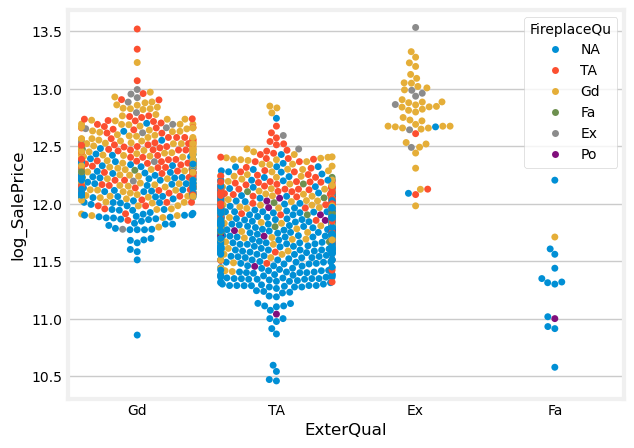

In [294]:
train_slice = data_train.drop(['Id', 'SalePrice'], axis=1).select_dtypes(include='object')
train_slice['SalePrice'] = data_train['SalePrice']
train_slice['log_SalePrice'] = np.log1p(train_slice['SalePrice'])

# col1, col2 = 'Neighborhood', 'FireplaceQu'
col1, col2 = 'ExterQual', 'FireplaceQu'
# col1, col2 = 'KitchenQual', 'GarageType'

# sns.boxplot(data=train_slice, x=col1, y='log_SalePrice', hue=col2)
sns.swarmplot(data=train_slice, x=col1, y='log_SalePrice', hue=col2)

del train_slice

#### Target vs. Discrete + Categorical

Discrete and Categorical variables are similar, and we can use ANOVA on both. Let us then do an univariate ANOVA:

In [295]:
train_slice = data_train.drop(['Id', 'SalePrice'], axis=1).select_dtypes(include=['object', 'int64'])
train_slice['SalePrice'] = data_train['SalePrice']
train_slice['log_SalePrice'] = np.log1p(train_slice['SalePrice'])

catint_anova = pd.DataFrame()
anova_tables = {}

catint_mi_df = pd.concat([int_mi_df, cat_mi_df], axis=0).sort_values(ascending=False)

for col in catint_mi_df.index:

    # ANOVA model
    # model = smf.ols(f'SalePrice ~ C({col})', data=train_slice).fit() # or data_train, it doesn't matter!
    model = smf.ols(f'log_SalePrice ~ C({col})', data=train_slice).fit() # or data_train, it doesn't matter!

    # computing ANOVA table:
    anova_tables[col] = sm.stats.anova_lm(model, typ=2)

    # is F-score significant?
    anova_tables[col]['significant'] = (anova_tables[col]['PR(>F)'] < 0.05)

    # needed values:
    ss_effect = anova_tables[col].loc[f'C({col})', 'sum_sq']
    df_effect = anova_tables[col].loc[f'C({col})', 'df']

    ss_error = anova_tables[col].loc['Residual', 'sum_sq']
    df_error = anova_tables[col].loc['Residual', 'df']

    ms_error = ss_error / df_error
    ss_total = ss_effect + ss_error

    # Compute metrics
    eta2 = ss_effect / ss_total
    cohen_f = np.sqrt(eta2 / (1 - eta2))
    omega2 = (ss_effect - df_effect * ms_error) / (ss_total + ms_error)

    # saving metrics:
    anova_tables[col]['eta2'] = eta2
    anova_tables[col]['cohen_f'] = cohen_f
    anova_tables[col]['omega2'] = omega2
    
    catint_anova[col] = anova_tables[col].transpose().loc[:,f'C({col})']

del train_slice, model, anova_tables, col, ss_effect, df_effect, ss_error, df_error, ms_error, ss_total, eta2, cohen_f, omega2

In [296]:
catint_anova

,OverallQual,Neighborhood,GarageCars,YearBuilt,ExterQual,BsmtQual,KitchenQual,GarageFinish,MSSubClass,GarageYrBlt,FullBath,YearRemodAdd,TotRmsAbvGrd,FireplaceQu,GarageType,Foundation,Fireplaces,HeatingQC,Exterior2nd,BsmtFinType1,Exterior1st,MSZoning,OverallCond,LotShape,HalfBath,HouseStyle,SaleType,GarageCond,SaleCondition,BsmtExposure,BedroomAbvGr,CentralAir,GarageQual,MasVnrType,Electrical,BsmtCond,PavedDrive,Fence,BldgType,BsmtFinType2,Alley,LandContour,BsmtFullBath,KitchenAbvGr,Condition1,ExterCond,Heating,RoofStyle,LotConfig,BsmtHalfBath,RoofMatl,Functional,YrSold,MiscFeature,Condition2,Utilities,MoSold,Street,LandSlope,PoolQC
sum_sq,156.762863,132.882772,114.09616,116.041062,107.348227,105.294747,104.209568,88.70373,76.852754,105.502966,84.385686,84.454473,70.31003,72.376358,77.903203,70.689269,61.680076,54.362284,39.916097,52.998242,42.260035,40.934759,38.842796,20.44564,25.613627,23.767842,27.962638,33.792004,30.035538,33.547058,16.648565,28.77895,32.907094,22.835386,22.469132,20.169161,21.702887,9.868869,9.344595,10.838474,6.433876,5.967056,13.379868,5.404449,9.878523,10.595258,7.669671,10.033069,5.433269,0.009886,4.167092,5.537972,0.471751,2.294718,2.802735,0.037148,1.744253,0.766187,0.345583,1.89597
df,9.0,24.0,4.0,111.0,3.0,4.0,3.0,3.0,14.0,97.0,3.0,60.0,11.0,5.0,6.0,5.0,3.0,4.0,15.0,6.0,14.0,4.0,8.0,3.0,2.0,7.0,8.0,5.0,5.0,4.0,7.0,1.0,5.0,2.0,4.0,4.0,2.0,4.0,4.0,6.0,2.0,3.0,3.0,3.0,8.0,4.0,5.0,5.0,4.0,2.0,7.0,6.0,4.0,4.0,7.0,1.0,11.0,1.0,2.0,3.0
F,332.16696,79.520526,349.637428,12.069722,415.304259,300.392915,393.320922,298.769591,50.866063,11.637504,275.956125,13.274604,56.960386,131.198588,121.796238,126.806779,174.940533,110.820423,19.922019,71.381818,22.892276,77.607607,36.323467,46.728785,90.062584,23.585775,24.760043,49.379079,43.076762,61.243197,15.976882,205.666008,47.873115,79.231285,38.858959,34.503998,74.8979,16.102906,15.211681,11.825225,20.70596,12.767286,29.595124,11.534907,8.037521,17.344662,9.90699,13.09731,8.692442,0.030937,3.780658,5.901233,0.738615,3.621229,2.52774,0.23269,0.993741,4.814434,1.08305,3.985148
PR(>F),0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000001,0.969537,0.00045,0.000004,0.565639,0.00606,0.01382,0.629609,0.449661,0.02838,0.338834,0.007695
significant,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,False,True,True,False,True,True,False,False,True,False,True
eta2,0.673387,0.570808,0.490109,0.498463,0.461123,0.452302,0.44764,0.381034,0.330127,0.453196,0.362485,0.362781,0.302022,0.310898,0.334639,0.303651,0.264951,0.233517,0.171463,0.227658,0.181531,0.175838,0.166852,0.087826,0.110025,0.102097,0.120116,0.145156,0.12902,0.144104,0.071515,0.123622,0.141355,0.098091,0.096518,0.086638,0.093226,0.042392,0.04014,0.046557,0.027637,0.025632,0.057474,0.023215,0.042434,0.045513,0.032946,0.043098,0.023339,0.000042,0.0179,0.023789,0.002026,0.009857,0.012039,0.00016,0.007493,0.003291,0.001484,0.008144
cohen_f,1.435871,1.153239,0.980409,0.996931,0.925046,0.908748,0.90023,0.7846,0.702011,0.910389,0.75405,0.754532,0.657807,0.671688,0.709185,0.66035,0.600379,0.551961,0.454913,0.542921,0.47095,0.461903,0.447512,0.310293,0.351607,0.337202,0.369477,0.412073,0.384879,0.410324,0.277531,0.37558,0.405741,0.329787,0.326847,0.307988,0.320642,0.210402,0.204497,0.220977,0.16859,0.162192,0.246939,0.154165,0.21051,0.218364,0.184575,0.212224,0.154586,0.006517,0.135005,0.156104,0.045062,0.099776,0.110391,0.012633,0.086886,0.057464,0.038558,0.090615
omega2,0.671208,0.563461,0.488536,0.456995,0.459842,0.450626,0.446333,0.379597,0.323487,0.414087,0.361014,0.335299,0.296577,0.308382,0.33174,0.301112,0.263304,0.231288,0.162763,0.224349,0.173503,0.173474,0.162166,0.085893,0.108

And now a bi-variate ANOVA:

In [297]:
anova_type3 = False

train_slice = data_train.drop(['Id', 'SalePrice'], axis=1).select_dtypes(include=['object', 'int64'])
train_slice['SalePrice'] = data_train['SalePrice']
train_slice['log_SalePrice'] = np.log1p(train_slice['SalePrice'])

catint_anovas = {}
anova_tables = {}

catint_mi_df = pd.concat([int_mi_df, cat_mi_df], axis=0).sort_values(ascending=False)

for i, col1 in enumerate(catint_mi_df.index[:19]):
    
    if i == 8:
        break
    
    for j, col2 in enumerate(catint_mi_df.index[i+1:19]):

        catint_anovas[col1, col2] = pd.DataFrame()

        # ANOVA model & table
        if anova_type3:
            name1, name2 = f'C({col1}, Sum)', f'C({col2}, Sum)'
            model = smf.ols(f'log_SalePrice ~ {name1} + {name2} + {name1}:{name2}', data=train_slice).fit() # or data_train, it doesn't matter!
            anova_tables[col1, col2] = sm.stats.anova_lm(model, typ=3)
        else:
            # model = smf.ols(f'SalePrice ~ C({col1}) + C({col2})', data=train_slice).fit() # or data_train, it doesn't matter!
            name1, name2 = f'C({col1})', f'C({col2})'
            model = smf.ols(f'log_SalePrice ~ {name1} + {name2}', data=train_slice).fit() # or data_train, it doesn't matter!
            anova_tables[col1, col2] = sm.stats.anova_lm(model, typ=2)

        # is F-score significant?
        anova_tables[col1, col2]['significant'] = (anova_tables[col1, col2]['PR(>F)'] < 0.05)

        # display(anova_tables[col1, col2])

        # needed values:
        ss_effect_1 = anova_tables[col1, col2].loc[name1, 'sum_sq']
        df_effect_1 = anova_tables[col1, col2].loc[name1, 'df']

        ss_effect_2 = anova_tables[col1, col2].loc[name2, 'sum_sq']
        df_effect_2 = anova_tables[col1, col2].loc[name2, 'df']

        if anova_type3:
            ss_effect_3 = anova_tables[col1, col2].loc[name1+':'+name2, 'sum_sq']
            df_effect_3 = anova_tables[col1, col2].loc[name1+':'+name2, 'df']

        ss_error = anova_tables[col1, col2].loc['Residual', 'sum_sq']
        df_error = anova_tables[col1, col2].loc['Residual', 'df']

        ms_error = ss_error / df_error

        # Partial metrics
        partial_eta2_1 = ss_effect_1 / (ss_effect_1 + ss_error)
        partial_cohen_f_1 = np.sqrt(partial_eta2_1 / (1 - partial_eta2_1))
        partial_omega2_1 = (ss_effect_1 - df_effect_1 * ms_error) / (ss_effect_1 + ss_error + ms_error)

        partial_eta2_2 = ss_effect_2 / (ss_effect_2 + ss_error)
        partial_cohen_f_2 = np.sqrt(partial_eta2_2 / (1 - partial_eta2_2))
        partial_omega2_2 = (ss_effect_2 - df_effect_2 * ms_error) / (ss_effect_2 + ss_error + ms_error)

        if anova_type3:
            partial_eta2_3 = ss_effect_3 / (ss_effect_3 + ss_error)
            partial_cohen_f_3 = np.sqrt(partial_eta2_3 / (1 - partial_eta2_3))
            partial_omega2_3 = (ss_effect_3 - df_effect_3 * ms_error) / (ss_effect_3 + ss_error + ms_error)

        # saving metrics

        if anova_type3:
            anova_tables[col1, col2]['eta2'] = np.array([np.nan, partial_eta2_1, partial_eta2_2, partial_eta2_3, np.nan])
            anova_tables[col1, col2]['cohen_f'] = np.array([np.nan, partial_cohen_f_1, partial_cohen_f_2, partial_cohen_f_3, np.nan])
            anova_tables[col1, col2]['omega2'] = np.array([np.nan, partial_omega2_1, partial_omega2_2, partial_omega2_3, np.nan])
        else:
            anova_tables[col1, col2]['eta2'] = np.array([partial_eta2_1, partial_eta2_2, np.nan])
            anova_tables[col1, col2]['cohen_f'] = np.array([partial_cohen_f_1, partial_cohen_f_2, np.nan])
            anova_tables[col1, col2]['omega2'] = np.array([partial_omega2_1, partial_omega2_2, np.nan])
    
        catint_anovas[col1, col2][col1] = anova_tables[col1, col2].transpose().loc[:,name1]
        catint_anovas[col1, col2][col2] = anova_tables[col1, col2].transpose().loc[:,name2]
        if anova_type3:
            catint_anovas[col1, col2][col1+'_'+col2] = anova_tables[col1, col2].transpose().loc[:,name1+':'+name2]
        
        catint_anovas[col1, col2]['total'] = catint_anovas[col1, col2][col1] + catint_anovas[col1, col2][col2]
        if anova_type3:
            catint_anovas[col1, col2]['total'] += catint_anovas[col1, col2][col1+'_'+col2]
        
        catint_anovas[col1, col2].loc[['F', 'PR(>F)', 'significant'], 'total'] = np.nan

del train_slice, model, anova_tables, anova_type3, col1, col2, i, j, name1, name2, ss_effect_1, df_effect_1, ss_effect_2, df_effect_2, ss_error, df_error, ms_error, partial_eta2_1, partial_eta2_2, partial_cohen_f_1, partial_cohen_f_2, partial_omega2_1, partial_omega2_2

/home/mbuenabad/miniforge3/envs/ml_env/lib/python3.12/site-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 4, but rank is 2
  warnings.warn('covariance of constraints does not have full '
/home/mbuenabad/miniforge3/envs/ml_env/lib/python3.12/site-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3, but rank is 1
  warnings.warn('covariance of constraints does not have full '
/home/mbuenabad/miniforge3/envs/ml_env/lib/python3.12/site-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 4, but rank is 1
  warnings.warn('covariance of constraints does not have full '
/home/mbuenabad/miniforge3/envs/ml_env/lib/python3.12/site-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number

In [298]:
catint_anovas['OverallQual', 'Neighborhood']

,OverallQual,Neighborhood,total
sum_sq,44.440914,20.560823,65.001737
df,9.0,24.0,33.0
F,126.93194,22.022149,NaN
PR(>F),0.0,0.0,NaN
significant,True,True,NaN
eta2,0.444788,0.270413,0.715201
cohen_f,0.895049,0.608801,1.503851
omega2,0.441112,0.258002,0.699114


We now create a pandas Series of feature pairs ranked by their $\omega^2$ values:

In [299]:
catint_omega2 = {}

for i, col1 in enumerate(catint_mi_df.index[:19]):
    
    if i == 8:
        break
    
    for j, col2 in enumerate(catint_mi_df.index[i+1:19]):

        catint_omega2[col1, col2] = catint_anovas[col1, col2].loc['eta2', 'total']

catint_pairs_feat = sorted(catint_omega2, key=lambda k: catint_omega2[k], reverse=True)

catint_pairs_omega2 = pd.Series({feat:catint_omega2[feat] for feat in catint_pairs_feat}, index=catint_pairs_feat, name='catint_pairs_omega2')

del i, col1, j, col2, catint_pairs_feat

In [300]:
catint_pairs_omega2.head(30)

GarageFinish  GarageYrBlt     1.173285
Neighborhood  TotRmsAbvGrd    0.821050
YearBuilt     TotRmsAbvGrd    0.820905
              Fireplaces      0.793374
OverallQual   MSSubClass      0.785863
YearBuilt     FireplaceQu     0.743284
BsmtQual      TotRmsAbvGrd    0.736011
OverallQual   TotRmsAbvGrd    0.723409
              Fireplaces      0.720569
              Neighborhood    0.715201
              GarageType      0.710687
              YearRemodAdd    0.701857
Neighborhood  Fireplaces      0.691556
OverallQual   YearBuilt       0.691054
              GarageYrBlt     0.684089
              FireplaceQu     0.677858
              Exterior2nd     0.676994
Neighborhood  FireplaceQu     0.669301
OverallQual   FullBath        0.659406
KitchenQual   TotRmsAbvGrd    0.658553
OverallQual   GarageFinish    0.655126
ExterQual     TotRmsAbvGrd    0.653871
OverallQual   GarageCars      0.639337
Neighborhood  MSSubClass      0.639185
ExterQual     Fireplaces      0.635149
GarageFinish  TotRmsAbvGr

In [301]:
catint_pairs_omegaprod = {}
for f1, f2 in catint_pairs_omega2.index:
    om1, om2 = catint_anovas[f1, f2].loc['omega2', f1], catint_anovas[f1, f2].loc['omega2', f2]
    omega_prod = om1*om2
    catint_pairs_omegaprod[f1, f2] = omega_prod

catint_pairs_omegaprod = pd.Series(catint_pairs_omegaprod, index=catint_pairs_omega2.index, name='catint_pairs_omega2')

del f1, f2, om1, om2, omega_prod

In [302]:
catint_pairs_omegaprod.sort_values(ascending=False)

GarageFinish  GarageYrBlt     0.183237
Neighborhood  TotRmsAbvGrd    0.143545
YearBuilt     TotRmsAbvGrd    0.143544
              Fireplaces      0.132090
BsmtQual      TotRmsAbvGrd    0.126666
                                ...   
YearBuilt     Foundation      0.003948
GarageCars    GarageYrBlt     0.000209
GarageFinish  GarageType      0.000008
GarageCars    GarageType      0.000003
              GarageFinish    0.000002
Name: catint_pairs_omega2, Length: 116, dtype: float64

In [303]:
catint_anovas['GarageCars', 'GarageType']

,GarageCars,GarageType,total
sum_sq,0.122487,0.18373,0.306217
df,4.0,6.0,10.0
F,0.457577,0.457577,NaN
PR(>F),0.498867,0.498867,NaN
significant,False,False,NaN
eta2,0.001262,0.001891,0.003153
cohen_f,0.035541,0.043528,0.079069
omega2,-0.001494,-0.00224,-0.003735


/tmp/ipykernel_13729/1455846407.py:8: UserWarning: 
The palette list has fewer values (6) than needed (7) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(data=train_slice, x=col1, y='log_SalePrice', hue=col2, palette=palette_538)


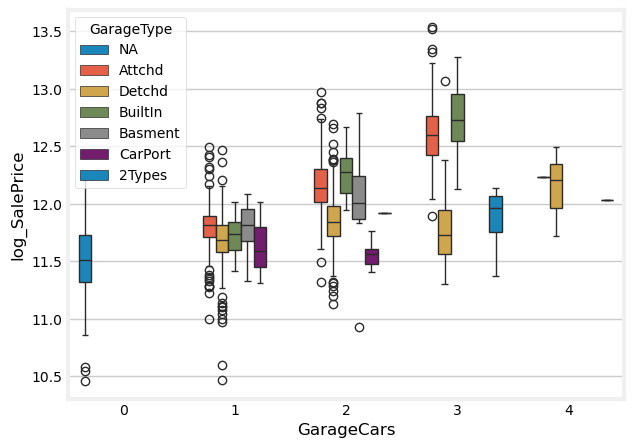

In [304]:
train_slice = data_train.copy()
train_slice['log_SalePrice'] = np.log1p(train_slice['SalePrice'])

# col1, col2 = 'GarageCars', 'GarageFinish'
# col1, col2 = 'OverallQual', 'Fireplaces'
col1, col2 = 'GarageCars', 'GarageType'

sns.boxplot(data=train_slice, x=col1, y='log_SalePrice', hue=col2, palette=palette_538)

del train_slice, col1, col2

#### Discrete vs. Discrete

Now we compute the Cramer's V of the contingency matrix of the dataset:

In [305]:
def plot_cramers_v_heatmap(df, types, figsize=(10, 8)):
    v_matrix = cramers_v_matrix(df, types)
    plt.figure(figsize=figsize)
    sns.heatmap(v_matrix.astype(float), annot=True, cmap='coolwarm', fmt=".2f")
    plt.title("Cramér's V Correlation Matrix (Categorical Variables)")
    plt.tight_layout()
    plt.show()

In [306]:
# print(catint_pairs_omegaprod.index[:9].to_list())
# print(catint_pairs_omega2.index[:9].to_list())

list1, list2 = zip(*list(set(catint_pairs_omegaprod.index[:9].to_list() + catint_pairs_omega2.index[:9].to_list())))

cols = list(set(list1+list2))

cols = sorted(cols)
print(cols)

del list1, list2

['BsmtQual', 'FireplaceQu', 'Fireplaces', 'GarageFinish', 'GarageYrBlt', 'MSSubClass', 'Neighborhood', 'OverallQual', 'TotRmsAbvGrd', 'YearBuilt']


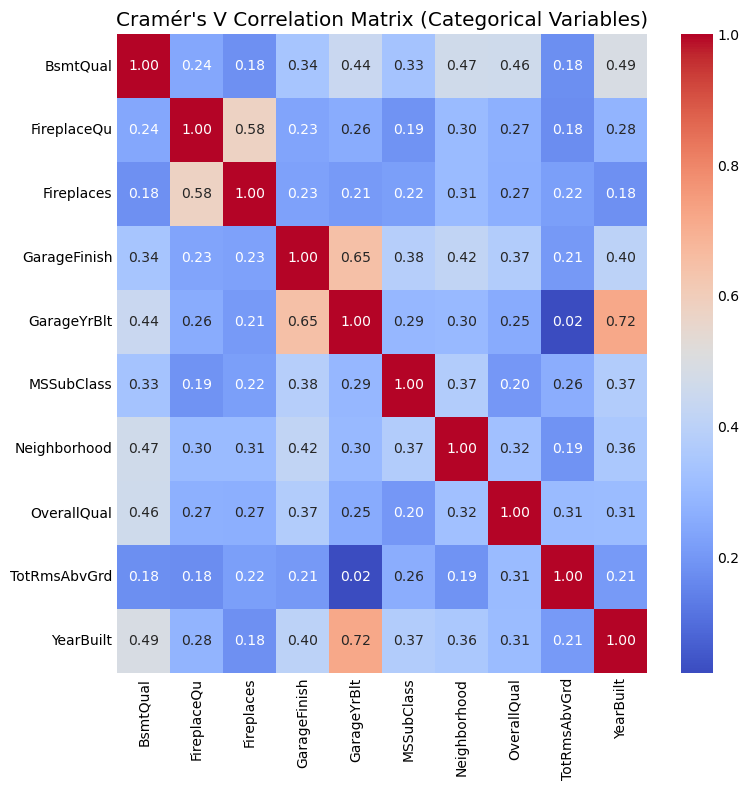

In [307]:
plot_cramers_v_heatmap(data_train.loc[:,cols], types=['object', 'int64'], figsize=(8, 8))

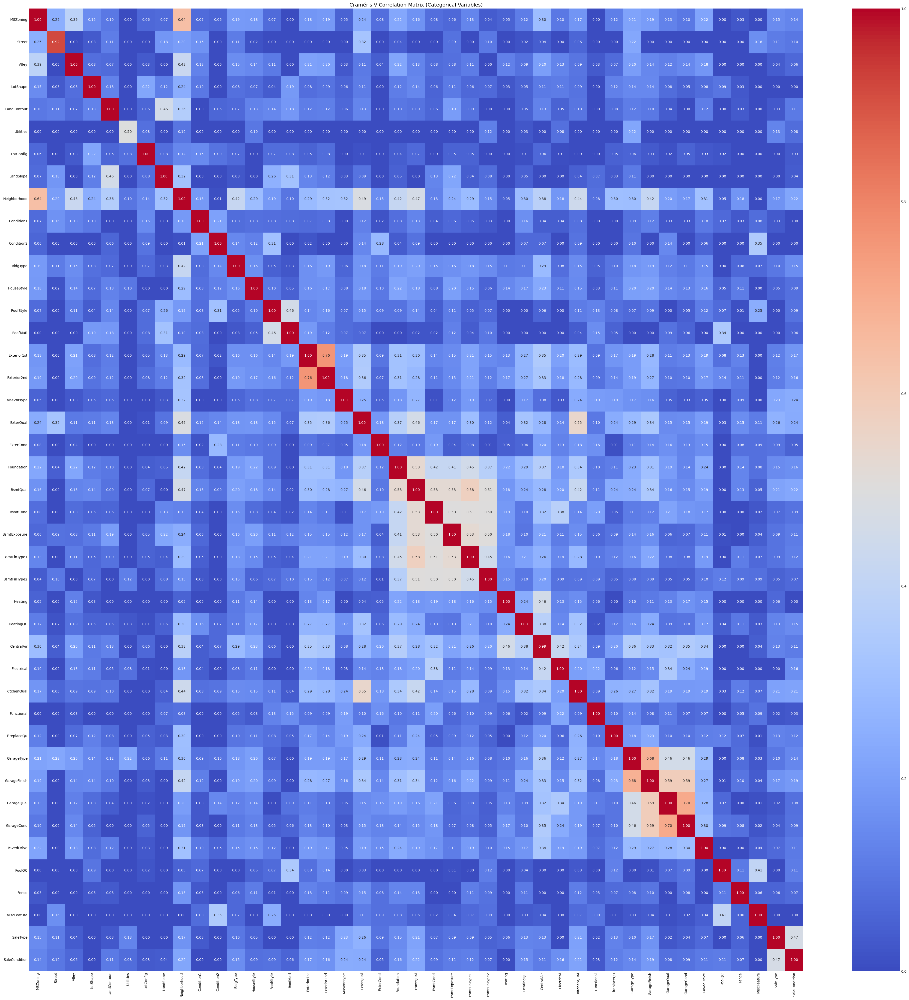

In [308]:
plot_cramers_v_heatmap(data_train, types='object', figsize=(40, 40))

#### Summary

One way to summarize the best featues is to put them all together and subsequently sort them according to their mutual information with the target. Here's the top-20 features:

In [309]:
feats_mi_df = pd.concat([float_mi_df, int_mi_df, cat_mi_df], axis=0).sort_values(ascending=False)
feats_mi_df.head(20)

OverallQual        0.568774
Neighborhood       0.526427
log_GrLivArea      0.478427
GarageCars         0.359418
YearBuilt          0.355769
log_TotalBsmtSF    0.346257
log_GarageArea     0.335795
ExterQual          0.328419
BsmtQual           0.327429
KitchenQual        0.321213
log_1stFlrSF       0.300794
GarageFinish       0.276180
MSSubClass         0.272567
GarageYrBlt        0.259158
FullBath           0.258037
YearRemodAdd       0.230648
log_LotFrontage    0.228260
TotRmsAbvGrd       0.217925
FireplaceQu        0.211380
log_2ndFlrSF       0.207683
dtype: float64

Let us compare that list with the one we obtained from the Pearson's correlation...

In [310]:
num_corrs_df

OverallQual      0.817185
GrLivArea        0.700927
GarageCars       0.680625
GarageArea       0.650888
TotalBsmtSF      0.612134
1stFlrSF         0.596981
FullBath         0.594771
YearBuilt        0.586570
YearRemodAdd     0.565608
TotRmsAbvGrd     0.534422
Fireplaces       0.489450
MasVnrArea       0.426776
BsmtFinSF1       0.372023
LotFrontage      0.353288
GarageYrBlt      0.349013
WoodDeckSF       0.334135
OpenPorchSF      0.321053
2ndFlrSF         0.319300
HalfBath         0.313982
LotArea          0.257320
BsmtFullBath     0.236224
BsmtUnfSF        0.221985
BedroomAbvGr     0.209043
EnclosedPorch    0.149050
KitchenAbvGr     0.147548
ScreenPorch      0.121208
MSSubClass       0.073959
PoolArea         0.069798
MoSold           0.057330
3SsnPorch        0.054900
LowQualFinSF     0.037963
YrSold           0.037263
OverallCond      0.036868
MiscVal          0.020021
BsmtHalfBath     0.005149
BsmtFinSF2       0.004832
Name: correlations, dtype: float64

... and the one we can obtain from ranking pairs of categorical features according to their $\omega^2$ (selecting top-10 pairs with largest $\omega^2_p$ sum and $\omega^2_p$ product):

In [311]:
list1, list2 = zip(*list(set(catint_pairs_omegaprod.index[:10].to_list() + catint_pairs_omega2.index[:10].to_list())))

cols = list(set(list1+list2))

cols = sorted(cols)
catint_top_omega2 = catint_anova.loc['omega2', cols].sort_values(ascending=False)

catint_top_omega2

OverallQual     0.671208
Neighborhood    0.563461
YearBuilt       0.456995
BsmtQual        0.450626
GarageYrBlt     0.414087
GarageFinish    0.379597
MSSubClass      0.323487
FireplaceQu     0.308382
TotRmsAbvGrd    0.296577
Fireplaces      0.263304
Name: omega2, dtype: object

Selecting features with $R > 0.5$ or top $\omega^2$ sum/ratios:

In [312]:
feats_set1 = set(num_corrs_df[num_corrs_df > 0.5].index.to_list()).union(set(catint_top_omega2.index.to_list()))
print(feats_set1)

{'MSSubClass', 'YearRemodAdd', 'BsmtQual', 'GarageYrBlt', 'TotRmsAbvGrd', 'FullBath', 'Neighborhood', 'YearBuilt', 'GrLivArea', 'Fireplaces', 'FireplaceQu', 'OverallQual', 'GarageFinish', '1stFlrSF', 'GarageCars', 'GarageArea', 'TotalBsmtSF'}


Comparing to the top-20 in feats_mi_df:

In [313]:
feats_set2 = set([col if ('log_' not in col) else (col.removeprefix('log_')) for col in feats_mi_df.iloc[:20].index.to_list()])

print(feats_set2)

{'MSSubClass', 'YearRemodAdd', '2ndFlrSF', 'TotRmsAbvGrd', 'OverallQual', 'KitchenQual', 'GarageFinish', '1stFlrSF', 'GarageCars', 'GarageArea', 'BsmtQual', 'ExterQual', 'GarageYrBlt', 'FullBath', 'Neighborhood', 'YearBuilt', 'GrLivArea', 'FireplaceQu', 'LotFrontage', 'TotalBsmtSF'}


We see that the ones in the top-$\omega^2$ list but not in the MI list are:

In [314]:
print(feats_set1 - feats_set2.intersection(feats_set1))

{'Fireplaces'}


While those in the MI list but not the top-$\omega^2$ list are:

In [315]:
print(feats_set2 - feats_set2.intersection(feats_set1))

{'2ndFlrSF', 'ExterQual', 'KitchenQual', 'LotFrontage'}


In [316]:
useful_features += list(feats_set1.union(feats_set2))
useful_features = list(set(useful_features))

print(useful_features)

['MSSubClass', 'YearRemodAdd', '2ndFlrSF', 'TotRmsAbvGrd', 'OverallQual', 'GarageFinish', 'KitchenQual', '1stFlrSF', 'GarageCars', 'GarageArea', 'BsmtQual', 'ExterQual', 'GarageYrBlt', 'Neighborhood', 'FullBath', 'YearBuilt', 'GrLivArea', 'Fireplaces', 'FireplaceQu', 'LotFrontage', 'TotalBsmtSF']


### New Features: from Domain Knowledge

Let us see if we can design new features, based on some basic domain knowledge. Let us begin by listing once again all columns and their descriptions:

In [317]:
for col in data_train.columns:
    find_description(col)

del col

Id: Identifies the record. Starts with 1.

MSSubClass: Identifies the type of dwelling involved in the sale.

20	1-STORY 1946 & NEWER ALL STYLES
30	1-STORY 1945 & OLDER
40	1-STORY W/FINISHED ATTIC ALL AGES
45	1-1/2 STORY - UNFINISHED ALL AGES
50	1-1/2 STORY FINISHED ALL AGES
60	2-STORY 1946 & NEWER
70	2-STORY 1945 & OLDER
75	2-1/2 STORY ALL AGES
80	SPLIT OR MULTI-LEVEL
85	SPLIT FOYER
90	DUPLEX - ALL STYLES AND AGES
120	1-STORY PUD (Planned Unit Development) - 1946 & NEWER
150	1-1/2 STORY PUD - ALL AGES
160	2-STORY PUD - 1946 & NEWER
180	PUD - MULTILEVEL - INCL SPLIT LEV/FOYER
190	2 FAMILY CONVERSION - ALL STYLES AND AGES

MSZoning: Identifies the general zoning classification of the sale.

A	Agriculture
C	Commercial
FV	Floating Village Residential
I	Industrial
RH	Residential High Density
RL	Residential Low Density
RP	Residential Low Density Park
RM	Residential Medium Density

LotFrontage: Linear feet of street connected to property

LotArea: Lot size in square feet

Street: Type of roa

Now, we make some educated guesses and plot how do they correlate with the sale price. This is a trial and error, before we actually settle on some features.

#### Years and Age

Perhaps some year differences are important? _E.g._, the age of the house, the years since remodelling, etc.

In [318]:
year_cols = [col for col in data_train.columns if ('Year' in col) or ('Yr' in col)]
print(year_cols)

['YearBuilt', 'YearRemodAdd', 'GarageYrBlt', 'YrSold']


/tmp/ipykernel_13729/1657311060.py:18: UserWarning: 
The palette list has fewer values (6) than needed (15) and will cycle, which may produce an uninterpretable plot.
  sns.scatterplot(data=train_slice, x=yr_col, y='log_SalePrice', hue='YearBuilt_decade', palette=palette_538)


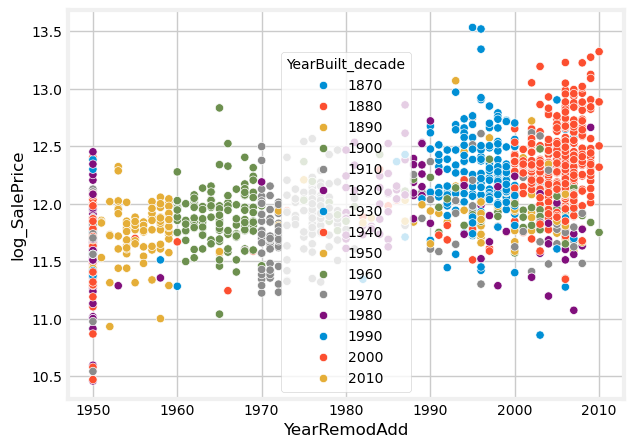

In [319]:
train_slice = data_train.copy()
train_slice = logify(train_slice, prefix='log_', dexes=1, drop_cols=True)

train_slice['YearBuilt_decade'] = (train_slice['YearBuilt'] // 10) * 10

# yr_col = 'YrSold'
# yr_col = 'YearBuilt'
yr_col = 'YearRemodAdd'
# yr_col = 'GarageYrBlt'

if yr_col == 'GarageYrBlt':
    train_slice = train_slice[train_slice['GarageYrBlt'] > 0]

if yr_col == 'YrSold':
    sns.boxplot(data=train_slice, x=yr_col, y='log_SalePrice', hue=yr_col, palette=palette_538)
else:
    # sns.lmplot(data=train_slice[train_slice['YearRemodAdd'] < 1951], x=yr_col, y='log_SalePrice', hue='YearBuilt_decade')
    sns.scatterplot(data=train_slice, x=yr_col, y='log_SalePrice', hue='YearBuilt_decade', palette=palette_538)

del train_slice, yr_col

How do each of these Year features relate to each other?

/tmp/ipykernel_13729/2096051611.py:14: UserWarning: 
The palette list has fewer values (6) than needed (14) and will cycle, which may produce an uninterpretable plot.
  sns.scatterplot(data=train_slice, x='YearBuilt', y=yr_col, hue='YearBuilt_decade', palette=palette_538)


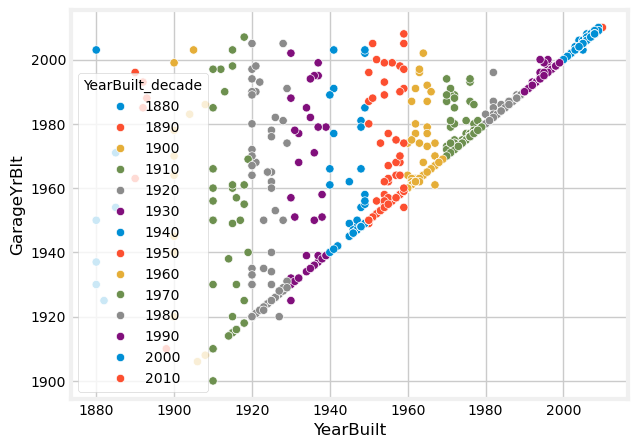

In [320]:
train_slice = data_train.copy()
train_slice = logify(train_slice, prefix='log_', dexes=1, drop_cols=True)

# train_slice['log_SalePrice'] = np.log1p(train_slice['SalePrice'])
train_slice['YearBuilt_decade'] = (train_slice['YearBuilt'] // 10) * 10

# yr_col = 'YrSold'
# yr_col = 'YearRemodAdd'
yr_col = 'GarageYrBlt'

if yr_col == 'GarageYrBlt':
    train_slice = train_slice[train_slice['GarageYrBlt'] > 0]

sns.scatterplot(data=train_slice, x='YearBuilt', y=yr_col, hue='YearBuilt_decade', palette=palette_538)

del train_slice, yr_col

There are some records for which the Garage appears to have been built before the home itself...

In [321]:
data_train[(data_train['GarageYrBlt'] < data_train['YearBuilt']) & (data_train['GarageYrBlt'] > 0)][['YearBuilt', 'GarageYrBlt', 'YearRemodAdd']]

,YearBuilt,GarageYrBlt,YearRemodAdd
29,1927,1920,1950
93,1910,1900,1998
324,1967,1961,2007
600,2005,2003,2005
736,1950,1949,1950
1103,1959,1954,1959
1376,1930,1925,1950
1414,1923,1922,2000
1418,1963,1962,1963


In [322]:
data_test[(data_test['GarageYrBlt'] < data_test['YearBuilt']) & (data_test['GarageYrBlt'] > 0)][['YearBuilt', 'GarageYrBlt', 'YearRemodAdd']]

,YearBuilt,GarageYrBlt,YearRemodAdd
61,1959,1956,1959
116,2010,2009,2010
345,1935,1920,1998
380,1978,1960,1978
435,1941,1940,1950
437,1935,1926,1950
662,1945,1925,1995
803,2006,2005,2007
1049,2006,2005,2006


We may need to treat these differently.

Now, it seems like in 1950 there was a burst of remodeling taking place. Some features are correlated with it, but nothing stands out:

In [323]:
train_slice = data_train.copy()
train_slice['log_SalePrice'] = np.log1p(train_slice['SalePrice'])

test_cols = {}

for col in train_slice.select_dtypes(include='object').columns:
    train_slice[col] = LabelEncoder().fit_transform(train_slice[col])

for col in train_slice.columns:
    if col == 'YearRemodAdd':
        continue
    
    test_cols[col] = mutual_info_regression(train_slice[[col]],
                                            train_slice['YearRemodAdd'],
                                            random_state=0)[0]

test_feat = sorted(test_cols, key=lambda k: test_cols[k], reverse=True)

test_mi_df = pd.Series({feat:test_cols[feat] for feat in test_feat}, index=test_feat, name='test_mi')

display(test_mi_df.head(9))

del train_slice, test_cols, test_feat, test_mi_df

YearBuilt       2.306022
GarageYrBlt     1.921661
Neighborhood    0.649877
Exterior2nd     0.366480
MSSubClass      0.340687
Exterior1st     0.334289
KitchenQual     0.289110
Foundation      0.271384
LotFrontage     0.268325
Name: test_mi, dtype: float64

Some of these remodelings match the age of the house itself, indicating this is not a true remodeling!

In [324]:
train_slice = data_train[data_train['YearRemodAdd'] == 1950][['YearBuilt', 'GarageYrBlt', 'YearRemodAdd']]

# train_slice['GarageBefore'] = train_slice['GarageYrBlt'] < train_slice['YearBuilt']
# train_slice[train_slice['GarageBefore'] & (train_slice['GarageYrBlt'] > 0)]

train_slice[train_slice['YearRemodAdd'] == train_slice['YearBuilt']]

,YearBuilt,GarageYrBlt,YearRemodAdd
90,1950,1950,1950
156,1950,1950,1950
296,1950,1950,1950
341,1950,1950,1950
459,1950,1950,1950
646,1950,1950,1950
736,1950,1949,1950
985,1950,1950,1950
1090,1950,1987,1950
1136,1950,1950,1950


,YearBuilt,GarageYrBlt,YearRemodAdd,AgeRemod
8,1931,1931,1950,19
9,1939,1939,1950,11
21,1930,1930,1950,20
29,1927,1920,1950,23
30,1920,1920,1950,30
...,...,...,...,...
1408,1910,1966,1950,40
1412,1949,1956,1950,1
1416,1885,1971,1950,65
1427,1945,1962,1950,5


,YearBuilt,GarageYrBlt,YearRemodAdd,AgeRemod
count,166.000000,166.000000,166.0,166.000000
mean,1928.879518,1676.313253,1950.0,21.120482
std,13.518918,674.632514,0.0,13.518918
min,1880.000000,0.000000,1950.0,1.000000
25%,1920.000000,1920.250000,1950.0,10.000000
50%,1928.000000,1940.000000,1950.0,22.000000
75%,1940.000000,1953.250000,1950.0,30.000000
max,1949.000000,2003.000000,1950.0,70.000000


<Axes: xlabel='AgeRemod', ylabel='Count'>

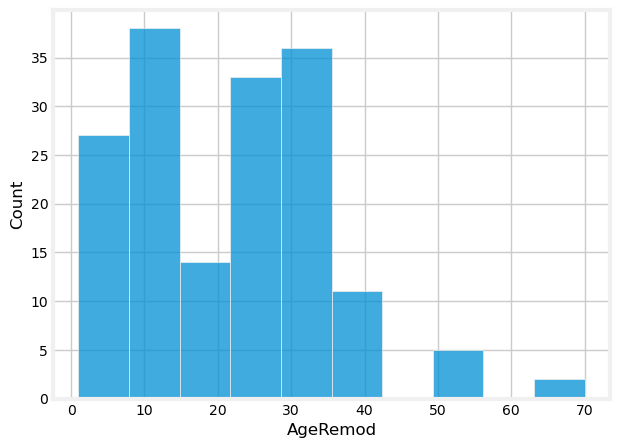

In [325]:
train_slice = data_train[data_train['YearRemodAdd'] == 1950][['YearBuilt', 'GarageYrBlt', 'YearRemodAdd']]

# train_slice['GarageBefore'] = train_slice['GarageYrBlt'] < train_slice['YearBuilt']
# train_slice[train_slice['GarageBefore'] & (train_slice['GarageYrBlt'] > 0)]

train_slice = train_slice[train_slice['YearRemodAdd'] != train_slice['YearBuilt']]
train_slice['AgeRemod'] = train_slice['YearRemodAdd'] - train_slice['YearBuilt']

display(train_slice)
display(train_slice.describe(include='all'))

sns.histplot(data=train_slice, x='AgeRemod')

In [326]:
train_slice = data_train[(data_train['YearRemodAdd'] - data_train['YearBuilt']) == 0][['YearBuilt', 'GarageYrBlt', 'YearRemodAdd']]

display(train_slice)

,YearBuilt,GarageYrBlt,YearRemodAdd
0,2003,2003,2003
1,1976,1976,1976
4,2000,2000,2000
7,1973,1973,1973
10,1965,1965,1965
...,...,...,...
1449,1970,0,1970
1450,1974,0,1974
1452,2005,2005,2005
1453,2006,0,2006


In [327]:
train_slice = data_train.copy()
train_slice['log_SalePrice'] = np.log1p(train_slice['SalePrice'])

train_slice['HouseAge'] = train_slice['YrSold'] - train_slice['YearBuilt']
train_slice['RemodAge'] = train_slice['YrSold'] - train_slice['YearRemodAdd']
train_slice['GarageAge'] = train_slice['YrSold'] - train_slice['GarageYrBlt']

train_slice['IsRemodeled'] = (train_slice['YearRemodAdd'] > train_slice['YearBuilt'])
train_slice['HasGarage'] = (train_slice['GarageYrBlt'] > 0)

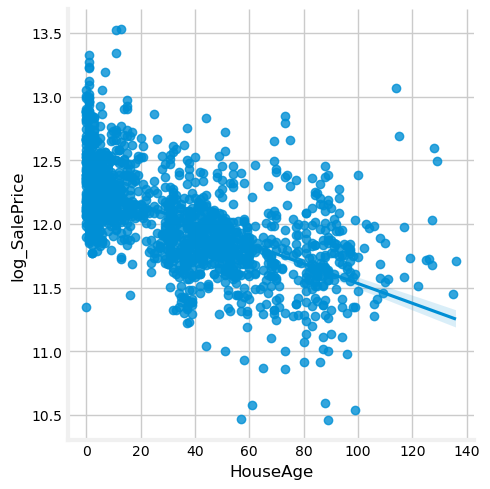

In [328]:
sns.lmplot(data=train_slice, x='HouseAge', y='log_SalePrice')

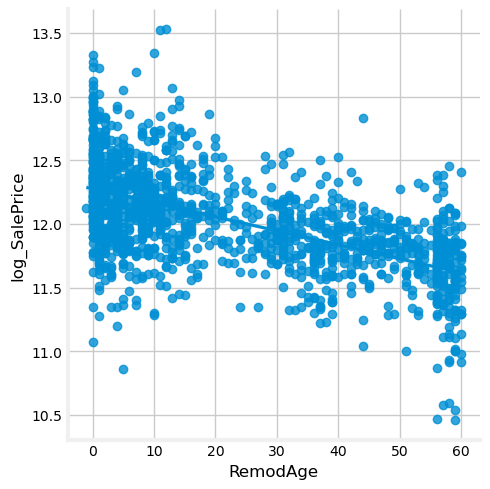

In [329]:
sns.lmplot(data=train_slice, x='RemodAge', y='log_SalePrice')

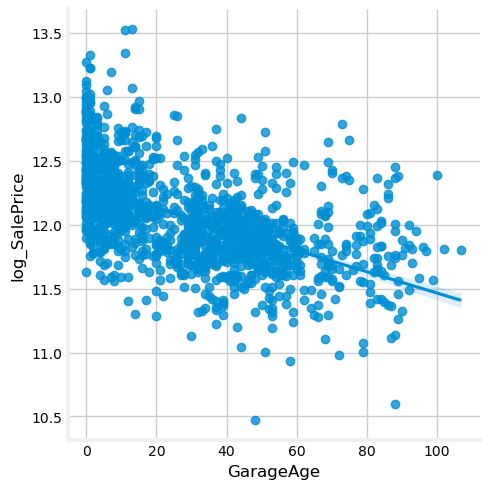

In [330]:
train_slice2 = train_slice[train_slice['GarageYrBlt'] > 0]
sns.lmplot(data=train_slice2, x='GarageAge', y='log_SalePrice')

del train_slice2

IsRemodeled
False    764
True     696
Name: count, dtype: int64

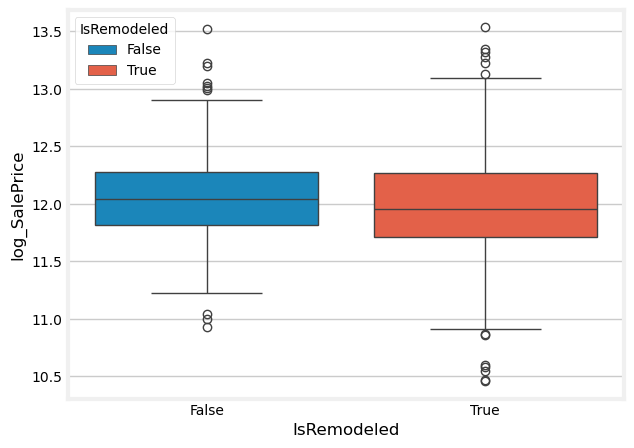

In [331]:
sns.boxplot(data=train_slice, x='IsRemodeled', y='log_SalePrice', hue='IsRemodeled')
display(train_slice['IsRemodeled'].value_counts())

HasGarage
True     1379
False      81
Name: count, dtype: int64

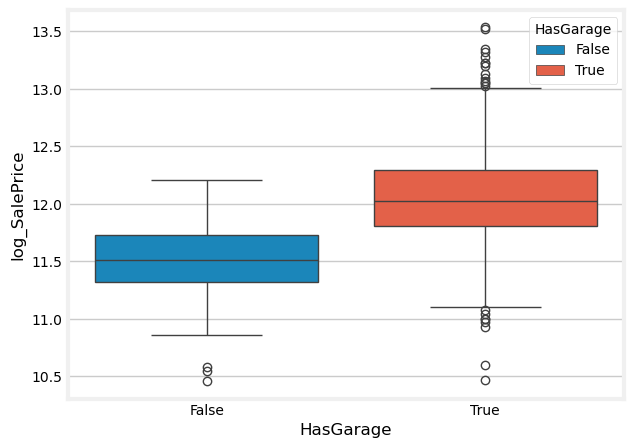

In [332]:
sns.boxplot(data=train_slice, x='HasGarage', y='log_SalePrice', hue='HasGarage')
display(train_slice['HasGarage'].value_counts())

In [333]:
test_cols = {}

for col in ['YearBuilt', 'YearRemodAdd', 'YrSold', 'HouseAge', 'RemodAge']:
    test_cols[col] = mutual_info_regression(train_slice[[col]],
                                            train_slice['log_SalePrice'],
                                            random_state=0)[0]

train_slice2 = train_slice[train_slice['GarageYrBlt'] > 0]
for col in ['GarageYrBlt', 'GarageAge']:
    test_cols[col] = mutual_info_regression(train_slice2[[col]],
                                            train_slice2['log_SalePrice'],
                                            random_state=0)[0]

test_feat = sorted(test_cols, key=lambda k: test_cols[k], reverse=True)

test_mi_df = pd.Series({feat:test_cols[feat] for feat in test_feat}, index=test_feat, name='test_mi')

display(test_mi_df)

del train_slice2, test_cols, test_feat

YearBuilt       0.355769
HouseAge        0.336872
RemodAge        0.263931
GarageYrBlt     0.259616
GarageAge       0.258036
YearRemodAdd    0.230648
YrSold          0.003768
Name: test_mi, dtype: float64

In [334]:
new_useful_features = []
new_useful_features += test_mi_df[test_mi_df > 0.25].index.to_list()
new_useful_features = list(set(new_useful_features))

print(new_useful_features)

['RemodAge', 'YearBuilt', 'GarageYrBlt', 'GarageAge', 'HouseAge']


In [335]:
del year_cols, train_slice, test_mi_df

#### Bathrooms & Rooms

Counting bathrooms and other rooms

In [336]:
[col for col in data_train.columns if ('oom' in col) or ('Rm' in col) or ('ath' in col) or ('bv' in col)]

['BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'TotRmsAbvGrd']

In [337]:
find_description('BedroomAbvGr')
find_description('TotRmsAbvGrd')
find_description('KitchenAbvGr')
find_description('HalfBath')

BedroomAbvGr: Bedrooms above grade (does NOT include basement bedrooms)

TotRmsAbvGrd: Total rooms above grade (does not include bathrooms)

KitchenAbvGr: Kitchens above grade

HalfBath: Half baths above grade



In [338]:
train_slice = data_train.copy()
train_slice['log_SalePrice'] = np.log1p(train_slice['SalePrice'])

train_slice['BathsAbvGr'] = train_slice['FullBath'] + 0.5*train_slice['HalfBath']

train_slice['BsmtBaths'] = train_slice['BsmtFullBath'] + 0.5*train_slice['BsmtHalfBath']

train_slice['AllBaths'] = train_slice['BathsAbvGr'] + train_slice['BsmtBaths']

train_slice['AllRmsAbvGr'] = train_slice['TotRmsAbvGrd'] + train_slice['BathsAbvGr']

train_slice['AllRooms'] = train_slice['AllRmsAbvGr'] + train_slice['BsmtBaths']

rms_cols = [col for col in train_slice.columns if ('oom' in col) or ('ath' in col) or ('Rms' in col) or ('bv' in col)]

display(train_slice[rms_cols])
display(train_slice[rms_cols].describe(include='all'))

test_cols = {}
for col in rms_cols:
    
    test_cols[col] = mutual_info_regression(train_slice[[col]],
                                            train_slice['log_SalePrice'],
                                            random_state=0)[0]

test_feat = sorted(test_cols, key=lambda k: test_cols[k], reverse=True)

test_mi_df = pd.Series({feat:test_cols[feat] for feat in test_feat}, index=test_feat, name='test_mi')

display(test_mi_df.head(9))

del test_cols, test_feat

,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,BathsAbvGr,BsmtBaths,AllBaths,AllRmsAbvGr,AllRooms
0,1,0,2,1,3,1,8,2.5,1.0,3.5,10.5,11.5
1,0,1,2,0,3,1,6,2.0,0.5,2.5,8.0,8.5
2,1,0,2,1,3,1,6,2.5,1.0,3.5,8.5,9.5
3,1,0,1,0,3,1,7,1.0,1.0,2.0,8.0,9.0
4,1,0,2,1,4,1,9,2.5,1.0,3.5,11.5,12.5
...,...,...,...,...,...,...,...,...,...,...,...,...
1455,0,0,2,1,3,1,7,2.5,0.0,2.5,9.5,9.5
1456,1,0,2,0,3,1,7,2.0,1.0,3.0,9.0,10.0
1457,0,0,2,0,4,1,9,2.0,0.0,2.0,11.0,11.0
1458,1,0,1,0,2,1,5,1.0,1.0,2.0,6.0,7.0


,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,BathsAbvGr,BsmtBaths,AllBaths,AllRmsAbvGr,AllRooms
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,1.756507,0.454110,2.210616,8.274315,8.728425
std,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.636015,0.514975,0.785399,2.078627,2.105684
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,1.000000,3.000000,3.000000
25%,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,1.000000,0.000000,2.000000,7.000000,7.000000
50%,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,2.000000,0.000000,2.000000,8.000000,8.500000
75%,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,2.500000,1.000000,2.500000,9.500000,10.000000
max,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.500000,3.000000,6.000000,16.000000,16.500000


AllRooms        0.408294
AllRmsAbvGr     0.359540
AllBaths        0.341060
BathsAbvGr      0.338586
FullBath        0.258037
TotRmsAbvGrd    0.217925
HalfBath        0.088508
BedroomAbvGr    0.070142
BsmtBaths       0.037919
Name: test_mi, dtype: float64

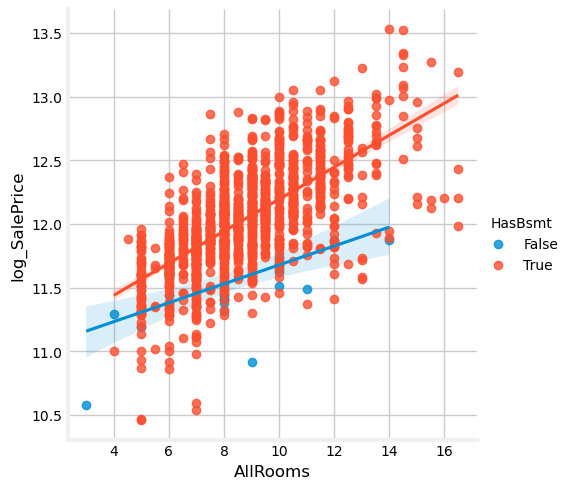

In [339]:
train_slice['HasBsmt'] = (train_slice['BsmtQual'] != 'NA')
sns.lmplot(data=train_slice, x='AllRooms', y='log_SalePrice', hue='HasBsmt')
# sns.lmplot(data=train_slice, x='AllRooms', y='log_SalePrice', hue='KitchenAbvGr')

<Axes: xlabel='AllRooms', ylabel='log_SalePrice'>

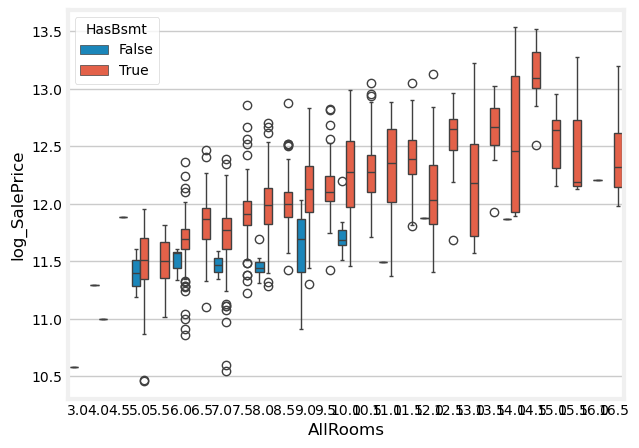

In [340]:
sns.boxplot(data=train_slice, x='AllRooms', y='log_SalePrice', hue='HasBsmt', palette=palette_538)

In [341]:
test_mi_df[test_mi_df>0.25]

AllRooms       0.408294
AllRmsAbvGr    0.359540
AllBaths       0.341060
BathsAbvGr     0.338586
FullBath       0.258037
Name: test_mi, dtype: float64

In [342]:
new_useful_features += test_mi_df[test_mi_df>0.25].index.to_list()
new_useful_features = list(set(new_useful_features))

print(new_useful_features)

['AllRmsAbvGr', 'RemodAge', 'YearBuilt', 'AllRooms', 'BathsAbvGr', 'GarageYrBlt', 'GarageAge', 'AllBaths', 'FullBath', 'HouseAge']


In [343]:
del rms_cols, train_slice, test_mi_df

#### Living Areas

Total room areas in all floors, etc.

In [344]:
livSF_cols = ['GrLivArea', '1stFlrSF', '2ndFlrSF', 'TotalBsmtSF']

for col in livSF_cols:
    find_description(col)

data_train[livSF_cols].describe()

GrLivArea: Above grade (ground) living area square feet

1stFlrSF: First Floor square feet

2ndFlrSF: Second floor square feet

TotalBsmtSF: Total square feet of basement area



,GrLivArea,1stFlrSF,2ndFlrSF,TotalBsmtSF
count,1460.000000,1460.000000,1460.000000,1460.000000
mean,1515.463699,1162.626712,346.992466,1057.429452
std,525.480383,386.587738,436.528436,438.705324
min,334.000000,334.000000,0.000000,0.000000
25%,1129.500000,882.000000,0.000000,795.750000
50%,1464.000000,1087.000000,0.000000,991.500000
75%,1776.750000,1391.250000,728.000000,1298.250000
max,5642.000000,4692.000000,2065.000000,6110.000000


In [345]:
train_slice = data_train.copy()
train_slice['log_SalePrice'] = np.log1p(train_slice['SalePrice'])

train_slice['Has2ndFlr'] = (train_slice['2ndFlrSF'] > 0)

train_slice['1and2FlrSF'] = (train_slice['1stFlrSF'] + train_slice['2ndFlrSF'])
train_slice['Abv2ndFlrSF'] = train_slice['GrLivArea'] - train_slice['1and2FlrSF']
train_slice['TotalSF'] = train_slice['TotalBsmtSF'] + train_slice['GrLivArea']

train_slice['FlrCount'] = (train_slice['1stFlrSF'] > 0).astype(int) + (train_slice['2ndFlrSF'] > 0).astype(int) + (train_slice['Abv2ndFlrSF'] > 0).astype(int)
train_slice['LvlCount'] = train_slice['FlrCount'] + (train_slice['TotalBsmtSF'] > 0).astype(int)

train_slice = logify(train_slice, prefix='log_', dexes=1, drop_cols=False)

area_cols = ['log_'+col for col in livSF_cols] + ['log_1and2FlrSF', 'log_Abv2ndFlrSF', 'log_TotalSF']

test_cols = {}
for col in area_cols:
    test_cols[col] = mutual_info_regression(train_slice[[col]],
                                            train_slice['log_SalePrice'],
                                            random_state=0)[0]

# now boolean/discrete:
for col in ['Has2ndFlr', 'FlrCount', 'LvlCount']:
    test_cols[col] = mutual_info_regression(train_slice[[col]],
                                            train_slice['log_SalePrice'],
                                            random_state=0)[0]

test_feat = sorted(test_cols, key=lambda k: test_cols[k], reverse=True)

test_mi_df = pd.Series({feat:test_cols[feat] for feat in test_feat}, index=test_feat, name='test_mi')

display(test_mi_df.head(9))

del test_cols, test_feat

log_TotalSF        0.666305
log_1and2FlrSF     0.495034
log_GrLivArea      0.478427
log_TotalBsmtSF    0.346257
log_1stFlrSF       0.300794
log_2ndFlrSF       0.207683
LvlCount           0.033118
Has2ndFlr          0.012242
FlrCount           0.009454
Name: test_mi, dtype: float64

In [346]:
new_useful_features += test_mi_df[test_mi_df > 0.25].index.to_list()
new_useful_features = list(set(new_useful_features))
print(new_useful_features)

['AllRmsAbvGr', 'RemodAge', 'YearBuilt', 'log_TotalBsmtSF', 'log_1stFlrSF', 'log_1and2FlrSF', 'log_GrLivArea', 'AllRooms', 'BathsAbvGr', 'GarageYrBlt', 'GarageAge', 'log_TotalSF', 'AllBaths', 'FullBath', 'HouseAge']


<Axes: xlabel='FlrCount', ylabel='log_SalePrice'>

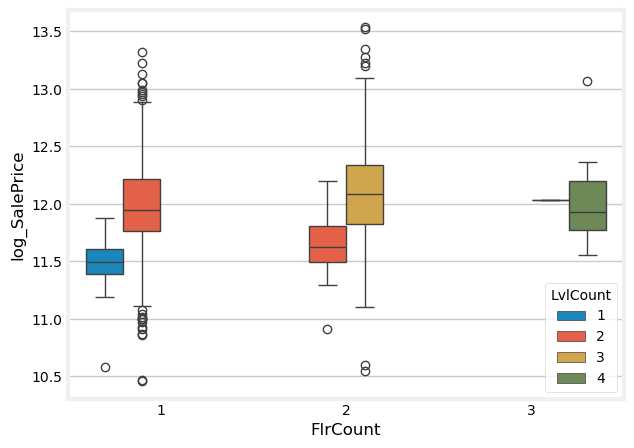

In [347]:
# sns.boxplot(data=train_slice, x='Has2ndFlr', y='log_SalePrice', hue='Has2ndFlr')
# sns.boxplot(data=train_slice, x='FlrCount', y='log_SalePrice', hue='FlrCount', palette=palette_538)
sns.boxplot(data=train_slice, x='FlrCount', y='log_SalePrice', hue='LvlCount', palette=palette_538)

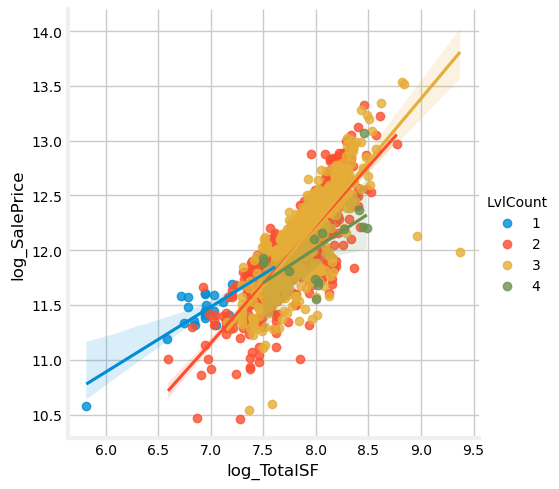

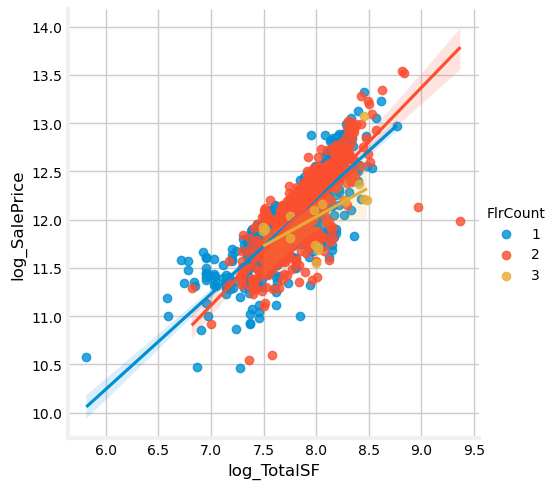

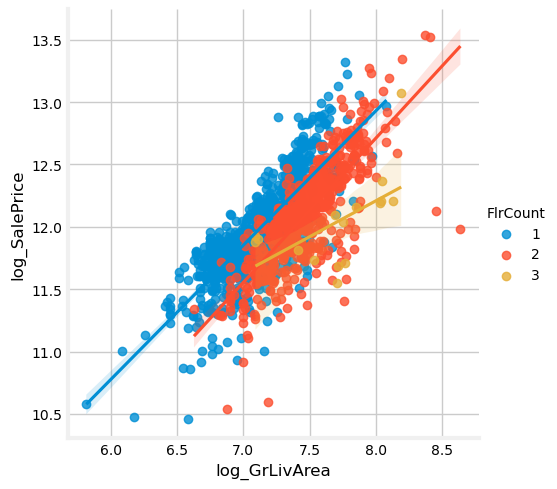

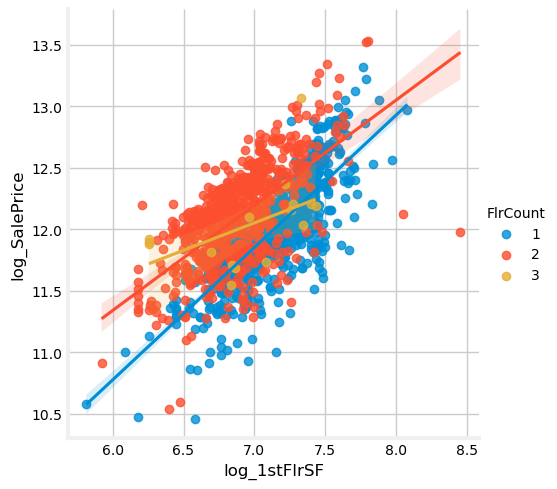

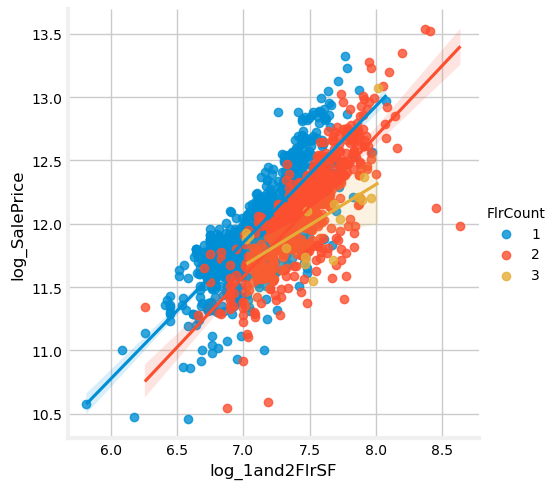

In [348]:
train_slice = logify(train_slice, prefix='log_', dexes=1, drop_cols=False)

sns.lmplot(data=train_slice, x='log_TotalSF', y='log_SalePrice', hue='LvlCount')
sns.lmplot(data=train_slice, x='log_TotalSF', y='log_SalePrice', hue='FlrCount')
sns.lmplot(data=train_slice, x='log_GrLivArea', y='log_SalePrice', hue='FlrCount')
sns.lmplot(data=train_slice, x='log_1stFlrSF', y='log_SalePrice', hue='FlrCount')
sns.lmplot(data=train_slice, x='log_1and2FlrSF', y='log_SalePrice', hue='FlrCount')

Now, let us look at the MI:

In [349]:
del livSF_cols, col, train_slice, test_mi_df

#### Lot Geometry

Let us look at the lot geometry:

In [350]:
lot_cols = [col for col in data_train.columns if ('Lot' in col)]
print(lot_cols, "\n")

for col in lot_cols:
    find_description(col)

['LotFrontage', 'LotArea', 'LotShape', 'LotConfig'] 

LotFrontage: Linear feet of street connected to property

LotArea: Lot size in square feet

LotShape: General shape of property

Reg	Regular
IR1	Slightly irregular
IR2	Moderately Irregular
IR3	Irregular

LotConfig: Lot configuration

Inside	Inside lot
Corner	Corner lot
CulDSac	Cul-de-sac
FR2	Frontage on 2 sides of property
FR3	Frontage on 3 sides of property



We are interesting in creating a 'LotDepth' and 'LotElongation' variables. They do **not** make sense if the lot's shape is very irregular:

In [351]:
data_train['LotShape'].value_counts()

LotShape
Reg    925
IR1    484
IR2     41
IR3     10
Name: count, dtype: int64

Only a few records are highly irregular, so a measure of 'LotDepth' will make sense for most of them:

In [352]:
train_slice = data_train.copy()
train_slice['log_SalePrice'] = np.log1p(train_slice['SalePrice'])

train_slice['LotDepth'] = train_slice['LotArea']/train_slice['LotFrontage']
train_slice['LotElongation'] = train_slice['LotDepth']/train_slice['LotFrontage']

lot_cols += ['LotDepth', 'LotElongation']

train_slice = logify(train_slice, prefix='log_', dexes=1, drop_cols=False)

In [353]:
train_slice[lot_cols].describe(include='all')

,LotFrontage,LotArea,LotShape,LotConfig,LotDepth,LotElongation
count,1460.000000,1460.000000,1460,1460,1460.000000,1460.000000
unique,NaN,NaN,4,5,NaN,NaN
top,NaN,NaN,Reg,Inside,NaN,NaN
freq,NaN,NaN,925,1052,NaN,NaN
mean,70.199658,10516.828082,NaN,NaN,149.260425,2.336850
std,22.431902,9981.264932,NaN,NaN,112.066798,1.798614
min,21.000000,1300.000000,NaN,NaN,26.915033,0.175915
25%,60.000000,7553.500000,NaN,NaN,116.415476,1.546245
50%,70.000000,9478.500000,NaN,NaN,130.000000,1.944773
75%,80.000000,11601.500000,NaN,NaN,157.446606,2.553663


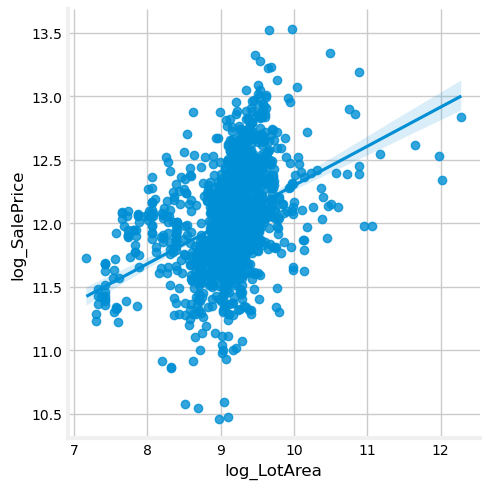

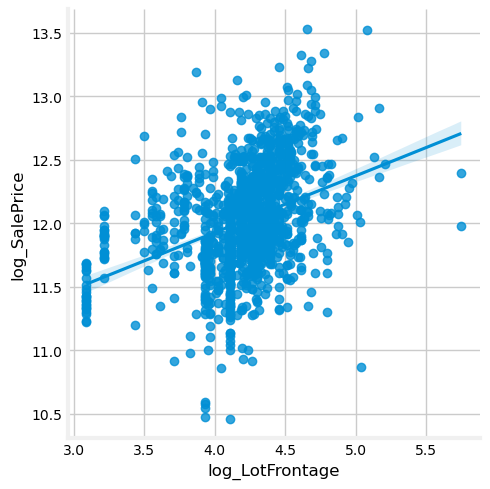

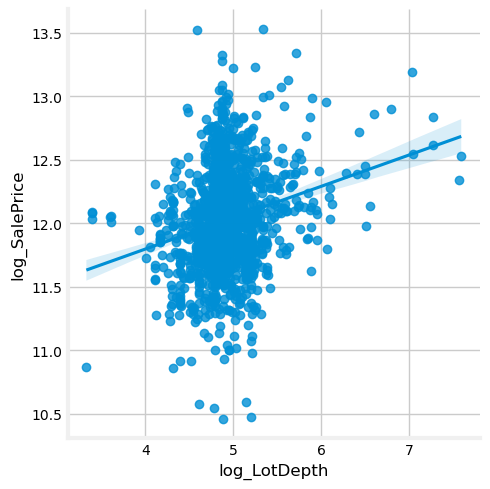

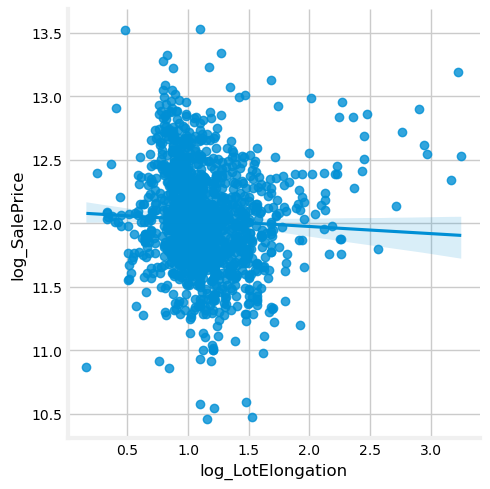

In [354]:
# train_slice2 = train_slice[train_slice['log_LotArea']<9.75]
# train_slice2 = train_slice2[8.5 < train_slice2['log_LotArea']]

sns.lmplot(data=train_slice, x='log_LotArea', y='log_SalePrice')
sns.lmplot(data=train_slice, x='log_LotFrontage', y='log_SalePrice')
sns.lmplot(data=train_slice, x='log_LotDepth', y='log_SalePrice')
sns.lmplot(data=train_slice, x='log_LotElongation', y='log_SalePrice')

In [355]:
test_cols = {}
for col in lot_cols:
    
    if train_slice[col].dtype == 'object':
        continue

    col = 'log_'+col

    test_cols[col] = mutual_info_regression(train_slice[[col]],
                                            train_slice['log_SalePrice'],
                                            random_state=0)[0]

test_feat = sorted(test_cols, key=lambda k: test_cols[k], reverse=True)

test_mi_df = pd.Series({feat:test_cols[feat] for feat in test_feat}, index=test_feat, name='test_mi')

display(test_mi_df.head(9))

del test_cols, test_feat

log_LotFrontage      0.228260
log_LotArea          0.198590
log_LotDepth         0.116718
log_LotElongation    0.075872
Name: test_mi, dtype: float64

In [356]:
new_useful_features += test_mi_df[test_mi_df > 0.25].index.to_list()
new_useful_features = list(set(new_useful_features))
print(new_useful_features)

['AllRmsAbvGr', 'RemodAge', 'YearBuilt', 'log_TotalBsmtSF', 'log_1stFlrSF', 'log_1and2FlrSF', 'log_GrLivArea', 'AllRooms', 'BathsAbvGr', 'GarageYrBlt', 'GarageAge', 'log_TotalSF', 'AllBaths', 'FullBath', 'HouseAge']


In [357]:
del lot_cols, train_slice, test_mi_df

#### Garage

Garage area / # cars

In [358]:
garage_cols = [col for col in data_train.columns if 'arage' in col]
print(garage_cols)

['GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond']


In [359]:
train_slice = data_train.copy()
train_slice['log_SalePrice'] = np.log1p(train_slice['SalePrice'])

train_slice['GarageAreaPerCar'] = train_slice['GarageArea'] / train_slice['GarageCars']
train_slice['GarageAreaPerCar'] = train_slice['GarageAreaPerCar'].fillna(0)

train_slice = logify(train_slice, prefix='log_', dexes=1, drop_cols=False)

In [360]:
train_slice['GarageAreaPerCar'].describe()

count    1460.000000
mean      256.935274
std        87.957630
min         0.000000
25%       225.333333
50%       263.500000
75%       290.000000
max       924.000000
Name: GarageAreaPerCar, dtype: float64

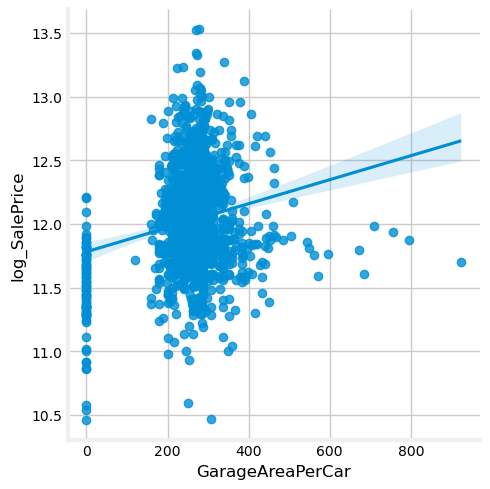

In [361]:
sns.lmplot(data=train_slice, x='GarageAreaPerCar', y='log_SalePrice')

In [362]:
test_cols = {}
for col in ['GarageAreaPerCar', 'log_GarageAreaPerCar']:

    test_cols[col] = mutual_info_regression(train_slice[[col]],
                                            train_slice['log_SalePrice'],
                                            random_state=0)[0]

test_feat = sorted(test_cols, key=lambda k: test_cols[k], reverse=True)

test_mi_df = pd.Series({feat:test_cols[feat] for feat in test_feat}, index=test_feat, name='test_mi')

display(test_mi_df.head(9))

del test_cols, test_feat

GarageAreaPerCar        0.143175
log_GarageAreaPerCar    0.119218
Name: test_mi, dtype: float64

In [363]:
new_useful_features += test_mi_df[test_mi_df > 0.25].index.to_list()
new_useful_features = list(set(new_useful_features))
print(new_useful_features)

['AllRmsAbvGr', 'RemodAge', 'YearBuilt', 'log_TotalBsmtSF', 'log_1stFlrSF', 'log_1and2FlrSF', 'log_GrLivArea', 'AllRooms', 'BathsAbvGr', 'GarageYrBlt', 'GarageAge', 'log_TotalSF', 'AllBaths', 'FullBath', 'HouseAge']


In [364]:
del garage_cols, train_slice, test_mi_df

#### Porch and additional features

Total porch area and additional features (such as deck, or pool)

In [365]:
porch_deck_cols = [col for col in data_train.columns if ('orch' in col) or ('Deck' in col)]
print(porch_deck_cols, "\n")

for col in porch_deck_cols:
    find_description(col)

['WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch'] 

WoodDeckSF: Wood deck area in square feet

OpenPorchSF: Open porch area in square feet

EnclosedPorch: Enclosed porch area in square feet

3SsnPorch: Three season porch area in square feet

ScreenPorch: Screen porch area in square feet



In [366]:
train_slice = data_train.copy()
train_slice['log_SalePrice'] = np.log1p(train_slice['SalePrice'])

train_slice['PorchOrDeckSF'] = sum([train_slice[col] for col in porch_deck_cols])

train_slice['ExtraSF'] = train_slice['PorchOrDeckSF'] + train_slice['PoolArea']

train_slice['HasPorch'] = (sum([train_slice[col] for col in porch_deck_cols if 'orch' in col]) > 0)
train_slice['HasDeck'] = (train_slice['WoodDeckSF'] > 0)
train_slice['HasPorchOrDeck'] = (train_slice['PorchOrDeckSF'] > 0)
train_slice['HasPool'] = (train_slice['PoolArea'] > 0)
train_slice['HasMiscFeature'] = (train_slice['MiscFeature'] != 'NA')

train_slice['HasExtra'] = train_slice['HasPorchOrDeck'] | train_slice['HasPool'] | train_slice['HasMiscFeature']

train_slice['ExtraCount'] = train_slice['HasPorch'].astype(int) + train_slice['HasDeck'].astype(int) + train_slice['HasPool'].astype(int) + train_slice['HasMiscFeature'].astype(int)

train_slice = logify(train_slice, prefix='log_', dexes=1, drop_cols=False)

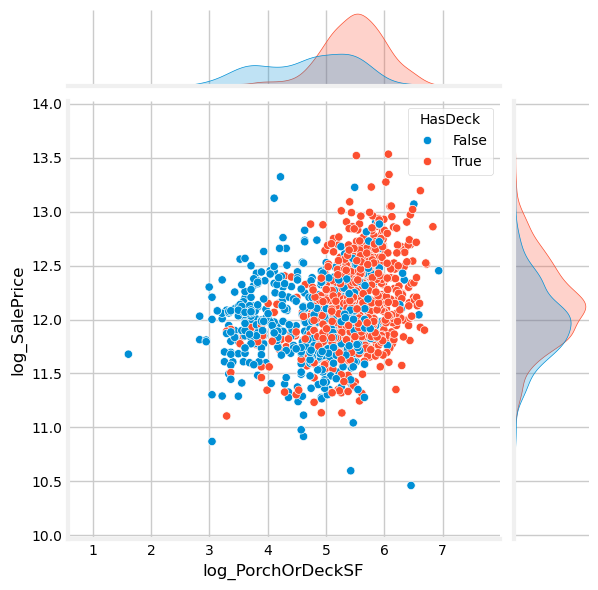

In [367]:
sns.jointplot(data=train_slice[train_slice['log_PorchOrDeckSF']>0], x='log_PorchOrDeckSF', y='log_SalePrice', hue='HasDeck')

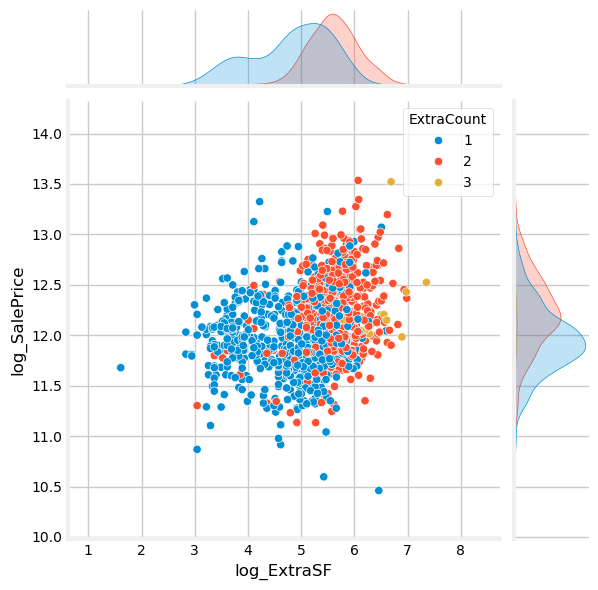

In [368]:
sns.jointplot(data=train_slice[train_slice['log_PorchOrDeckSF']>0], x='log_ExtraSF', y='log_SalePrice', hue='ExtraCount', palette=palette_538)

<Axes: xlabel='ExtraCount', ylabel='log_SalePrice'>

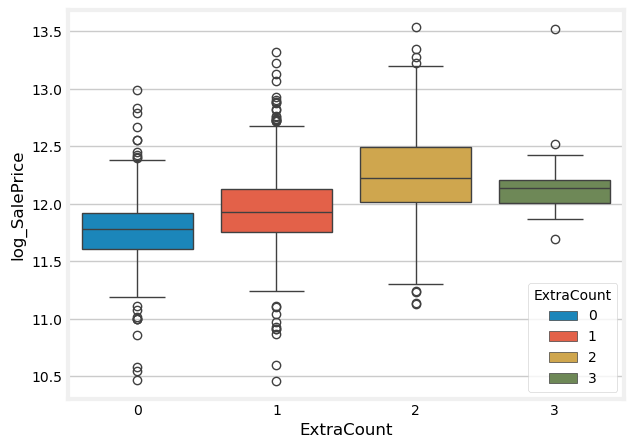

In [369]:
sns.boxplot(data=train_slice, x='ExtraCount', y='log_SalePrice', hue='ExtraCount', palette=palette_538)

This new feature is pretty balanced (except for the value of "3"):

In [370]:
train_slice['ExtraCount'].value_counts()

ExtraCount
1    694
2    504
0    242
3     20
Name: count, dtype: int64

In [371]:
area_cols = ['log_'+col for col in porch_deck_cols] + ['log_PorchOrDeckSF', 'log_ExtraSF', 'log_PoolArea']

test_cols = {}
for col in area_cols:
    test_cols[col] = mutual_info_regression(train_slice[[col]],
                                            train_slice['log_SalePrice'],
                                            random_state=0)[0]

# now boolean/discrete:
for col in ['HasPorch', 'HasDeck', 'HasPorchOrDeck', 'HasPool', 'HasMiscFeature', 'HasExtra', 'ExtraCount']:
    test_cols[col] = mutual_info_regression(train_slice[[col]],
                                            train_slice['log_SalePrice'],
                                            discrete_features=True,
                                            random_state=0)[0]

test_feat = sorted(test_cols, key=lambda k: test_cols[k], reverse=True)

test_mi_df = pd.Series({feat:test_cols[feat] for feat in test_feat}, index=test_feat, name='test_mi')

display(test_mi_df.head(9))

del test_cols, test_feat, area_cols

log_OpenPorchSF      0.152973
ExtraCount           0.138515
log_ExtraSF          0.106956
log_PorchOrDeckSF    0.104704
log_WoodDeckSF       0.077990
HasDeck              0.073458
HasPorch             0.066448
HasPorchOrDeck       0.057358
HasExtra             0.053701
Name: test_mi, dtype: float64

In [372]:
new_useful_features += test_mi_df[test_mi_df > 0.25].index.to_list()
new_useful_features = list(set(new_useful_features))
print(new_useful_features)

['AllRmsAbvGr', 'RemodAge', 'YearBuilt', 'log_TotalBsmtSF', 'log_1stFlrSF', 'log_1and2FlrSF', 'log_GrLivArea', 'AllRooms', 'BathsAbvGr', 'GarageYrBlt', 'GarageAge', 'log_TotalSF', 'AllBaths', 'FullBath', 'HouseAge']


In [373]:
del porch_deck_cols, train_slice, test_mi_df

#### Quality $\times$ Condition

In [374]:
qual_cond_cols = [col for col in data_train.columns if ('ond' in col) or ('ual' in col)]
print(qual_cond_cols)

['Condition1', 'Condition2', 'OverallQual', 'OverallCond', 'ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond', 'LowQualFinSF', 'KitchenQual', 'GarageQual', 'GarageCond', 'SaleCondition']


In [375]:
train_slice = data_train.copy()
train_slice['log_SalePrice'] = np.log1p(train_slice['SalePrice'])

train_slice['OverallQualCond'] = train_slice['OverallQual']*train_slice['OverallCond']
train_slice['GarageQualCond'] = train_slice['GarageQual']+'_'+train_slice['GarageCond']

for col in qual_cond_cols+['OverallQualCond', 'GarageQualCond']:
    train_slice[col] = LabelEncoder().fit_transform(train_slice[col])

test_cols = {}
for col in qual_cond_cols:
    test_cols[col] = mutual_info_regression(train_slice[[col]],
                                            train_slice['log_SalePrice'],
                                            discrete_features=True,
                                            random_state=0)[0]

# now boolean/discrete:
for col in ['OverallQualCond', 'GarageQualCond']:
    test_cols[col] = mutual_info_regression(train_slice[[col]],
                                            train_slice['log_SalePrice'],
                                            discrete_features=True,
                                            random_state=0)[0]

test_feat = sorted(test_cols, key=lambda k: test_cols[k], reverse=True)

test_mi_df = pd.Series({feat:test_cols[feat] for feat in test_feat}, index=test_feat, name='test_mi')

display(test_mi_df.head(9))

del test_cols, test_feat

OverallQual        0.570135
OverallQualCond    0.441198
ExterQual          0.328419
BsmtQual           0.327429
KitchenQual        0.321213
OverallCond        0.112981
GarageQualCond     0.081307
GarageCond         0.078010
SaleCondition      0.077530
Name: test_mi, dtype: float64

<Axes: xlabel='SaleCondition', ylabel='log_SalePrice'>

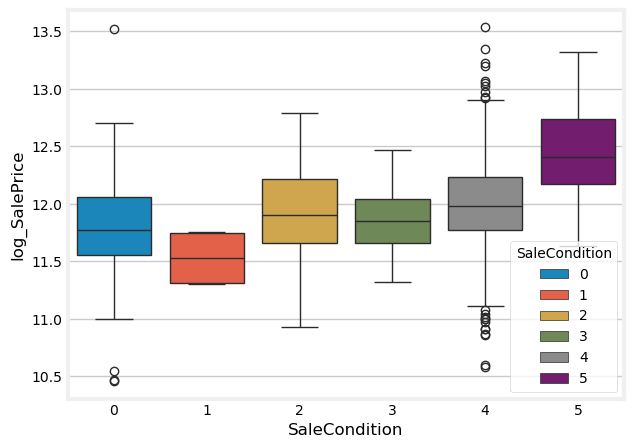

In [376]:
sns.boxplot(data=train_slice, x='SaleCondition', y='log_SalePrice', hue='SaleCondition', palette=palette_538)

/tmp/ipykernel_13729/3768462555.py:8: UserWarning: 
The palette list has fewer values (6) than needed (9) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(data=train_slice, x='OverallCond', y='log_SalePrice', hue='OverallCond', palette=palette_538, ax=axs[0])
/tmp/ipykernel_13729/3768462555.py:9: UserWarning: 
The palette list has fewer values (6) than needed (10) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(data=train_slice, x='OverallQual', y='log_SalePrice', hue='OverallQual', palette=palette_538, ax=axs[1])


<Axes: xlabel='ExterQual', ylabel='log_SalePrice'>

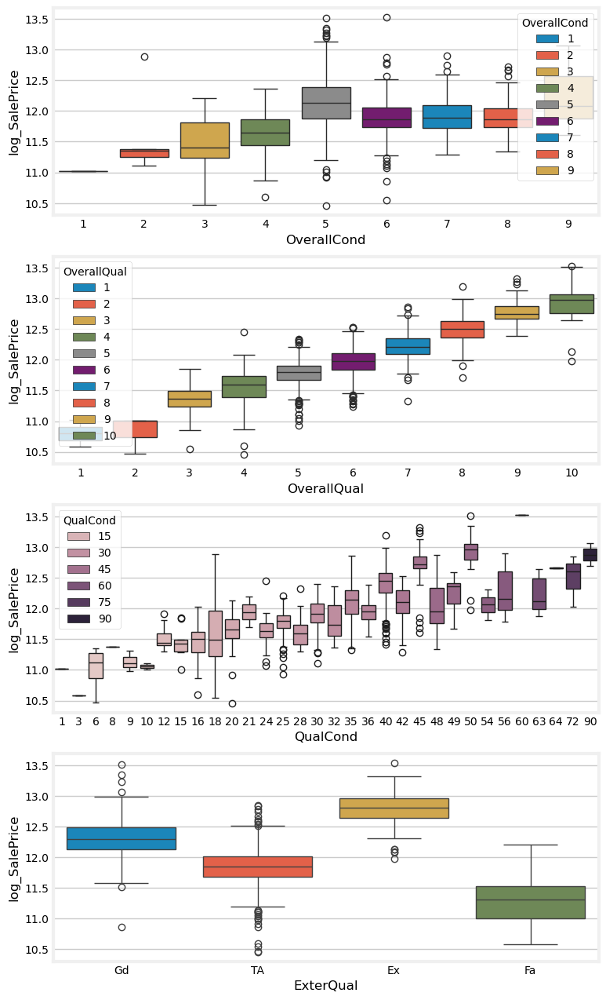

In [377]:
train_slice = data_train.copy()
train_slice['log_SalePrice'] = np.log1p(train_slice['SalePrice'])

train_slice['QualCond'] = train_slice['OverallQual']*train_slice['OverallCond']

fig, axs = plt.subplots(4, 1, figsize=(8, 15))

sns.boxplot(data=train_slice, x='OverallCond', y='log_SalePrice', hue='OverallCond', palette=palette_538, ax=axs[0])
sns.boxplot(data=train_slice, x='OverallQual', y='log_SalePrice', hue='OverallQual', palette=palette_538, ax=axs[1])
sns.boxplot(data=train_slice, x='QualCond', y='log_SalePrice', hue='QualCond', ax=axs[2])

sns.boxplot(data=train_slice, x='ExterQual', y='log_SalePrice', hue='ExterQual', ax=axs[3])

In [378]:
new_useful_features += test_mi_df[test_mi_df > 0.25].index.to_list()
new_useful_features = list(set(new_useful_features))
print(new_useful_features)

['log_GrLivArea', 'HouseAge', 'RemodAge', 'log_TotalBsmtSF', 'log_1and2FlrSF', 'OverallQualCond', 'AllRooms', 'OverallQual', 'KitchenQual', 'AllRmsAbvGr', 'BsmtQual', 'log_1stFlrSF', 'BathsAbvGr', 'GarageYrBlt', 'ExterQual', 'AllBaths', 'FullBath', 'YearBuilt', 'GarageAge', 'log_TotalSF']


In [379]:
del qual_cond_cols, train_slice, test_mi_df

### New Features: Target Encoding (Neighborhood, MS..., and others)

In [380]:
class_cols = ['Neighborhood', 'MSSubClass', 'MSZoning']

for col in class_cols:
    find_description(col)
    print(data_train[col].value_counts(), "\n")

Neighborhood: Physical locations within Ames city limits

Blmngtn	Bloomington Heights
Blueste	Bluestem
BrDale	Briardale
BrkSide	Brookside
ClearCr	Clear Creek
CollgCr	College Creek
Crawfor	Crawford
Edwards	Edwards
Gilbert	Gilbert
IDOTRR	Iowa DOT and Rail Road
MeadowV	Meadow Village
Mitchel	Mitchell
Names	North Ames
NoRidge	Northridge
NPkVill	Northpark Villa
NridgHt	Northridge Heights
NWAmes	Northwest Ames
OldTown	Old Town
SWISU	South & West of Iowa State University
Sawyer	Sawyer
SawyerW	Sawyer West
Somerst	Somerset
StoneBr	Stone Brook
Timber	Timberland
Veenker	Veenker

Neighborhood
NAmes      225
CollgCr    150
OldTown    113
Edwards    100
Somerst     86
Gilbert     79
NridgHt     77
Sawyer      74
NWAmes      73
SawyerW     59
BrkSide     58
Crawfor     51
Mitchel     49
NoRidge     41
Timber      38
IDOTRR      37
ClearCr     28
SWISU       25
StoneBr     25
Blmngtn     17
MeadowV     17
BrDale      16
Veenker     11
NPkVill      9
Blueste      2
Name: count, dtype: int64 

MSSubClas

We could create a feature that takes these categorical varaibles and outputs the exponential of the mean of the logs of the Sale Prices, and another for the median:

In [381]:
train_slice = data_train.copy()
train_slice['log_SalePrice'] = np.log1p(train_slice['SalePrice'])

for col in class_cols:
    print(np.exp(train_slice.groupby(col)['log_SalePrice'].mean()))
    train_slice[col+'ExpMeanLogPrice'] = train_slice.groupby(col)['log_SalePrice'].transform(lambda x: np.exp(x.mean()))
    
    print(train_slice.groupby(col)['SalePrice'].median())
    train_slice[col+'MedianPrice'] = train_slice.groupby(col)['SalePrice'].transform('median')

Neighborhood
Blmngtn    192802.351297
Blueste    136836.672720
BrDale     103556.659340
BrkSide    118153.029938
ClearCr    206882.246625
CollgCr    191692.287178
Crawfor    200118.333666
Edwards    122066.422399
Gilbert    190195.661353
IDOTRR      93610.766850
MeadowV     96233.505202
Mitchel    152352.826497
NAmes      142636.088785
NPkVill    142412.694867
NWAmes     185463.684868
NoRidge    319976.669524
NridgHt    302372.428979
OldTown    121039.631463
SWISU      138474.640008
Sawyer     134790.244378
SawyerW    178205.963710
Somerst    218928.433941
StoneBr    292286.453727
Timber     234089.729080
Veenker    229619.847866
Name: log_SalePrice, dtype: float64
Neighborhood
Blmngtn    191000.0
Blueste    137500.0
BrDale     106000.0
BrkSide    124300.0
ClearCr    200250.0
CollgCr    197200.0
Crawfor    200624.0
Edwards    121750.0
Gilbert    181000.0
IDOTRR     103000.0
MeadowV     88000.0
Mitchel    153500.0
NAmes      140000.0
NPkVill    146000.0
NWAmes     182900.0
NoRidge    30

The results are reasonable:

In [382]:
display(train_slice[['Neighborhood','NeighborhoodExpMeanLogPrice','NeighborhoodMedianPrice','SalePrice']])

display(train_slice[train_slice['Neighborhood']=='Blueste'][['Neighborhood','NeighborhoodExpMeanLogPrice','NeighborhoodMedianPrice','SalePrice']])

display(train_slice[train_slice['MSZoning']=='C (all)'][['MSZoning','MSZoningExpMeanLogPrice','MSZoningMedianPrice','SalePrice']])

del train_slice

,Neighborhood,NeighborhoodExpMeanLogPrice,NeighborhoodMedianPrice,SalePrice
0,CollgCr,191692.287178,197200.0,208500.0
1,Veenker,229619.847866,218000.0,181500.0
2,CollgCr,191692.287178,197200.0,223500.0
3,Crawfor,200118.333666,200624.0,140000.0
4,NoRidge,319976.669524,301500.0,250000.0
...,...,...,...,...
1455,Gilbert,190195.661353,181000.0,175000.0
1456,NWAmes,185463.684868,182900.0,210000.0
1457,Crawfor,200118.333666,200624.0,266500.0
1458,NAmes,142636.088785,140000.0,142125.0


,Neighborhood,NeighborhoodExpMeanLogPrice,NeighborhoodMedianPrice,SalePrice
599,Blueste,136836.67272,137500.0,151000.0
956,Blueste,136836.67272,137500.0,124000.0


,MSZoning,MSZoningExpMeanLogPrice,MSZoningMedianPrice,SalePrice
30,C (all),67391.588425,74700.0,40000.0
88,C (all),67391.588425,74700.0,85000.0
93,C (all),67391.588425,74700.0,133900.0
495,C (all),67391.588425,74700.0,34900.0
557,C (all),67391.588425,74700.0,108000.0
711,C (all),67391.588425,74700.0,102776.0
812,C (all),67391.588425,74700.0,55993.0
916,C (all),67391.588425,74700.0,35311.0
1061,C (all),67391.588425,74700.0,81000.0
1279,C (all),67391.588425,74700.0,68400.0


However, the problem is that this method may lead to target leakage, which in turn could be reflected as overperforming (due to overfitting) on the training set, but underperforming in the validation/test set. The best approach is to do **Out-of-fold target encoding** (a.k.a. **K-fold target encoding**).

For that, we use the following function.

In [383]:
def add_target_encoded_features(
    X: pd.DataFrame,
    y: pd.Series,
    cols: list[str],
    new_col_suffix: str = "",
    n_splits: int = 5,
    smoothing: float = 20.0,
    random_state: int = 0):
    """
    Performs out-of-fold target encoding on specified categorical columns and returns the transformed DataFrame along with fitted encoders.

    This function encodes each column in `cols` using K-fold target encoding, ensuring out-of-fold separation to reduce leakage.
    It also fits a final encoder on the full data for use at inference time.

    Parameters
    ----------
    X : pd.DataFrame
        Input DataFrame containing training features.
    y : pd.Series
        Target variable (numeric).
    cols : list of str
        List of categorical column names to encode.
    new_col_suffix : str, optional
        Suffix to append to the original column name for the encoded column. If empty, the original name is used.
    n_splits : int, default 5
        Number of folds to use for out-of-fold encoding.
    smoothing : float, default 20.0
        Smoothing parameter used to balance category mean and global mean:
            encoded = (n_c * mean_c + m * mean_global) / (n_c + m)
    random_state : int, default 0
        Random seed for reproducibility of the K-fold splits.

    Returns
    -------
    pd.DataFrame
        A copy of the input DataFrame `X` with additional target-encoded columns.
    dict
        A dictionary mapping each column name to its fitted `TargetEncoder` (trained on the full dataset).
"""


    # 1) Preparing outputs
    X_te = X.copy() # encoded dataframe
    final_encoders = {} # dictionary of encoders

    for col in cols:

        # 2) First, we prepare the final encoder on the **entire** dataset, so we can use it on unseen data (validation/test)
        final_te = TargetEncoder(smoothing=smoothing, cols=[col])
        final_te.fit(X_te[[col]], y)
        final_encoders[col] = final_te

        # Now, we proceed with the Out-Of-Fold encoding:
        
        # 3) Prepare an array to hold our OOF encodings
        oof_encoded = np.zeros(len(X), dtype=float)

        # 4) Create the KFold splitter
        kf = KFold(n_splits=n_splits, shuffle=True, random_state=random_state)

        # 5) Loop over each fold
        for train_idx, valid_idx in kf.split(X_te):
            # a) Split into "encoding‐training" and "encoding‐validation"
            X_train_f, X_valid_f = X_te.iloc[train_idx], X_te.iloc[valid_idx]
            y_train_f = y.iloc[train_idx]

            # b) Fit a fresh TargetEncoder on the encoding‐training folds
            te = TargetEncoder(smoothing=smoothing, cols=[col])
            te.fit(X_train_f[[col]], y_train_f)

            # c) Transform the validation fold; assign into our OOF array
            oof_encoded[valid_idx] = te.transform(X_valid_f[[col]])[col].values

        # 6) Decide where to put the OOF results in X_te
        new_col = col + new_col_suffix
        X_te[new_col] = oof_encoded

    return X_te, final_encoders



# def add_target_encoded_feature(
#     X: pd.DataFrame,
#     y: pd.Series,
#     col: str,
#     new_col: str = None,
#     n_splits: int = 5,
#     smoothing: float = 20.0,
#     random_state: int = 0
# ):
#     """
#     Performs out‑of‑fold target encoding on X[col] and adds it back to X.

#     Parameters
#     ----------
#     X : pd.DataFrame
#         Training features.
#     y : pd.Series
#         Numeric target.
#     col : str
#         Name of the categorical column to encode.
#     new_col : str, optional
#         If provided, the OOF‐encoded values will be put in X[new_col].
#         Otherwise, X[col] will be overwritten.
#     n_splits : int
#         Number of folds for out‑of‑fold encoding.
#     smoothing : float
#         Smoothing parameter m in the formula
#             encoded = (n_c * mean_c + m * mean_global) / (n_c + m)
#     random_state : int
#         Random seed for reproducibility.

#     Returns
#     -------
#     final_encoder : TargetEncoder
#         Fitted on the entire X,y, for use at inference time.
#     """
#     # 1) Prepare an array to hold our OOF encodings
#     oof_encoded = np.zeros(len(X), dtype=float)

#     # 2) Create the KFold splitter
#     kf = KFold(n_splits=n_splits, shuffle=True, random_state=random_state)

#     # 3) Loop over each fold
#     for train_idx, valid_idx in kf.split(X):
#         # a) Split into "encoding‐training" and "encoding‐validation"
#         X_train_f, X_valid_f = X.iloc[train_idx], X.iloc[valid_idx]
#         y_train_f = y.iloc[train_idx]

#         # b) Fit a fresh TargetEncoder on the encoding‐training folds
#         te = TargetEncoder(smoothing=smoothing, cols=[col])
#         te.fit(X_train_f, y_train_f)

#         # c) Transform the validation fold; assign into our OOF array
#         oof_encoded[valid_idx] = te.transform(X_valid_f)[col].values

#     # 4) Decide where to put the OOF results in X
#     encoded_col = new_col or col
#     X[encoded_col] = oof_encoded

#     # 5) Finally, fit one more encoder on the **entire** dataset 
#     #    so we can use it on unseen data (validation/test)
#     final_encoder = TargetEncoder(smoothing=smoothing, cols=[col])
#     final_encoder.fit(X[[col]], y)

#     return final_encoder

Having defined the function, we can test it on a copy of the training data, to see it in action

In [384]:
train_slice = data_train.copy()
train_slice['log_SalePrice'] = np.log1p(train_slice['SalePrice'])

X_train = train_slice.drop(columns=['SalePrice', 'log_SalePrice'])
y_train = train_slice['log_SalePrice']

X_train, final_te = add_target_encoded_features(X=X_train,
                                                y=y_train,
                                                cols=['Neighborhood'],
                                                new_col_suffix='_TE',
                                                n_splits=5,
                                                smoothing=20,
                                                random_state=42)

Compare the results to the training target, and to the transformed test data:

In [385]:
print("y_train:")
display(y_train.describe())
print("\n","X_train['Neighborhood_TE']:")
display(X_train['Neighborhood_TE'].describe())
print("\n","final_te(data_test['Neighborhood']):")
print(final_te['Neighborhood'].transform(data_test['Neighborhood']).describe())
print("\n","(X_train['Neighborhood_TE'] - y_train):")
display((X_train['Neighborhood_TE'] - y_train).describe())

del train_slice, final_te

y_train:


count    1460.000000
mean       12.024057
std         0.399449
min        10.460271
25%        11.775105
50%        12.001512
75%        12.273736
max        13.534474
Name: log_SalePrice, dtype: float64


 X_train['Neighborhood_TE']:


count    1460.000000
mean       12.017931
std         0.237735
min        11.631704
25%        11.838187
50%        12.049444
75%        12.160696
max        12.569861
Name: Neighborhood_TE, dtype: float64


 final_te(data_test['Neighborhood']):
       Neighborhood
count   1459.000000
mean      12.012389
std        0.259781
min       11.619720
25%       11.824862
50%       11.951074
75%       12.163437
max       12.586860

 (X_train['Neighborhood_TE'] - y_train):


count    1460.000000
mean       -0.006126
std         0.280830
min        -1.353143
25%        -0.156932
50%         0.001224
75%         0.141596
max         1.269464
dtype: float64

Having tested this, let us apply it in large scale, and compute the mutual information with the sale price:

In [386]:
data_train.select_dtypes(include=['object', 'int64'])

,Id,MSSubClass,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,MoSold,YrSold,SaleType,SaleCondition
0,1,60,RL,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,1,0,2,1,3,1,Gd,8,Typ,0,NA,Attchd,2003,RFn,2,TA,TA,Y,NA,NA,NA,2,2008,WD,Normal
1,2,20,RL,Pave,NA,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,BrkFace,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,GasA,Ex,Y,SBrkr,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976,RFn,2,TA,TA,Y,NA,NA,NA,5,2007,WD,Normal
2,3,60,RL,Pave,NA,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,GasA,Ex,Y,SBrkr,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001,RFn,2,TA,TA,Y,NA,NA,NA,9,2008,WD,Normal
3,4,70,RL,Pave,NA,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,BrkFace,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,GasA,Gd,Y,SBrkr,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998,Unf,3,TA,TA,Y,NA,NA,NA,2,2006,WD,Abnorml
4,5,60,RL,Pave,NA,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000,RFn,3,TA,TA,Y,NA,NA,NA,12,2008,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,TA,TA,PConc,Gd,TA,No,Unf,Unf,GasA,Ex,Y,SBrkr,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999,RFn,2,TA,TA,Y,NA,NA,NA,8,2007,WD,Normal
1456,1457,20,RL,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,TA,TA,CBlock,Gd,TA,No,ALQ,Rec,GasA,TA,Y,SBrkr,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978,Unf,2,TA,TA,Y,NA,MnPrv,NA,2,2010,WD,Normal
1457,1458,70,RL,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,BrkFace,Ex,Gd,Stone,TA,Gd,No,GLQ,Unf,GasA,Ex,Y,SBrkr,0,0,2,0,4,1,Gd,9,Typ,2,Gd,Attchd,1941,RFn,1,TA,TA,Y,NA,GdPrv,Shed,5,2010,WD,Normal
1458,1459,20,RL,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1950,1996,Hip,CompShg,MetalSd,MetalSd,BrkFace,TA,TA,CBlock,TA,TA,Mn,GLQ,Rec,GasA,Gd,Y,FuseA,1,0,1,0,2,1,Gd,5,Typ,0,NA,Attchd,1950,Unf,1,TA,TA,Y,NA,NA,NA,4,2010,WD,Normal


In [387]:
train_slice = data_train.copy()
train_slice['log_SalePrice'] = np.log1p(train_slice['SalePrice'])

X_train = train_slice.drop(columns=['SalePrice', 'log_SalePrice'])
y_train = train_slice['log_SalePrice']

test_cols = {}

X_train, _ = add_target_encoded_features(X=X_train,
                                         y=y_train,
                                         cols=class_cols,
                                         new_col_suffix='_TE',
                                         n_splits=5,
                                         smoothing=20,
                                         random_state=42)
for col in class_cols:
    
    test_cols[col+'_TE'] = mutual_info_regression(X_train[[col+'_TE']],
                                                  y_train,
                                                  random_state=0)[0]

test_feat = sorted(test_cols, key=lambda k: test_cols[k], reverse=True)

test_mi_df = pd.Series({feat:test_cols[feat] for feat in test_feat}, index=test_feat, name='test_mi')

display(test_mi_df.head(9))

del test_cols, test_feat

Neighborhood_TE    0.496393
MSSubClass_TE      0.277533
MSZoning_TE        0.160842
Name: test_mi, dtype: float64

In [388]:
new_useful_features += test_mi_df[test_mi_df > 0.25].index.to_list()
new_useful_features = list(set(new_useful_features))
print(new_useful_features)

['log_GrLivArea', 'HouseAge', 'RemodAge', 'log_TotalBsmtSF', 'log_1and2FlrSF', 'OverallQualCond', 'AllRooms', 'OverallQual', 'KitchenQual', 'AllRmsAbvGr', 'BsmtQual', 'log_1stFlrSF', 'Neighborhood_TE', 'BathsAbvGr', 'GarageYrBlt', 'ExterQual', 'AllBaths', 'FullBath', 'YearBuilt', 'MSSubClass_TE', 'GarageAge', 'log_TotalSF']


In [389]:
del class_cols, train_slice, test_mi_df

### New Features: `'Has_X'` boolean feature

We can create new features based on whether the home unit has a certain feature or not. This will be useful for those very bimodal continuous variables (e.g. features about area/SF of something), where we can get many 0s, because the element in question whose area we are recording is actually absent.

We begin by looking at all features that may have a 'NA', 'None', or 0:

In [390]:
train_slice = data_train.copy()

big_has_cols = []
for col in train_slice.columns:

    
    if train_slice[col].dtype == 'object':
        if ('NA' in train_slice[col].unique()) or ('None' in train_slice[col].unique()):
            big_has_cols.append(col)
            print("object:", col)
            find_description(col)
            
    elif train_slice[col].dtype == float:
        if len(train_slice[train_slice[col] == 0.][col]) > 0:
            big_has_cols.append(col)
            print("float:", col)
            find_description(col)

    elif train_slice[col].dtype == int:
        if len(train_slice[train_slice[col] == 0][col]) > 0:
            big_has_cols.append(col)
            print("float:", col)
            find_description(col)

del train_slice, col

object: Alley
Alley: Type of alley access to property

Grvl	Gravel
Pave	Paved
NA 	No alley access

float: MasVnrArea
MasVnrArea: Masonry veneer area in square feet

object: BsmtQual
BsmtQual: Evaluates the height of the basement

Ex	Excellent (100+ inches)
Gd	Good (90-99 inches)
TA	Typical (80-89 inches)
Fa	Fair (70-79 inches)
Po	Poor (<70 inches
NA	No Basement

object: BsmtCond
BsmtCond: Evaluates the general condition of the basement

Ex	Excellent
Gd	Good
TA	Typical - slight dampness allowed
Fa	Fair - dampness or some cracking or settling
Po	Poor - Severe cracking, settling, or wetness
NA	No Basement

object: BsmtExposure
BsmtExposure: Refers to walkout or garden level walls

Gd	Good Exposure
Av	Average Exposure (split levels or foyers typically score average or above)
Mn	Mimimum Exposure
No	No Exposure
NA	No Basement

object: BsmtFinType1
BsmtFinType1: Rating of basement finished area

GLQ	Good Living Quarters
ALQ	Average Living Quarters
BLQ	Below Average Living Quarters
Rec	Average

The remainder of the columns:

In [391]:
cols = [col for col in data_train.columns if col not in big_has_cols]

for col in cols:
    find_description(col)

del cols, col, big_has_cols

Id: Identifies the record. Starts with 1.

MSSubClass: Identifies the type of dwelling involved in the sale.

20	1-STORY 1946 & NEWER ALL STYLES
30	1-STORY 1945 & OLDER
40	1-STORY W/FINISHED ATTIC ALL AGES
45	1-1/2 STORY - UNFINISHED ALL AGES
50	1-1/2 STORY FINISHED ALL AGES
60	2-STORY 1946 & NEWER
70	2-STORY 1945 & OLDER
75	2-1/2 STORY ALL AGES
80	SPLIT OR MULTI-LEVEL
85	SPLIT FOYER
90	DUPLEX - ALL STYLES AND AGES
120	1-STORY PUD (Planned Unit Development) - 1946 & NEWER
150	1-1/2 STORY PUD - ALL AGES
160	2-STORY PUD - 1946 & NEWER
180	PUD - MULTILEVEL - INCL SPLIT LEV/FOYER
190	2 FAMILY CONVERSION - ALL STYLES AND AGES

MSZoning: Identifies the general zoning classification of the sale.

A	Agriculture
C	Commercial
FV	Floating Village Residential
I	Industrial
RH	Residential High Density
RL	Residential Low Density
RP	Residential Low Density Park
RM	Residential Medium Density

LotFrontage: Linear feet of street connected to property

LotArea: Lot size in square feet

Street: Type of roa

We define a function to automatically create these boolean features:

In [392]:
# has_cols = ['Alley', 'MasVnrType', 'BsmtQual', '2ndFlrSF', 'LowQualFinSF', 'BedroomAbvGr', 'KitchenAbvGr', 'Fireplaces', 'GarageType', 'WoodDeckSF', 'EnclosedPorch' & '3SsnPorch' & 'ScreenPorch', 'PoolQC', 'Fence', 'MiscFeature']

has_cols = ['MasVnrArea', 'TotalBsmtSF', '2ndFlrSF', 'GarageArea', 'WoodDeckSF', 'Porch', 'PoolArea']

def has_cols_fn(dataframe, has_cols=has_cols):
    """
    Creates binary indicator columns for the presence of features (e.g., area > 0) in a DataFrame.

    Parameters
    ----------
    dataframe : pd.DataFrame
        Input DataFrame containing the original features.
    has_cols : list of str, optional
        List of column names to check for presence.

    Returns
    -------
    pd.DataFrame
        DataFrame containing new binary columns indicating feature presence (1 if present, 0 otherwise).
    """


    df = pd.DataFrame(index=dataframe.index)

    has_columns = []
    
    for col in has_cols:
        if col == 'Porch':
            df['Has_Porch'] = ((dataframe['EnclosedPorch'] > 0) | (dataframe['3SsnPorch'] > 0) | (dataframe['ScreenPorch'] > 0)).astype(int)
            has_columns.append('Has_Porch')

        elif ('SF' in col) or ('Area' in col):
            name = col.removesuffix('SF')
            name = name.removesuffix('Area')
            name = name.removeprefix('Total')
            
            df['Has_'+name] = (dataframe[col] > 0).astype(int)
            has_columns.append('Has_'+name)

        else:
            continue

    return df[has_columns]

### New Features: Function

Let us now define a function that constructs the most promising features we discovered above. Let us begin by looking at those that we need to create from scratch:

In [393]:
for col in useful_features:
    if col not in data_train.columns:
        print(col)

for col in new_useful_features:
    if col not in data_train.columns:
        print(col)

log_GrLivArea
HouseAge
RemodAge
log_TotalBsmtSF
log_1and2FlrSF
OverallQualCond
AllRooms
AllRmsAbvGr
log_1stFlrSF
Neighborhood_TE
BathsAbvGr
AllBaths
MSSubClass_TE
GarageAge
log_TotalSF


In [394]:
# function for new features
def new_features(dataset, has_cols=has_cols):
    """
    Computes a set of engineered features from the Ames housing dataset, including age, rooms, and area metrics.

    Parameters
    ----------
    dataset : pd.DataFrame
        Original Ames housing dataset.
    has_cols : list of str, optional
        List of features to create binary 'Has_X' indicators using `has_cols_fn`.

    Returns
    -------
    pd.DataFrame
        DataFrame with new features including engineered numeric and binary indicator columns.
    """


    new_features = {}

    # Age
    new_features['HouseAge'] = dataset['YrSold'] - dataset['YearBuilt']
    new_features['GarageAge'] = dataset['YrSold'] - dataset['GarageYrBlt']
    new_features['RemodAge'] = dataset['YrSold'] - dataset['YearRemodAdd']

    # Rooms & Bathrooms
    new_features['BathsAbvGr'] = dataset['FullBath'] + 0.5*dataset['HalfBath']
    new_features['BsmtBaths'] = dataset['BsmtFullBath'] + 0.5*dataset['BsmtHalfBath']
    new_features['AllBaths'] = new_features['BathsAbvGr'] + new_features['BsmtBaths']
    new_features['AllRmsAbvGr'] = dataset['TotRmsAbvGrd'] + new_features['BathsAbvGr']
    new_features['AllRooms'] = new_features['AllRmsAbvGr'] + new_features['BsmtBaths']

    # Living Areas
    new_features['TotalSF'] = dataset['TotalBsmtSF'] + dataset['GrLivArea']
    new_features['1and2FlrSF'] = dataset['1stFlrSF'] + dataset['2ndFlrSF']

    # Qual * Cond
    new_features['OverallQualCond'] = dataset['OverallQual']*dataset['OverallCond']

    # turning it into a dataframe
    new_features = pd.DataFrame(new_features, index=dataset.index)

    # correcting any features thay may, unphysically, give -1 (e.g. RemodAge)
    for col in new_features.columns:
        idxs = new_features[new_features[col] < 0].index
        new_features.loc[idxs, col] = 0

    if has_cols != None: # update new_features DF w/ "has_X" features
        has_features = has_cols_fn(dataset, has_cols=has_cols)
        new_features = pd.concat([new_features, has_features], axis=1)

    return new_features

Engineering the features into a new dataset:

In [395]:
engineered_data = data_train.copy() # making copy

# applying the function
engineered_data = pd.concat([engineered_data, new_features(engineered_data)], axis=1)

In [396]:
engineered_data.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

We now select the most promising of all those features (of the *float* type!) based on the mutual information. We also select those pairs that are *less* informative to each other (i.e., less correlated!). After all, we do not want redundant features.

In [397]:
# data_num = engineered_data.select_dtypes(exclude=['object', 'int64']).drop(columns='SalePrice')
data_num = engineered_data.select_dtypes(exclude=['object']).drop(columns='SalePrice')
data_target = np.log1p(engineered_data['SalePrice'])

data_num = logify(data_num, prefix='log_', dexes=1, drop_cols=True)

mi_scores = {}
for col in data_num.columns:
    mi_scores[col] = mutual_info_regression(data_num[[col]], data_target, discrete_features=False, random_state=0)[0]

mi_scores = pd.Series(mi_scores, name='mi')
mi_scores = mi_scores.sort_values(ascending=False)

mi_SalePrice_threshold = 0.2
mi_pair_threshold = 0.5

display(mi_scores[mi_scores > mi_SalePrice_threshold])

informative_cols = {}
for i, col1 in enumerate(mi_scores.index):
    
    if i == len(mi_scores) - 2:
        break

    if ('Qual' in col1) or ('Cond' in col1) or (col1 == 'MSSubClass'):
        continue

    if col1 not in mi_scores[mi_scores > mi_SalePrice_threshold].index:
        continue

    for j, col2 in enumerate(mi_scores.index[i+1:]):

        if ('Qual' in col2) or ('Cond' in col2) or (col2 == 'MSSubClass'):
            continue

        if col2 not in mi_scores[mi_scores > mi_SalePrice_threshold].index:
            continue

        mi_val = mutual_info_regression(data_num[[col1]],
                                        data_num[col2],
                                        discrete_features=False,
                                        random_state=0)[0]
        
        # print(f"MI({col1},{col2}) = \t {mi_val}")

        if (mi_val < mi_pair_threshold) and col1:
            informative_cols[col1, col2] = mi_val
        
        del mi_val

# print("MI (categorical)",dict(zip(data_cat.columns, mutual_info_classif(data_cat, data_target, discrete_features=True, random_state=0))))

promising_cols = [elem for key in informative_cols.keys() for elem in key]
promising_cols = list(set(promising_cols))

print("\n", promising_cols)

del data_num, data_target, mi_scores, informative_cols, col1, col2, i, j, mi_pair_threshold, mi_SalePrice_threshold

log_TotalSF        0.666305
OverallQual        0.568774
log_1and2FlrSF     0.495034
log_GrLivArea      0.478427
OverallQualCond    0.445324
AllRooms           0.408294
AllRmsAbvGr        0.359540
GarageCars         0.359418
YearBuilt          0.355769
log_TotalBsmtSF    0.346257
AllBaths           0.341060
BathsAbvGr         0.338586
HouseAge           0.336872
log_GarageArea     0.335795
log_1stFlrSF       0.300794
MSSubClass         0.272567
RemodAge           0.263495
GarageYrBlt        0.259158
FullBath           0.258037
GarageAge          0.250030
YearRemodAdd       0.230648
log_LotFrontage    0.228260
TotRmsAbvGrd       0.217925
log_2ndFlrSF       0.207683
Name: mi, dtype: float64


 ['YearRemodAdd', 'log_GrLivArea', 'TotRmsAbvGrd', 'HouseAge', 'RemodAge', 'log_TotalBsmtSF', 'log_1and2FlrSF', 'AllRooms', 'GarageCars', 'log_LotFrontage', 'AllRmsAbvGr', 'log_1stFlrSF', 'BathsAbvGr', 'GarageYrBlt', 'AllBaths', 'FullBath', 'log_GarageArea', 'log_2ndFlrSF', 'YearBuilt', 'GarageAge', 'log_TotalSF']


In [398]:
engine_slice = logify(engineered_data, prefix='log_', dexes=1, drop_cols=False)

# sns.pairplot(engine_slice.loc[:, promising_cols+['log_SalePrice']], diag_kind='kde')

For example, 'log_TotalSF' is very informative:

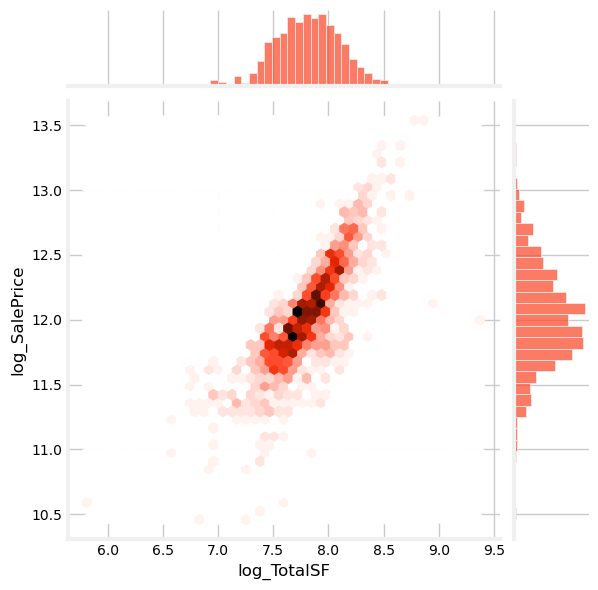

In [399]:
sns.jointplot(engine_slice, x='log_TotalSF', y='log_SalePrice', color=palette_538[1], kind='hex')

In [400]:
del engineered_data, engine_slice

### New Features: What/How to Encode?

We need to classify our columns in terms of whether they are continuous, discrete, or how they should be encoded.

In [401]:
engineered_data = data_train.copy() # making copy

# applying the function
engineered_data = pd.concat([engineered_data, new_features(engineered_data)], axis=1)
# logify:
engineered_data = logify(engineered_data, prefix='log_', dexes=1, drop_cols=False)

In [402]:
float_cols = engineered_data.select_dtypes(include='float64').columns.tolist()
int_cols = engineered_data.select_dtypes(include='int64').columns.tolist()
cat_cols = engineered_data.select_dtypes(include='object').columns.tolist()

# defining list of continuous variables
cont_vars = float_cols # start with floats

# allocating actually discrete variables into disc_vars
disc_vars = [col for col in cont_vars if ('Bath' in col) or ('oom' in col) or ('Rms' in col) or ('itchen' in col)]

# allocating boolean variables into new list
bool_vars = [col for col in int_cols if 'Has' in col]

# updating list of continuous variables
cont_vars = [col for col in cont_vars if col not in disc_vars]

cont_vars += [col for col in engineered_data.select_dtypes(include='int64').columns.tolist() if (('Year' in col) or ('Yr' in col) or ('Age' in col))]

# updating disc_vars
disc_vars += [col for col in int_cols if (col not in cont_vars) and (col not in bool_vars)]

# sanity check
print("float+int columns preserved so far:", (set(disc_vars).union(set(cont_vars))).union(bool_vars) == (set(float_cols).union(set(int_cols))))
print("length of float+int total columns preserved so far:", len(disc_vars) + len(cont_vars) + len(bool_vars) == len(float_cols) + len(int_cols))

float+int columns preserved so far: True
length of float+int total columns preserved so far: True


In [403]:
# ordinal variables
ordinal_vars = [col for col in disc_vars if ('Cond' in col) or ('Qual' in col)]

# define columns that should be in target_encode and
target_encode = ['MSSubClass']
other_vars = ['Id', 'MoSold']

# remainder are discree variables, so we update them
disc_vars = [col for col in disc_vars if (col not in ordinal_vars) and (col not in target_encode) and (col not in other_vars)]

In [404]:
print(ordinal_vars)
print(disc_vars)

['OverallQual', 'OverallCond', 'OverallQualCond']
['BathsAbvGr', 'BsmtBaths', 'AllBaths', 'AllRmsAbvGr', 'AllRooms', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars']


In [405]:
sers = engineered_data.select_dtypes(include='object').nunique().sort_values(ascending=False)

ordinal_encode = []
bool_encode = []
ohe_encode = []

for col in sers.index:

    uniques = engineered_data[col].unique().tolist()

    if ('TA' in uniques) or ('Gd' in uniques) or ('Po' in uniques) or (col in ['BsmtFinType1', 'BsmtFinType2', 'Functional', 'GarageFinish']):
        ordinal_encode += [col]

    elif len(uniques) > 10:
        target_encode += [col]
    
    elif len(uniques) == 2:
        bool_encode += [col]

    else:
        ohe_encode += [col]
        print(col, len(uniques), ":", uniques)

del sers, uniques, col

Condition1 9 : ['Norm', 'Feedr', 'PosN', 'Artery', 'RRAe', 'RRNn', 'RRAn', 'PosA', 'RRNe']
SaleType 9 : ['WD', 'New', 'COD', 'ConLD', 'ConLI', 'CWD', 'ConLw', 'Con', 'Oth']
HouseStyle 8 : ['2Story', '1Story', '1.5Fin', '1.5Unf', 'SFoyer', 'SLvl', '2.5Unf', '2.5Fin']
RoofMatl 8 : ['CompShg', 'WdShngl', 'Metal', 'WdShake', 'Membran', 'Tar&Grv', 'Roll', 'ClyTile']
Condition2 8 : ['Norm', 'Artery', 'RRNn', 'Feedr', 'PosN', 'PosA', 'RRAn', 'RRAe']
GarageType 7 : ['Attchd', 'Detchd', 'BuiltIn', 'CarPort', 'NA', 'Basment', '2Types']
Heating 6 : ['GasA', 'GasW', 'Grav', 'Wall', 'OthW', 'Floor']
SaleCondition 6 : ['Normal', 'Abnorml', 'Partial', 'AdjLand', 'Alloca', 'Family']
RoofStyle 6 : ['Gable', 'Hip', 'Gambrel', 'Mansard', 'Flat', 'Shed']
Foundation 6 : ['PConc', 'CBlock', 'BrkTil', 'Wood', 'Slab', 'Stone']
MiscFeature 5 : ['NA', 'Shed', 'Gar2', 'Othr', 'TenC']
Fence 5 : ['NA', 'MnPrv', 'GdWo', 'GdPrv', 'MnWw']
BldgType 5 : ['1Fam', '2fmCon', 'Duplex', 'TwnhsE', 'Twnhs']
LotConfig 5 : ['In

We now have a strategy about how to treat each column in the engineered dataset:

In [406]:
columns_encodings = {'cont':cont_vars,
                     'disc':disc_vars,
                     'ordinal':ordinal_vars+ordinal_encode, # has int and object columns
                     'target':target_encode,
                     'ohe':ohe_encode,
                     'bool':bool_vars+bool_encode, # has int and object columns
                     'others':other_vars}

All columns have been accounted for

In [407]:
print("All column names preserved:", set([col for lst in list(columns_encodings.values()) for col in lst]) == set(engineered_data.columns.to_list()))

print("Total # of columns preserved:", len([col for lst in list(columns_encodings.values()) for col in lst]) == len(engineered_data.columns))

All column names preserved: True
Total # of columns preserved: True


We define one last list: a pruned version of the continuous columns (i.e., no logs, no target feature). This is a very important list: **DO NOT ERASE!**

In [408]:
# broad columns
pruned_cont_cols = columns_encodings['cont'].copy() # these are the ones that span many orders of magnitude and/or take large values
pruned_cont_cols = [col for col in pruned_cont_cols if ('log_' not in col) and (col != 'SalePrice')]

In [409]:
del float_cols, int_cols, cat_cols, engineered_data

### New Features: Filtering Columns

There are other ways we can organize our columns. We will need to know which columns have values that span many orders of magnitude, or have large skewness, or take so many discrete values that they appear continuous.

We begin with our basic dataset:

In [410]:
engineered_data = data_train.copy() # making copy
engineered_data = pd.concat([engineered_data, new_features(engineered_data)], axis=1) # engineering

#### Filter continuous columns by their spread, in orders of magnitude

Let us first start with those continuous columns whose values span many orders of magnitude:

In [411]:
# broad columns
broad_cols = columns_encodings['cont'].copy() # these are the ones that span many orders of magnitude and/or take large values
broad_cols.remove('log_SalePrice')
broad_cols.remove('SalePrice')
broad_cols = [col.removeprefix('log_') for col in broad_cols]
broad_cols = list(set(broad_cols))

col_decades = np.log10(((engineered_data[broad_cols].describe().loc['max']+1) / (engineered_data[broad_cols].describe().loc['min'] + 1)).sort_values(ascending=False))
col_decades.name = 'decades_spanned_by_continuous_features'

display(col_decades)

del broad_cols

MiscVal          4.190360
TotalBsmtSF      3.786112
BsmtFinSF1       3.751664
BsmtUnfSF        3.368659
2ndFlrSF         3.315130
GarageYrBlt      3.303412
GarageAge        3.303412
MasVnrArea       3.204391
BsmtFinSF2       3.168792
GarageArea       3.151982
WoodDeckSF       2.933487
PoolArea         2.868644
LowQualFinSF     2.758155
EnclosedPorch    2.742725
OpenPorchSF      2.738781
3SsnPorch        2.706718
ScreenPorch      2.682145
LotArea          2.218658
HouseAge         2.136721
RemodAge         1.785330
TotalSF          1.545104
1and2FlrSF       1.226465
GrLivArea        1.226465
LotFrontage      1.154507
1stFlrSF         1.146406
YearBuilt        0.030874
YearRemodAdd     0.013155
YrSold           0.000865
Name: decades_spanned_by_continuous_features, dtype: float64

In [412]:
def filter_columns_by_spread(dexes=None, dexes_series=col_decades):
    """
    Filters column names based on a minimum log-scale spread threshold.

    This function takes a Series containing spread values (e.g., in decades of magnitude) for columns, and returns the list of column names whose spread meets or exceeds the given threshold.

    Parameters
    ----------
    dexes : int or float or None, optional
        Minimum spread threshold. If None, all columns are returned.
    dexes_series : pd.Series
        A Series with column names as index and spread values (e.g., log10(max+1) - log10(min+1)) as values.

    Returns
    -------
    list of str
        List of column names that meet or exceed the specified spread threshold.
    """

    if dexes == None:
        return dexes_series.index.to_list()
    elif type(dexes) in (int, float):
        return dexes_series[dexes_series >= dexes].index.to_list()

#### Filter continuous columns by skewness

In [413]:
# skew columns
skew_cols = columns_encodings['cont'].copy() # these are the ones that span many orders of magnitude and/or take large values
skew_cols.remove('log_SalePrice')
skew_cols.remove('SalePrice')
skew_cols = [col.removeprefix('log_') for col in skew_cols]
skew_cols = list(set(skew_cols))

col_skew = {col:np.abs(skew(engineered_data[col])) for col in skew_cols}

col_skew = pd.Series(col_skew).sort_values(ascending=False)
col_skew.name = 'abs_val_of_skewness_of_continuous_features'

display(col_skew)

del skew_cols

MiscVal          24.451640
PoolArea         14.813135
LotArea          12.195142
3SsnPorch        10.293752
LowQualFinSF      9.002080
BsmtFinSF2        4.250888
ScreenPorch       4.117977
GarageYrBlt       3.865524
GarageAge         3.865473
EnclosedPorch     3.086696
MasVnrArea        2.674865
OpenPorchSF       2.361912
LotFrontage       2.210685
TotalSF           1.776202
BsmtFinSF1        1.683771
WoodDeckSF        1.539792
TotalBsmtSF       1.522688
1stFlrSF          1.375342
GrLivArea         1.365156
1and2FlrSF        1.329103
BsmtUnfSF         0.919323
2ndFlrSF          0.812194
YearBuilt         0.612831
HouseAge          0.608404
YearRemodAdd      0.503044
RemodAge          0.502059
GarageArea        0.179796
YrSold            0.096170
Name: abs_val_of_skewness_of_continuous_features, dtype: float64

In [414]:
def filter_columns_by_skewness(skew_thr=None, skew_series=col_skew):
    """
    Filters column names based on a minimum skewness threshold.

    This function returns a list of column names from the provided Series whose skewness is greater than or equal to the specified threshold.

    Parameters
    ----------
    skew_thr : int, float, or None, optional
        Minimum skewness threshold. If None, returns all column names.
    skew_series : pd.Series
        A Series with column names as index and their skewness values as values.

    Returns
    -------
    list of str
        List of column names meeting or exceeding the skewness threshold.
    """


    if skew_thr == None:
        return skew_series.index.to_list()
    elif type(skew_thr) in (int, float):
        return skew_series[skew_series >= skew_thr].index.to_list()

#### Filter discrete columns by value counts

Now, let us look for those discrete columns that have so many values as to be almost continuous:

In [415]:
col_valuecounts = pd.Series({col:len(engineered_data[col].value_counts()) for col in columns_encodings['disc']+columns_encodings['ordinal']}, name='value_counts_of_discrete_features').sort_values(ascending=False)

display(col_valuecounts)

OverallQualCond    32
AllRooms           27
AllRmsAbvGr        26
TotRmsAbvGrd       12
OverallQual        10
AllBaths           10
OverallCond         9
BedroomAbvGr        8
BathsAbvGr          8
Functional          7
BsmtFinType2        7
BsmtFinType1        7
BsmtBaths           6
GarageQual          6
FireplaceQu         6
GarageCond          6
ExterCond           5
BsmtQual            5
HeatingQC           5
BsmtCond            5
GarageCars          5
BsmtExposure        5
FullBath            4
BsmtFullBath        4
ExterQual           4
PoolQC              4
KitchenAbvGr        4
Fireplaces          4
KitchenQual         4
GarageFinish        4
HalfBath            3
BsmtHalfBath        3
Name: value_counts_of_discrete_features, dtype: int64

In [416]:
def filter_columns_by_counts(value_counts=None, counts_series=col_valuecounts):
    """
    Filters column names based on a minimum number of unique values.

    This function returns a list of column names from the provided Series whose value counts exceed a specified threshold.

    Parameters
    ----------
    value_counts : int or None, optional
        Minimum number of unique values required. If None, returns an empty list.
    counts_series : pd.Series
        A Series with column names as index and their respective value counts as values.

    Returns
    -------
    list of str
        List of column names with more than the specified number of unique values.
    """

    if value_counts == None:
        return []
    elif type(value_counts) == int:
        return counts_series[counts_series > value_counts].index.to_list()

In [417]:
column_filters = {'cont':['filter_columns_by_spread', 'filter_columns_by_skewness'], 'disc':'filter_columns_by_counts'}

In [418]:
del engineered_data

### New Features: Ranking

Let us put all the rankings into a single dictionary, for easier access:

In [419]:
rankings = {'default_mi':feats_mi_df,
            'default_r':num_corrs_df,
            'default_omega2':catint_top_omega2,
            'default_useful':useful_features,
            'new_useful':new_useful_features}

However, we want a definitive ranking, at least according to MI. For that, let us first engineer the data:

In [420]:
engineered_data = data_train.copy() # making copy

# applying the function
engineered_data = pd.concat([engineered_data, new_features(engineered_data)], axis=1)

Before encoding, we need to split between features and target:

In [421]:
X = engineered_data.drop(columns=['SalePrice'])
y = np.log1p(engineered_data['SalePrice']) # log of SalePrice

Then, proceed to encode the categorical variables. The different kinds of encoding are:

In [422]:
columns_encodings.keys()

dict_keys(['cont', 'disc', 'ordinal', 'target', 'ohe', 'bool', 'others'])

Let us start. First, target encoding:

In [423]:
columns_encodings['target']

['MSSubClass', 'Neighborhood', 'Exterior2nd', 'Exterior1st']

In [424]:
X, _ = add_target_encoded_features(X=X,
                                   y=y,
                                   cols=columns_encodings['target'],
                                   new_col_suffix="",
                                   n_splits=5,
                                   smoothing=20,
                                   random_state=42)

Next, ordinal encoding:

In [425]:
columns_encodings['ordinal']

['OverallQual',
 'OverallCond',
 'OverallQualCond',
 'BsmtFinType2',
 'BsmtFinType1',
 'Functional',
 'GarageCond',
 'FireplaceQu',
 'GarageQual',
 'BsmtExposure',
 'ExterCond',
 'BsmtQual',
 'HeatingQC',
 'BsmtCond',
 'ExterQual',
 'PoolQC',
 'KitchenQual',
 'GarageFinish']

In [426]:
for col in columns_encodings['ordinal']:

    if col not in X.columns:
        raise KeyError(f"{col} not in X.columns!")

    if X[col].dtype == 'int64':
        continue
    
    if col in ['BsmtFinType1', 'BsmtFinType2']:
        categories = [["NA", "Unf", "LwQ", "Rec", "BLQ", "ALQ", "GLQ"]]
    elif col == 'Functional':
        categories = [["Sal", "Sev", "Maj2", "Maj1", "Mod", "Min2", "Min1", "Typ"]]
    elif col == 'BsmtExposure':
        categories = [["NA", "No", "Mn", "Av", "Gd"]]
    elif col == 'GarageFinish':
        categories = [["NA", "Unf", "RFn", "Fin"]]
    else:
        categories = [["NA", "Po", "Fa", "TA", "Gd", "Ex"]]

    print(col, ":", categories)
    encoder = OrdinalEncoder(categories=categories)
    X[col] = encoder.fit_transform(X[[col]])
    print("Done!\n")

del col, categories, encoder

BsmtFinType2 : [['NA', 'Unf', 'LwQ', 'Rec', 'BLQ', 'ALQ', 'GLQ']]
Done!

BsmtFinType1 : [['NA', 'Unf', 'LwQ', 'Rec', 'BLQ', 'ALQ', 'GLQ']]
Done!

Functional : [['Sal', 'Sev', 'Maj2', 'Maj1', 'Mod', 'Min2', 'Min1', 'Typ']]
Done!

GarageCond : [['NA', 'Po', 'Fa', 'TA', 'Gd', 'Ex']]
Done!

FireplaceQu : [['NA', 'Po', 'Fa', 'TA', 'Gd', 'Ex']]
Done!

GarageQual : [['NA', 'Po', 'Fa', 'TA', 'Gd', 'Ex']]
Done!

BsmtExposure : [['NA', 'No', 'Mn', 'Av', 'Gd']]
Done!

ExterCond : [['NA', 'Po', 'Fa', 'TA', 'Gd', 'Ex']]
Done!

BsmtQual : [['NA', 'Po', 'Fa', 'TA', 'Gd', 'Ex']]
Done!

HeatingQC : [['NA', 'Po', 'Fa', 'TA', 'Gd', 'Ex']]
Done!

BsmtCond : [['NA', 'Po', 'Fa', 'TA', 'Gd', 'Ex']]
Done!

ExterQual : [['NA', 'Po', 'Fa', 'TA', 'Gd', 'Ex']]
Done!

PoolQC : [['NA', 'Po', 'Fa', 'TA', 'Gd', 'Ex']]
Done!

KitchenQual : [['NA', 'Po', 'Fa', 'TA', 'Gd', 'Ex']]
Done!

GarageFinish : [['NA', 'Unf', 'RFn', 'Fin']]
Done!



Next, OHE encoding. However, for MI computations, we will simply use LabelEncoder:

In [427]:
columns_encodings['ohe']

['Condition1',
 'SaleType',
 'HouseStyle',
 'RoofMatl',
 'Condition2',
 'GarageType',
 'Heating',
 'SaleCondition',
 'RoofStyle',
 'Foundation',
 'MiscFeature',
 'Fence',
 'BldgType',
 'LotConfig',
 'MSZoning',
 'Electrical',
 'LandContour',
 'LotShape',
 'MasVnrType',
 'Alley',
 'LandSlope',
 'PavedDrive']

In [428]:
for col in columns_encodings['ohe']:

    if col not in X.columns:
        raise KeyError(f"{col} not in X.columns!")

    encoder = OrdinalEncoder()
    X[col] = encoder.fit_transform(X[[col]])
    print(f"{col}: Done!\n")

del col, encoder

Condition1: Done!

SaleType: Done!

HouseStyle: Done!

RoofMatl: Done!

Condition2: Done!

GarageType: Done!

Heating: Done!

SaleCondition: Done!

RoofStyle: Done!

Foundation: Done!

MiscFeature: Done!

Fence: Done!

BldgType: Done!

LotConfig: Done!

MSZoning: Done!

Electrical: Done!

LandContour: Done!

LotShape: Done!

MasVnrType: Done!

Alley: Done!

LandSlope: Done!

PavedDrive: Done!



Finally, boolean encoding:

In [429]:
columns_encodings['bool']

['Has_MasVnr',
 'Has_Bsmt',
 'Has_2ndFlr',
 'Has_Garage',
 'Has_WoodDeck',
 'Has_Porch',
 'Has_Pool',
 'Street',
 'Utilities',
 'CentralAir']

In [430]:
for col in columns_encodings['bool']:

    if col not in X.columns:
        raise KeyError(f"{col} not in X.columns!")

    if 'Has' in col: # already boolean!
        continue

    encoder = OrdinalEncoder()
    X[col] = encoder.fit_transform(X[[col]])
    print(f"{col}: Done!\n")

del col, encoder

Street: Done!

Utilities: Done!

CentralAir: Done!



We are done encoding! Before we proceed with the computation of the definitive ranking, we first need to scale the continuous variables (MI cares about scaling).

We could go different routes. First, we will instead use a Yeo-Johnson transform, followed by a RobustScaler:

In [431]:
columns_encodings.keys()

dict_keys(['cont', 'disc', 'ordinal', 'target', 'ohe', 'bool', 'others'])

In [432]:
columns_encodings['cont']

['LotFrontage',
 'LotArea',
 'MasVnrArea',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'GrLivArea',
 'GarageArea',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'MiscVal',
 'SalePrice',
 'TotalSF',
 '1and2FlrSF',
 'log_LotFrontage',
 'log_LotArea',
 'log_MasVnrArea',
 'log_BsmtFinSF1',
 'log_BsmtFinSF2',
 'log_BsmtUnfSF',
 'log_TotalBsmtSF',
 'log_1stFlrSF',
 'log_2ndFlrSF',
 'log_LowQualFinSF',
 'log_GrLivArea',
 'log_GarageArea',
 'log_WoodDeckSF',
 'log_OpenPorchSF',
 'log_EnclosedPorch',
 'log_3SsnPorch',
 'log_ScreenPorch',
 'log_PoolArea',
 'log_MiscVal',
 'log_SalePrice',
 'log_TotalSF',
 'log_1and2FlrSF',
 'YearBuilt',
 'YearRemodAdd',
 'GarageYrBlt',
 'YrSold',
 'HouseAge',
 'GarageAge',
 'RemodAge']

In [433]:
# columns to transform:
trans_cols = columns_encodings['cont'].copy() # these are the ones that span many orders of magnitude and/or take large values
trans_cols.remove('log_SalePrice')
trans_cols.remove('SalePrice')
trans_cols = [col.removeprefix('log_') for col in trans_cols]
trans_cols = list(set(trans_cols))

pt = PowerTransformer(method="yeo-johnson", standardize=False)

X_yj = X.copy()
# X_yj[trans_cols] = np.log1p(X_yj[trans_cols]) # YJ still benefits from logifying
X_yj[trans_cols] = pt.fit_transform(X_yj[trans_cols])

Or we could do a simple log1p:

In [434]:
X_log = X.copy()
X_log[trans_cols] = np.log1p(X_log[trans_cols])

At any rate, let us perform a RobustScaler:

In [435]:
scaler = RobustScaler()

scale_cols = trans_cols + columns_encodings['target'] # + columns_encodings['disc']

X_yj[scale_cols] = scaler.fit_transform(X_yj[scale_cols])
X_log[scale_cols] = scaler.fit_transform(X_log[scale_cols])

Done! We can now compute the MI with the target:

In [436]:
discrete_columns = columns_encodings['disc']+columns_encodings['ordinal']+columns_encodings['ohe']+columns_encodings['bool']

mi_yj_scores = {}
mi_log_scores = {}
for col in X.columns:

    mi_yj_scores[col] = mutual_info_regression(X_yj[[col]],
                                               y,
                                               discrete_features=(col in discrete_columns),
                                               random_state=0)[0]

    mi_log_scores[col] = mutual_info_regression(X_log[[col]],
                                                y,
                                                discrete_features=(col in discrete_columns),
                                                random_state=0)[0]

mi_yj_scores = pd.Series(mi_yj_scores, name='mi').sort_values(ascending=False)
mi_log_scores = pd.Series(mi_log_scores, name='mi').sort_values(ascending=False)

del X_log, X_yj, discrete_columns, col

Let us look at these rankings:

In [437]:
print(len(mi_yj_scores[mi_yj_scores > 0.25]), "\n")
mi_yj_scores[mi_yj_scores > 0.25]

25 



TotalSF            0.665872
OverallQual        0.570135
Neighborhood       0.496393
1and2FlrSF         0.493345
GrLivArea          0.478231
OverallQualCond    0.441198
AllRooms           0.403682
AllRmsAbvGr        0.367970
GarageArea         0.362103
GarageCars         0.362058
TotalBsmtSF        0.360407
YearBuilt          0.359524
BathsAbvGr         0.346450
AllBaths           0.341557
HouseAge           0.335223
ExterQual          0.328419
BsmtQual           0.327429
KitchenQual        0.321213
1stFlrSF           0.299394
GarageAge          0.292522
MSSubClass         0.277533
GarageFinish       0.276180
GarageYrBlt        0.272265
FullBath           0.268401
RemodAge           0.261205
Name: mi, dtype: float64

In [438]:
print(len(mi_log_scores[mi_log_scores > 0.25]), "\n")

mi_log_scores[mi_log_scores > 0.25]

23 



TotalSF            0.666305
OverallQual        0.570135
Neighborhood       0.496393
1and2FlrSF         0.495034
GrLivArea          0.478427
OverallQualCond    0.441198
AllRooms           0.403682
AllRmsAbvGr        0.367970
GarageCars         0.362058
YearBuilt          0.353327
BathsAbvGr         0.346450
TotalBsmtSF        0.346257
HouseAge           0.342955
AllBaths           0.341557
GarageArea         0.335795
ExterQual          0.328419
BsmtQual           0.327429
KitchenQual        0.321213
1stFlrSF           0.300794
GarageAge          0.290244
MSSubClass         0.277533
GarageFinish       0.276180
FullBath           0.268401
Name: mi, dtype: float64

There is a difference, both in rankings (particularly towards the smaller MI), and in the total number of features included:

In [439]:
set(mi_yj_scores[mi_yj_scores > 0.25].index.to_list()).union(set(mi_log_scores[mi_log_scores > 0.25].index.to_list())) - set(mi_yj_scores[mi_yj_scores > 0.25].index.to_list()).intersection(set(mi_log_scores[mi_log_scores > 0.25].index.to_list()))

{'GarageYrBlt', 'RemodAge'}

So let us add them to the rankings:

In [440]:
rankings['definitive_yj'] = mi_yj_scores
rankings['definitive_log'] = mi_log_scores

In [441]:
del pt

### New Features: PCA

Perhaps at this point it is useful to perform a PCA, in order to extract as much information from the highest-MI ranking features as possible.

We begin with the engineered data:

In [442]:
engineered_data = data_train.copy() # making copy

# applying the function
engineered_data = pd.concat([engineered_data, new_features(engineered_data)], axis=1)
# logify:
# engineered_data = logify(engineered_data, prefix='log_', dexes=1, drop_cols=True)

It will be useful to perform all the necessary encodings, since some categorical variables (such as Neighborhood) are very useful. To do this, we need to split between features and target:

In [443]:
X = engineered_data.copy()
y = X.pop('SalePrice')
y = np.log1p(y)

We now perform target and ordinal encoding (OHE, label, and boolean will be unnecessary, since we will not use those variables to do the PCA):

In [444]:
X, _ = add_target_encoded_features(X=X,
                                   y=y,
                                   cols=columns_encodings['target'],
                                   new_col_suffix="",
                                   n_splits=5,
                                   smoothing=20,
                                   random_state=42)

for col in columns_encodings['ordinal']:

    if col not in X.columns:
        raise KeyError(f"{col} not in X.columns!")

    if X[col].dtype == 'int64':
        continue
    
    if col in ['BsmtFinType1', 'BsmtFinType2']:
        categories = [["NA", "Unf", "LwQ", "Rec", "BLQ", "ALQ", "GLQ"]]
    elif col == 'Functional':
        categories = [["Sal", "Sev", "Maj2", "Maj1", "Mod", "Min2", "Min1", "Typ"]]
    elif col == 'BsmtExposure':
        categories = [["NA", "No", "Mn", "Av", "Gd"]]
    elif col == 'GarageFinish':
        categories = [["NA", "Unf", "RFn", "Fin"]]
    else:
        categories = [["NA", "Po", "Fa", "TA", "Gd", "Ex"]]

    print(col, ":", categories)
    encoder = OrdinalEncoder(categories=categories)
    X[col] = encoder.fit_transform(X[[col]])
    print("Done!\n")

del col, categories, encoder

BsmtFinType2 : [['NA', 'Unf', 'LwQ', 'Rec', 'BLQ', 'ALQ', 'GLQ']]
Done!

BsmtFinType1 : [['NA', 'Unf', 'LwQ', 'Rec', 'BLQ', 'ALQ', 'GLQ']]
Done!

Functional : [['Sal', 'Sev', 'Maj2', 'Maj1', 'Mod', 'Min2', 'Min1', 'Typ']]
Done!

GarageCond : [['NA', 'Po', 'Fa', 'TA', 'Gd', 'Ex']]
Done!

FireplaceQu : [['NA', 'Po', 'Fa', 'TA', 'Gd', 'Ex']]
Done!

GarageQual : [['NA', 'Po', 'Fa', 'TA', 'Gd', 'Ex']]
Done!

BsmtExposure : [['NA', 'No', 'Mn', 'Av', 'Gd']]
Done!

ExterCond : [['NA', 'Po', 'Fa', 'TA', 'Gd', 'Ex']]
Done!

BsmtQual : [['NA', 'Po', 'Fa', 'TA', 'Gd', 'Ex']]
Done!

HeatingQC : [['NA', 'Po', 'Fa', 'TA', 'Gd', 'Ex']]
Done!

BsmtCond : [['NA', 'Po', 'Fa', 'TA', 'Gd', 'Ex']]
Done!

ExterQual : [['NA', 'Po', 'Fa', 'TA', 'Gd', 'Ex']]
Done!

PoolQC : [['NA', 'Po', 'Fa', 'TA', 'Gd', 'Ex']]
Done!

KitchenQual : [['NA', 'Po', 'Fa', 'TA', 'Gd', 'Ex']]
Done!

GarageFinish : [['NA', 'Unf', 'RFn', 'Fin']]
Done!



Defining the PCA object, and performing the PCA for a given number of high-MI features:

In [445]:
pca = PCA()

Let us rank the MI once again, on the encoded dataset, and only for the numerical variables of interest:

In [446]:
# superset of continuous variables that are PCA-amenable, in list form:
cols_list = columns_encodings['cont'] + columns_encodings['disc'] + columns_encodings['target'] + columns_encodings['ordinal']

# selecting only those that are in the columns of the engineered data (sans 'SalePrice')
cols_list = list(set(X.columns.to_list()).intersection(set(cols_list)))

# selecting the MI score from the definitive ranking (after log-transformation!) of those PCA-amenable columns:
# mi_pca_amenable = rankings['definitive_yj'].loc[cols_list].sort_values(ascending=False)
mi_pca_amenable = rankings['definitive_log'].loc[cols_list].sort_values(ascending=False)

del cols_list

In [447]:
mi_pca_amenable[mi_pca_amenable > 0.25]

TotalSF            0.666305
OverallQual        0.570135
Neighborhood       0.496393
1and2FlrSF         0.495034
GrLivArea          0.478427
OverallQualCond    0.441198
AllRooms           0.403682
AllRmsAbvGr        0.367970
GarageCars         0.362058
YearBuilt          0.353327
BathsAbvGr         0.346450
TotalBsmtSF        0.346257
HouseAge           0.342955
AllBaths           0.341557
GarageArea         0.335795
ExterQual          0.328419
BsmtQual           0.327429
KitchenQual        0.321213
1stFlrSF           0.300794
GarageAge          0.290244
MSSubClass         0.277533
GarageFinish       0.276180
FullBath           0.268401
Name: mi, dtype: float64

Which features to select for PCA? The most useful will be those that have the highest MI with the target and also the least correlation between them. So we define a function to look for that:

In [448]:
def optimal_feats(df, mi_df, mi_thr_or_no, r_thr):
    """
    Selects optimal features based on mutual information and pairwise correlation thresholds.

    This function selects features whose mutual information (MI) with the target is either among the top N highest (if `mi_thr_or_no` is an integer), or above a specified threshold (if `mi_thr_or_no` is a float). It then prunes features that are highly correlated (above a given Pearson correlation coefficient threshold) with one another.

    Parameters
    ----------
    df : pd.DataFrame
        The input DataFrame containing the feature columns.
    mi_df : pd.Series
        A Series with feature names as the index and their mutual information scores as values, sorted in descending order.
    mi_thr_or_no : int or float
        If int, selects the top N features by mutual information.
        If float, uses it as a threshold to filter features with MI greater than this value.
    r_thr : float
        Maximum allowed absolute Pearson correlation between selected features.

    Returns
    -------
    list of str
        A list of feature names that have high mutual information with the target and are not highly correlated with each other.
    """

    if type(mi_thr_or_no) == int: # then we select the top mi_thr features:
        best_mi_df = mi_df[:mi_thr_or_no]
        mi_thr = best_mi_df[-1]

    elif type(mi_thr_or_no) == float:
        mi_thr = mi_thr_or_no
        best_mi_df = mi_df[mi_df > mi_thr] # DF with MI above threshold

    else:
        raise ValueError("mi_thr should be either an integer or a float.")
    
    cols = best_mi_df.index.to_list() # columns

    r_df = df[cols].corr().abs() # DF of absolute value of Pearson's R-coefficient of columns
    # display(r_df.loc[cols[0]])
    
    best_r_df = r_df.loc[cols[0]][r_df.loc[cols[0]] < r_thr] # DF with R below threshold
    # display(best_r_df)
    
    # selecting the most promising features, and allocating them to a temporary list (will be updated!)
    best_feats = [cols[0]] + best_r_df.index.to_list()
    # print("best_feats", best_feats)

    # the length of the original temporary list
    tmp_length = len(best_feats)

    # some of these may be correlated with each other! We need to prune the list further. We will create a dictionary with all features in tmp_best_feats as keys (other than the first), and the features with which they are correlated as values
    
    feats_corr = {}
    for i in range(1, tmp_length):

        if (i+1) > len(best_feats): # cannot prune any more features!
            break
        
        feat = best_feats[i] # the next feature we will consider

        feats_corr[feat] = r_df.loc[feat][r_df.loc[feat] >= r_thr].index.to_list()
        feats_corr[feat].remove(feat) # remove 'feat', which is obviously highly correlated w/ itself!
        # print(feat, ".........", feats_corr[feat])
        
        filter_set = set(feats_corr[feat]) # set of features with which feat is correlated

        # updating best_feats by removing those elements of it in this filter:
        best_feats = [x for x in best_feats if x not in filter_set]

    # the result is a list of high-MI features, non of which are mutually correlated above the given threshold!
    # putting it in descending order of MI
    best_feats = best_mi_df.loc[best_feats].sort_values(ascending=False).index.to_list()
    
    return best_feats

This is a nice function! For example, for MI_thr = 0.25, and R_thr = 0.5, we have:

In [449]:
test_feats = optimal_feats(X, mi_pca_amenable, 0.25, 0.5)
print(test_feats)
del test_feats

['TotalSF', 'Neighborhood', 'OverallQualCond', 'GarageAge']


Now, this is a bit unfair, since the dataframe used, X, has been neither transformed nor scaled, so it's unclear whether we can trust the computation of $R$ (and thus, the selection of the columns according to that). Indeed, Pearson's $R$ can only be used for continuous, normally-distributed datasets.

Therefore, let us perform the necessary transformations:

In [450]:
# we only select the PCA-amenable columns:
trans_cols = mi_pca_amenable.index.to_list()
X_slice = X[trans_cols].copy()

# Yeo-Johnson transformation
# pt = PowerTransformer(method="yeo-johnson", standardize=False)
# scaled_X = pt.fit_transform(X_slice)

# log1p transformation:
scaled_X = logify(X_slice, columns=columns_encodings['cont'])# np.log1p(X_slice)

scaler = RobustScaler()
scaled_X = scaler.fit_transform(scaled_X)

del trans_cols, scaler

We can then find the more promising PCA-amenable features:

In [451]:
pca_features = optimal_feats(scaled_X, mi_pca_amenable, 0.25, 0.51)
pca_features

['TotalSF', 'Neighborhood', 'OverallQualCond', 'GarageArea']

Their corresponding MI and $R$ are:

In [452]:
display(mi_pca_amenable[pca_features])

r2_df = scaled_X[mi_pca_amenable[mi_pca_amenable > 0.25].index.to_list()].corr()
display(r2_df.loc[pca_features, pca_features])

del r2_df

TotalSF            0.666305
Neighborhood       0.496393
OverallQualCond    0.441198
GarageArea         0.335795
Name: mi, dtype: float64

,TotalSF,Neighborhood,OverallQualCond,GarageArea
TotalSF,1.000000,0.509208,0.437467,0.348461
Neighborhood,0.509208,1.000000,0.346990,0.344588
OverallQualCond,0.437467,0.346990,1.000000,0.256163
GarageArea,0.348461,0.344588,0.256163,1.000000


We can then use that to perform the PCA! Before that, let us look at their distributions (for the raw and the transformed data):

,TotalSF,Neighborhood,OverallQualCond,GarageArea
count,1460.000000,1460.000000,1460.000000,1460.000000
mean,2572.893151,12.017931,33.864384,472.980137
std,823.598492,0.237735,9.219624,213.804841
min,334.000000,11.631704,1.000000,0.000000
25%,2014.000000,11.838187,30.000000,334.500000
50%,2479.000000,12.049444,35.000000,480.000000
75%,3008.500000,12.160696,40.000000,576.000000
max,11752.000000,12.569861,90.000000,1418.000000


,TotalSF,Neighborhood,OverallQualCond,GarageArea
count,1.460000e+03,1460.000000,1460.000000,1460.000000
mean,-2.689395e-02,-0.097710,-0.113562,-0.678121
std,7.804819e-01,0.737142,0.921962,2.683480
min,-4.990302e+00,-1.295281,-3.400000,-11.389326
25%,-5.176040e-01,-0.655043,-0.500000,-0.664408
50%,-1.107187e-15,0.000000,0.000000,0.000000
75%,4.823960e-01,0.344957,0.500000,0.335592
max,3.878429e+00,1.613649,5.500000,1.995094


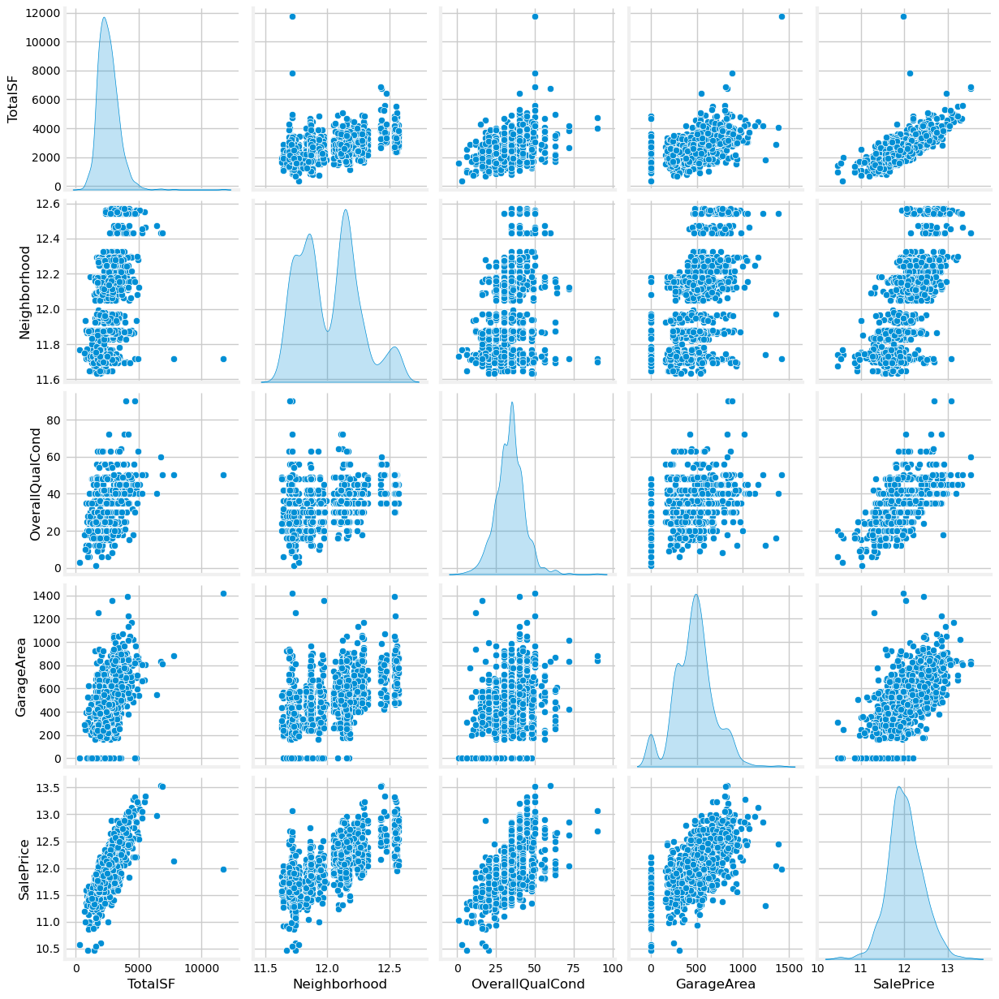

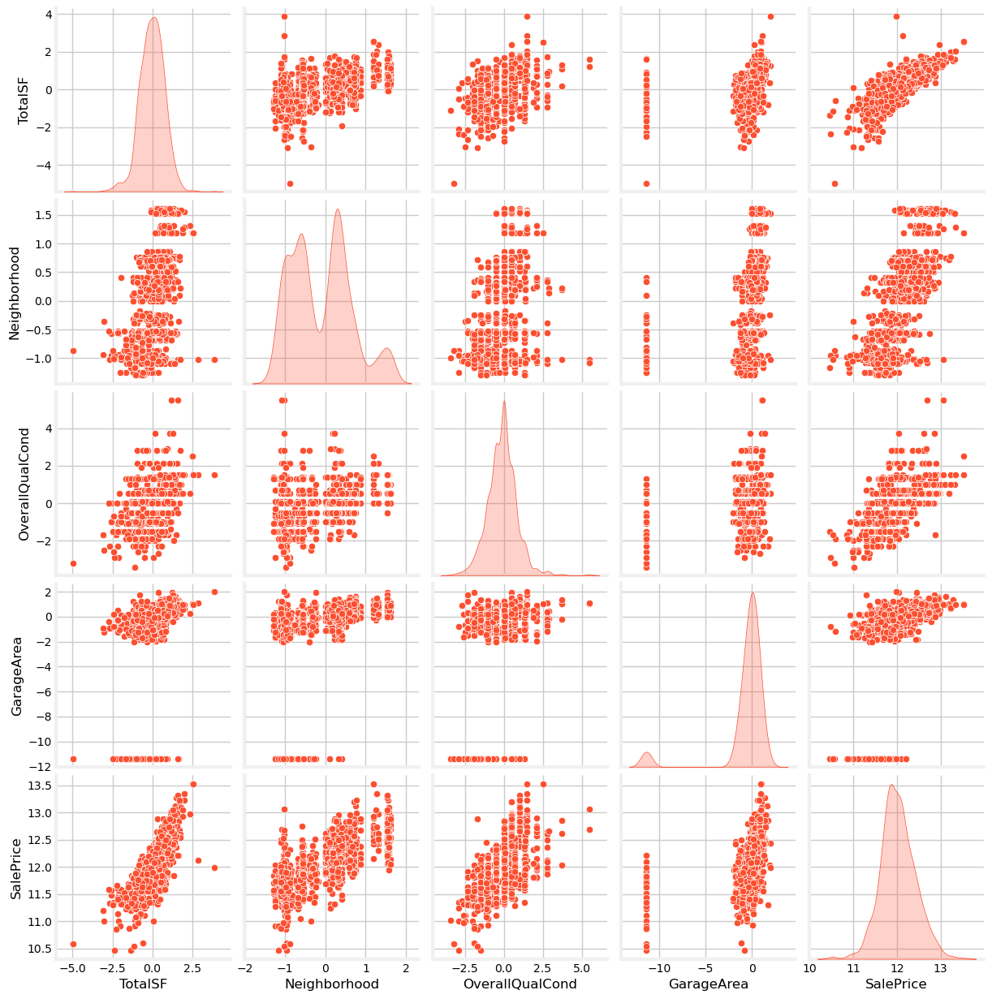

In [453]:
X_slice1 = X[pca_features].copy()
display(X_slice1.describe(include='all'))
sns.pairplot(pd.concat([X_slice1, y], axis=1), diag_kind='kde', plot_kws={'color': palette_538[0]})

X_slice2 = scaled_X[pca_features].copy()
display(X_slice2.describe(include='all'))
sns.pairplot(pd.concat([X_slice2, y], axis=1), diag_kind='kde', plot_kws={'color': palette_538[1]}, diag_kws={'color': palette_538[1]})

del X_slice1, X_slice2

Excellent! Let us then perform the PCA:

In [454]:
pca_X = pd.DataFrame(pca.fit_transform(scaled_X[pca_features]), columns=['pca'+str(i) for i in range(len(pca_features))], index=scaled_X.index)

display(pca_X.describe())
display(pca_X.head())

,pca0,pca1,pca2,pca3
count,1.460000e+03,1.460000e+03,1460.000000,1.460000e+03
mean,1.216683e-16,-3.650048e-17,0.000000,1.460019e-17
std,2.725169e+00,1.019714e+00,0.677894,5.269803e-01
min,-1.149269e+01,-3.575977e+00,-2.009963,-2.689005e+00
25%,-1.415237e-01,-6.632533e-01,-0.416294,-3.193689e-01
50%,6.477065e-01,-1.076238e-02,-0.092944,-8.809417e-03
75%,1.079899e+00,6.556051e-01,0.372600,3.126277e-01
max,3.142478e+00,4.295173e+00,3.766061,3.254997e+00


,pca0,pca1,pca2,pca3
0,0.976181,0.149139,-0.187259,-0.230532
1,0.776164,1.094664,0.746977,-0.308471
2,1.179229,0.181815,-0.240755,-0.135917
3,1.259792,0.079568,-0.172730,-0.346401
4,1.970702,1.106141,-0.704026,-0.492977


Checking the correlation of the scaled features and the PCs:

In [455]:
print("R for scaled_X:")
display(scaled_X[pca_features].corr().abs())

print("\nR for PCs:")
display(pca_X.corr().abs())

R for scaled_X:


,TotalSF,Neighborhood,OverallQualCond,GarageArea
TotalSF,1.000000,0.509208,0.437467,0.348461
Neighborhood,0.509208,1.000000,0.346990,0.344588
OverallQualCond,0.437467,0.346990,1.000000,0.256163
GarageArea,0.348461,0.344588,0.256163,1.000000



R for PCs:


,pca0,pca1,pca2,pca3
pca0,1.000000e+00,1.051745e-15,1.523775e-15,4.398164e-16
pca1,1.051745e-15,1.000000e+00,9.884501e-16,4.121446e-16
pca2,1.523775e-15,9.884501e-16,1.000000e+00,2.302099e-16
pca3,4.398164e-16,4.121446e-16,2.302099e-16,1.000000e+00


Computing the PC loadings:

In [456]:
loadings = pd.DataFrame(pca.components_.T, columns=pca_X.columns, index=scaled_X[pca_features].columns)

loadings

,pca0,pca1,pca2,pca3
TotalSF,0.114499,0.508125,-0.474574,0.709562
Neighborhood,0.105710,0.402849,-0.584417,-0.696416
OverallQualCond,0.103933,0.739476,0.656399,-0.107301
GarageArea,0.982300,-0.180822,0.048759,0.003589


Now, computing the explained variance of each PC:

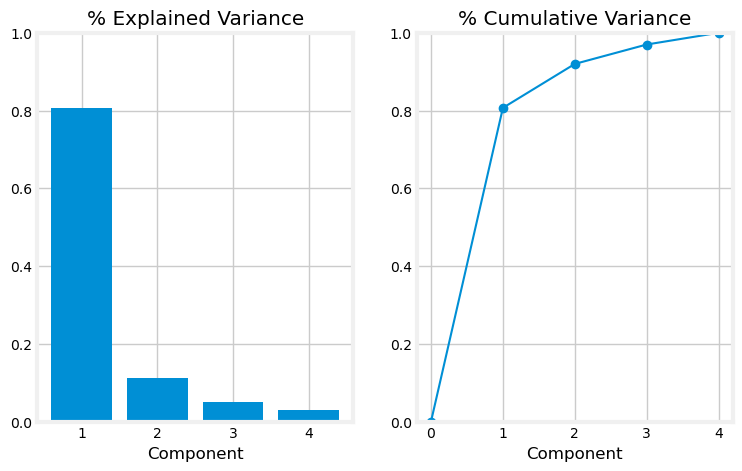

In [457]:
fig, axs = plt.subplots(1, 2)
n = pca.n_components_
grid = np.arange(1, n+1)

evr = pca.explained_variance_ratio_
axs[0].bar(grid, evr)
axs[0].set(xlabel='Component', title='% Explained Variance', ylim=(0., 1.))

cv = np.cumsum(evr)
axs[1].plot(np.r_[0,grid], np.r_[0,cv], "o-")
axs[1].set(xlabel='Component', title='% Cumulative Variance', ylim=(0., 1.))

fig.set(figwidth=8, dpi=100);

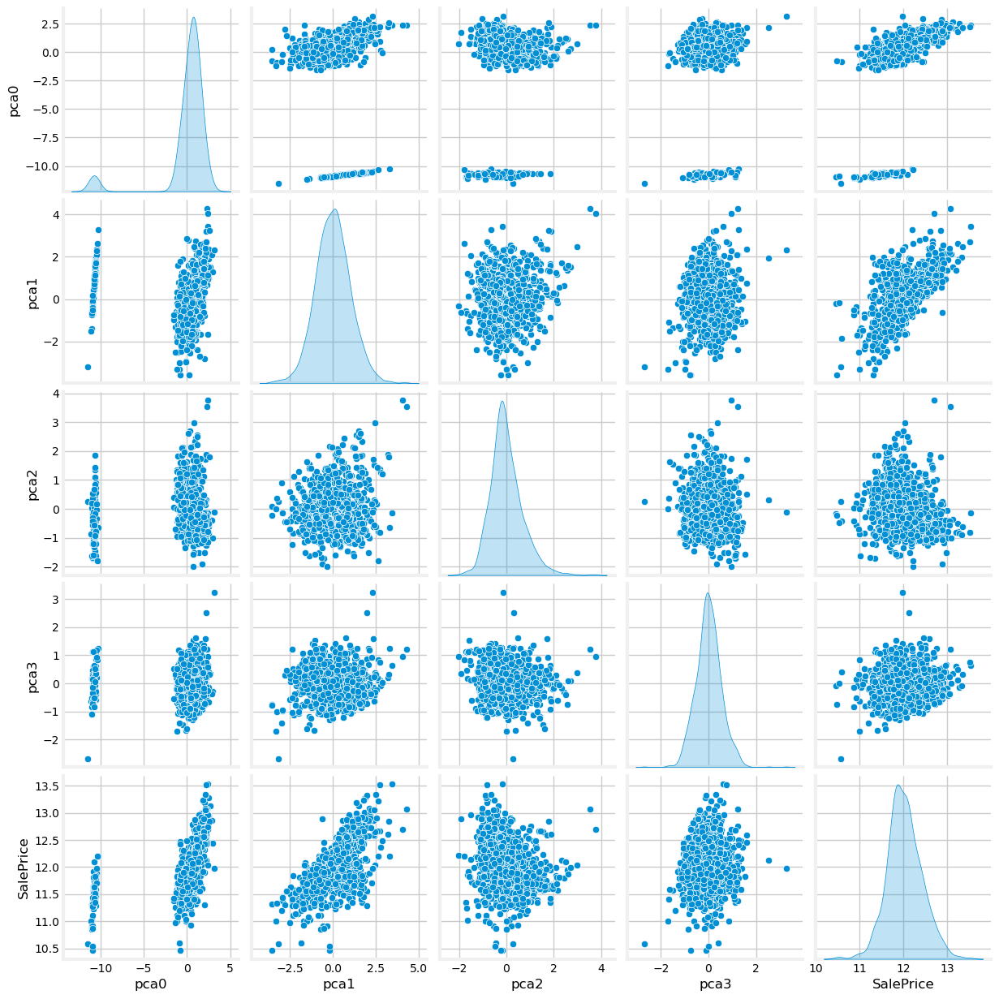

In [458]:
# sns.scatterplot(pd.concat([pca_X, y], axis=1), x='pca0', y='pca1')

sns.pairplot(pd.concat([pca_X, y], axis=1), diag_kind='kde')

In [459]:
del engineered_data, X, y, pca, mi_pca_amenable, X_slice, scaled_X, pca_X, fig, axs, n, grid, evr, cv

### New Features: Clusters

Let us see if K-Means clustering helps! We begin by engineering and encoding the data:

In [460]:
engineered_data = data_train.copy() # making copy

# applying the function
engineered_data = pd.concat([engineered_data, new_features(engineered_data)], axis=1)

# features & target
X = engineered_data.copy()
y = X.pop('SalePrice')
y = np.log1p(y)

# encoding

# target encoding
X, _ = add_target_encoded_features(X=X,
                                   y=y,
                                   cols=columns_encodings['target'],
                                   new_col_suffix="",
                                   n_splits=5,
                                   smoothing=20,
                                   random_state=42)

# ordinal encoding
for col in columns_encodings['ordinal']:

    if col not in X.columns:
        raise KeyError(f"{col} not in X.columns!")

    if X[col].dtype == 'int64':
        continue
    
    if col in ['BsmtFinType1', 'BsmtFinType2']:
        categories = [["NA", "Unf", "LwQ", "Rec", "BLQ", "ALQ", "GLQ"]]
    elif col == 'Functional':
        categories = [["Sal", "Sev", "Maj2", "Maj1", "Mod", "Min2", "Min1", "Typ"]]
    elif col == 'BsmtExposure':
        categories = [["NA", "No", "Mn", "Av", "Gd"]]
    elif col == 'GarageFinish':
        categories = [["NA", "Unf", "RFn", "Fin"]]
    else:
        categories = [["NA", "Po", "Fa", "TA", "Gd", "Ex"]]
    
    encoder = OrdinalEncoder(categories=categories)
    X[col] = encoder.fit_transform(X[[col]])

del col, categories, encoder


# One-Hot encoding
for col in columns_encodings['ohe']:

    if col not in X.columns:
        raise KeyError(f"{col} not in X.columns!")

    encoder = LabelEncoder()
    X[col] = encoder.fit_transform(X[col])

del col, encoder

# boolean encoding
for col in columns_encodings['bool']:

    if col not in X.columns:
        raise KeyError(f"{col} not in X.columns!")

    if 'Has' in col: # already boolean!
        continue

    encoder = LabelEncoder()
    X[col] = encoder.fit_transform(X[col])

del col, encoder


# Principal Component Analysis

# PCA object
pca = PCA()

# superset PCA-amenable features
cols_list = columns_encodings['cont'] + columns_encodings['disc'] + columns_encodings['target'] + columns_encodings['ordinal']
cols_list = list(set(X.columns.to_list()).intersection(set(cols_list)))

# selecting the MI score from the definitive ranking (after log-transformation!) of those PCA-amenable columns:
mi_pca_amenable = rankings['definitive_log'].loc[cols_list].sort_values(ascending=False)

del cols_list

# we only select the PCA-amenable columns:
trans_cols = mi_pca_amenable.index.to_list()
X_slice = X[trans_cols].copy()

# log1p transformation:
scaled_X = logify(X_slice, columns=columns_encodings['cont'])# np.log1p(X_slice)

del X_slice, trans_cols

# PCA features
pca_features = optimal_feats(scaled_X, mi_pca_amenable, 0.25, 0.51)

# print(pca_features)

# subset of X
scaled_X_slice = scaled_X[pca_features]

# PCA features
pca_X = pd.DataFrame(pca.fit_transform(scaled_X_slice), columns=['pca'+str(i) for i in range(len(pca_features))], index=scaled_X_slice.index)

loadings = pd.DataFrame(pca.components_.T, columns=pca_X.columns, index=scaled_X[pca_features].columns)

display(loadings)

del scaled_X_slice, loadings

,pca0,pca1,pca2,pca3
TotalSF,0.014910,0.056291,0.874652,-0.481241
Neighborhood,0.008991,0.045924,0.479143,0.876489
OverallQualCond,0.998992,-0.042527,-0.014380,-0.000159
GarageArea,0.041378,0.996451,-0.072107,-0.013216


In [461]:
columns_encodings.keys()

dict_keys(['cont', 'disc', 'ordinal', 'target', 'ohe', 'bool', 'others'])

We can then define the encoded, transformed (logified), rescaled, and PCA-ed dataframe:

In [462]:
# putting everything together!
new_X = X.copy()
for col in new_X.columns:
    if col in scaled_X.columns:
        new_X[col] = scaled_X[col]

new_X = pd.concat([new_X, pca_X], axis=1)

del col, pca_X, scaled_X

This is too unwieldly:

In [463]:
print(f"new_X's # of columns: {new_X.shape[1]}")

new_X's # of columns: 102


So what we do instead is to:

1. Select the most promising MI features
2. Keep the PCAs
3. Keep any "Has_X" features that are relevant, and
4. Drop those features that went into creating the PCAs

In [464]:
X_kmeans = new_X.copy()

# we must keep the PCA features themselves
feats_to_keep = [col for col in new_X.columns if 'pca' in col]

# the "Has_X" columns
search_has_here = [col for col in engineered_data.columns if ("Has" in col)]

# the "Has_X" columns we need to keep
has_matrix = [[col for col in search_has_here if col.removeprefix("Has_") in feat] for feat in pca_features]

has_to_keep = []
for hasx in has_matrix:
    has_to_keep += hasx
has_to_keep = list(set(has_to_keep))

del search_has_here, has_matrix
    
# add any "Has_X":
feats_to_keep += has_to_keep

# # keep only most promising features
mi_thr = 0.25

# display(rankings['definitive_log'][rankings['definitive_log'] > mi_thr])

# feats_to_keep += rankings['definitive_log'][rankings['definitive_log'] > mi_thr].index.to_list()

# # dropping all feats used for PCA
# feats_to_keep = [col for col in feats_to_keep if col not in pca_features]
print(feats_to_keep)

# # now, there is a minimum number of features we will keep
# min_feats = len(has_to_keep) + len(pca_features)

# # we want at most these extra features
# n_extra_feats = 3
# extra_feats = []

# i = 0

# for col in (rankings['definitive_log'][rankings['definitive_log'] > mi_thr].index.to_list()):
#     if col in pca_features:
#         continue
#     elif i < n_extra_feats:
#         extra_feats.append(col)
#         i += 1

# print(extra_feats)

X_kmeans = X_kmeans[feats_to_keep]

del mi_thr

['pca0', 'pca1', 'pca2', 'pca3', 'Has_Garage']


In [465]:
X_kmeans

,pca0,pca1,pca2,pca3,Has_Garage
0,1.157090,0.458839,0.054164,0.093899,1
1,14.136126,-0.270970,-0.154999,0.064787,1
2,1.162173,0.565180,0.093132,0.066973,1
3,1.163294,0.615346,0.021951,0.130531,1
4,6.176270,0.695767,0.333870,0.236010,1
...,...,...,...,...,...
1455,-3.845101,0.497118,0.139583,0.071300,1
1456,2.156976,0.342243,0.323222,-0.111723,1
1457,29.101374,-1.486646,-0.024444,-0.050804,1
1458,-3.877106,-0.171855,-0.104004,-0.061711,1


Now, we define the clustering model, and the new `cluster` feature:

In [466]:
kmeans = KMeans(n_clusters=4, n_init=10, random_state=0)

In [467]:
X_kmeans['cluster'] = kmeans.fit_predict(X_kmeans)

display(X_kmeans.head())
X_kmeans['cluster'].value_counts()

,pca0,pca1,pca2,pca3,Has_Garage,cluster
0,1.157090,0.458839,0.054164,0.093899,1,1
1,14.136126,-0.270970,-0.154999,0.064787,1,2
2,1.162173,0.565180,0.093132,0.066973,1,1
3,1.163294,0.615346,0.021951,0.130531,1,1
4,6.176270,0.695767,0.333870,0.236010,1,1


cluster
1    691
3    482
2    156
0    131
Name: count, dtype: int64

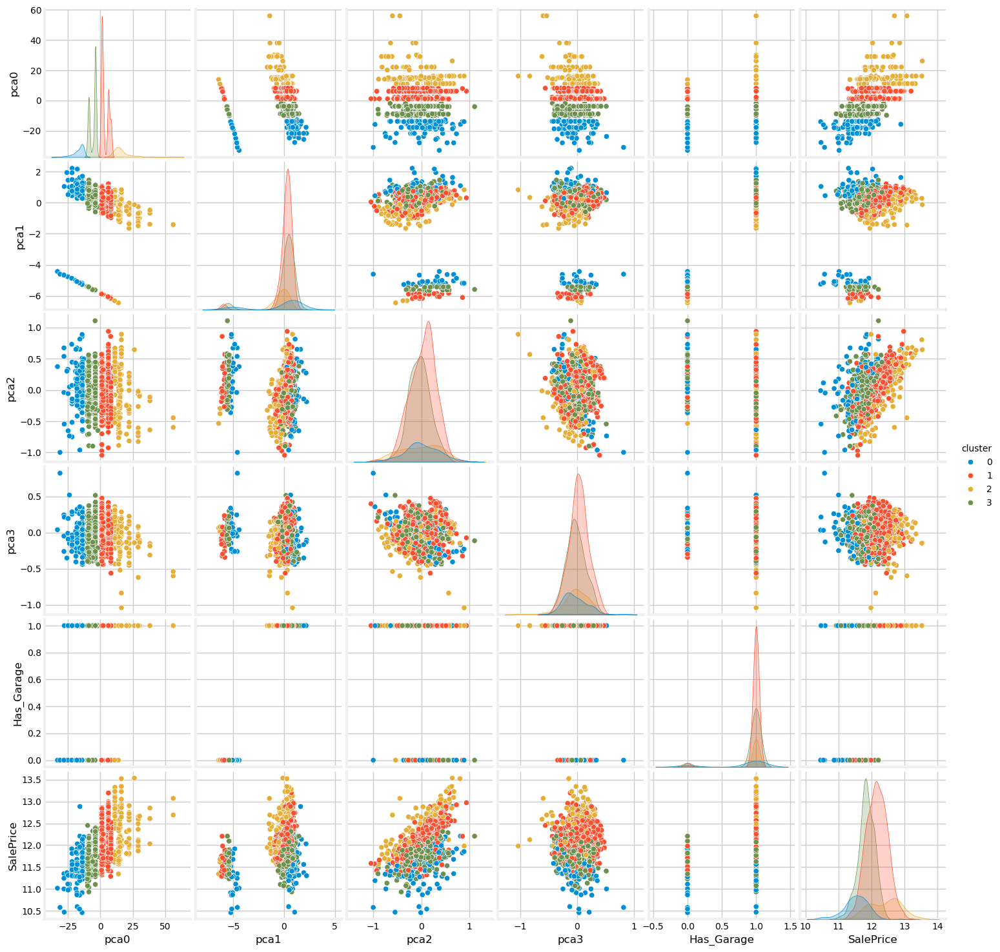

In [468]:
sns.pairplot(pd.concat([X_kmeans, y], axis=1), diag_kind='kde', hue='cluster', palette=palette_538)

Creating a boxplot for each cluster:

cluster counts:


cluster
1    691
3    482
2    156
0    131
Name: count, dtype: int64

<Axes: xlabel='cluster', ylabel='SalePrice'>

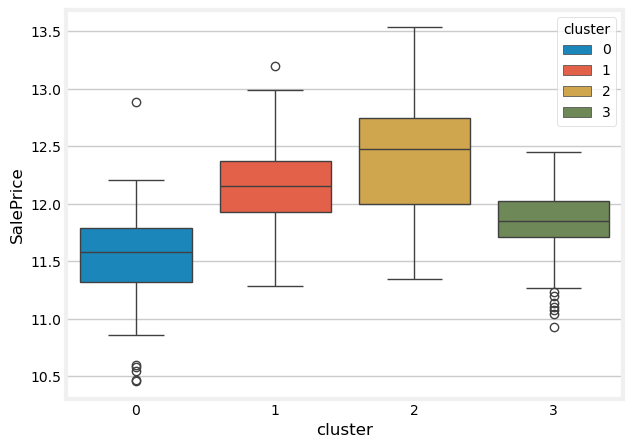

In [469]:
print("cluster counts:")
display(X_kmeans['cluster'].value_counts())
print("")

sns.boxplot(data=pd.concat([X_kmeans, y], axis=1), x='cluster', y='SalePrice', hue='cluster', palette=palette_538)

So this is one way to compute clusters. Really we should do this w/ or w/o the PCA features (hyperparameter!), and such.

In [470]:
del X, y, new_X, X_kmeans, kmeans, mi_pca_amenable, feats_to_keep, has_to_keep, pca

### Cleanup

In [471]:
Out.clear()

for name in dir():
    if name.startswith('_') and name[1:].isdigit():
        del globals()[name]

del name